# NASA Exoplanets

Un catálogo completo de exoplanetas descubiertos por misiones de la NASA.


El Archivo de Exoplanetas de la NASA es una base de datos que contiene información sobre todos los exoplanetas conocidos (planetas fuera de nuestro sistema solar) descubiertos por las diversas misiones espaciales de la NASA, observatorios terrestres y otras fuentes. El conjunto de datos incluye información como el nombre del planeta, su masa, radio, distancia a su estrella anfitriona, período orbital y otras características físicas. También incluye información sobre la estrella anfitriona, como su nombre, masa y radio. El archivo se actualiza periódicamente a medida que se descubren nuevos exoplanetas y es un recurso valioso para los astrónomos que estudian las propiedades y la distribución de los exoplanetas en nuestra galaxia.





In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score


In [ ]:
import kagglehub, os

# Descargar dataset
path = kagglehub.dataset_download("adityamishraml/nasaexoplanets")
df = pd.read_csv(os.path.join(path, "cleaned_5250.csv"))

print(df.shape)
print(df['planet_type'].value_counts())

# Verificar archivos disponibles
files = os.listdir(path)
print("Archivos disponibles:", files)

# Cargar el archivo correcto
file_path = os.path.join(path, "cleaned_5250.csv")
df = pd.read_csv(file_path)

# Mostrar información básica
print("Dimensiones:", df.shape)
print("Columnas:", df.columns)
print(df.head())


100%|██████████| 114k/114k [00:00<00:00, 27.5MB/s]

Extracting files...
(5250, 13)
planet_type
Neptune-like    1825
Gas Giant       1630
Super Earth     1595
Terrestrial      195
Unknown            5
Name: count, dtype: int64
Archivos disponibles: ['cleaned_5250.csv']
Dimensiones: (5250, 13)
Columnas: Index(['name', 'distance', 'stellar_magnitude', 'planet_type',
       'discovery_year', 'mass_multiplier', 'mass_wrt', 'radius_multiplier',
       'radius_wrt', 'orbital_radius', 'orbital_period', 'eccentricity',
       'detection_method'],
      dtype='object')
                   name  distance  stellar_magnitude planet_type  \
0  11 Comae Berenices b     304.0            4.72307   Gas Giant   
1    11 Ursae Minoris b     409.0            5.01300   Gas Giant   
2       14 Andromedae b     246.0            5.23133   Gas Giant   
3         14 Herculis b      58.0            6.61935   Gas Giant   
4          16 Cygni B b      69.0            6.21500   Gas Giant   

   discovery_year  mass_multiplier mass_wrt  radius_multiplier radius_wrt  \


In [ ]:
cat_cols = df.select_dtypes(include=['object']).columns.tolist()
num_cols = df.select_dtypes(exclude=['object']).columns.tolist()

print("Categóricas:", cat_cols)
print("Numéricas:", num_cols)


Categóricas: ['name', 'planet_type', 'mass_wrt', 'radius_wrt', 'detection_method']
Numéricas: ['distance', 'stellar_magnitude', 'discovery_year', 'mass_multiplier', 'radius_multiplier', 'orbital_radius', 'orbital_period', 'eccentricity']


In [ ]:
# Contar valores nulos por columna
print("Valores nulos por columna:")
print(df.isna().sum())

# Porcentaje de valores nulos
print("Porcentaje de nulos (%):")
print((df.isna().mean() * 100).round(2))


Valores nulos por columna:
name                   0
distance              17
stellar_magnitude    161
planet_type            0
discovery_year         0
mass_multiplier       23
mass_wrt              23
radius_multiplier     17
radius_wrt            17
orbital_radius       289
orbital_period         0
eccentricity           0
detection_method       0
dtype: int64
Porcentaje de nulos (%):
name                 0.00
distance             0.32
stellar_magnitude    3.07
planet_type          0.00
discovery_year       0.00
mass_multiplier      0.44
mass_wrt             0.44
radius_multiplier    0.32
radius_wrt           0.32
orbital_radius       5.50
orbital_period       0.00
eccentricity         0.00
detection_method     0.00
dtype: float64


In [ ]:
from sklearn.impute import SimpleImputer

# --- Copia de seguridad ---
df_clean = df.copy()

# Imputadores
imputer_num = SimpleImputer(strategy='median')
imputer_cat = SimpleImputer(strategy='most_frequent')

# Columnas numéricas y categóricas con NaN
num_cols_with_nan = ['distance', 'stellar_magnitude', 'mass_multiplier', 'radius_multiplier', 'orbital_radius']
cat_cols_with_nan = ['mass_wrt', 'radius_wrt']

# Aplicar imputación
df_clean[num_cols_with_nan] = imputer_num.fit_transform(df_clean[num_cols_with_nan])
df_clean[cat_cols_with_nan] = imputer_cat.fit_transform(df_clean[cat_cols_with_nan])

# Verificar
print("NaN después de limpieza:\n", df_clean.isna().sum().sum())


NaN después de limpieza:
 0


In [ ]:
print("Filas duplicadas:", df_clean.duplicated().sum())
if df_clean.duplicated().sum() > 0:
    df_clean = df_clean.drop_duplicates()


Filas duplicadas: 0


In [ ]:
# Número de filas duplicadas
print(" Filas duplicadas:", df.duplicated().sum())

# Mostrar algunas si existen
if df.duplicated().sum() > 0:
    print(df[df.duplicated()].head())


 Filas duplicadas: 0


In [ ]:
# Buscar posibles textos que representen valores vacíos
for col in df.columns:
    if df[col].dtype == 'object':
        uniques = df[col].unique()
        posibles_nulos = [x for x in uniques if str(x).lower() in ['nan', 'none', 'unknown', 'null', '']]
        if posibles_nulos:
            print(f" Posibles valores nulos tipo texto en '{col}': {posibles_nulos}")


 Posibles valores nulos tipo texto en 'planet_type': ['Unknown']
 Posibles valores nulos tipo texto en 'mass_wrt': [nan]
 Posibles valores nulos tipo texto en 'radius_wrt': [nan]


Columna objetivo: 'planet_type'
Clases encontradas: ['Gas Giant' 'Super Earth' 'Neptune-like' 'Terrestrial' 'Unknown']
Distribución: 
planet_type
Neptune-like    1825
Gas Giant       1630
Super Earth     1595
Terrestrial      195
Unknown            5
Name: count, dtype: int64

Generando histogramas por clase...


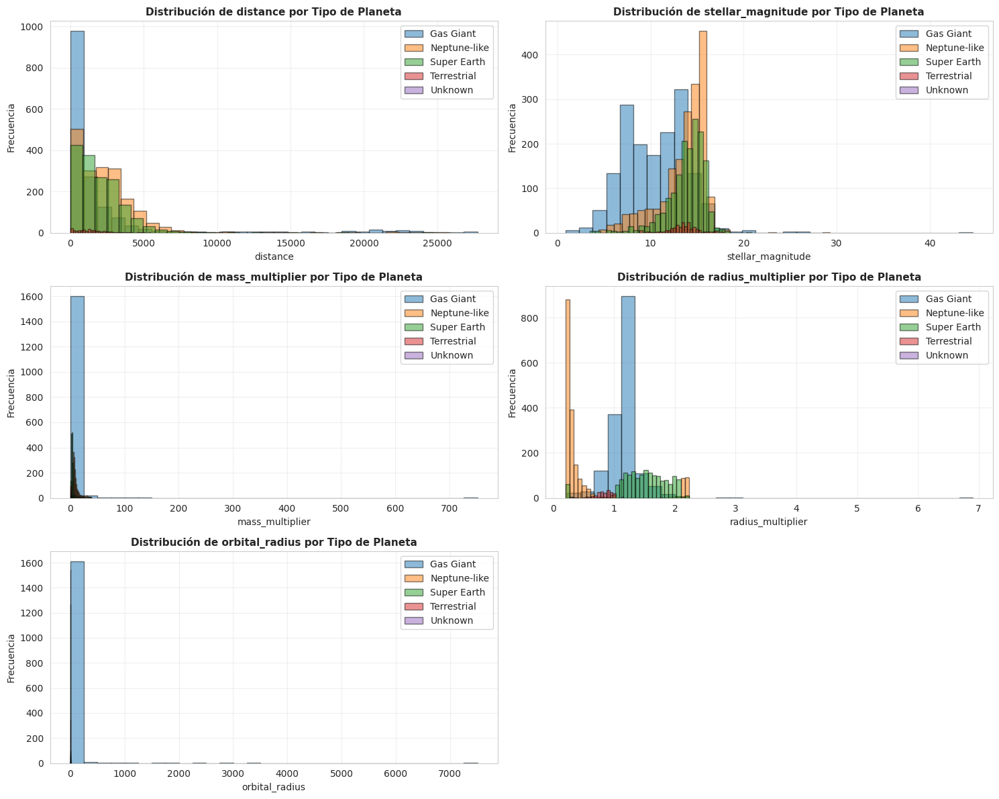


--- Estadísticas por tipo de planeta ---
             distance                                                    \
                count      mean       std    min    25%     50%     75%   
planet_type                                                               
Gas Giant      1630.0  2180.341  4727.683   10.0  181.0   596.0  1704.5   
Neptune-like   1825.0  2411.861  2720.188   11.0  706.0  2038.0  3272.0   
Super Earth    1595.0  1957.006  1709.978    4.0  771.5  1649.0  2784.5   
Terrestrial     195.0  1382.928  1056.493   12.0  577.5  1269.0  1939.5   
Unknown           5.0  3480.600  2706.297  516.0  516.0  5457.0  5457.0   

                      stellar_magnitude          ... radius_multiplier         \
                  max             count    mean  ...               75%    max   
planet_type                                      ...                            
Gas Giant     27727.0            1630.0  10.590  ...             1.240  6.900   
Neptune-like  25770.0            

<Figure size 1500x1000 with 0 Axes>

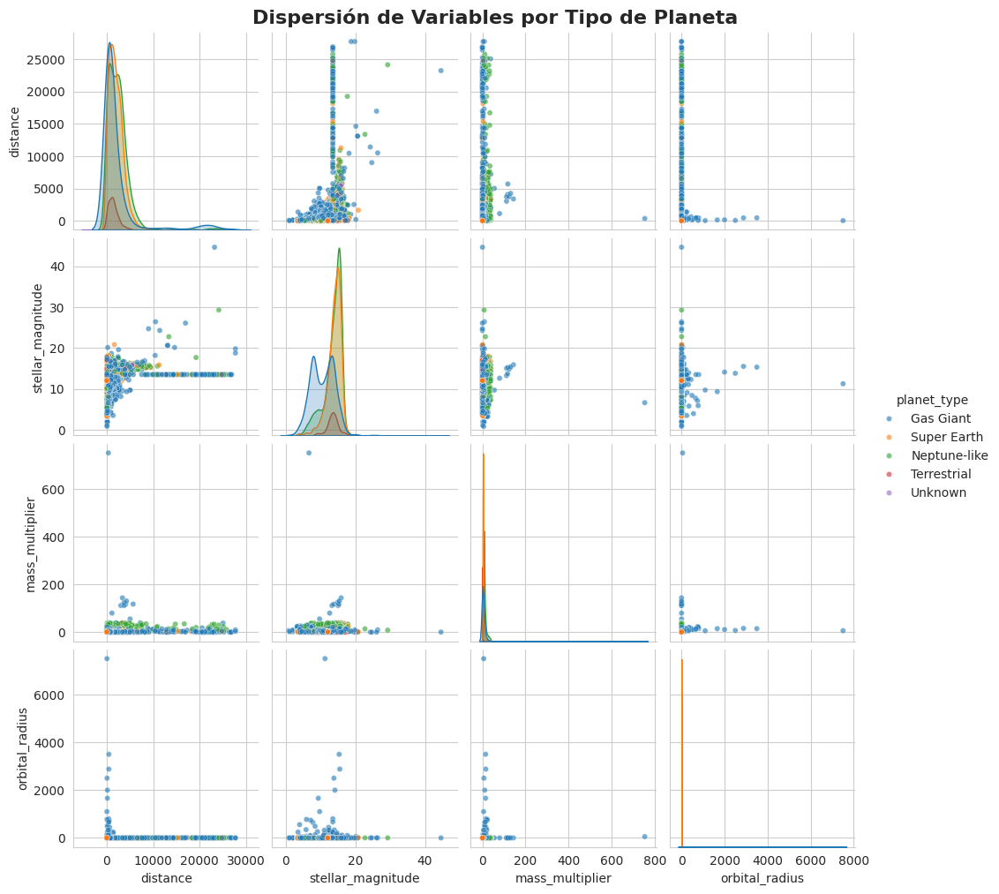


Generando boxplots...


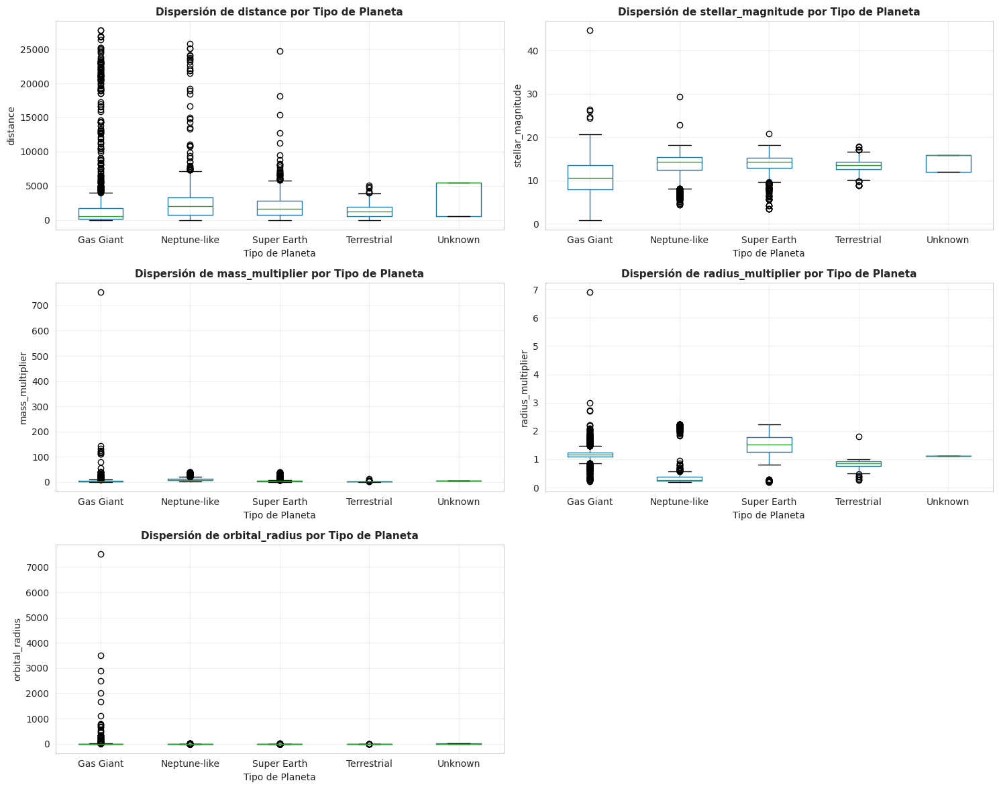


Generando matrices de correlación...


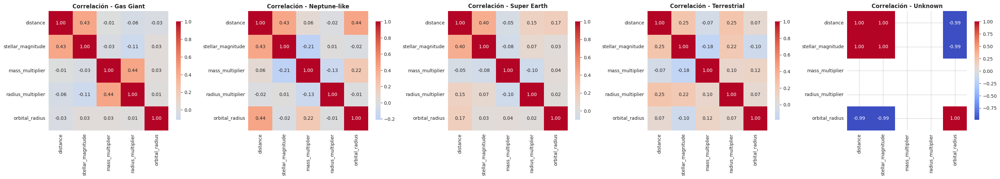

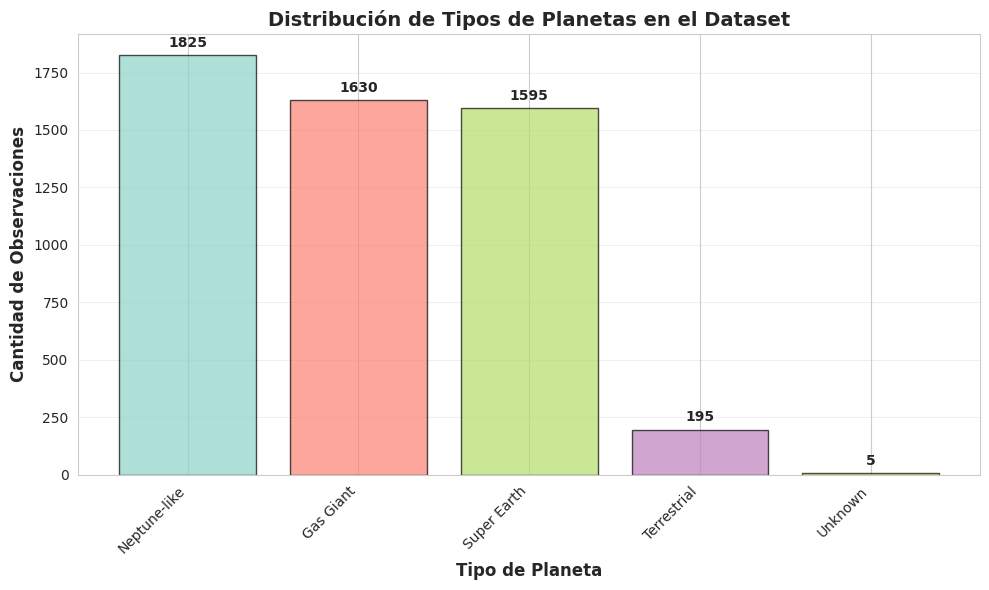


✓ Visualizaciones completadas y guardadas!

Resumen:
- Total de observaciones: 5250
- Tipos de planetas: 5
- Variables numéricas analizadas: 5


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# --- Configuración de estilo ---
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (15, 10)

target_col = 'planet_type'

print(f"Columna objetivo: '{target_col}'")
print(f"Clases encontradas: {df_clean[target_col].unique()}")
print(f"Distribución: \n{df_clean[target_col].value_counts()}\n")

# --- 1. HISTOGRAMAS POR CLASE ---
print("Generando histogramas por clase...")

# Columnas numéricas para graficar
numerical_features = ['distance', 'stellar_magnitude', 'mass_multiplier',
                      'radius_multiplier', 'orbital_radius']

# Crear subplots para histogramas
fig, axes = plt.subplots(3, 2, figsize=(15, 12))
axes = axes.ravel()

for idx, col in enumerate(numerical_features):
    ax = axes[idx]

    # Histograma por cada clase
    for class_name in sorted(df_clean[target_col].unique()):
        data = df_clean[df_clean[target_col] == class_name][col]
        ax.hist(data, alpha=0.5, label=f'{class_name}', bins=30, edgecolor='black')

    ax.set_xlabel(col, fontsize=10)
    ax.set_ylabel('Frecuencia', fontsize=10)
    ax.set_title(f'Distribución de {col} por Tipo de Planeta', fontsize=11, fontweight='bold')
    ax.legend()
    ax.grid(True, alpha=0.3)

# Remover el subplot extra
fig.delaxes(axes[-1])
plt.tight_layout()
plt.savefig('histogramas_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n--- Estadísticas por tipo de planeta ---")
print(df_clean.groupby(target_col)[numerical_features].describe().round(3))


# --- 2. GRÁFICOS DE DISPERSIÓN (PAIRPLOT) ---
print("\nGenerando gráficos de dispersión...")

# Seleccionar características para el pairplot
features_for_scatter = ['distance', 'stellar_magnitude', 'mass_multiplier',
                        'orbital_radius', target_col]

plt.figure()
pairplot = sns.pairplot(df_clean[features_for_scatter],
                        hue=target_col,
                        diag_kind='kde',
                        plot_kws={'alpha': 0.6, 's': 20},
                        height=2.5)

pairplot.fig.suptitle('Dispersión de Variables por Tipo de Planeta',
                      y=1.01, fontsize=16, fontweight='bold')
plt.savefig('dispersion_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()


# --- 3. BOXPLOTS POR CLASE ---
print("\nGenerando boxplots...")

fig, axes = plt.subplots(3, 2, figsize=(15, 12))
axes = axes.ravel()

for idx, col in enumerate(numerical_features):
    ax = axes[idx]
    df_clean.boxplot(column=col, by=target_col, ax=ax)
    ax.set_title(f'Dispersión de {col} por Tipo de Planeta',
                 fontsize=11, fontweight='bold')
    ax.set_xlabel('Tipo de Planeta', fontsize=10)
    ax.set_ylabel(col, fontsize=10)
    ax.grid(True, alpha=0.3)

fig.delaxes(axes[-1])
plt.suptitle('')  # Remover título automático
plt.tight_layout()
plt.savefig('boxplots_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()


# --- 4. MATRIZ DE CORRELACIÓN POR CLASE ---
print("\nGenerando matrices de correlación...")

classes = sorted(df_clean[target_col].unique())
n_classes = len(classes)

fig, axes = plt.subplots(1, n_classes, figsize=(6*n_classes, 5))
if n_classes == 1:
    axes = [axes]

for idx, class_name in enumerate(classes):
    data_class = df_clean[df_clean[target_col] == class_name][numerical_features]
    corr_matrix = data_class.corr()

    sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm',
                center=0, ax=axes[idx], square=True, cbar_kws={'shrink': 0.8})
    axes[idx].set_title(f'Correlación - {class_name}', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('correlacion_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()


# --- 5. DISTRIBUCIÓN DE CLASES ---
plt.figure(figsize=(10, 6))
class_counts = df_clean[target_col].value_counts()
colors = plt.cm.Set3(np.linspace(0, 1, len(class_counts)))

plt.bar(class_counts.index, class_counts.values, color=colors,
        edgecolor='black', alpha=0.7)
plt.xlabel('Tipo de Planeta', fontsize=12, fontweight='bold')
plt.ylabel('Cantidad de Observaciones', fontsize=12, fontweight='bold')
plt.title('Distribución de Tipos de Planetas en el Dataset',
          fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3, axis='y')
plt.xticks(rotation=45, ha='right')

# Añadir valores encima de las barras
for i, (idx, v) in enumerate(class_counts.items()):
    plt.text(i, v + max(class_counts.values)*0.02,
             str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig('distribucion_clases.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Visualizaciones completadas y guardadas!")
print(f"\nResumen:")
print(f"- Total de observaciones: {len(df_clean)}")
print(f"- Tipos de planetas: {len(class_counts)}")
print(f"- Variables numéricas analizadas: {len(numerical_features)}")

ANÁLISIS DE BALANCE DE CLASES

 Distribución de clases:
Tipo de Planeta  Cantidad  Porcentaje
   Neptune-like      1825   34.761905
      Gas Giant      1630   31.047619
    Super Earth      1595   30.380952
    Terrestrial       195    3.714286
        Unknown         5    0.095238

Total de observaciones: 5250

MÉTRICAS DE BALANCE

 Clase mayoritaria: Neptune-like (1825 muestras, 34.76%)
 Clase minoritaria: Unknown (5 muestras, 0.10%)
  Ratio de desbalance: 365.00:1

 INTERPRETACIÓN:
 Las clases están FUERTEMENTE DESBALANCEADAS
   → Requiere técnicas avanzadas de balanceo o métricas específicas


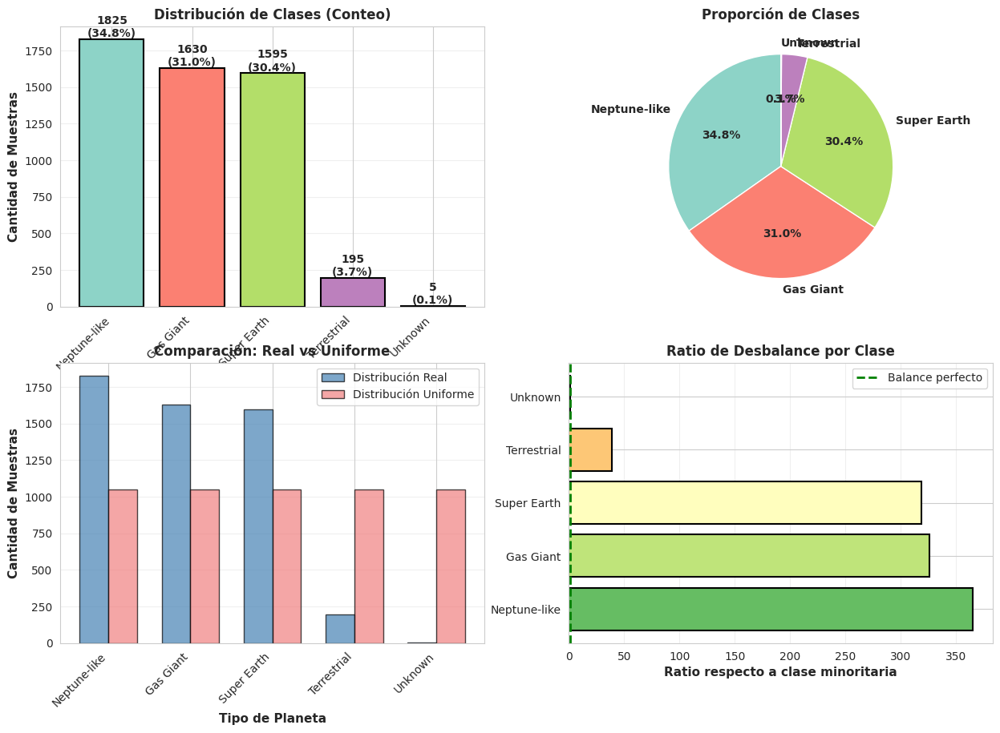

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. CONTEO Y PORCENTAJES ---
print("=" * 60)
print("ANÁLISIS DE BALANCE DE CLASES")
print("=" * 60)

class_counts = df_clean['planet_type'].value_counts()
class_percentages = df_clean['planet_type'].value_counts(normalize=True) * 100

balance_df = pd.DataFrame({
    'Tipo de Planeta': class_counts.index,
    'Cantidad': class_counts.values,
    'Porcentaje': class_percentages.values
})

print("\n Distribución de clases:")
print(balance_df.to_string(index=False))
print(f"\nTotal de observaciones: {len(df_clean)}")

# --- 2. ANÁLISIS DE DESBALANCE ---
print("\n" + "=" * 60)
print("MÉTRICAS DE BALANCE")
print("=" * 60)

# Calcular ratio de desbalance
max_class = class_counts.max()
min_class = class_counts.min()
imbalance_ratio = max_class / min_class

print(f"\n Clase mayoritaria: {class_counts.idxmax()} ({max_class} muestras, {class_percentages.max():.2f}%)")
print(f" Clase minoritaria: {class_counts.idxmin()} ({min_class} muestras, {class_percentages.min():.2f}%)")
print(f"  Ratio de desbalance: {imbalance_ratio:.2f}:1")

# Interpretación del balance
print("\n INTERPRETACIÓN:")
if imbalance_ratio < 1.5:
    print(" Las clases están BIEN BALANCEADAS")
    print("   → No se requieren técnicas de balanceo")
elif imbalance_ratio < 3:
    print("  Las clases tienen un DESBALANCE MODERADO")
    print("   → Considera usar pesos de clase o SMOTE")
elif imbalance_ratio < 10:
    print("  Las clases tienen un DESBALANCE SIGNIFICATIVO")
    print("   → Recomendado usar SMOTE, ADASYN o pesos de clase")
else:
    print(" Las clases están FUERTEMENTE DESBALANCEADAS")
    print("   → Requiere técnicas avanzadas de balanceo o métricas específicas")

# --- 3. VISUALIZACIÓN DETALLADA ---
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# 3.1 Gráfico de barras con valores
ax1 = axes[0, 0]
bars = ax1.bar(range(len(class_counts)), class_counts.values,
               color=plt.cm.Set3(np.linspace(0, 1, len(class_counts))),
               edgecolor='black', linewidth=1.5)
ax1.set_xticks(range(len(class_counts)))
ax1.set_xticklabels(class_counts.index, rotation=45, ha='right')
ax1.set_ylabel('Cantidad de Muestras', fontsize=11, fontweight='bold')
ax1.set_title('Distribución de Clases (Conteo)', fontsize=12, fontweight='bold')
ax1.grid(True, alpha=0.3, axis='y')

# Añadir valores sobre las barras
for i, (bar, count) in enumerate(zip(bars, class_counts.values)):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(count)}\n({class_percentages.values[i]:.1f}%)',
             ha='center', va='bottom', fontweight='bold')

# 3.2 Gráfico de pastel
ax2 = axes[0, 1]
colors = plt.cm.Set3(np.linspace(0, 1, len(class_counts)))
wedges, texts, autotexts = ax2.pie(class_counts.values,
                                     labels=class_counts.index,
                                     autopct='%1.1f%%',
                                     colors=colors,
                                     startangle=90,
                                     textprops={'fontsize': 10, 'fontweight': 'bold'})
ax2.set_title('Proporción de Clases', fontsize=12, fontweight='bold')

# 3.3 Comparación con distribución uniforme
ax3 = axes[1, 0]
uniform_dist = [len(df_clean) / len(class_counts)] * len(class_counts)
x = np.arange(len(class_counts))
width = 0.35

bars1 = ax3.bar(x - width/2, class_counts.values, width,
                label='Distribución Real', color='steelblue',
                edgecolor='black', alpha=0.7)
bars2 = ax3.bar(x + width/2, uniform_dist, width,
                label='Distribución Uniforme', color='lightcoral',
                edgecolor='black', alpha=0.7)

ax3.set_xlabel('Tipo de Planeta', fontsize=11, fontweight='bold')
ax3.set_ylabel('Cantidad de Muestras', fontsize=11, fontweight='bold')
ax3.set_title('Comparación: Real vs Uniforme', fontsize=12, fontweight='bold')
ax3.set_xticks(x)
ax3.set_xticklabels(class_counts.index, rotation=45, ha='right')
ax3.legend()
ax3.grid(True, alpha=0.3, axis='y')

# 3.4 Ratio de desbalance visual
ax4 = axes[1, 1]
ratios = [class_counts[cls] / min_class for cls in class_counts.index]
bars = ax4.barh(range(len(ratios)), ratios,
                color=plt.cm.RdYlGn_r(np.linspace(0.2, 0.8, len(ratios))),
                edgecolor='black', linewidth=1.5)
ax4.set_yticks(range(len(class_counts)))
ax4.set_yticklabels(class_counts.index)
ax4.set_xlabel('Ratio respecto a clase minoritaria', fontsize=11, fontweight='bold')
ax4.set_title('Ratio de Desbalance por Clase', fontsize=12, fontweight='bold')
ax4.axvline(x=1, color='green', linestyle='--', linewidth=2, label='Balance perfecto')
ax4.grid(True, alpha=0.3, axis='x')
ax4.legend()

## OUTLINERS

Columna objetivo: 'planet_type'
Clases encontradas: ['Gas Giant' 'Super Earth' 'Neptune-like' 'Terrestrial' 'Unknown']
Distribución: 
planet_type
Neptune-like    1825
Gas Giant       1630
Super Earth     1595
Terrestrial      195
Unknown            5
Name: count, dtype: int64

ANÁLISIS DE OUTLIERS POR CLASE

--- Gas Giant ---
  distance             | IQR:  164 ( 10.1%) | Z-score:   73 (  4.5%)
  stellar_magnitude    | IQR:    5 (  0.3%) | Z-score:    5 (  0.3%)
  mass_multiplier      | IQR:  186 ( 11.4%) | Z-score:    9 (  0.6%)
  radius_multiplier    | IQR:  273 ( 16.7%) | Z-score:   25 (  1.5%)
  orbital_radius       | IQR:  167 ( 10.2%) | Z-score:    9 (  0.6%)

--- Neptune-like ---
  distance             | IQR:   43 (  2.4%) | Z-score:   27 (  1.5%)
  stellar_magnitude    | IQR:  110 (  6.0%) | Z-score:   20 (  1.1%)
  mass_multiplier      | IQR:  177 (  9.7%) | Z-score:   52 (  2.8%)
  radius_multiplier    | IQR:  236 ( 12.9%) | Z-score:    0 (  0.0%)
  orbital_radius       | IQR:

/tmp/ipython-input-3157187612.py:34: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  z_scores = np.abs(stats.zscore(data.dropna()))
/tmp/ipython-input-3157187612.py:34: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  z_scores = np.abs(stats.zscore(data.dropna()))


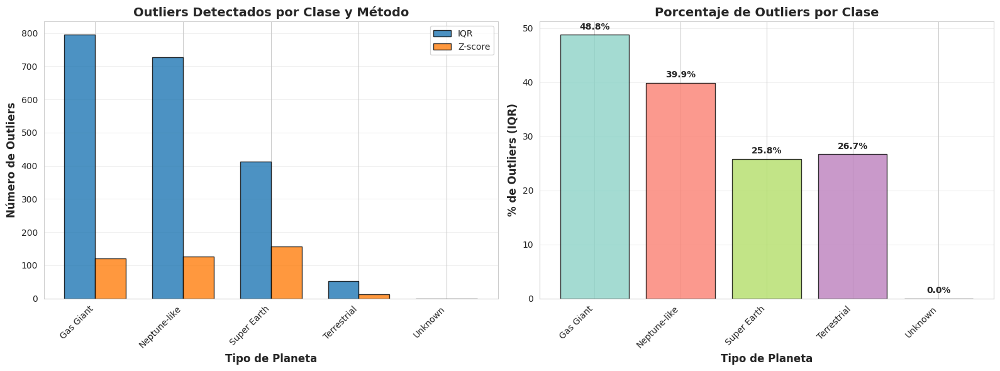

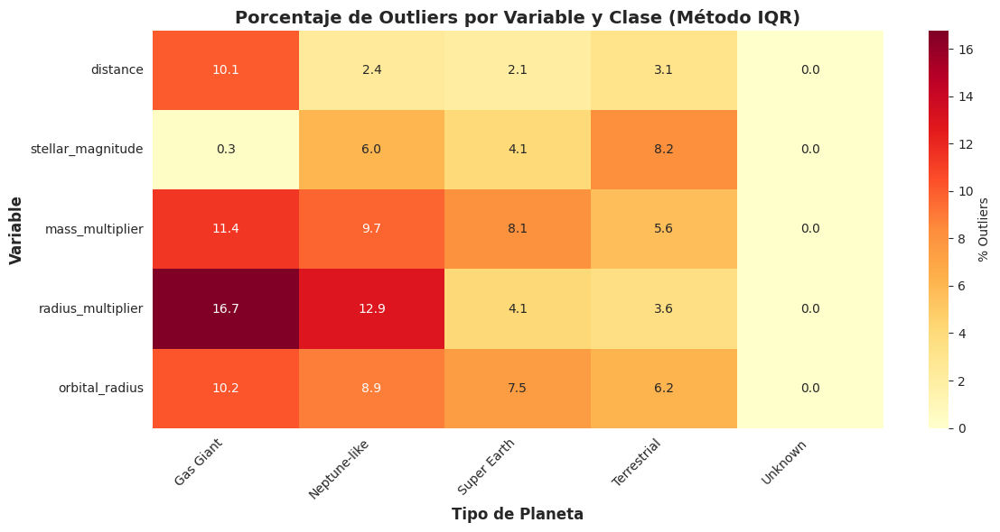


✓ Análisis de outliers completado!


In [ ]:
import seaborn as sns
import numpy as np
from scipy import stats

# --- Configuración de estilo ---
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (15, 10)

target_col = 'planet_type'

print(f"Columna objetivo: '{target_col}'")
print(f"Clases encontradas: {df_clean[target_col].unique()}")
print(f"Distribución: \n{df_clean[target_col].value_counts()}\n")

# --- DETECCIÓN Y CONTEO DE OUTLIERS POR CLASE ---
print("="*80)
print("ANÁLISIS DE OUTLIERS POR CLASE")
print("="*80)

numerical_features = ['distance', 'stellar_magnitude', 'mass_multiplier',
                      'radius_multiplier', 'orbital_radius']

def detect_outliers_iqr(data, factor=1.5):
    """Detecta outliers usando el método IQR"""
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - factor * IQR
    upper_bound = Q3 + factor * IQR
    return (data < lower_bound) | (data > upper_bound)

def detect_outliers_zscore(data, threshold=3):
    """Detecta outliers usando Z-score"""
    z_scores = np.abs(stats.zscore(data.dropna()))
    return z_scores > threshold

# Diccionarios para almacenar resultados
outliers_by_class = {}
outliers_by_feature = {}

for class_name in sorted(df_clean[target_col].unique()):
    print(f"\n--- {class_name} ---")
    class_data = df_clean[df_clean[target_col] == class_name]
    total_samples = len(class_data)

    outliers_count = {}

    for feature in numerical_features:
        # Método IQR
        outliers_iqr = detect_outliers_iqr(class_data[feature])
        n_outliers_iqr = outliers_iqr.sum()

        # Método Z-score
        outliers_z = detect_outliers_zscore(class_data[feature])
        n_outliers_z = outliers_z.sum()

        outliers_count[feature] = {
            'IQR': n_outliers_iqr,
            'Z-score': n_outliers_z,
            'total': total_samples
        }

        print(f"  {feature:20s} | IQR: {n_outliers_iqr:4d} ({n_outliers_iqr/total_samples*100:5.1f}%) | "
              f"Z-score: {n_outliers_z:4d} ({n_outliers_z/total_samples*100:5.1f}%)")

    outliers_by_class[class_name] = outliers_count

# Resumen global por feature
print("\n" + "="*80)
print("RESUMEN DE OUTLIERS POR VARIABLE (TOTAL)")
print("="*80)

for feature in numerical_features:
    outliers_iqr_total = detect_outliers_iqr(df_clean[feature]).sum()
    outliers_z_total = detect_outliers_zscore(df_clean[feature]).sum()
    total = len(df_clean)

    print(f"{feature:20s} | IQR: {outliers_iqr_total:4d} ({outliers_iqr_total/total*100:5.1f}%) | "
          f"Z-score: {outliers_z_total:4d} ({outliers_z_total/total*100:5.1f}%)")

# --- VISUALIZACIÓN DE OUTLIERS ---
print("\n" + "="*80)
print("GENERANDO VISUALIZACIONES DE OUTLIERS")
print("="*80)

# 1. Gráfico de barras: Outliers por clase y método
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

classes = sorted(df_clean[target_col].unique())
x_pos = np.arange(len(classes))
width = 0.35

# Contar outliers totales por clase (método IQR)
outliers_iqr_by_class = []
outliers_z_by_class = []

for class_name in classes:
    total_iqr = sum(outliers_by_class[class_name][feat]['IQR']
                    for feat in numerical_features)
    total_z = sum(outliers_by_class[class_name][feat]['Z-score']
                  for feat in numerical_features)
    outliers_iqr_by_class.append(total_iqr)
    outliers_z_by_class.append(total_z)

# Subplot 1: Comparación de métodos
axes[0].bar(x_pos - width/2, outliers_iqr_by_class, width,
           label='IQR', alpha=0.8, edgecolor='black')
axes[0].bar(x_pos + width/2, outliers_z_by_class, width,
           label='Z-score', alpha=0.8, edgecolor='black')
axes[0].set_xlabel('Tipo de Planeta', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Número de Outliers', fontsize=12, fontweight='bold')
axes[0].set_title('Outliers Detectados por Clase y Método',
                  fontsize=14, fontweight='bold')
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(classes, rotation=45, ha='right')
axes[0].legend()
axes[0].grid(True, alpha=0.3, axis='y')

# Subplot 2: Porcentaje de outliers por clase
samples_by_class = [len(df_clean[df_clean[target_col] == c]) for c in classes]
pct_outliers = [(outliers_iqr_by_class[i] / samples_by_class[i] * 100)
                for i in range(len(classes))]

colors = plt.cm.Set3(np.linspace(0, 1, len(classes)))
axes[1].bar(x_pos, pct_outliers, color=colors, alpha=0.8, edgecolor='black')
axes[1].set_xlabel('Tipo de Planeta', fontsize=12, fontweight='bold')
axes[1].set_ylabel('% de Outliers (IQR)', fontsize=12, fontweight='bold')
axes[1].set_title('Porcentaje de Outliers por Clase',
                  fontsize=14, fontweight='bold')
axes[1].set_xticks(x_pos)
axes[1].set_xticklabels(classes, rotation=45, ha='right')
axes[1].grid(True, alpha=0.3, axis='y')

# Añadir valores encima de las barras
for i, v in enumerate(pct_outliers):
    axes[1].text(i, v + max(pct_outliers)*0.02, f'{v:.1f}%',
                ha='center', fontweight='bold')

plt.tight_layout()
plt.savefig('outliers_por_clase.png', dpi=300, bbox_inches='tight')
plt.show()

# 2. Heatmap de outliers por feature y clase
outlier_matrix = np.zeros((len(numerical_features), len(classes)))

for i, feature in enumerate(numerical_features):
    for j, class_name in enumerate(classes):
        total_samples = outliers_by_class[class_name][feature]['total']
        n_outliers = outliers_by_class[class_name][feature]['IQR']
        outlier_matrix[i, j] = (n_outliers / total_samples * 100)

plt.figure(figsize=(12, 6))
sns.heatmap(outlier_matrix, annot=True, fmt='.1f', cmap='YlOrRd',
            xticklabels=classes, yticklabels=numerical_features,
            cbar_kws={'label': '% Outliers'})
plt.title('Porcentaje de Outliers por Variable y Clase (Método IQR)',
          fontsize=14, fontweight='bold')
plt.xlabel('Tipo de Planeta', fontsize=12, fontweight='bold')
plt.ylabel('Variable', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('heatmap_outliers.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Análisis de outliers completado!")

In [ ]:
import numpy as np
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import train_test_split

print("="*80)
print("LIMPIEZA DE DATOS - ENFOQUE HÍBRIDO")
print("="*80)

# --- PASO 1: Eliminar clase "Unknown" (solo 5 muestras, no es útil) ---
print("\nPASO 1: Eliminando clase 'Unknown'...")
df_temp = df_clean[df_clean['planet_type'] != 'Unknown'].copy()
print(f"Registros eliminados: {len(df_clean) - len(df_temp)}")
print(f"Registros restantes: {len(df_temp)}")

# --- PASO 2: Eliminar outliers EXTREMOS con IQR (factor conservador) ---
print("\nPASO 2: Eliminando outliers extremos con IQR (factor=3.0)...")

numerical_features = ['distance', 'stellar_magnitude', 'mass_multiplier',
                      'radius_multiplier', 'orbital_radius']

def remove_outliers_iqr_conservative(df, columns, factor=3.0):
    """Factor 3.0 = solo outliers MUY extremos"""
    df_clean = df.copy()
    total_removed = 0

    for col in columns:
        initial_count = len(df_clean)

        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - factor * IQR
        upper_bound = Q3 + factor * IQR

        df_clean = df_clean[(df_clean[col] >= lower_bound) &
                           (df_clean[col] <= upper_bound)]

        removed = initial_count - len(df_clean)
        total_removed += removed

        if removed > 0:
            print(f"  {col:20s}: {removed:4d} outliers extremos eliminados")

    print(f"\nTotal outliers extremos: {total_removed}")
    return df_clean

df_temp = remove_outliers_iqr_conservative(df_temp, numerical_features, factor=3.0)

# --- PASO 3: Separar X e y (SOLO COLUMNAS NUMÉRICAS) ---
print("\nPASO 3: Preparando datos...")

# Identificar todas las columnas a excluir
columns_to_exclude = ['planet_type', 'name']

# Verificar si existen otras columnas no numéricas
print(f"\nColumnas en df_temp: {df_temp.columns.tolist()}")
print(f"\nTipos de datos:")
print(df_temp.dtypes)

# Separar solo columnas numéricas
X = df_temp[numerical_features].copy()
y = df_temp['planet_type'].copy()

print(f"\nForma de X: {X.shape}")
print(f"Columnas en X: {X.columns.tolist()}")
print(f"\nVerificando tipos de datos en X:")
print(X.dtypes)

# Verificar que no haya valores no numéricos
print(f"\nVerificando valores no numéricos...")
for col in X.columns:
    non_numeric = X[col].apply(lambda x: not isinstance(x, (int, float, np.number)))
    if non_numeric.any():
        print(f"  ⚠️ {col} tiene {non_numeric.sum()} valores no numéricos")
    else:
        print(f"  ✓ {col} - OK")

# --- PASO 4: Isolation Forest (mejor para clustering multidimensional) ---
print("\nPASO 4: Aplicando Isolation Forest...")

iso_forest = IsolationForest(
    contamination=0.05,  # 5% de outliers esperados
    random_state=42,
    n_jobs=-1
)

outlier_labels = iso_forest.fit_predict(X)

# Análisis detallado por clase
print("\nOutliers detectados por clase:")
print(f"{'Clase':<15} {'Outliers':>10} {'Total':>10} {'%':>8}")
print("-" * 50)

for class_name in sorted(y.unique()):
    class_mask = y == class_name
    class_outliers = (outlier_labels[class_mask] == -1).sum()
    class_total = class_mask.sum()
    pct = class_outliers / class_total * 100
    print(f"{class_name:<15} {class_outliers:>10} {class_total:>10} {pct:>7.1f}%")

# Filtrar outliers
mask = outlier_labels == 1
X_clean = X[mask]
y_clean = y[mask]

print(f"\n{'='*80}")
print("RESUMEN FINAL DE LIMPIEZA")
print(f"{'='*80}")
print(f"Datos originales:               {len(df_clean):>6}")
print(f"Después eliminar 'Unknown':     {len(df_temp):>6} (-{len(df_clean)-len(df_temp)})")
print(f"Después IQR (factor=3.0):       {len(df_temp):>6}")
print(f"Después Isolation Forest:       {len(X_clean):>6} (-{len(X)-len(X_clean)})")
print(f"{'='*80}")
print(f"Total eliminado:                {len(df_clean)-len(X_clean):>6} ({(len(df_clean)-len(X_clean))/len(df_clean)*100:.1f}%)")
print(f"Datos finales:                  {len(X_clean):>6} ({len(X_clean)/len(df_clean)*100:.1f}%)")

# Verificar distribución de clases final
print(f"\n{'='*80}")
print("DISTRIBUCIÓN FINAL DE CLASES")
print(f"{'='*80}")
print(y_clean.value_counts().sort_index())

# --- PASO 5: Dividir en train/val/test ---
print(f"\n{'='*80}")
print("DIVISIÓN EN CONJUNTOS")
print(f"{'='*80}")

X_train, X_temp, y_train, y_temp = train_test_split(
    X_clean, y_clean,
    test_size=0.30,
    random_state=8,
    stratify=y_clean
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    random_state=8,
    stratify=y_temp
)

print(f"Entrenamiento (70%):  {X_train.shape[0]:>6} muestras")
print(f"Validación   (15%):   {X_val.shape[0]:>6} muestras")
print(f"Prueba       (15%):   {X_test.shape[0]:>6} muestras")

# Verificar balance en cada conjunto
print(f"\n{'='*80}")
print("BALANCE DE CLASES EN CADA CONJUNTO")
print(f"{'='*80}")

print("\nEntrenamiento:")
print(y_train.value_counts().sort_index())

print("\nValidación:")
print(y_val.value_counts().sort_index())

print("\nPrueba:")
print(y_test.value_counts().sort_index())

print(f"\n{'='*80}")
print("✓ LIMPIEZA COMPLETADA CON ÉXITO")
print(f"{'='*80}")

LIMPIEZA DE DATOS - ENFOQUE HÍBRIDO

PASO 1: Eliminando clase 'Unknown'...
Registros eliminados: 5
Registros restantes: 5245

PASO 2: Eliminando outliers extremos con IQR (factor=3.0)...
  distance            :  133 outliers extremos eliminados
  mass_multiplier     :  130 outliers extremos eliminados
  orbital_radius      :  679 outliers extremos eliminados

Total outliers extremos: 942

PASO 3: Preparando datos...

Columnas en df_temp: ['name', 'distance', 'stellar_magnitude', 'planet_type', 'discovery_year', 'mass_multiplier', 'mass_wrt', 'radius_multiplier', 'radius_wrt', 'orbital_radius', 'orbital_period', 'eccentricity', 'detection_method']

Tipos de datos:
name                  object
distance             float64
stellar_magnitude    float64
planet_type           object
discovery_year         int64
mass_multiplier      float64
mass_wrt              object
radius_multiplier    float64
radius_wrt            object
orbital_radius       float64
orbital_period       float64
eccentric

# K - MEANS

                    K-MEANS CLUSTERING - ANÁLISIS DE PLANETAS
                         (Modelo Base - Datos Limpios Sin Outliers)

  NOTA IMPORTANTE:
   K-Means es un algoritmo de CLUSTERING (aprendizaje NO supervisado)
   • No usa las etiquetas durante el entrenamiento
   • Agrupa datos por similitud en características
   • Útil para descubrir patrones naturales en los datos
   • Se evaluará qué tan bien los clusters coinciden con las clases reales

                              1. VERIFICANDO DATOS
 ✓ Datos disponibles:
   • X_train shape: (2860, 5)
   • X_val shape:   (613, 5)
   • X_test shape:  (614, 5)
   • Features usadas: 5 (distance, stellar_magnitude, mass_multiplier, radius_multiplier, orbital_radius)

 ✓ Codificando etiquetas de texto a números...
   • Clases originales: ['Gas Giant', 'Neptune-like', 'Super Earth', 'Terrestrial']
   • Códigos numéricos: [0, 1, 2, 3]

 ✓ Información de las clases reales (después de limpieza):
   • Número de clases: 4
   • Distribución en ent

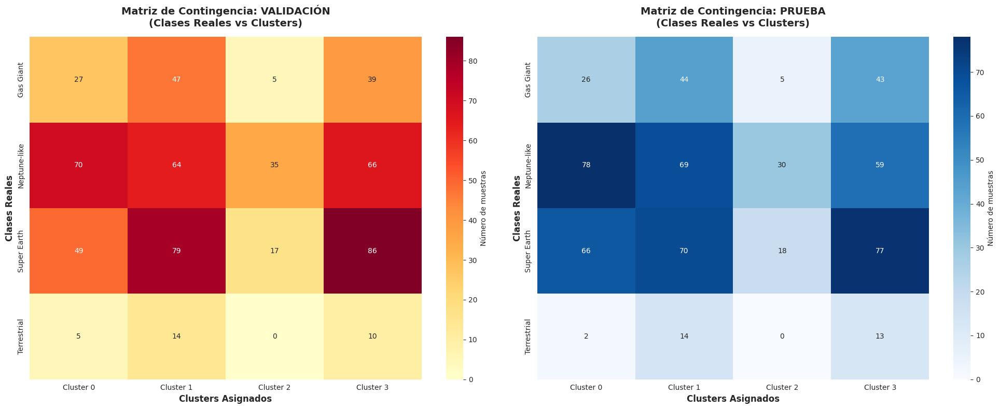

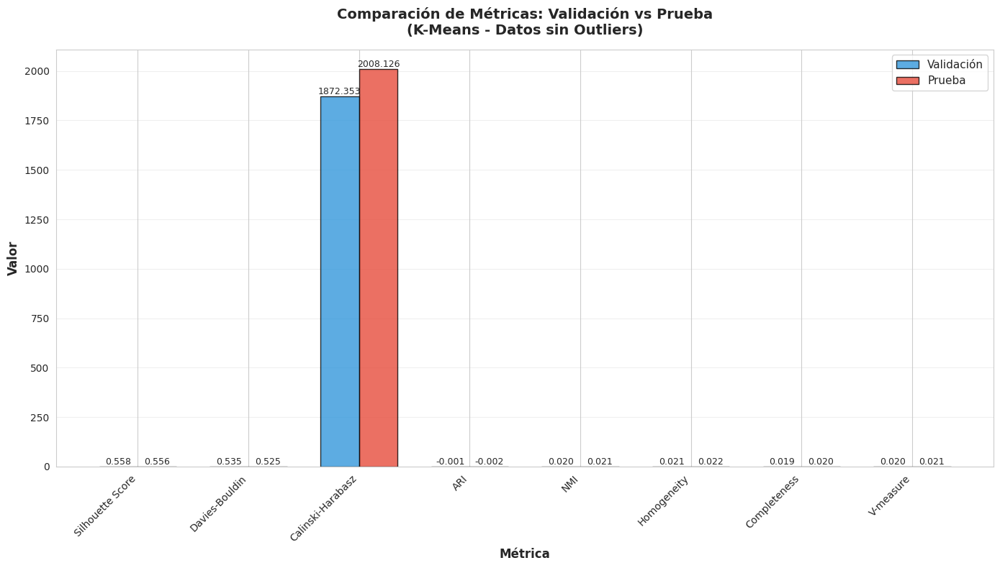

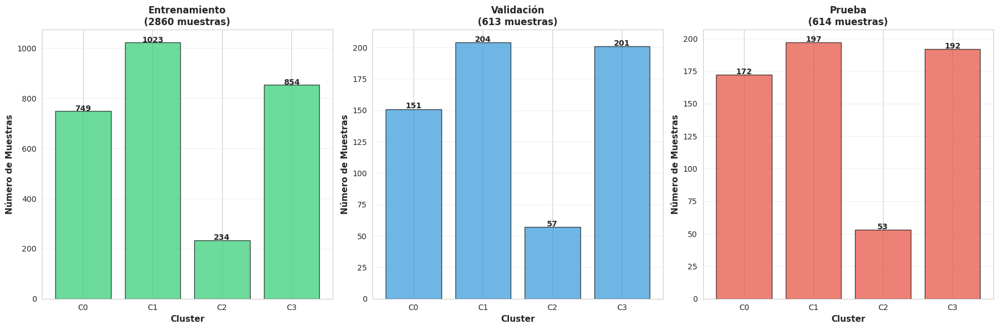


 ✓ Visualizaciones completadas y guardadas!

                              8. RESUMEN FINAL

  DATOS:
   • Muestras entrenamiento: 2860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Clases/Clusters:        4

  RENDIMIENTO EN VALIDACIÓN:
   • Silhouette Score:       0.5577
   • Davies-Bouldin:         0.5351
   • ARI:                    -0.0007
   • NMI:                    0.0200
   • V-measure:              0.0200

  RENDIMIENTO EN PRUEBA (FINAL):
   • Silhouette Score:       0.5559
   • Davies-Bouldin:         0.5245
   • ARI:                    -0.0025
   • NMI:                    0.0213
   • V-measure:              0.0213

  CONSISTENCIA DEL MODELO:
   • Diferencia ARI (Val-Test):        0.0017
   • Diferencia NMI (Val-Test):        0.0013
   • Diferencia Silhouette (Val-Test): 0.0018

   ✓ El modelo muestra EXCELENTE consistencia entre validación y prueba

                         ✓ ANÁLISIS COMPLETADO


In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import (
    adjusted_rand_score, normalized_mutual_info_score,
    silhouette_score, davies_bouldin_score, calinski_harabasz_score,
    homogeneity_score, completeness_score, v_measure_score,
    confusion_matrix, ConfusionMatrixDisplay
)
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from collections import Counter

print("="*90)
print(" "*20 + "K-MEANS CLUSTERING - ANÁLISIS DE PLANETAS")
print(" "*25 + "(Modelo Base - Datos Limpios Sin Outliers)")
print("="*90)

print("\n  NOTA IMPORTANTE:")
print("   K-Means es un algoritmo de CLUSTERING (aprendizaje NO supervisado)")
print("   • No usa las etiquetas durante el entrenamiento")
print("   • Agrupa datos por similitud en características")
print("   • Útil para descubrir patrones naturales en los datos")
print("   • Se evaluará qué tan bien los clusters coinciden con las clases reales")

# ============================================================================
#                     1. VERIFICAR DATOS
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "1. VERIFICANDO DATOS")
print("="*90)

# Verificar que existan los datos limpios
if 'X_train' not in globals() or 'X_val' not in globals():
    print("  ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
else:
    print(f" ✓ Datos disponibles:")
    print(f"   • X_train shape: {X_train.shape}")
    print(f"   • X_val shape:   {X_val.shape}")
    print(f"   • X_test shape:  {X_test.shape}")
    print(f"   • Features usadas: {X_train.shape[1]} ({', '.join(X_train.columns.tolist())})")

    # Codificar etiquetas a números
    print(f"\n ✓ Codificando etiquetas de texto a números...")
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    print(f"   • Clases originales: {list(le.classes_)}")
    print(f"   • Códigos numéricos: {list(range(len(le.classes_)))}")

    # Información sobre las clases reales
    n_classes = len(np.unique(y_train_encoded))
    class_distribution = Counter(y_train_encoded)

    print(f"\n ✓ Información de las clases reales (después de limpieza):")
    print(f"   • Número de clases: {n_classes}")
    print(f"   • Distribución en entrenamiento:")
    for clase_num, count in sorted(class_distribution.items()):
        clase_name = le.inverse_transform([clase_num])[0]
        print(f"     - {clase_name:15s} ({clase_num}): {count:4d} muestras ({count/len(y_train_encoded)*100:.2f}%)")

    # ============================================================================
    #                     2. ENTRENAR K-MEANS (SIN OPTIMIZAR)
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "2. ENTRENAMIENTO DE K-MEANS (CONFIGURACIÓN BASE)")
    print("="*90)

    # Usar el número de clases reales como número de clusters
    n_clusters = n_classes

    print(f"\n   Configuración del modelo:")
    print(f"   • n_clusters:         {n_clusters} (= número de clases reales)")
    print(f"   • init:               k-means++")
    print(f"   • n_init:             10")
    print(f"   • max_iter:           300")
    print(f"   • random_state:       8")

    # Crear y entrenar el modelo
    kmeans_base = KMeans(
        n_clusters=n_clusters,
        init='k-means++',
        n_init=10,
        max_iter=300,
        random_state=8,
        verbose=0
    )

    print("\n  Entrenando K-Means...")
    start_time = time.time()

    # Entrenar solo con las características (sin etiquetas)
    kmeans_base.fit(X_train)

    training_time = time.time() - start_time

    print(f" ✓ Modelo entrenado en {training_time:.4f} segundos")

    # Información del modelo entrenado
    print(f"\n  Información del modelo:")
    print(f"   • Clusters creados:       {kmeans_base.n_clusters}")
    print(f"   • Iteraciones realizadas: {kmeans_base.n_iter_}")
    print(f"   • Inercia (WCSS):         {kmeans_base.inertia_:.2f}")

    # ============================================================================
    #                     3. PREDICCIONES (ASIGNACIÓN A CLUSTERS)
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "3. ASIGNACIÓN A CLUSTERS")
    print("="*90)

    print("\n  Asignando muestras a clusters...")

    # Asignar clusters
    clusters_train = kmeans_base.predict(X_train)
    clusters_val = kmeans_base.predict(X_val)
    clusters_test = kmeans_base.predict(X_test)

    print(" ✓ Asignación completada")

    # Distribución de clusters
    print(f"\n  Distribución de clusters:")
    print(f"\n   Entrenamiento:")
    cluster_dist_train = Counter(clusters_train)
    for cluster, count in sorted(cluster_dist_train.items()):
        print(f"     • Cluster {cluster}: {count:4d} muestras ({count/len(clusters_train)*100:.2f}%)")

    print(f"\n   Validación:")
    cluster_dist_val = Counter(clusters_val)
    for cluster, count in sorted(cluster_dist_val.items()):
        print(f"     • Cluster {cluster}: {count:4d} muestras ({count/len(clusters_val)*100:.2f}%)")

    print(f"\n   Prueba:")
    cluster_dist_test = Counter(clusters_test)
    for cluster, count in sorted(cluster_dist_test.items()):
        print(f"     • Cluster {cluster}: {count:4d} muestras ({count/len(clusters_test)*100:.2f}%)")

    # ============================================================================
    #                     4. MÉTRICAS DE CLUSTERING (VALIDACIÓN)
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "4. EVALUACIÓN DE CLUSTERING (VALIDACIÓN)")
    print("="*90)

    print("\n A) MÉTRICAS INTERNAS (sin usar etiquetas reales):")
    print("   Miden la calidad del clustering en sí mismo\n")

    # Silhouette Score ([-1, 1], mayor es mejor)
    silhouette_val = silhouette_score(X_val, clusters_val)
    print(f"   • Silhouette Score:        {silhouette_val:.4f}")
    print(f"     Rango: [-1, 1]. Valores cercanos a 1 indican clusters bien definidos")
    if silhouette_val > 0.5:
        print(f"     ✓ Excelente separación de clusters")
    elif silhouette_val > 0.3:
        print(f"     ⚠ Separación moderada de clusters")
    else:
        print(f"     ❌ Clusters mal definidos")

    # Davies-Bouldin Index (≥0, menor es mejor)
    davies_bouldin_val = davies_bouldin_score(X_val, clusters_val)
    print(f"\n   • Davies-Bouldin Index:    {davies_bouldin_val:.4f}")
    print(f"     Menor es mejor. Mide compacidad y separación de clusters")
    if davies_bouldin_val < 1.0:
        print(f"     ✓ Buena separación entre clusters")
    elif davies_bouldin_val < 2.0:
        print(f"     ⚠ Separación moderada")
    else:
        print(f"     ❌ Clusters se superponen mucho")

    # Calinski-Harabasz Index (≥0, mayor es mejor)
    calinski_val = calinski_harabasz_score(X_val, clusters_val)
    print(f"\n   • Calinski-Harabasz Score: {calinski_val:.2f}")
    print(f"     Mayor es mejor. Relación entre dispersión inter/intra clusters")

    print("\n" + "-"*90)
    print("\n B) MÉTRICAS EXTERNAS (comparan con etiquetas reales):")
    print("   Miden qué tan bien los clusters coinciden con las clases reales\n")

    # Adjusted Rand Index ([-1, 1], 1 es perfecto)
    ari_val = adjusted_rand_score(y_val_encoded, clusters_val)
    print(f"   • Adjusted Rand Index (ARI):    {ari_val:.4f}")
    print(f"     Rango: [-1, 1]. 1 = coincidencia perfecta, 0 = aleatorio")
    if ari_val > 0.7:
        print(f"     ✓ Excelente correspondencia con clases reales")
    elif ari_val > 0.4:
        print(f"     ⚠ Correspondencia moderada")
    else:
        print(f"     ❌ Poca correspondencia con clases reales")

    # Normalized Mutual Information ([0, 1], 1 es perfecto)
    nmi_val = normalized_mutual_info_score(y_val_encoded, clusters_val)
    print(f"\n   • Normalized Mutual Info (NMI): {nmi_val:.4f}")
    print(f"     Rango: [0, 1]. Mide información compartida entre clusters y clases")

    # Homogeneity, Completeness, V-measure
    homogeneity_val = homogeneity_score(y_val_encoded, clusters_val)
    completeness_val = completeness_score(y_val_encoded, clusters_val)
    v_measure_val = v_measure_score(y_val_encoded, clusters_val)

    print(f"\n   • Homogeneity:                  {homogeneity_val:.4f}")
    print(f"     Cada cluster contiene solo miembros de una clase")
    print(f"   • Completeness:                 {completeness_val:.4f}")
    print(f"     Todos los miembros de una clase están en el mismo cluster")
    print(f"   • V-measure:                    {v_measure_val:.4f}")
    print(f"     Media armónica de homogeneity y completeness")

    # ============================================================================
    #                     5. EVALUACIÓN EN CONJUNTO DE PRUEBA
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "5. EVALUACIÓN EN CONJUNTO DE PRUEBA (FINAL)")
    print("="*90)

    print("\n A) MÉTRICAS INTERNAS (sin usar etiquetas reales):")
    print("   Miden la calidad del clustering en datos nuevos\n")

    # Silhouette Score
    silhouette_test = silhouette_score(X_test, clusters_test)
    print(f"   • Silhouette Score:        {silhouette_test:.4f}")
    if silhouette_test > 0.5:
        print(f"     ✓ Excelente separación de clusters")
    elif silhouette_test > 0.3:
        print(f"     ⚠ Separación moderada de clusters")
    else:
        print(f"     ❌ Clusters mal definidos")

    # Davies-Bouldin Index
    davies_bouldin_test = davies_bouldin_score(X_test, clusters_test)
    print(f"\n   • Davies-Bouldin Index:    {davies_bouldin_test:.4f}")
    if davies_bouldin_test < 1.0:
        print(f"     ✓ Buena separación entre clusters")
    elif davies_bouldin_test < 2.0:
        print(f"     ⚠ Separación moderada")
    else:
        print(f"     ❌ Clusters se superponen mucho")

    # Calinski-Harabasz Index
    calinski_test = calinski_harabasz_score(X_test, clusters_test)
    print(f"\n   • Calinski-Harabasz Score: {calinski_test:.2f}")

    print("\n" + "-"*90)
    print("\n B) MÉTRICAS EXTERNAS (comparan con etiquetas reales):")
    print("   Rendimiento final del modelo en datos no vistos\n")

    # Adjusted Rand Index
    ari_test = adjusted_rand_score(y_test_encoded, clusters_test)
    print(f"   • Adjusted Rand Index (ARI):    {ari_test:.4f}")
    if ari_test > 0.7:
        print(f"     ✓ Excelente correspondencia con clases reales")
    elif ari_test > 0.4:
        print(f"     ⚠ Correspondencia moderada")
    else:
        print(f"     ❌ Poca correspondencia con clases reales")

    # Normalized Mutual Information
    nmi_test = normalized_mutual_info_score(y_test_encoded, clusters_test)
    print(f"\n   • Normalized Mutual Info (NMI): {nmi_test:.4f}")

    # Homogeneity, Completeness, V-measure
    homogeneity_test = homogeneity_score(y_test_encoded, clusters_test)
    completeness_test = completeness_score(y_test_encoded, clusters_test)
    v_measure_test = v_measure_score(y_test_encoded, clusters_test)

    print(f"\n   • Homogeneity:                  {homogeneity_test:.4f}")
    print(f"   • Completeness:                 {completeness_test:.4f}")
    print(f"   • V-measure:                    {v_measure_test:.4f}")

    # Comparación Validación vs Prueba
    print("\n" + "-"*90)
    print("\n C) COMPARACIÓN VALIDACIÓN vs PRUEBA:")
    print(f"\n   {'Métrica':<25} {'Validación':>12} {'Prueba':>12} {'Diferencia':>12}")
    print("   " + "-"*65)

    metrics_comparison = [
        ('Silhouette Score', silhouette_val, silhouette_test),
        ('Davies-Bouldin', davies_bouldin_val, davies_bouldin_test),
        ('Calinski-Harabasz', calinski_val, calinski_test),
        ('ARI', ari_val, ari_test),
        ('NMI', nmi_val, nmi_test),
        ('Homogeneity', homogeneity_val, homogeneity_test),
        ('Completeness', completeness_val, completeness_test),
        ('V-measure', v_measure_val, v_measure_test)
    ]

    for metric_name, val_score, test_score in metrics_comparison:
        diff = test_score - val_score
        diff_str = f"{diff:+.4f}"
        print(f"   {metric_name:<25} {val_score:>12.4f} {test_score:>12.4f} {diff_str:>12}")

    # ============================================================================
    #                     6. MAPEO DE CLUSTERS A CLASES
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "6. MAPEO DE CLUSTERS A CLASES REALES")
    print("="*90)

    print("\n  Analizando correspondencia entre clusters y clases...")

    # Crear matriz de contingencia para VALIDACIÓN
    contingency_matrix_val = pd.DataFrame(
        confusion_matrix(y_val_encoded, clusters_val),
        index=[f"{c}" for c in le.classes_],
        columns=[f"Cluster {i}" for i in range(n_clusters)]
    )

    print("\n  MATRIZ DE CONTINGENCIA (Validación):")
    print("   Filas = Clases reales, Columnas = Clusters asignados\n")
    print(contingency_matrix_val.to_string())

    # Crear matriz de contingencia para PRUEBA
    contingency_matrix_test = pd.DataFrame(
        confusion_matrix(y_test_encoded, clusters_test),
        index=[f"{c}" for c in le.classes_],
        columns=[f"Cluster {i}" for i in range(n_clusters)]
    )

    print("\n  MATRIZ DE CONTINGENCIA (Prueba):")
    print("   Filas = Clases reales, Columnas = Clusters asignados\n")
    print(contingency_matrix_test.to_string())

    # Mapear cada cluster a la clase más frecuente (usando validación)
    cluster_to_class_encoded = {}
    cluster_to_class_names = {}

    print("\n  MAPEO CLUSTER → CLASE (basado en Validación):")
    for cluster_id in range(n_clusters):
        mask = clusters_val == cluster_id
        if mask.sum() > 0:
            most_common_class_encoded = Counter(y_val_encoded[mask]).most_common(1)[0][0]
            cluster_to_class_encoded[cluster_id] = most_common_class_encoded
            cluster_to_class_names[cluster_id] = le.inverse_transform([most_common_class_encoded])[0]

            # Calcular pureza del cluster
            purity = (y_val_encoded[mask] == most_common_class_encoded).sum() / mask.sum()
            print(f"   • Cluster {cluster_id} → {cluster_to_class_names[cluster_id]:15s} (pureza: {purity:.2%})")
        else:
            cluster_to_class_encoded[cluster_id] = -1
            cluster_to_class_names[cluster_id] = "Sin asignar"
            print(f"   • Cluster {cluster_id} → Sin asignar")

    # Pureza en conjunto de prueba
    print("\n  PUREZA DE CLUSTERS EN PRUEBA:")
    for cluster_id in range(n_clusters):
        mask_test = clusters_test == cluster_id
        if mask_test.sum() > 0 and cluster_to_class_encoded[cluster_id] != -1:
            purity_test = (y_test_encoded[mask_test] == cluster_to_class_encoded[cluster_id]).sum() / mask_test.sum()
            print(f"   • Cluster {cluster_id} ({cluster_to_class_names[cluster_id]:15s}): {purity_test:.2%}")

    # ============================================================================
    #                     7. VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "7. GENERANDO VISUALIZACIONES")
    print("="*90)

    # 1. Matrices de contingencia (Validación y Prueba)
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))

    sns.heatmap(contingency_matrix_val, annot=True, fmt='d', cmap='YlOrRd',
                cbar_kws={'label': 'Número de muestras'}, ax=axes[0])
    axes[0].set_title('Matriz de Contingencia: VALIDACIÓN\n(Clases Reales vs Clusters)',
                      fontsize=14, fontweight='bold', pad=15)
    axes[0].set_ylabel('Clases Reales', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Clusters Asignados', fontsize=12, fontweight='bold')

    sns.heatmap(contingency_matrix_test, annot=True, fmt='d', cmap='Blues',
                cbar_kws={'label': 'Número de muestras'}, ax=axes[1])
    axes[1].set_title('Matriz de Contingencia: PRUEBA\n(Clases Reales vs Clusters)',
                      fontsize=14, fontweight='bold', pad=15)
    axes[1].set_ylabel('Clases Reales', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Clusters Asignados', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.savefig('kmeans_matriz_contingencia_val_test.png', dpi=300, bbox_inches='tight')
    plt.show()

    # 2. Comparación de métricas: Validación vs Prueba
    fig, ax = plt.subplots(figsize=(14, 8))

    x = np.arange(len(metrics_comparison))
    width = 0.35

    val_scores = [m[1] for m in metrics_comparison]
    test_scores = [m[2] for m in metrics_comparison]
    labels = [m[0] for m in metrics_comparison]

    bars1 = ax.bar(x - width/2, val_scores, width, label='Validación',
                   color='#3498db', alpha=0.8, edgecolor='black')
    bars2 = ax.bar(x + width/2, test_scores, width, label='Prueba',
                   color='#e74c3c', alpha=0.8, edgecolor='black')

    ax.set_xlabel('Métrica', fontsize=12, fontweight='bold')
    ax.set_ylabel('Valor', fontsize=12, fontweight='bold')
    ax.set_title('Comparación de Métricas: Validación vs Prueba\n(K-Means - Datos sin Outliers)',
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right')
    ax.legend(fontsize=11)
    ax.grid(True, alpha=0.3, axis='y')

    # Añadir valores en las barras
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{height:.3f}', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.savefig('kmeans_comparacion_val_test.png', dpi=300, bbox_inches='tight')
    plt.show()

    # 3. Distribución de clusters en los tres conjuntos
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    datasets = [
        (clusters_train, 'Entrenamiento', '#2ecc71'),
        (clusters_val, 'Validación', '#3498db'),
        (clusters_test, 'Prueba', '#e74c3c')
    ]

    for idx, (clusters, title, color) in enumerate(datasets):
        cluster_counts = pd.Series(clusters).value_counts().sort_index()
        axes[idx].bar(range(len(cluster_counts)), cluster_counts.values,
                     color=color, edgecolor='black', alpha=0.7)
        axes[idx].set_xlabel('Cluster', fontsize=11, fontweight='bold')
        axes[idx].set_ylabel('Número de Muestras', fontsize=11, fontweight='bold')
        axes[idx].set_title(f'{title}\n({len(clusters)} muestras)',
                           fontsize=12, fontweight='bold')
        axes[idx].set_xticks(range(len(cluster_counts)))
        axes[idx].set_xticklabels([f"C{i}" for i in cluster_counts.index])
        axes[idx].grid(True, alpha=0.3, axis='y')

        # Añadir valores en las barras
        for i, v in enumerate(cluster_counts.values):
            axes[idx].text(i, v + 0.5, str(v), ha='center', fontweight='bold')

    plt.tight_layout()
    plt.savefig('kmeans_distribucion_todos_conjuntos.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n ✓ Visualizaciones completadas y guardadas!")

    # ============================================================================
    #                     8. RESUMEN FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" "*30 + "8. RESUMEN FINAL")
    print("="*90)

    print(f"\n  DATOS:")
    print(f"   • Muestras entrenamiento: {len(X_train)}")
    print(f"   • Muestras validación:    {len(X_val)}")
    print(f"   • Muestras prueba:        {len(X_test)}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Clases/Clusters:        {n_classes}")

    print(f"\n  RENDIMIENTO EN VALIDACIÓN:")
    print(f"   • Silhouette Score:       {silhouette_val:.4f}")
    print(f"   • Davies-Bouldin:         {davies_bouldin_val:.4f}")
    print(f"   • ARI:                    {ari_val:.4f}")
    print(f"   • NMI:                    {nmi_val:.4f}")
    print(f"   • V-measure:              {v_measure_val:.4f}")

    print(f"\n  RENDIMIENTO EN PRUEBA (FINAL):")
    print(f"   • Silhouette Score:       {silhouette_test:.4f}")
    print(f"   • Davies-Bouldin:         {davies_bouldin_test:.4f}")
    print(f"   • ARI:                    {ari_test:.4f}")
    print(f"   • NMI:                    {nmi_test:.4f}")
    print(f"   • V-measure:              {v_measure_test:.4f}")

    print(f"\n  CONSISTENCIA DEL MODELO:")
    diff_ari = abs(ari_test - ari_val)
    diff_nmi = abs(nmi_test - nmi_val)
    diff_silhouette = abs(silhouette_test - silhouette_val)

    print(f"   • Diferencia ARI (Val-Test):        {diff_ari:.4f}")
    print(f"   • Diferencia NMI (Val-Test):        {diff_nmi:.4f}")
    print(f"   • Diferencia Silhouette (Val-Test): {diff_silhouette:.4f}")

    if diff_ari < 0.05 and diff_nmi < 0.05:
        print(f"\n   ✓ El modelo muestra EXCELENTE consistencia entre validación y prueba")
    elif diff_ari < 0.10 and diff_nmi < 0.10:
        print(f"\n   ⚠ El modelo muestra consistencia MODERADA entre validación y prueba")
    else:
        print(f"\n   ❌ El modelo muestra BAJA consistencia entre validación y prueba")

    print("\n" + "="*90)
    print(" "*25 + "✓ ANÁLISIS COMPLETADO")
    print("="*90)

               VISUALIZACIÓN DE CLUSTERS K-MEANS VS CLASES REALES
                         (Usando modelo kmeans_base)

  Preparando datos para visualización...
   • Total de muestras: 4087
   • Features originales: 5
   • Clases: 4
   • Modelo: kmeans_base (k=4)

  Asignando clusters con kmeans_base...
 ✓ Clusters asignados

                    1. REDUCCIÓN DE DIMENSIONALIDAD PARA VISUALIZACIÓN

  Aplicando PCA (2 componentes)...
 ✓ PCA completado
   • Varianza explicada total: 100.00%
   • PC1: 100.00%
   • PC2: 0.00%

  Aplicando t-SNE (2 componentes)...
   (Esto puede tomar un momento...)
 ✓ t-SNE completado

                    2. GENERANDO VISUALIZACIÓN COMPARATIVA (2x2)


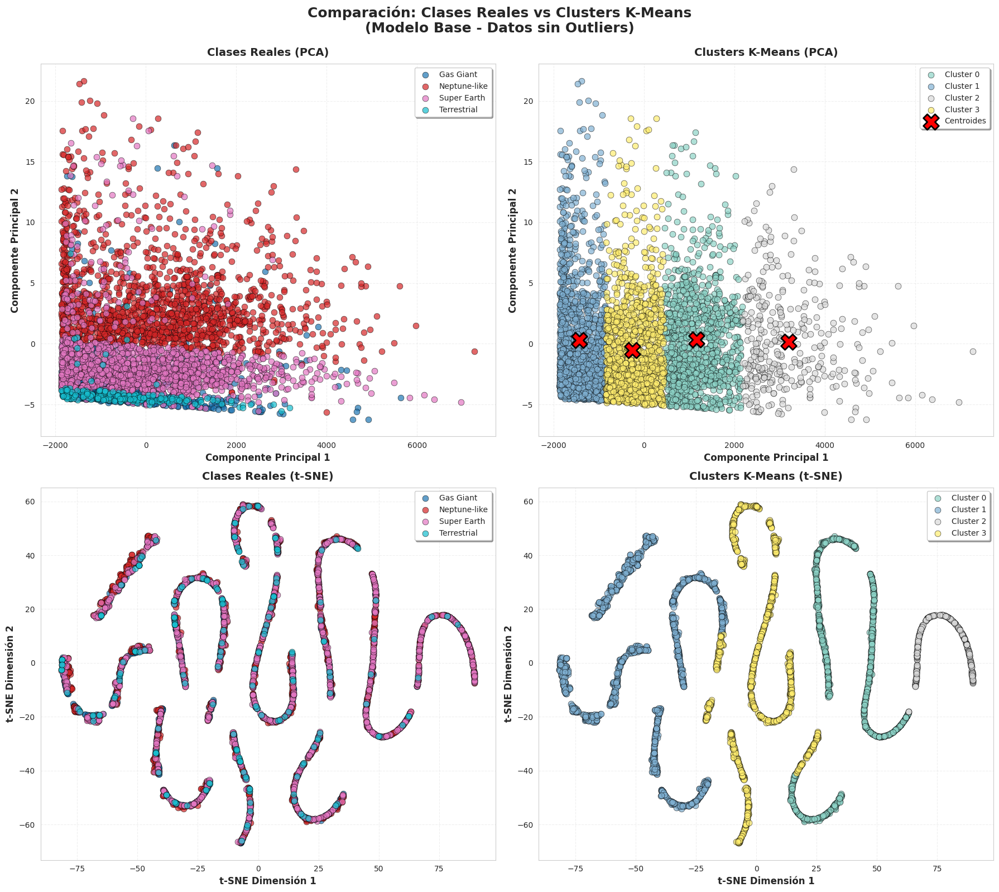


 ✓ Visualización comparativa guardada: 'kmeans_base_comparacion_clusters_vs_real.png'

                    3. GENERANDO VISUALIZACIÓN CON OVERLAY


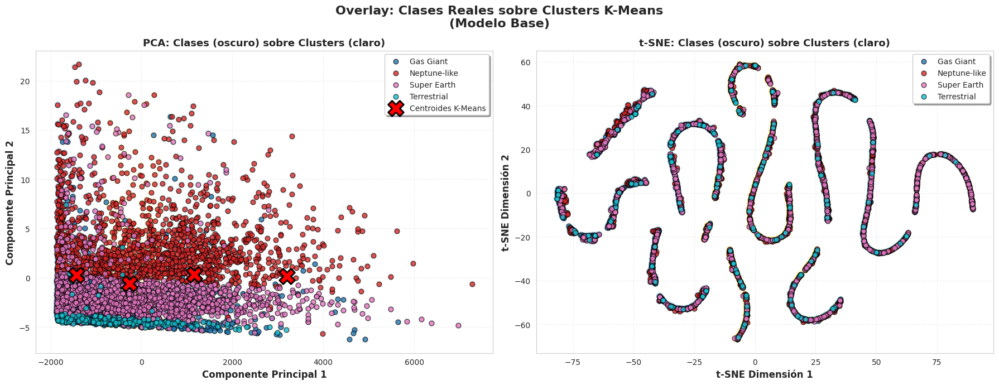


 ✓ Visualización overlay guardada: 'kmeans_base_overlay_clusters.png'

                    4. ANÁLISIS DE PUREZA DE CLUSTERS

  Composición de cada cluster:
  --------------------------------------------------------------------------------------

   Cluster 0 (1072 muestras):
    • Clase dominante: Neptune-like (504 muestras, 47.0% pureza)
    • Composición completa:
      - Neptune-like   :  504 ( 47.0%) ███████████████████████
      - Super Earth    :  413 ( 38.5%) ███████████████████
      - Gas Giant      :  127 ( 11.8%) █████
      - Terrestrial    :   28 (  2.6%) █

   Cluster 1 (1424 muestras):
    • Clase dominante: Super Earth (499 muestras, 35.0% pureza)
    • Composición completa:
      - Super Earth    :  499 ( 35.0%) █████████████████
      - Neptune-like   :  460 ( 32.3%) ████████████████
      - Gas Giant      :  381 ( 26.8%) █████████████
      - Terrestrial    :   84 (  5.9%) ██

   Cluster 2 (344 muestras):
    • Clase dominante: Neptune-like (188 muestras, 54.7% pur

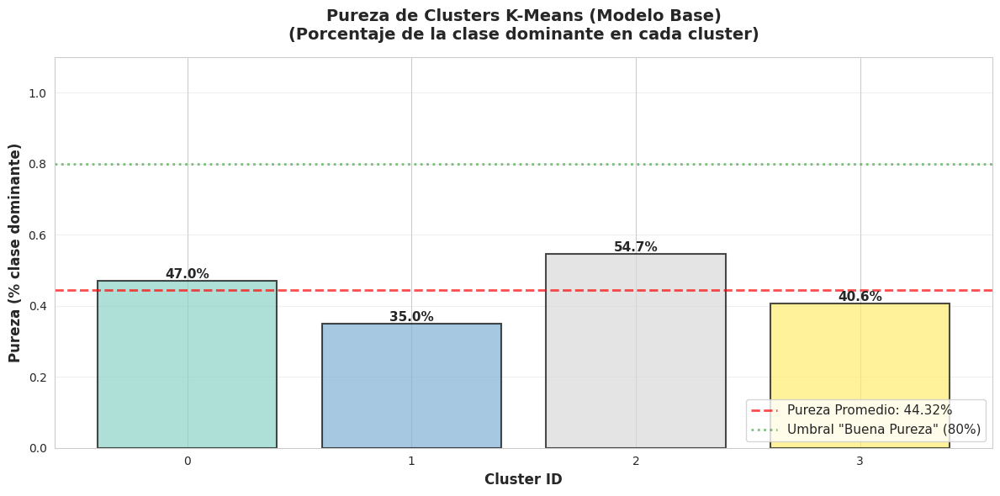


 ✓ Gráfico de pureza guardado: 'kmeans_base_pureza_clusters.png'

                    6. GENERANDO MATRIZ DE CONFUSIÓN DETALLADA


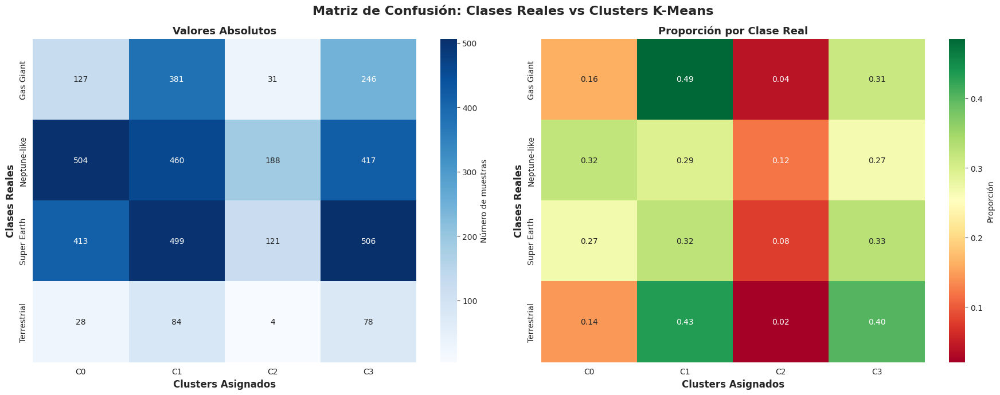


 ✓ Matriz de confusión guardada: 'kmeans_base_matriz_confusion_detallada.png'

                              RESUMEN FINAL

  Estadísticas del modelo kmeans_base:
   • Número de clusters:         4
   • Número de clases reales:    4
   • Pureza promedio:            44.32%
   • Varianza PCA explicada:     100.00%
   • Inercia (WCSS):             568051984.80
   • Iteraciones:                20

  Interpretación de la pureza:
   ⚠ Regular (44.3%): Los clusters tienen correspondencia limitada
     Considera ajustar k, revisar features, o probar otros algoritmos

  Clusters destacados:
   • Más puro:  Cluster 2 (54.7%)
   • Menos puro: Cluster 1 (35.0%)

                         ✓ VISUALIZACIÓN COMPLETADA


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "VISUALIZACIÓN DE CLUSTERS K-MEANS VS CLASES REALES")
print(" "*25 + "(Usando modelo kmeans_base)")
print("="*90)

# Verificar que existan los datos y el modelo
if 'kmeans_base' not in globals() or 'X_train' not in globals():
    print("  ERROR: Modelo o datos no encontrados")
    print("   Ejecuta primero el código del modelo K-Means base")
else:
    # Codificar etiquetas (probablemente ya estén codificadas, pero por si acaso)
    if 'le' not in globals():
        le = LabelEncoder()
        y_train_encoded = le.fit_transform(y_train)
        y_val_encoded = le.transform(y_val)
        y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n  Preparando datos para visualización...")

    # Combinar todos los datos para visualización consistente
    X_all = pd.concat([X_train, X_val, X_test], axis=0).reset_index(drop=True)
    y_all = np.concatenate([y_train_encoded, y_val_encoded, y_test_encoded])
    y_all_names = np.concatenate([y_train.values, y_val.values, y_test.values])

    print(f"   • Total de muestras: {len(X_all)}")
    print(f"   • Features originales: {X_all.shape[1]}")
    print(f"   • Clases: {n_classes}")
    print(f"   • Modelo: kmeans_base (k={kmeans_base.n_clusters})")

    # Obtener clusters para todos los datos usando el modelo ya entrenado
    print("\n  Asignando clusters con kmeans_base...")
    clusters_all = kmeans_base.predict(X_all)
    print(f" ✓ Clusters asignados")

    # ============================================================================
    #          1. REDUCCIÓN DE DIMENSIONALIDAD
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "1. REDUCCIÓN DE DIMENSIONALIDAD PARA VISUALIZACIÓN")
    print("="*90)

    print("\n  Aplicando PCA (2 componentes)...")
    pca = PCA(n_components=2, random_state=8)
    X_pca = pca.fit_transform(X_all)
    print(f" ✓ PCA completado")
    print(f"   • Varianza explicada total: {pca.explained_variance_ratio_.sum()*100:.2f}%")
    print(f"   • PC1: {pca.explained_variance_ratio_[0]*100:.2f}%")
    print(f"   • PC2: {pca.explained_variance_ratio_[1]*100:.2f}%")

    print("\n  Aplicando t-SNE (2 componentes)...")
    print("   (Esto puede tomar un momento...)")
    tsne = TSNE(n_components=2, random_state=8, perplexity=30, n_iter=1000, verbose=0)
    X_tsne = tsne.fit_transform(X_all)
    print(f" ✓ t-SNE completado")

    # ============================================================================
    #          2. VISUALIZACIÓN PRINCIPAL: ORIGINAL VS K-MEANS
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "2. GENERANDO VISUALIZACIÓN COMPARATIVA (2x2)")
    print("="*90)

    # Configurar colores
    n_colors = max(n_classes, kmeans_base.n_clusters)
    colors_real = plt.cm.tab10(np.linspace(0, 1, n_colors))
    colors_clusters = plt.cm.Set3(np.linspace(0, 1, n_colors))

    # Crear figura con 4 subplots (2x2)
    fig, axes = plt.subplots(2, 2, figsize=(18, 16))
    fig.suptitle('Comparación: Clases Reales vs Clusters K-Means\n(Modelo Base - Datos sin Outliers)',
                 fontsize=18, fontweight='bold', y=0.995)

    # -------------------------
    # SUBPLOT 1: PCA - Clases Reales (Original)
    # -------------------------
    ax = axes[0, 0]
    for i, class_name in enumerate(le.classes_):
        mask = y_all == i
        ax.scatter(X_pca[mask, 0], X_pca[mask, 1],
                  c=[colors_real[i]], label=class_name,
                  alpha=0.7, s=60, edgecolors='black', linewidth=0.5)

    ax.set_xlabel('Componente Principal 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('Componente Principal 2', fontsize=12, fontweight='bold')
    ax.set_title('Clases Reales (PCA)', fontsize=14, fontweight='bold', pad=10)
    ax.legend(loc='best', frameon=True, shadow=True, fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')

    # -------------------------
    # SUBPLOT 2: PCA - Clusters K-Means
    # -------------------------
    ax = axes[0, 1]
    for cluster_id in range(kmeans_base.n_clusters):
        mask = clusters_all == cluster_id
        ax.scatter(X_pca[mask, 0], X_pca[mask, 1],
                  c=[colors_clusters[cluster_id]], label=f'Cluster {cluster_id}',
                  alpha=0.7, s=60, edgecolors='black', linewidth=0.5)

    # Agregar centroides transformados a espacio PCA
    centroids_pca = pca.transform(kmeans_base.cluster_centers_)
    ax.scatter(centroids_pca[:, 0], centroids_pca[:, 1],
              marker='X', s=400, c='red', edgecolors='black', linewidth=2,
              label='Centroides', zorder=10)

    ax.set_xlabel('Componente Principal 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('Componente Principal 2', fontsize=12, fontweight='bold')
    ax.set_title('Clusters K-Means (PCA)', fontsize=14, fontweight='bold', pad=10)
    ax.legend(loc='best', frameon=True, shadow=True, fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')

    # -------------------------
    # SUBPLOT 3: t-SNE - Clases Reales
    # -------------------------
    ax = axes[1, 0]
    for i, class_name in enumerate(le.classes_):
        mask = y_all == i
        ax.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                  c=[colors_real[i]], label=class_name,
                  alpha=0.7, s=60, edgecolors='black', linewidth=0.5)

    ax.set_xlabel('t-SNE Dimensión 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('t-SNE Dimensión 2', fontsize=12, fontweight='bold')
    ax.set_title('Clases Reales (t-SNE)', fontsize=14, fontweight='bold', pad=10)
    ax.legend(loc='best', frameon=True, shadow=True, fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')

    # -------------------------
    # SUBPLOT 4: t-SNE - Clusters K-Means
    # -------------------------
    ax = axes[1, 1]
    for cluster_id in range(kmeans_base.n_clusters):
        mask = clusters_all == cluster_id
        ax.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                  c=[colors_clusters[cluster_id]], label=f'Cluster {cluster_id}',
                  alpha=0.7, s=60, edgecolors='black', linewidth=0.5)

    ax.set_xlabel('t-SNE Dimensión 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('t-SNE Dimensión 2', fontsize=12, fontweight='bold')
    ax.set_title('Clusters K-Means (t-SNE)', fontsize=14, fontweight='bold', pad=10)
    ax.legend(loc='best', frameon=True, shadow=True, fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')

    plt.tight_layout()
    plt.savefig('kmeans_base_comparacion_clusters_vs_real.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n ✓ Visualización comparativa guardada: 'kmeans_base_comparacion_clusters_vs_real.png'")

    # ============================================================================
    #          3. VISUALIZACIÓN CON OVERLAY (Clases sobre Clusters)
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "3. GENERANDO VISUALIZACIÓN CON OVERLAY")
    print("="*90)

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle('Overlay: Clases Reales sobre Clusters K-Means\n(Modelo Base)',
                 fontsize=16, fontweight='bold')

    # -------------------------
    # PCA Overlay
    # -------------------------
    ax = axes[0]

    # Primero dibujar clusters con colores claros (fondo)
    for cluster_id in range(kmeans_base.n_clusters):
        mask = clusters_all == cluster_id
        ax.scatter(X_pca[mask, 0], X_pca[mask, 1],
                  c=[colors_clusters[cluster_id]],
                  alpha=0.2, s=80, edgecolors='none')

    # Luego dibujar clases reales con colores oscuros (frente)
    for i, class_name in enumerate(le.classes_):
        mask = y_all == i
        ax.scatter(X_pca[mask, 0], X_pca[mask, 1],
                  c=[colors_real[i]], label=class_name,
                  alpha=0.8, s=40, edgecolors='black', linewidth=0.8)

    # Centroides
    centroids_pca = pca.transform(kmeans_base.cluster_centers_)
    ax.scatter(centroids_pca[:, 0], centroids_pca[:, 1],
              marker='X', s=400, c='red', edgecolors='black', linewidth=2,
              label='Centroides K-Means', zorder=10)

    ax.set_xlabel('Componente Principal 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('Componente Principal 2', fontsize=12, fontweight='bold')
    ax.set_title('PCA: Clases (oscuro) sobre Clusters (claro)', fontsize=13, fontweight='bold')
    ax.legend(loc='best', frameon=True, shadow=True, fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')

    # -------------------------
    # t-SNE Overlay
    # -------------------------
    ax = axes[1]

    # Primero dibujar clusters con colores claros (fondo)
    for cluster_id in range(kmeans_base.n_clusters):
        mask = clusters_all == cluster_id
        ax.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                  c=[colors_clusters[cluster_id]],
                  alpha=0.2, s=80, edgecolors='none')

    # Luego dibujar clases reales con colores oscuros (frente)
    for i, class_name in enumerate(le.classes_):
        mask = y_all == i
        ax.scatter(X_tsne[mask, 0], X_tsne[mask, 1],
                  c=[colors_real[i]], label=class_name,
                  alpha=0.8, s=40, edgecolors='black', linewidth=0.8)

    ax.set_xlabel('t-SNE Dimensión 1', fontsize=12, fontweight='bold')
    ax.set_ylabel('t-SNE Dimensión 2', fontsize=12, fontweight='bold')
    ax.set_title('t-SNE: Clases (oscuro) sobre Clusters (claro)', fontsize=13, fontweight='bold')
    ax.legend(loc='best', frameon=True, shadow=True, fontsize=10)
    ax.grid(True, alpha=0.3, linestyle='--')

    plt.tight_layout()
    plt.savefig('kmeans_base_overlay_clusters.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n ✓ Visualización overlay guardada: 'kmeans_base_overlay_clusters.png'")

    # ============================================================================
    #          4. ANÁLISIS DE PUREZA DE CLUSTERS
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "4. ANÁLISIS DE PUREZA DE CLUSTERS")
    print("="*90)

    print("\n  Composición de cada cluster:")
    print("  " + "-"*86)

    cluster_purity = {}
    cluster_compositions = {}

    for cluster_id in range(kmeans_base.n_clusters):
        mask = clusters_all == cluster_id
        classes_in_cluster = y_all_names[mask]
        total_in_cluster = len(classes_in_cluster)

        if total_in_cluster > 0:
            class_counts = Counter(classes_in_cluster)
            most_common_class, most_common_count = class_counts.most_common(1)[0]
            purity = most_common_count / total_in_cluster
            cluster_purity[cluster_id] = purity
            cluster_compositions[cluster_id] = class_counts

            print(f"\n   Cluster {cluster_id} ({total_in_cluster} muestras):")
            print(f"    • Clase dominante: {most_common_class} ({most_common_count} muestras, {purity:.1%} pureza)")
            print(f"    • Composición completa:")
            for class_name, count in sorted(class_counts.items(), key=lambda x: x[1], reverse=True):
                percentage = count / total_in_cluster * 100
                bar = '█' * int(percentage / 2)
                print(f"      - {class_name:15s}: {count:4d} ({percentage:5.1f}%) {bar}")

    # Pureza promedio
    avg_purity = np.mean(list(cluster_purity.values()))
    print(f"\n   Pureza promedio de clusters: {avg_purity:.2%}")

    # ============================================================================
    #          5. GRÁFICO DE BARRAS DE PUREZA
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "5. GENERANDO GRÁFICO DE PUREZA")
    print("="*90)

    fig, ax = plt.subplots(figsize=(12, 6))

    clusters_ids = list(cluster_purity.keys())
    purities = list(cluster_purity.values())

    bars = ax.bar(clusters_ids, purities, color=colors_clusters[:len(clusters_ids)],
                   alpha=0.7, edgecolor='black', linewidth=1.5)

    # Línea de pureza promedio
    ax.axhline(y=avg_purity, color='red', linestyle='--', linewidth=2,
               alpha=0.7, label=f'Pureza Promedio: {avg_purity:.2%}')

    # Línea de referencia "buena pureza"
    ax.axhline(y=0.8, color='green', linestyle=':', linewidth=2,
               alpha=0.5, label='Umbral "Buena Pureza" (80%)')

    # Etiquetas en las barras
    for bar, purity in zip(bars, purities):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{purity:.1%}', ha='center', va='bottom',
                fontweight='bold', fontsize=11)

    ax.set_xlabel('Cluster ID', fontsize=12, fontweight='bold')
    ax.set_ylabel('Pureza (% clase dominante)', fontsize=12, fontweight='bold')
    ax.set_title('Pureza de Clusters K-Means (Modelo Base)\n(Porcentaje de la clase dominante en cada cluster)',
                 fontsize=14, fontweight='bold', pad=15)
    ax.set_ylim(0, 1.1)
    ax.set_xticks(clusters_ids)
    ax.legend(fontsize=11, loc='lower right')
    ax.grid(True, alpha=0.3, axis='y')

    plt.tight_layout()
    plt.savefig('kmeans_base_pureza_clusters.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n ✓ Gráfico de pureza guardado: 'kmeans_base_pureza_clusters.png'")

    # ============================================================================
    #          6. MATRIZ DE CONFUSIÓN MEJORADA
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "6. GENERANDO MATRIZ DE CONFUSIÓN DETALLADA")
    print("="*90)

    # Crear matriz de confusión normalizada
    from sklearn.metrics import confusion_matrix

    conf_matrix = confusion_matrix(y_all, clusters_all)
    conf_matrix_norm = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle('Matriz de Confusión: Clases Reales vs Clusters K-Means',
                 fontsize=16, fontweight='bold')

    # Matriz absoluta
    ax = axes[0]
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=[f'C{i}' for i in range(kmeans_base.n_clusters)],
                yticklabels=le.classes_, ax=ax, cbar_kws={'label': 'Número de muestras'})
    ax.set_xlabel('Clusters Asignados', fontsize=12, fontweight='bold')
    ax.set_ylabel('Clases Reales', fontsize=12, fontweight='bold')
    ax.set_title('Valores Absolutos', fontsize=13, fontweight='bold')

    # Matriz normalizada
    ax = axes[1]
    sns.heatmap(conf_matrix_norm, annot=True, fmt='.2f', cmap='RdYlGn',
                xticklabels=[f'C{i}' for i in range(kmeans_base.n_clusters)],
                yticklabels=le.classes_, ax=ax, cbar_kws={'label': 'Proporción'})
    ax.set_xlabel('Clusters Asignados', fontsize=12, fontweight='bold')
    ax.set_ylabel('Clases Reales', fontsize=12, fontweight='bold')
    ax.set_title('Proporción por Clase Real', fontsize=13, fontweight='bold')

    plt.tight_layout()
    plt.savefig('kmeans_base_matriz_confusion_detallada.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n ✓ Matriz de confusión guardada: 'kmeans_base_matriz_confusion_detallada.png'")

    # ============================================================================
    #          7. RESUMEN FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" "*30 + "RESUMEN FINAL")
    print("="*90)

    print(f"\n  Estadísticas del modelo kmeans_base:")
    print(f"   • Número de clusters:         {kmeans_base.n_clusters}")
    print(f"   • Número de clases reales:    {n_classes}")
    print(f"   • Pureza promedio:            {avg_purity:.2%}")
    print(f"   • Varianza PCA explicada:     {pca.explained_variance_ratio_.sum()*100:.2f}%")
    print(f"   • Inercia (WCSS):             {kmeans_base.inertia_:.2f}")
    print(f"   • Iteraciones:                {kmeans_base.n_iter_}")

    # Interpretación
    print(f"\n  Interpretación de la pureza:")
    if avg_purity > 0.8:
        print(f"   ✓ Excelente ({avg_purity:.1%}): Los clusters corresponden muy bien con las clases reales")
        print(f"     El algoritmo K-Means está identificando correctamente los grupos naturales")
    elif avg_purity > 0.6:
        print(f"   → Bueno ({avg_purity:.1%}): Los clusters tienen correspondencia moderada con las clases")
        print(f"     Hay cierta mezcla entre clases, pero los patrones son identificables")
    elif avg_purity > 0.4:
        print(f"   ⚠ Regular ({avg_purity:.1%}): Los clusters tienen correspondencia limitada")
        print(f"     Considera ajustar k, revisar features, o probar otros algoritmos")
    else:
        print(f"   ❌ Bajo ({avg_purity:.1%}): Los clusters no corresponden bien con las clases reales")
        print(f"     Los datos pueden no tener estructura de clusters clara o K-Means no es adecuado")

    # Cluster más puro y menos puro
    best_cluster = max(cluster_purity.items(), key=lambda x: x[1])
    worst_cluster = min(cluster_purity.items(), key=lambda x: x[1])

    print(f"\n  Clusters destacados:")
    print(f"   • Más puro:  Cluster {best_cluster[0]} ({best_cluster[1]:.1%})")
    print(f"   • Menos puro: Cluster {worst_cluster[0]} ({worst_cluster[1]:.1%})")

    print("\n" + "="*90)
    print(" "*25 + "✓ VISUALIZACIÓN COMPLETADA")
    print("="*90)

## Curvas de Aprendizaje

                    CURVAS DE APRENDIZAJE - K-MEANS CLUSTERING

  Configuración:
   • Total de muestras de entrenamiento: 2860
   • Número de clusters: 4
   • Features: 5

  Evaluando con 10 tamaños de muestra:
   • Mínimo: 286 muestras (10%)
   • Máximo: 2860 muestras (100%)

  ENTRENANDO Y EVALUANDO MODELOS...

  [1/10] Entrenando con 286 muestras (10.0%)... ✓ (Tiempo: 0.022s)
  [2/10] Entrenando con 572 muestras (20.0%)... ✓ (Tiempo: 0.024s)
  [3/10] Entrenando con 858 muestras (30.0%)... ✓ (Tiempo: 0.030s)
  [4/10] Entrenando con 1144 muestras (40.0%)... ✓ (Tiempo: 0.037s)
  [5/10] Entrenando con 1430 muestras (50.0%)... ✓ (Tiempo: 0.058s)
  [6/10] Entrenando con 1716 muestras (60.0%)... ✓ (Tiempo: 0.046s)
  [7/10] Entrenando con 2002 muestras (70.0%)... ✓ (Tiempo: 0.046s)
  [8/10] Entrenando con 2288 muestras (80.0%)... ✓ (Tiempo: 0.049s)
  [9/10] Entrenando con 2574 muestras (90.0%)... ✓ (Tiempo: 0.055s)
  [10/10] Entrenando con 2860 muestras (100.0%)... ✓ (Tiempo: 0.052s)

 ✓ En

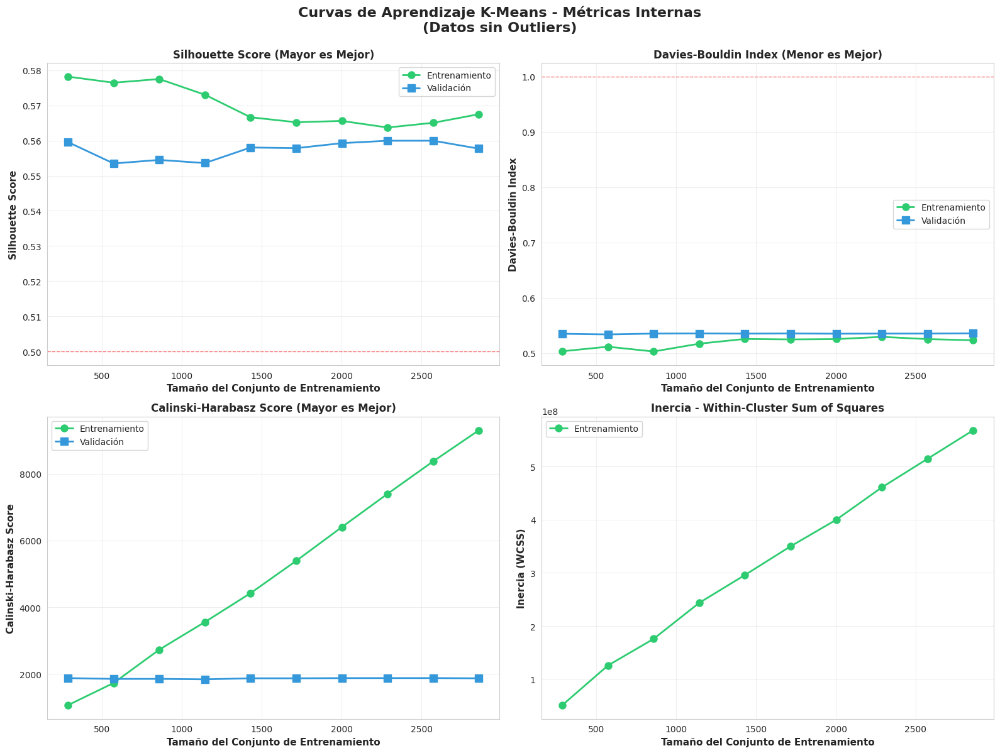

 ✓ Gráfica de métricas internas guardada


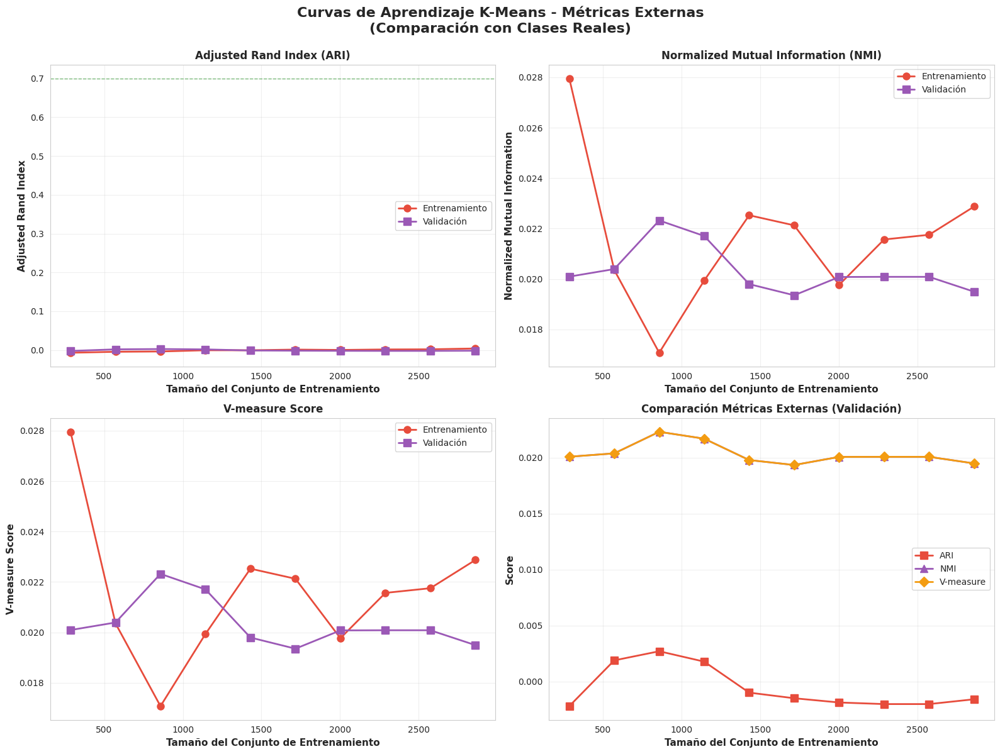

 ✓ Gráfica de métricas externas guardada


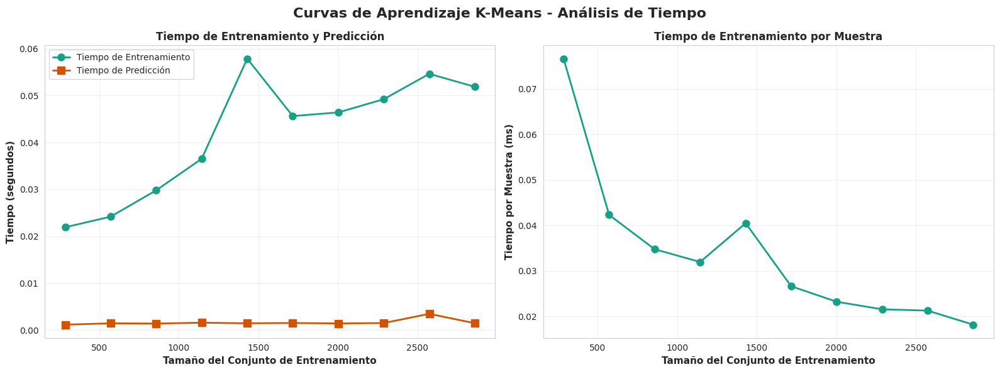

 ✓ Gráfica de tiempos guardada

  ANÁLISIS DE CONVERGENCIA

  Gap entre Entrenamiento y Validación:
   • Silhouette Score:
     - Inicial (10%): 0.0186
     - Final (100%):  0.0098
   • ARI:
     - Inicial (10%): 0.0046
     - Final (100%):  0.0057

  Mejora con más datos (Validación):
   • Silhouette Score: -0.0019 (-0.3%)
   • ARI:              +0.0006 (-27.9%)

  RECOMENDACIONES:
   ✓ Gap bajo en Silhouette Score - buena generalización
   → El modelo mejora modestamente con más datos
   ⚠ ARI bajo - los clusters no corresponden bien con las clases reales
     → Considera: ajustar k, usar otros features, o probar otros algoritmos

                         ✓ CURVAS DE APRENDIZAJE COMPLETADAS


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score, davies_bouldin_score, calinski_harabasz_score,
    adjusted_rand_score, normalized_mutual_info_score, v_measure_score
)
from sklearn.preprocessing import LabelEncoder
import time

print("="*90)
print(" "*20 + "CURVAS DE APRENDIZAJE - K-MEANS CLUSTERING")
print("="*90)

# Verificar que existan los datos
if 'X_train' not in globals() or 'y_train' not in globals():
    print("  ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)

    n_classes = len(np.unique(y_train_encoded))

    print("\n  Configuración:")
    print(f"   • Total de muestras de entrenamiento: {len(X_train)}")
    print(f"   • Número de clusters: {n_classes}")
    print(f"   • Features: {X_train.shape[1]}")

    # Definir tamaños de muestra progresivos
    sample_sizes = np.linspace(0.1, 1.0, 10)  # Del 10% al 100%
    n_samples = [int(size * len(X_train)) for size in sample_sizes]

    print(f"\n  Evaluando con {len(n_samples)} tamaños de muestra:")
    print(f"   • Mínimo: {n_samples[0]} muestras ({sample_sizes[0]:.0%})")
    print(f"   • Máximo: {n_samples[-1]} muestras ({sample_sizes[-1]:.0%})")

    # Inicializar listas para almacenar resultados
    results = {
        'train': {
            'silhouette': [], 'davies_bouldin': [], 'calinski': [],
            'ari': [], 'nmi': [], 'v_measure': [], 'inertia': [], 'time': []
        },
        'val': {
            'silhouette': [], 'davies_bouldin': [], 'calinski': [],
            'ari': [], 'nmi': [], 'v_measure': [], 'time': []
        }
    }

    print("\n" + "="*90)
    print("  ENTRENANDO Y EVALUANDO MODELOS...")
    print("="*90 + "\n")

    # Entrenar modelos con diferentes tamaños de muestra
    for i, n in enumerate(n_samples, 1):
        print(f"  [{i}/{len(n_samples)}] Entrenando con {n} muestras ({n/len(X_train):.1%})...", end=' ')

        # Seleccionar subconjunto de entrenamiento
        indices = np.random.RandomState(8).choice(len(X_train), size=n, replace=False)
        X_train_subset = X_train.iloc[indices]
        y_train_subset = y_train_encoded[indices]

        # Entrenar modelo
        start_time = time.time()
        kmeans = KMeans(
            n_clusters=n_classes,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=8,
            verbose=0
        )
        kmeans.fit(X_train_subset)
        train_time = time.time() - start_time

        # Predicciones
        clusters_train = kmeans.predict(X_train_subset)

        start_time = time.time()
        clusters_val = kmeans.predict(X_val)
        val_time = time.time() - start_time

        # Métricas de entrenamiento
        results['train']['silhouette'].append(silhouette_score(X_train_subset, clusters_train))
        results['train']['davies_bouldin'].append(davies_bouldin_score(X_train_subset, clusters_train))
        results['train']['calinski'].append(calinski_harabasz_score(X_train_subset, clusters_train))
        results['train']['ari'].append(adjusted_rand_score(y_train_subset, clusters_train))
        results['train']['nmi'].append(normalized_mutual_info_score(y_train_subset, clusters_train))
        results['train']['v_measure'].append(v_measure_score(y_train_subset, clusters_train))
        results['train']['inertia'].append(kmeans.inertia_)
        results['train']['time'].append(train_time)

        # Métricas de validación
        results['val']['silhouette'].append(silhouette_score(X_val, clusters_val))
        results['val']['davies_bouldin'].append(davies_bouldin_score(X_val, clusters_val))
        results['val']['calinski'].append(calinski_harabasz_score(X_val, clusters_val))
        results['val']['ari'].append(adjusted_rand_score(y_val_encoded, clusters_val))
        results['val']['nmi'].append(normalized_mutual_info_score(y_val_encoded, clusters_val))
        results['val']['v_measure'].append(v_measure_score(y_val_encoded, clusters_val))
        results['val']['time'].append(val_time)

        print(f"✓ (Tiempo: {train_time:.3f}s)")

    print("\n ✓ Entrenamiento completado!")

    # ============================================================================
    #                     VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print("  GENERANDO CURVAS DE APRENDIZAJE...")
    print("="*90 + "\n")

    # 1. MÉTRICAS INTERNAS
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Curvas de Aprendizaje K-Means - Métricas Internas\n(Datos sin Outliers)',
                 fontsize=16, fontweight='bold', y=0.995)

    # Silhouette Score
    axes[0, 0].plot(n_samples, results['train']['silhouette'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#2ecc71')
    axes[0, 0].plot(n_samples, results['val']['silhouette'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#3498db')
    axes[0, 0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0, 0].set_ylabel('Silhouette Score', fontsize=11, fontweight='bold')
    axes[0, 0].set_title('Silhouette Score (Mayor es Mejor)', fontsize=12, fontweight='bold')
    axes[0, 0].legend(loc='best', fontsize=10)
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].axhline(y=0.5, color='red', linestyle='--', alpha=0.5, linewidth=1, label='Umbral "Bueno"')

    # Davies-Bouldin Index
    axes[0, 1].plot(n_samples, results['train']['davies_bouldin'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#2ecc71')
    axes[0, 1].plot(n_samples, results['val']['davies_bouldin'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#3498db')
    axes[0, 1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0, 1].set_ylabel('Davies-Bouldin Index', fontsize=11, fontweight='bold')
    axes[0, 1].set_title('Davies-Bouldin Index (Menor es Mejor)', fontsize=12, fontweight='bold')
    axes[0, 1].legend(loc='best', fontsize=10)
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].axhline(y=1.0, color='red', linestyle='--', alpha=0.5, linewidth=1, label='Umbral "Bueno"')

    # Calinski-Harabasz Score
    axes[1, 0].plot(n_samples, results['train']['calinski'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#2ecc71')
    axes[1, 0].plot(n_samples, results['val']['calinski'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#3498db')
    axes[1, 0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1, 0].set_ylabel('Calinski-Harabasz Score', fontsize=11, fontweight='bold')
    axes[1, 0].set_title('Calinski-Harabasz Score (Mayor es Mejor)', fontsize=12, fontweight='bold')
    axes[1, 0].legend(loc='best', fontsize=10)
    axes[1, 0].grid(True, alpha=0.3)

    # Inercia (WCSS)
    axes[1, 1].plot(n_samples, results['train']['inertia'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#2ecc71')
    axes[1, 1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1, 1].set_ylabel('Inercia (WCSS)', fontsize=11, fontweight='bold')
    axes[1, 1].set_title('Inercia - Within-Cluster Sum of Squares', fontsize=12, fontweight='bold')
    axes[1, 1].legend(loc='best', fontsize=10)
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('kmeans_curvas_metricas_internas.png', dpi=300, bbox_inches='tight')
    plt.show()

    print(" ✓ Gráfica de métricas internas guardada")

    # 2. MÉTRICAS EXTERNAS
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Curvas de Aprendizaje K-Means - Métricas Externas\n(Comparación con Clases Reales)',
                 fontsize=16, fontweight='bold', y=0.995)

    # ARI
    axes[0, 0].plot(n_samples, results['train']['ari'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#e74c3c')
    axes[0, 0].plot(n_samples, results['val']['ari'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#9b59b6')
    axes[0, 0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0, 0].set_ylabel('Adjusted Rand Index', fontsize=11, fontweight='bold')
    axes[0, 0].set_title('Adjusted Rand Index (ARI)', fontsize=12, fontweight='bold')
    axes[0, 0].legend(loc='best', fontsize=10)
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].axhline(y=0.7, color='green', linestyle='--', alpha=0.5, linewidth=1, label='Umbral "Excelente"')

    # NMI
    axes[0, 1].plot(n_samples, results['train']['nmi'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#e74c3c')
    axes[0, 1].plot(n_samples, results['val']['nmi'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#9b59b6')
    axes[0, 1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0, 1].set_ylabel('Normalized Mutual Information', fontsize=11, fontweight='bold')
    axes[0, 1].set_title('Normalized Mutual Information (NMI)', fontsize=12, fontweight='bold')
    axes[0, 1].legend(loc='best', fontsize=10)
    axes[0, 1].grid(True, alpha=0.3)

    # V-measure
    axes[1, 0].plot(n_samples, results['train']['v_measure'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#e74c3c')
    axes[1, 0].plot(n_samples, results['val']['v_measure'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#9b59b6')
    axes[1, 0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1, 0].set_ylabel('V-measure Score', fontsize=11, fontweight='bold')
    axes[1, 0].set_title('V-measure Score', fontsize=12, fontweight='bold')
    axes[1, 0].legend(loc='best', fontsize=10)
    axes[1, 0].grid(True, alpha=0.3)

    # Comparación ARI, NMI, V-measure (Validación)
    axes[1, 1].plot(n_samples, results['val']['ari'], 's-',
                    linewidth=2, markersize=8, label='ARI', color='#e74c3c')
    axes[1, 1].plot(n_samples, results['val']['nmi'], '^-',
                    linewidth=2, markersize=8, label='NMI', color='#9b59b6')
    axes[1, 1].plot(n_samples, results['val']['v_measure'], 'D-',
                    linewidth=2, markersize=8, label='V-measure', color='#f39c12')
    axes[1, 1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1, 1].set_ylabel('Score', fontsize=11, fontweight='bold')
    axes[1, 1].set_title('Comparación Métricas Externas (Validación)', fontsize=12, fontweight='bold')
    axes[1, 1].legend(loc='best', fontsize=10)
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('kmeans_curvas_metricas_externas.png', dpi=300, bbox_inches='tight')
    plt.show()

    print(" ✓ Gráfica de métricas externas guardada")

    # 3. TIEMPO DE ENTRENAMIENTO
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('Curvas de Aprendizaje K-Means - Análisis de Tiempo',
                 fontsize=16, fontweight='bold')

    # Tiempo absoluto
    axes[0].plot(n_samples, results['train']['time'], 'o-',
                 linewidth=2, markersize=8, label='Tiempo de Entrenamiento', color='#16a085')
    axes[0].plot(n_samples, results['val']['time'], 's-',
                 linewidth=2, markersize=8, label='Tiempo de Predicción', color='#d35400')
    axes[0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0].set_ylabel('Tiempo (segundos)', fontsize=11, fontweight='bold')
    axes[0].set_title('Tiempo de Entrenamiento y Predicción', fontsize=12, fontweight='bold')
    axes[0].legend(loc='best', fontsize=10)
    axes[0].grid(True, alpha=0.3)

    # Tiempo por muestra
    time_per_sample = np.array(results['train']['time']) / np.array(n_samples) * 1000
    axes[1].plot(n_samples, time_per_sample, 'o-',
                 linewidth=2, markersize=8, color='#16a085')
    axes[1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1].set_ylabel('Tiempo por Muestra (ms)', fontsize=11, fontweight='bold')
    axes[1].set_title('Tiempo de Entrenamiento por Muestra', fontsize=12, fontweight='bold')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('kmeans_curvas_tiempo.png', dpi=300, bbox_inches='tight')
    plt.show()

    print(" ✓ Gráfica de tiempos guardada")

    # ============================================================================
    #                     ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*90)
    print("  ANÁLISIS DE CONVERGENCIA")
    print("="*90 + "\n")

    # Calcular diferencias entre train y validación
    gap_silhouette = np.abs(np.array(results['train']['silhouette']) -
                            np.array(results['val']['silhouette']))
    gap_ari = np.abs(np.array(results['train']['ari']) -
                     np.array(results['val']['ari']))

    print(f"  Gap entre Entrenamiento y Validación:")
    print(f"   • Silhouette Score:")
    print(f"     - Inicial (10%): {gap_silhouette[0]:.4f}")
    print(f"     - Final (100%):  {gap_silhouette[-1]:.4f}")
    print(f"   • ARI:")
    print(f"     - Inicial (10%): {gap_ari[0]:.4f}")
    print(f"     - Final (100%):  {gap_ari[-1]:.4f}")

    # Mejora con más datos
    improvement_sil_val = results['val']['silhouette'][-1] - results['val']['silhouette'][0]
    improvement_ari_val = results['val']['ari'][-1] - results['val']['ari'][0]

    print(f"\n  Mejora con más datos (Validación):")
    print(f"   • Silhouette Score: {improvement_sil_val:+.4f} ({improvement_sil_val/results['val']['silhouette'][0]*100:+.1f}%)")
    print(f"   • ARI:              {improvement_ari_val:+.4f} ({improvement_ari_val/results['val']['ari'][0]*100:+.1f}%)")

    # Recomendaciones
    print(f"\n  RECOMENDACIONES:")
    if gap_silhouette[-1] > 0.1:
        print("   ⚠ Gap alto en Silhouette Score - posible sobreajuste")
    else:
        print("   ✓ Gap bajo en Silhouette Score - buena generalización")

    if improvement_ari_val > 0.1:
        print("   ✓ El modelo mejora significativamente con más datos")
    elif improvement_ari_val > 0:
        print("   → El modelo mejora modestamente con más datos")
    else:
        print("   ⚠ El modelo no mejora con más datos - revisar features o k")

    if results['val']['ari'][-1] < 0.5:
        print("   ⚠ ARI bajo - los clusters no corresponden bien con las clases reales")
        print("     → Considera: ajustar k, usar otros features, o probar otros algoritmos")

    print("\n" + "="*90)
    print(" "*25 + "✓ CURVAS DE APRENDIZAJE COMPLETADAS")
    print("="*90)

                    CURVAS DE APRENDIZAJE - K-MEANS CLUSTERING

  MÉTODO: Curvas de aprendizaje con validación fija
   • Se combinan train + validación en un solo conjunto
   • Se evalúa con diferentes tamaños de entrenamiento
   • El conjunto de prueba (test) se mantiene separado

  Configuración:
   • Total muestras combinadas (train+val): 3473
   • Muestras de prueba (separadas):        614
   • Número de clusters:                    4
   • Features:                              5

  Evaluando con 10 tamaños de muestra:
   • Mínimo: 347 muestras (10%)
   • Máximo: 3473 muestras (100%)

  ENTRENANDO Y EVALUANDO MODELOS...

  [1/10] Entrenando con 347 muestras (10.0%)... ✓ (Tiempo: 0.029s)
  [2/10] Entrenando con 694 muestras (20.0%)... ✓ (Tiempo: 0.029s)
  [3/10] Entrenando con 1041 muestras (30.0%)... ✓ (Tiempo: 0.054s)
  [4/10] Entrenando con 1389 muestras (40.0%)... ✓ (Tiempo: 0.068s)
  [5/10] Entrenando con 1736 muestras (50.0%)... ✓ (Tiempo: 0.063s)
  [6/10] Entrenando con 2083 

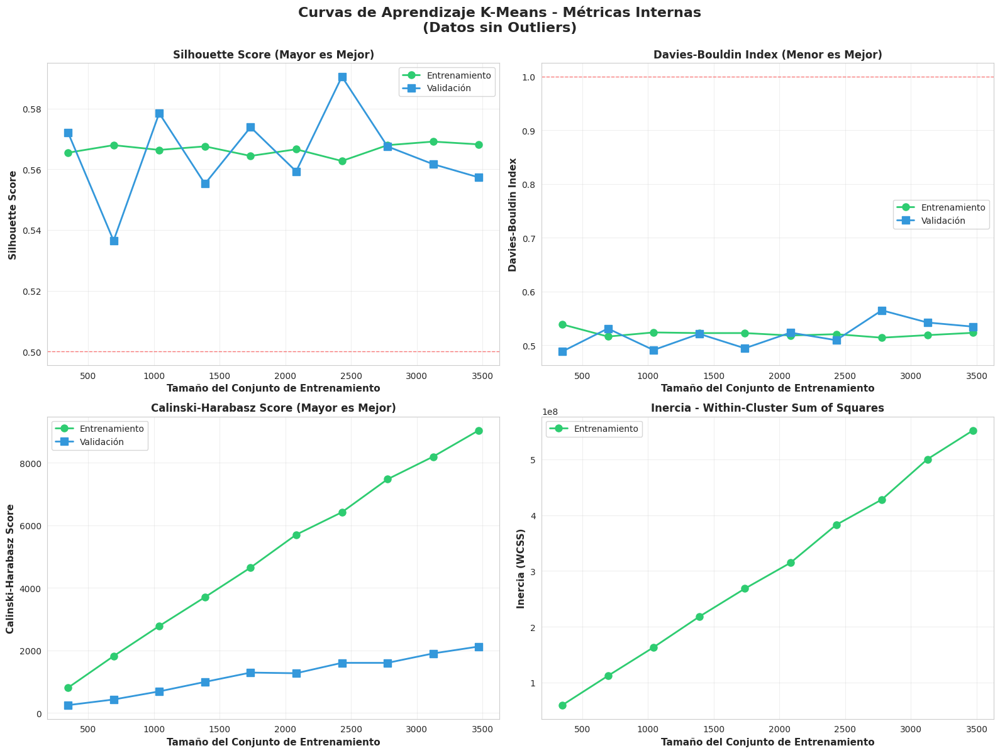

 ✓ Gráfica de métricas internas guardada


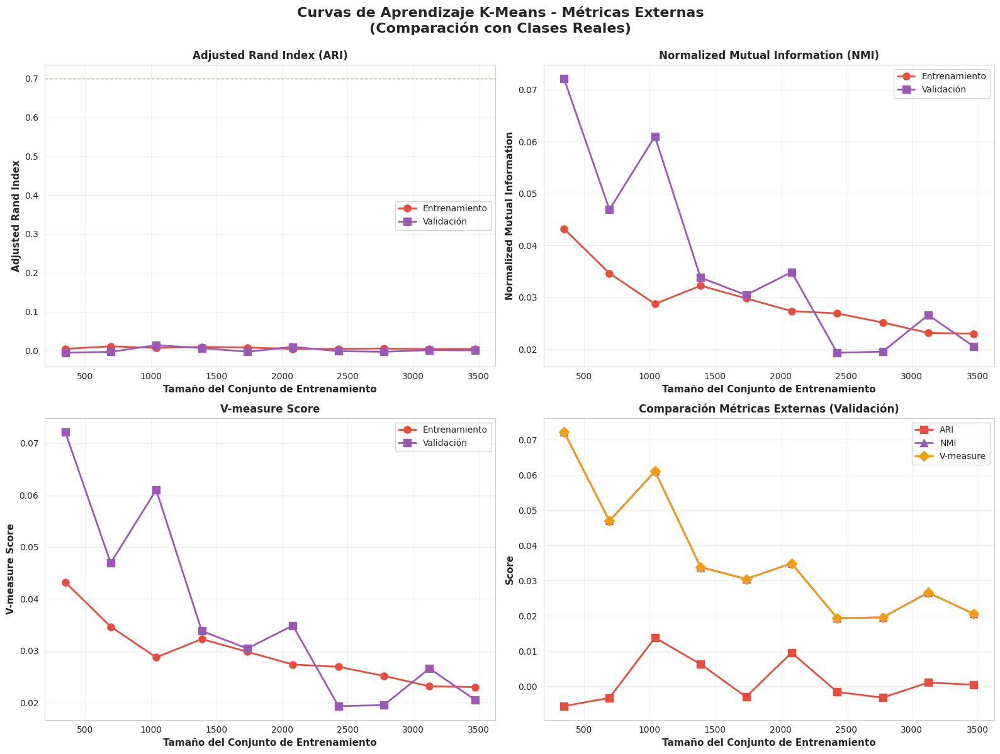

 ✓ Gráfica de métricas externas guardada


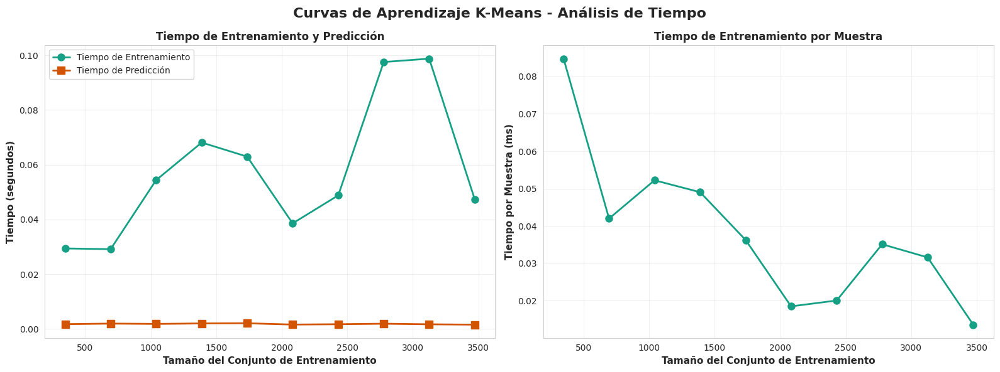

 ✓ Gráfica de tiempos guardada

  ANÁLISIS DE CONVERGENCIA

  Gap entre Entrenamiento y Validación:
   • Silhouette Score:
     - Inicial (10%): 0.0067
     - Final (100%):  0.0109
   • ARI:
     - Inicial (10%): 0.0100
     - Final (100%):  0.0039

  Mejora con más datos (Validación):
   • Silhouette Score: -0.0148 (-2.6%)
   • ARI:              +0.0061 (-107.2%)

  RECOMENDACIONES:
   ✓ Gap bajo en Silhouette Score - buena generalización
   → El modelo mejora modestamente con más datos
   ⚠ ARI bajo - los clusters no corresponden bien con las clases reales
     → Considera: ajustar k, usar otros features, o probar otros algoritmos

                         ✓ CURVAS DE APRENDIZAJE COMPLETADAS


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score, davies_bouldin_score, calinski_harabasz_score,
    adjusted_rand_score, normalized_mutual_info_score, v_measure_score
)
from sklearn.preprocessing import LabelEncoder
import time

print("="*90)
print(" "*20 + "CURVAS DE APRENDIZAJE - K-MEANS CLUSTERING")
print("="*90)

# Verificar que existan los datos
if 'X_train' not in globals() or 'y_train' not in globals():
    print("  ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)

    n_classes = len(np.unique(y_train_encoded))

    print("\n  MÉTODO: Curvas de aprendizaje con validación fija")
    print("   • Se combinan train + validación en un solo conjunto")
    print("   • Se evalúa con diferentes tamaños de entrenamiento")
    print("   • El conjunto de prueba (test) se mantiene separado")

    # Combinar train + validación para las curvas de aprendizaje
    X_combined = pd.concat([X_train, X_val], axis=0).reset_index(drop=True)
    y_combined = np.concatenate([y_train_encoded, y_val_encoded])

    print(f"\n  Configuración:")
    print(f"   • Total muestras combinadas (train+val): {len(X_combined)}")
    print(f"   • Muestras de prueba (separadas):        {len(X_test)}")
    print(f"   • Número de clusters:                    {n_classes}")
    print(f"   • Features:                              {X_combined.shape[1]}")

    # Definir tamaños de muestra progresivos
    sample_sizes = np.linspace(0.1, 1.0, 10)  # Del 10% al 100%
    n_samples = [int(size * len(X_combined)) for size in sample_sizes]

    print(f"\n  Evaluando con {len(n_samples)} tamaños de muestra:")
    print(f"   • Mínimo: {n_samples[0]} muestras ({sample_sizes[0]:.0%})")
    print(f"   • Máximo: {n_samples[-1]} muestras ({sample_sizes[-1]:.0%})")

    # Inicializar listas para almacenar resultados
    results = {
        'train': {
            'silhouette': [], 'davies_bouldin': [], 'calinski': [],
            'ari': [], 'nmi': [], 'v_measure': [], 'inertia': [], 'time': []
        },
        'val': {
            'silhouette': [], 'davies_bouldin': [], 'calinski': [],
            'ari': [], 'nmi': [], 'v_measure': [], 'time': []
        }
    }

    print("\n" + "="*90)
    print("  ENTRENANDO Y EVALUANDO MODELOS...")
    print("="*90 + "\n")

    # Entrenar modelos con diferentes tamaños de muestra
    for i, n in enumerate(n_samples, 1):
        print(f"  [{i}/{len(n_samples)}] Entrenando con {n} muestras ({n/len(X_combined):.1%})...", end=' ')

        # Seleccionar subconjunto de entrenamiento (primeras n muestras para reproducibilidad)
        # Opción 1: Secuencial (más estable)
        X_train_subset = X_combined.iloc[:n]
        y_train_subset = y_combined[:n]

        # División interna para validación (80-20 del subset)
        split_idx = int(0.8 * n)
        X_train_fold = X_train_subset.iloc[:split_idx]
        y_train_fold = y_train_subset[:split_idx]
        X_val_fold = X_train_subset.iloc[split_idx:]
        y_val_fold = y_train_subset[split_idx:]

        # Entrenar modelo
        start_time = time.time()
        kmeans = KMeans(
            n_clusters=n_classes,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=8,
            verbose=0
        )
        kmeans.fit(X_train_fold)
        train_time = time.time() - start_time

        # Predicciones en fold de entrenamiento
        clusters_train = kmeans.predict(X_train_fold)

        # Predicciones en fold de validación
        start_time = time.time()
        clusters_val = kmeans.predict(X_val_fold)
        val_time = time.time() - start_time

        # Métricas de entrenamiento
        results['train']['silhouette'].append(silhouette_score(X_train_fold, clusters_train))
        results['train']['davies_bouldin'].append(davies_bouldin_score(X_train_fold, clusters_train))
        results['train']['calinski'].append(calinski_harabasz_score(X_train_fold, clusters_train))
        results['train']['ari'].append(adjusted_rand_score(y_train_fold, clusters_train))
        results['train']['nmi'].append(normalized_mutual_info_score(y_train_fold, clusters_train))
        results['train']['v_measure'].append(v_measure_score(y_train_fold, clusters_train))
        results['train']['inertia'].append(kmeans.inertia_)
        results['train']['time'].append(train_time)

        # Métricas de validación
        results['val']['silhouette'].append(silhouette_score(X_val_fold, clusters_val))
        results['val']['davies_bouldin'].append(davies_bouldin_score(X_val_fold, clusters_val))
        results['val']['calinski'].append(calinski_harabasz_score(X_val_fold, clusters_val))
        results['val']['ari'].append(adjusted_rand_score(y_val_fold, clusters_val))
        results['val']['nmi'].append(normalized_mutual_info_score(y_val_fold, clusters_val))
        results['val']['v_measure'].append(v_measure_score(y_val_fold, clusters_val))
        results['val']['time'].append(val_time)

        print(f"✓ (Tiempo: {train_time:.3f}s)")

    print("\n ✓ Entrenamiento completado!")

    # ============================================================================
    #                     VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print("  GENERANDO CURVAS DE APRENDIZAJE...")
    print("="*90 + "\n")

    # 1. MÉTRICAS INTERNAS
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Curvas de Aprendizaje K-Means - Métricas Internas\n(Datos sin Outliers)',
                 fontsize=16, fontweight='bold', y=0.995)

    # Silhouette Score
    axes[0, 0].plot(n_samples, results['train']['silhouette'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#2ecc71')
    axes[0, 0].plot(n_samples, results['val']['silhouette'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#3498db')
    axes[0, 0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0, 0].set_ylabel('Silhouette Score', fontsize=11, fontweight='bold')
    axes[0, 0].set_title('Silhouette Score (Mayor es Mejor)', fontsize=12, fontweight='bold')
    axes[0, 0].legend(loc='best', fontsize=10)
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].axhline(y=0.5, color='red', linestyle='--', alpha=0.5, linewidth=1, label='Umbral "Bueno"')

    # Davies-Bouldin Index
    axes[0, 1].plot(n_samples, results['train']['davies_bouldin'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#2ecc71')
    axes[0, 1].plot(n_samples, results['val']['davies_bouldin'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#3498db')
    axes[0, 1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0, 1].set_ylabel('Davies-Bouldin Index', fontsize=11, fontweight='bold')
    axes[0, 1].set_title('Davies-Bouldin Index (Menor es Mejor)', fontsize=12, fontweight='bold')
    axes[0, 1].legend(loc='best', fontsize=10)
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].axhline(y=1.0, color='red', linestyle='--', alpha=0.5, linewidth=1, label='Umbral "Bueno"')

    # Calinski-Harabasz Score
    axes[1, 0].plot(n_samples, results['train']['calinski'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#2ecc71')
    axes[1, 0].plot(n_samples, results['val']['calinski'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#3498db')
    axes[1, 0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1, 0].set_ylabel('Calinski-Harabasz Score', fontsize=11, fontweight='bold')
    axes[1, 0].set_title('Calinski-Harabasz Score (Mayor es Mejor)', fontsize=12, fontweight='bold')
    axes[1, 0].legend(loc='best', fontsize=10)
    axes[1, 0].grid(True, alpha=0.3)

    # Inercia (WCSS)
    axes[1, 1].plot(n_samples, results['train']['inertia'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#2ecc71')
    axes[1, 1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1, 1].set_ylabel('Inercia (WCSS)', fontsize=11, fontweight='bold')
    axes[1, 1].set_title('Inercia - Within-Cluster Sum of Squares', fontsize=12, fontweight='bold')
    axes[1, 1].legend(loc='best', fontsize=10)
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('kmeans_curvas_metricas_internas.png', dpi=300, bbox_inches='tight')
    plt.show()

    print(" ✓ Gráfica de métricas internas guardada")

    # 2. MÉTRICAS EXTERNAS
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Curvas de Aprendizaje K-Means - Métricas Externas\n(Comparación con Clases Reales)',
                 fontsize=16, fontweight='bold', y=0.995)

    # ARI
    axes[0, 0].plot(n_samples, results['train']['ari'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#e74c3c')
    axes[0, 0].plot(n_samples, results['val']['ari'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#9b59b6')
    axes[0, 0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0, 0].set_ylabel('Adjusted Rand Index', fontsize=11, fontweight='bold')
    axes[0, 0].set_title('Adjusted Rand Index (ARI)', fontsize=12, fontweight='bold')
    axes[0, 0].legend(loc='best', fontsize=10)
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].axhline(y=0.7, color='green', linestyle='--', alpha=0.5, linewidth=1, label='Umbral "Excelente"')

    # NMI
    axes[0, 1].plot(n_samples, results['train']['nmi'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#e74c3c')
    axes[0, 1].plot(n_samples, results['val']['nmi'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#9b59b6')
    axes[0, 1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0, 1].set_ylabel('Normalized Mutual Information', fontsize=11, fontweight='bold')
    axes[0, 1].set_title('Normalized Mutual Information (NMI)', fontsize=12, fontweight='bold')
    axes[0, 1].legend(loc='best', fontsize=10)
    axes[0, 1].grid(True, alpha=0.3)

    # V-measure
    axes[1, 0].plot(n_samples, results['train']['v_measure'], 'o-',
                    linewidth=2, markersize=8, label='Entrenamiento', color='#e74c3c')
    axes[1, 0].plot(n_samples, results['val']['v_measure'], 's-',
                    linewidth=2, markersize=8, label='Validación', color='#9b59b6')
    axes[1, 0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1, 0].set_ylabel('V-measure Score', fontsize=11, fontweight='bold')
    axes[1, 0].set_title('V-measure Score', fontsize=12, fontweight='bold')
    axes[1, 0].legend(loc='best', fontsize=10)
    axes[1, 0].grid(True, alpha=0.3)

    # Comparación ARI, NMI, V-measure (Validación)
    axes[1, 1].plot(n_samples, results['val']['ari'], 's-',
                    linewidth=2, markersize=8, label='ARI', color='#e74c3c')
    axes[1, 1].plot(n_samples, results['val']['nmi'], '^-',
                    linewidth=2, markersize=8, label='NMI', color='#9b59b6')
    axes[1, 1].plot(n_samples, results['val']['v_measure'], 'D-',
                    linewidth=2, markersize=8, label='V-measure', color='#f39c12')
    axes[1, 1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1, 1].set_ylabel('Score', fontsize=11, fontweight='bold')
    axes[1, 1].set_title('Comparación Métricas Externas (Validación)', fontsize=12, fontweight='bold')
    axes[1, 1].legend(loc='best', fontsize=10)
    axes[1, 1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('kmeans_curvas_metricas_externas.png', dpi=300, bbox_inches='tight')
    plt.show()

    print(" ✓ Gráfica de métricas externas guardada")

    # 3. TIEMPO DE ENTRENAMIENTO
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle('Curvas de Aprendizaje K-Means - Análisis de Tiempo',
                 fontsize=16, fontweight='bold')

    # Tiempo absoluto
    axes[0].plot(n_samples, results['train']['time'], 'o-',
                 linewidth=2, markersize=8, label='Tiempo de Entrenamiento', color='#16a085')
    axes[0].plot(n_samples, results['val']['time'], 's-',
                 linewidth=2, markersize=8, label='Tiempo de Predicción', color='#d35400')
    axes[0].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[0].set_ylabel('Tiempo (segundos)', fontsize=11, fontweight='bold')
    axes[0].set_title('Tiempo de Entrenamiento y Predicción', fontsize=12, fontweight='bold')
    axes[0].legend(loc='best', fontsize=10)
    axes[0].grid(True, alpha=0.3)

    # Tiempo por muestra
    time_per_sample = np.array(results['train']['time']) / np.array(n_samples) * 1000
    axes[1].plot(n_samples, time_per_sample, 'o-',
                 linewidth=2, markersize=8, color='#16a085')
    axes[1].set_xlabel('Tamaño del Conjunto de Entrenamiento', fontsize=11, fontweight='bold')
    axes[1].set_ylabel('Tiempo por Muestra (ms)', fontsize=11, fontweight='bold')
    axes[1].set_title('Tiempo de Entrenamiento por Muestra', fontsize=12, fontweight='bold')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('kmeans_curvas_tiempo.png', dpi=300, bbox_inches='tight')
    plt.show()

    print(" ✓ Gráfica de tiempos guardada")

    # ============================================================================
    #                     ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*90)
    print("  ANÁLISIS DE CONVERGENCIA")
    print("="*90 + "\n")

    # Calcular diferencias entre train y validación
    gap_silhouette = np.abs(np.array(results['train']['silhouette']) -
                            np.array(results['val']['silhouette']))
    gap_ari = np.abs(np.array(results['train']['ari']) -
                     np.array(results['val']['ari']))

    print(f"  Gap entre Entrenamiento y Validación:")
    print(f"   • Silhouette Score:")
    print(f"     - Inicial (10%): {gap_silhouette[0]:.4f}")
    print(f"     - Final (100%):  {gap_silhouette[-1]:.4f}")
    print(f"   • ARI:")
    print(f"     - Inicial (10%): {gap_ari[0]:.4f}")
    print(f"     - Final (100%):  {gap_ari[-1]:.4f}")

    # Mejora con más datos
    improvement_sil_val = results['val']['silhouette'][-1] - results['val']['silhouette'][0]
    improvement_ari_val = results['val']['ari'][-1] - results['val']['ari'][0]

    print(f"\n  Mejora con más datos (Validación):")
    print(f"   • Silhouette Score: {improvement_sil_val:+.4f} ({improvement_sil_val/results['val']['silhouette'][0]*100:+.1f}%)")
    print(f"   • ARI:              {improvement_ari_val:+.4f} ({improvement_ari_val/results['val']['ari'][0]*100:+.1f}%)")

    # Recomendaciones
    print(f"\n  RECOMENDACIONES:")
    if gap_silhouette[-1] > 0.1:
        print("   ⚠ Gap alto en Silhouette Score - posible sobreajuste")
    else:
        print("   ✓ Gap bajo en Silhouette Score - buena generalización")

    if improvement_ari_val > 0.1:
        print("   ✓ El modelo mejora significativamente con más datos")
    elif improvement_ari_val > 0:
        print("   → El modelo mejora modestamente con más datos")
    else:
        print("   ⚠ El modelo no mejora con más datos - revisar features o k")

    if results['val']['ari'][-1] < 0.5:
        print("   ⚠ ARI bajo - los clusters no corresponden bien con las clases reales")
        print("     → Considera: ajustar k, usar otros features, o probar otros algoritmos")

    print("\n" + "="*90)
    print(" "*25 + "✓ CURVAS DE APRENDIZAJE COMPLETADAS")
    print("="*90)

## Optimización de hiperparametros

## Codo

               MÉTODO DEL CODO (ELBOW METHOD) - K-MEANS CLUSTERING

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ ES EL MÉTODO DEL CODO?

   El Método del Codo es una técnica heurística para determinar el número
   óptimo de clusters (k) en K-Means.

    CONCEPTO CLAVE:
   • Grafica la INERCIA (WCSS - Within-Cluster Sum of Squares) vs k
   • La inercia mide qué tan compactos son los clusters
   • A mayor k, menor inercia (más clusters = puntos más cercanos a centroides)

    OBJETIVO:
   • Encontrar el "codo" en la curva
   • El codo es el punto donde agregar más clusters no reduce
     significativamente la inercia
   • Balancea entre compacidad de clusters y parsimonia del modelo

    TRADE-OFF:
   • Pocos clusters (k pequeño) → Alta inercia, clusters muy generales
   • Muchos clusters (k grande) → Baja inercia, pero overfitting
   • E

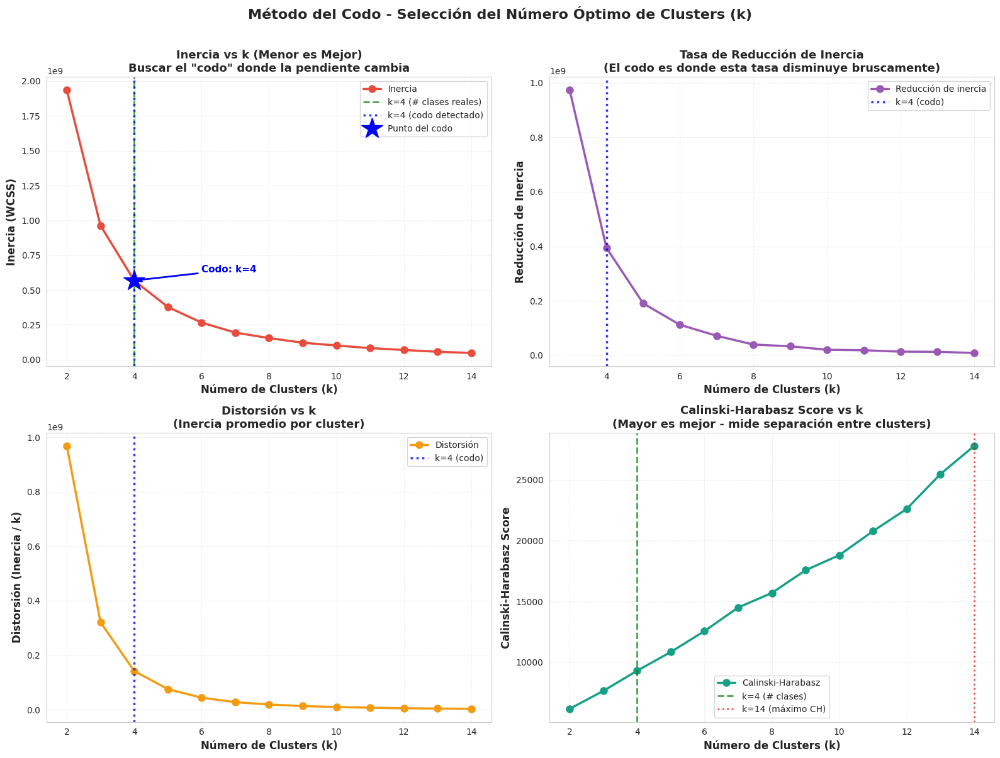


 Gráficas guardadas en 'metodo_codo_kmeans.png'

 TABLA RESUMEN DE MÉTRICAS (Conjunto de Entrenamiento)

  k      Inercia   Silhouette     Davies-B   Calinski-H     
------------------------------------------------------------
  2 1,935,864,219.50       0.6180       0.5457     6,171.25
  3 962,514,400.32       0.5977       0.5313     7,648.41
  4 568,051,984.80       0.5676       0.5232     9,298.19 ← 
  5 377,738,165.40       0.5642       0.5231    10,842.75
  6 265,819,670.97       0.5618       0.5219    12,562.55
  7 194,175,623.68       0.5709       0.5096    14,501.44
  8 154,741,318.00       0.5592       0.5141    15,697.27
  9 121,613,338.94       0.5565       0.5103    17,566.25
 10 101,304,933.47       0.5590       0.5016    18,802.31
 11 82,732,933.89       0.5587       0.5126    20,776.95
 12 69,264,742.03       0.5585       0.4793    22,602.32
 13 56,459,343.32       0.5590       0.4780    25,463.57
 14 47,843,162.25       0.5612       0.4823    27,778.35

 Resultados guar

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score
)
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "MÉTODO DEL CODO (ELBOW METHOD) - K-MEANS CLUSTERING")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ ES EL MÉTODO DEL CODO?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ ES EL MÉTODO DEL CODO?")
    print("="*90)
    print("""
   El Método del Codo es una técnica heurística para determinar el número
   óptimo de clusters (k) en K-Means.

    CONCEPTO CLAVE:
   • Grafica la INERCIA (WCSS - Within-Cluster Sum of Squares) vs k
   • La inercia mide qué tan compactos son los clusters
   • A mayor k, menor inercia (más clusters = puntos más cercanos a centroides)

    OBJETIVO:
   • Encontrar el "codo" en la curva
   • El codo es el punto donde agregar más clusters no reduce
     significativamente la inercia
   • Balancea entre compacidad de clusters y parsimonia del modelo

    TRADE-OFF:
   • Pocos clusters (k pequeño) → Alta inercia, clusters muy generales
   • Muchos clusters (k grande) → Baja inercia, pero overfitting
   • El codo encuentra el balance óptimo
    """)

    # ============================================================================
    #          EJECUCIÓN DEL MÉTODO DEL CODO (CORREGIDO)
    # ============================================================================

    print("\n" + "="*90)
    print(" EJECUTANDO ANÁLISIS DEL CODO (sobre conjunto de ENTRENAMIENTO)")
    print("="*90)

    # Rango de k a probar
    k_range = range(2, 15)

    print(f"\n Probando k desde {min(k_range)} hasta {max(k_range)}...")
    print("   (Esto puede tomar unos momentos)")
    print()

    # Almacenar resultados
    inertias = []
    silhouette_scores_list = []
    davies_bouldin_scores = []
    calinski_scores = []

    # Probar cada valor de k (SOBRE ENTRENAMIENTO)
    for k in k_range:
        print(f"   k={k:2d}...", end=' ', flush=True)

        # Entrenar K-Means
        kmeans = KMeans(
            n_clusters=k,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=8
        )
        kmeans.fit(X_train)

        # CORRECCIÓN: Obtener clusters del conjunto de ENTRENAMIENTO
        clusters_train = kmeans.labels_  # Más eficiente que predict

        # Calcular métricas SOBRE ENTRENAMIENTO
        inertias.append(kmeans.inertia_)
        silhouette_scores_list.append(silhouette_score(X_train, clusters_train))
        davies_bouldin_scores.append(davies_bouldin_score(X_train, clusters_train))
        calinski_scores.append(calinski_harabasz_score(X_train, clusters_train))

        print("✓")

    print(f"\n Análisis completado para {len(k_range)} valores de k")

    # ============================================================================
    #          DETECCIÓN AUTOMÁTICA DEL CODO
    # ============================================================================

    print("\n" + "="*90)
    print(" DETECCIÓN AUTOMÁTICA DEL CODO")
    print("="*90)

    print("""
    MÉTODO DE DETECCIÓN:
   Usamos el método de las segundas diferencias:

   1. Primera diferencia: tasa de cambio de inercia
      → Mide cuánto disminuye la inercia al aumentar k

   2. Segunda diferencia: cambio en la tasa de cambio
      → Mide dónde la reducción de inercia desacelera más

   3. El máximo de la segunda diferencia indica el "codo"
      → Es donde la curva cambia de pendiente pronunciada a suave
    """)

    # Calcular diferencias
    inertia_diffs = np.diff(inertias)
    inertia_diffs2 = np.diff(inertia_diffs)

    # El codo es donde la segunda derivada es máxima
    elbow_idx = np.argmax(inertia_diffs2) + 2
    elbow_k = list(k_range)[elbow_idx]

    print(f"\n RESULTADO:")
    print(f"   • k óptimo detectado: {elbow_k}")
    print(f"   • Inercia en k={elbow_k}: {inertias[elbow_idx]:,.2f}")

    if elbow_k == n_classes:
        print(f"    ¡Coincide exactamente con el número de clases reales ({n_classes})!")
    elif abs(elbow_k - n_classes) <= 1:
        print(f"   ✓ Muy cercano al número de clases reales ({n_classes})")
    else:
        print(f"    Difiere del número de clases reales ({n_classes})")
        print(f"      Esto puede indicar subestructuras en los datos")

    # ============================================================================
    #          VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Método del Codo - Selección del Número Óptimo de Clusters (k)',
                 fontsize=16, fontweight='bold', y=1.00)

    # ---- SUBPLOT 1: Inercia vs k ----
    ax1 = axes[0, 0]
    ax1.plot(k_range, inertias, 'o-', linewidth=2.5, markersize=8,
             color='#e74c3c', label='Inercia')

    ax1.axvline(x=n_classes, color='green', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={n_classes} (# clases reales)')

    ax1.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo detectado)')

    ax1.plot(elbow_k, inertias[elbow_idx], 'b*', markersize=25,
             label='Punto del codo', zorder=5)

    ax1.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Inercia (WCSS)', fontsize=12, fontweight='bold')
    ax1.set_title('Inercia vs k (Menor es Mejor)\n' +
                  'Buscar el "codo" donde la pendiente cambia',
                  fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.legend(fontsize=10, loc='best')

    ax1.annotate(f'Codo: k={elbow_k}',
                xy=(elbow_k, inertias[elbow_idx]),
                xytext=(elbow_k + 2, inertias[elbow_idx] * 1.1),
                arrowprops=dict(arrowstyle='->', color='blue', lw=2),
                fontsize=11, fontweight='bold', color='blue')

    # ---- SUBPLOT 2: Tasa de Reducción ----
    ax2 = axes[0, 1]
    rate_of_change = -np.diff(inertias)

    ax2.plot(list(k_range)[1:], rate_of_change, 'o-', linewidth=2.5,
             markersize=8, color='#9b59b6', label='Reducción de inercia')

    ax2.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo)')

    ax2.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Reducción de Inercia', fontsize=12, fontweight='bold')
    ax2.set_title('Tasa de Reducción de Inercia\n' +
                  '(El codo es donde esta tasa disminuye bruscamente)',
                  fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.legend(fontsize=10, loc='best')

    # ---- SUBPLOT 3: Distorsión ----
    ax3 = axes[1, 0]
    distortion = [inertia / k for inertia, k in zip(inertias, k_range)]

    ax3.plot(k_range, distortion, 'o-', linewidth=2.5, markersize=8,
             color='#f39c12', label='Distorsión')

    ax3.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo)')

    ax3.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Distorsión (Inercia / k)', fontsize=12, fontweight='bold')
    ax3.set_title('Distorsión vs k\n' +
                  '(Inercia promedio por cluster)',
                  fontsize=13, fontweight='bold')
    ax3.grid(True, alpha=0.3, linestyle='--')
    ax3.legend(fontsize=10, loc='best')

    # ---- SUBPLOT 4: Calinski-Harabasz ----
    ax4 = axes[1, 1]
    ax4.plot(k_range, calinski_scores, 'o-', linewidth=2.5, markersize=8,
             color='#16a085', label='Calinski-Harabasz')

    ax4.axvline(x=n_classes, color='green', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={n_classes} (# clases)')

    best_k_ch = k_range[np.argmax(calinski_scores)]
    ax4.axvline(x=best_k_ch, color='red', linestyle=':', linewidth=2,
                alpha=0.7, label=f'k={best_k_ch} (máximo CH)')

    ax4.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Calinski-Harabasz Score', fontsize=12, fontweight='bold')
    ax4.set_title('Calinski-Harabasz Score vs k\n' +
                  '(Mayor es mejor - mide separación entre clusters)',
                  fontsize=13, fontweight='bold')
    ax4.grid(True, alpha=0.3, linestyle='--')
    ax4.legend(fontsize=10, loc='best')

    plt.tight_layout()
    plt.savefig('metodo_codo_kmeans.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n Gráficas guardadas en 'metodo_codo_kmeans.png'")

    # ============================================================================
    #          TABLA RESUMEN
    # ============================================================================

    print("\n" + "="*90)
    print(" TABLA RESUMEN DE MÉTRICAS (Conjunto de Entrenamiento)")
    print("="*90)

    results_summary = pd.DataFrame({
        'k': list(k_range),
        'Inercia': inertias,
        'Silhouette': silhouette_scores_list,
        'Davies-Bouldin': davies_bouldin_scores,
        'Calinski-Harabasz': calinski_scores
    })

    print(f"\n{'k':>3} {'Inercia':>12} {'Silhouette':>12} {'Davies-B':>12} {'Calinski-H':>12} {'':>4}")
    print("-" * 60)

    for _, row in results_summary.iterrows():
        marker = " ← " if int(row['k']) == elbow_k else ""
        print(f"{int(row['k']):>3} {row['Inercia']:>12,.2f} "
              f"{row['Silhouette']:>12.4f} {row['Davies-Bouldin']:>12.4f} "
              f"{row['Calinski-Harabasz']:>12,.2f}{marker}")

    results_summary.to_csv('metodo_codo_resultados.csv', index=False)
    print("\n Resultados guardados en 'metodo_codo_resultados.csv'")

    # ============================================================================
    #          ENTRENAR MODELO FINAL CON K ÓPTIMO
    # ============================================================================

    print("\n" + "="*90)
    print(f" ENTRENANDO MODELO FINAL CON k={elbow_k}")
    print("="*90)

    print(f"\n Entrenando K-Means con k={elbow_k}...")

    # Entrenar modelo final
    kmeans_final = KMeans(
        n_clusters=elbow_k,
        init='k-means++',
        n_init=10,
        max_iter=300,
        random_state=8
    )
    kmeans_final.fit(X_train)

    print(" Modelo entrenado exitosamente")

    # ============================================================================
    #          EVALUACIÓN EN VALIDACIÓN Y PRUEBA
    # ============================================================================

    print("\n" + "="*90)
    print(" EVALUACIÓN DEL MODELO OPTIMIZADO")
    print("="*90)

    # Predecir en cada conjunto
    clusters_train = kmeans_final.labels_
    clusters_val = kmeans_final.predict(X_val)
    clusters_test = kmeans_final.predict(X_test)

    print("\n MÉTRICAS NO SUPERVISADAS (Calidad del Clustering)")
    print("="*90)

    # Función para calcular métricas no supervisadas
    def calculate_unsupervised_metrics(X, clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        inercia = kmeans_final.inertia_ if set_name == "Conjunto de ENTRENAMIENTO" else None
        silhouette = silhouette_score(X, clusters)
        davies_bouldin = davies_bouldin_score(X, clusters)
        calinski = calinski_harabasz_score(X, clusters)

        if inercia is not None:
            print(f"  • Inercia:                {inercia:,.2f}")
        print(f"  • Silhouette Score:       {silhouette:.4f}  (rango: [-1, 1], óptimo: cercano a 1)")
        print(f"  • Davies-Bouldin Index:   {davies_bouldin:.4f}  (óptimo: cercano a 0)")
        print(f"  • Calinski-Harabasz:      {calinski:,.2f}  (óptimo: mayor valor)")

        return {
            'Inercia': inercia,
            'Silhouette': silhouette,
            'Davies-Bouldin': davies_bouldin,
            'Calinski-Harabasz': calinski
        }

    # Calcular métricas para cada conjunto
    metrics_train = calculate_unsupervised_metrics(X_train, clusters_train, "Conjunto de ENTRENAMIENTO")
    metrics_val = calculate_unsupervised_metrics(X_val, clusters_val, "Conjunto de VALIDACIÓN")
    metrics_test = calculate_unsupervised_metrics(X_test, clusters_test, "Conjunto de PRUEBA")

    print("\n\n MÉTRICAS SUPERVISADAS (Comparación con Etiquetas Reales)")
    print("="*90)
    print("(Solo aplicables si tenemos etiquetas verdaderas)")

    # Función para calcular métricas supervisadas
    def calculate_supervised_metrics(y_true, clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        ari = adjusted_rand_score(y_true, clusters)
        nmi = normalized_mutual_info_score(y_true, clusters)
        homogeneity = homogeneity_score(y_true, clusters)
        completeness = completeness_score(y_true, clusters)
        v_measure = v_measure_score(y_true, clusters)

        print(f"  • Adjusted Rand Index (ARI):  {ari:.4f}  (rango: [-1, 1], óptimo: 1)")
        print(f"  • Normalized Mutual Info:     {nmi:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • Homogeneity:                 {homogeneity:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • Completeness:                {completeness:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • V-Measure:                   {v_measure:.4f}  (rango: [0, 1], óptimo: 1)")

        return {
            'ARI': ari,
            'NMI': nmi,
            'Homogeneity': homogeneity,
            'Completeness': completeness,
            'V-Measure': v_measure
        }

    # Calcular métricas supervisadas
    sup_metrics_train = calculate_supervised_metrics(y_train_encoded, clusters_train, "Conjunto de ENTRENAMIENTO")
    sup_metrics_val = calculate_supervised_metrics(y_val_encoded, clusters_val, "Conjunto de VALIDACIÓN")
    sup_metrics_test = calculate_supervised_metrics(y_test_encoded, clusters_test, "Conjunto de PRUEBA")

    # ============================================================================
    #          RESUMEN COMPARATIVO
    # ============================================================================

    print("\n\n" + "="*90)
    print(" RESUMEN COMPARATIVO - TODAS LAS MÉTRICAS")
    print("="*90)

    # Crear DataFrame comparativo
    comparison_df = pd.DataFrame({
        'Métrica': [
            'Silhouette Score',
            'Davies-Bouldin',
            'Calinski-Harabasz',
            'ARI',
            'NMI',
            'Homogeneity',
            'Completeness',
            'V-Measure'
        ],
        'Entrenamiento': [
            metrics_train['Silhouette'],
            metrics_train['Davies-Bouldin'],
            metrics_train['Calinski-Harabasz'],
            sup_metrics_train['ARI'],
            sup_metrics_train['NMI'],
            sup_metrics_train['Homogeneity'],
            sup_metrics_train['Completeness'],
            sup_metrics_train['V-Measure']
        ],
        'Validación': [
            metrics_val['Silhouette'],
            metrics_val['Davies-Bouldin'],
            metrics_val['Calinski-Harabasz'],
            sup_metrics_val['ARI'],
            sup_metrics_val['NMI'],
            sup_metrics_val['Homogeneity'],
            sup_metrics_val['Completeness'],
            sup_metrics_val['V-Measure']
        ],
        'Prueba': [
            metrics_test['Silhouette'],
            metrics_test['Davies-Bouldin'],
            metrics_test['Calinski-Harabasz'],
            sup_metrics_test['ARI'],
            sup_metrics_test['NMI'],
            sup_metrics_test['Homogeneity'],
            sup_metrics_test['Completeness'],
            sup_metrics_test['V-Measure']
        ]
    })

    print("\n")
    print(comparison_df.to_string(index=False))

    # Guardar resultados
    comparison_df.to_csv('metricas_modelo_optimizado.csv', index=False)
    print("\n Métricas guardadas en 'metricas_modelo_optimizado.csv'")

    # ============================================================================
    #          DISTRIBUCIÓN DE CLUSTERS
    # ============================================================================

    print("\n\n" + "="*90)
    print(" DISTRIBUCIÓN DE CLUSTERS")
    print("="*90)

    def print_cluster_distribution(clusters, y_true, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        unique, counts = np.unique(clusters, return_counts=True)
        print("\nTamaño de cada cluster:")
        for cluster_id, count in zip(unique, counts):
            percentage = (count / len(clusters)) * 100
            print(f"  Cluster {cluster_id}: {count:,} muestras ({percentage:.1f}%)")

        print(f"\nTotal: {len(clusters):,} muestras")

    print_cluster_distribution(clusters_train, y_train_encoded, "ENTRENAMIENTO")
    print_cluster_distribution(clusters_val, y_val_encoded, "VALIDACIÓN")
    print_cluster_distribution(clusters_test, y_test_encoded, "PRUEBA")

    # ============================================================================
    #          INTERPRETACIÓN FINAL
    # ============================================================================

    print("\n\n" + "="*90)
    print(" INTERPRETACIÓN Y CONCLUSIONES")
    print("="*90)

    print(f"""
    MODELO OPTIMIZADO CON k={elbow_k}

    CALIDAD DEL CLUSTERING (Métricas no supervisadas):
   • Silhouette Score:  {metrics_test['Silhouette']:.4f}
     → Indica qué tan bien definidos están los clusters
     → Valores cercanos a 1 son ideales

   • Davies-Bouldin:    {metrics_test['Davies-Bouldin']:.4f}
     → Mide la separación entre clusters
     → Valores cercanos a 0 son ideales

    COMPARACIÓN CON CLASES REALES (Métricas supervisadas):
   • Adjusted Rand Index: {sup_metrics_test['ARI']:.4f}
     → Mide similitud con las clases verdaderas
     → 1.0 = clustering perfecto, 0.0 = aleatorio

   • Normalized Mutual Info: {sup_metrics_test['NMI']:.4f}
     → Información compartida entre clusters y clases
     → 1.0 = información perfecta

    GENERALIZACIÓN:
   """)

    # Analizar generalización
    sil_diff = abs(metrics_train['Silhouette'] - metrics_test['Silhouette'])
    ari_diff = abs(sup_metrics_train['ARI'] - sup_metrics_test['ARI'])

    if sil_diff < 0.05 and ari_diff < 0.05:
        print("    EXCELENTE - El modelo generaliza muy bien")
        print("      Las métricas son consistentes entre entrenamiento y prueba")
    elif sil_diff < 0.1 and ari_diff < 0.1:
        print("   ✓ BUENO - El modelo generaliza adecuadamente")
        print("     Hay pequeñas diferencias entre conjuntos")
    else:
        print("    ATENCIÓN - Hay diferencias notables entre conjuntos")
        print("      Considerar revisar el preprocesamiento o k seleccionado")

    print("\n" + "="*90)
    print(" "*25 + "✓ ANÁLISIS COMPLETO FINALIZADO")
    print("="*90)






               MÉTODO DEL CODO (ELBOW METHOD) - K-MEANS CLUSTERING

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Features:               5
   • Número de clases:       4

 ¿QUÉ ES EL MÉTODO DEL CODO?

   El Método del Codo es una técnica heurística para determinar el número
   óptimo de clusters (k) en K-Means.

    CONCEPTO CLAVE:
   • Grafica la INERCIA (WCSS - Within-Cluster Sum of Squares) vs k
   • La inercia mide qué tan compactos son los clusters
   • A mayor k, menor inercia (más clusters = puntos más cercanos a centroides)

    OBJETIVO:
   • Encontrar el "codo" en la curva
   • El codo es el punto donde agregar más clusters no reduce
     significativamente la inercia
   • Balancea entre compacidad de clusters y parsimonia del modelo

    TRADE-OFF:
   • Pocos clusters (k pequeño) → Alta inercia, clusters muy generales
   • Muchos clusters (k grande) → Baja inercia, pero overfitting
   • El codo encuentra el balance óptim

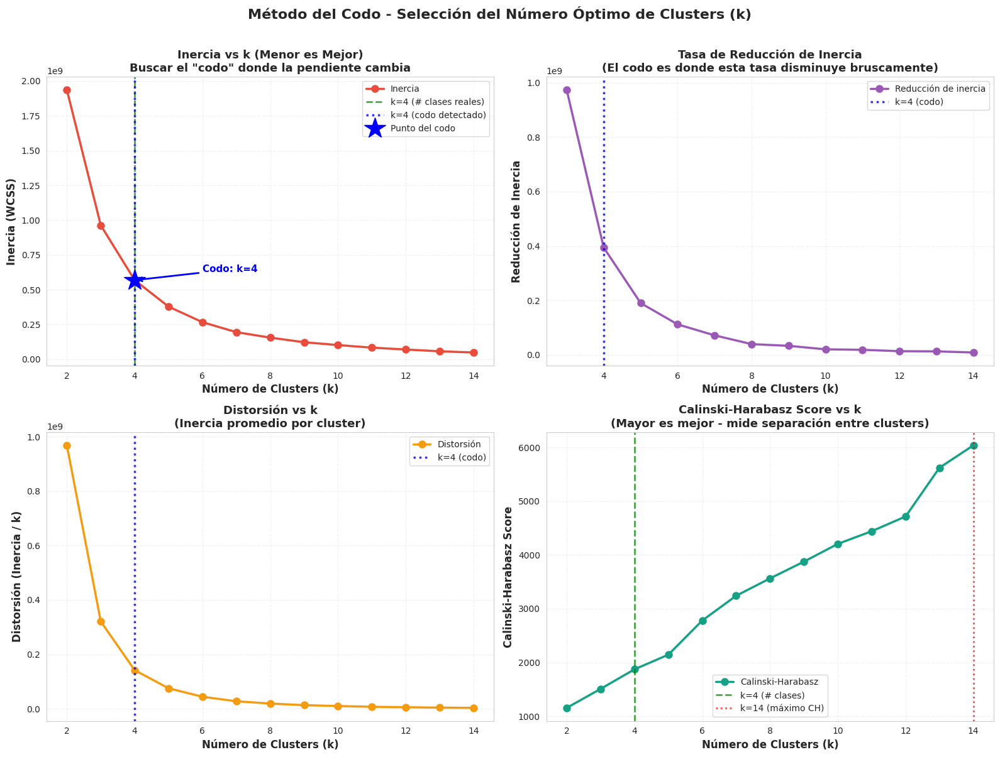


 Gráficas guardadas en 'metodo_codo_kmeans.png'

 TABLA RESUMEN DE MÉTRICAS

  k      Inercia   Silhouette     Davies-B   Calinski-H
-----------------------------------------------------
  2 1,935,864,219.50       0.5978       0.5812     1,154.93   
  3 962,514,400.32       0.5751       0.5523     1,508.27   
  4 568,051,984.80       0.5577       0.5351     1,872.35 = 
  5 377,738,165.40       0.5354       0.5343     2,144.83   
  6 265,819,670.97       0.5576       0.4967     2,779.93   
  7 194,175,623.68       0.5622       0.4847     3,240.80   
  8 154,741,318.00       0.5584       0.4898     3,563.93   
  9 121,613,338.94       0.5442       0.5097     3,875.64   
 10 101,304,933.47       0.5465       0.5013     4,205.94   
 11 82,732,933.89       0.5305       0.5199     4,441.53   
 12 69,264,742.03       0.5359       0.4904     4,716.06   
 13 56,459,343.32       0.5574       0.4814     5,622.97   
 14 47,843,162.25       0.5523       0.4908     6,038.98   

 Resultados guardado

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score
)
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "MÉTODO DEL CODO (ELBOW METHOD) - K-MEANS CLUSTERING")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ ES EL MÉTODO DEL CODO?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ ES EL MÉTODO DEL CODO?")
    print("="*90)
    print("""
   El Método del Codo es una técnica heurística para determinar el número
   óptimo de clusters (k) en K-Means.

    CONCEPTO CLAVE:
   • Grafica la INERCIA (WCSS - Within-Cluster Sum of Squares) vs k
   • La inercia mide qué tan compactos son los clusters
   • A mayor k, menor inercia (más clusters = puntos más cercanos a centroides)

    OBJETIVO:
   • Encontrar el "codo" en la curva
   • El codo es el punto donde agregar más clusters no reduce
     significativamente la inercia
   • Balancea entre compacidad de clusters y parsimonia del modelo

    TRADE-OFF:
   • Pocos clusters (k pequeño) → Alta inercia, clusters muy generales
   • Muchos clusters (k grande) → Baja inercia, pero overfitting
   • El codo encuentra el balance óptimo
    """)

    # ============================================================================
    #          EJECUCIÓN DEL MÉTODO DEL CODO
    # ============================================================================

    print("\n" + "="*90)
    print(" EJECUTANDO ANÁLISIS DEL CODO")
    print("="*90)

    # Rango de k a probar
    k_range = range(2, 15)

    print(f"\n Probando k desde {min(k_range)} hasta {max(k_range)}...")
    print("   (Esto puede tomar unos momentos)")
    print()

    # Almacenar resultados
    inertias = []
    silhouette_scores_list = []
    davies_bouldin_scores = []
    calinski_scores = []

    # Probar cada valor de k
    for k in k_range:
        print(f"    k={k:2d}...", end=' ', flush=True)

        # Entrenar K-Means
        kmeans = KMeans(
            n_clusters=k,
            init='k-means++',  # Inicialización inteligente
            n_init=10,          # 10 ejecuciones diferentes
            max_iter=300,       # Máximo 300 iteraciones
            random_state=8      # Reproducibilidad
        )
        kmeans.fit(X_train)

        # Predecir clusters en validación
        clusters = kmeans.predict(X_val)

        # Calcular métricas
        inertias.append(kmeans.inertia_)
        silhouette_scores_list.append(silhouette_score(X_val, clusters))
        davies_bouldin_scores.append(davies_bouldin_score(X_val, clusters))
        calinski_scores.append(calinski_harabasz_score(X_val, clusters))

        print("✓")

    print(f"\n Análisis completado para {len(k_range)} valores de k")

    # ============================================================================
    #          DETECCIÓN AUTOMÁTICA DEL CODO
    # ============================================================================

    print("\n" + "="*90)
    print(" DETECCIÓN AUTOMÁTICA DEL CODO")
    print("="*90)

    print("""
    MÉTODO DE DETECCIÓN:
   Usamos el método de las segundas diferencias:

   1. Primera diferencia: tasa de cambio de inercia
      → Mide cuánto disminuye la inercia al aumentar k

   2. Segunda diferencia: cambio en la tasa de cambio
      → Mide dónde la reducción de inercia desacelera más

   3. El máximo de la segunda diferencia indica el "codo"
      → Es donde la curva cambia de pendiente pronunciada a suave
    """)

    # Calcular diferencias
    inertia_diffs = np.diff(inertias)        # Primera derivada
    inertia_diffs2 = np.diff(inertia_diffs)  # Segunda derivada

    # El codo es donde la segunda derivada es máxima
    elbow_idx = np.argmax(inertia_diffs2) + 2  # +2 por las dos diferencias
    elbow_k = list(k_range)[elbow_idx]

    print(f"\n RESULTADO:")
    print(f"   • k óptimo detectado: {elbow_k}")
    print(f"   • Inercia en k={elbow_k}: {inertias[elbow_idx]:,.2f}")

    if elbow_k == n_classes:
        print(f"    ¡Coincide exactamente con el número de clases reales ({n_classes})!")
    elif abs(elbow_k - n_classes) <= 1:
        print(f"   ✓ Muy cercano al número de clases reales ({n_classes})")
    else:
        print(f"     Difiere del número de clases reales ({n_classes})")
        print(f"      Esto puede indicar subestructuras en los datos")

    # ============================================================================
    #          VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Método del Codo - Selección del Número Óptimo de Clusters (k)',
                 fontsize=16, fontweight='bold', y=1.00)

    # ---- SUBPLOT 1: Inercia vs k (Gráfica principal del codo) ----
    ax1 = axes[0, 0]
    ax1.plot(k_range, inertias, 'o-', linewidth=2.5, markersize=8,
             color='#e74c3c', label='Inercia')

    # Línea del número de clases reales
    ax1.axvline(x=n_classes, color='green', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={n_classes} (# clases reales)')

    # Línea del codo detectado
    ax1.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo detectado)')

    # Marcar el punto del codo
    ax1.plot(elbow_k, inertias[elbow_idx], 'b*', markersize=25,
             label='Punto del codo', zorder=5)

    ax1.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Inercia (WCSS)', fontsize=12, fontweight='bold')
    ax1.set_title('Inercia vs k (Menor es Mejor)\n' +
                  'Buscar el "codo" donde la pendiente cambia',
                  fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.legend(fontsize=10, loc='best')

    # Añadir anotación
    ax1.annotate(f'Codo: k={elbow_k}',
                xy=(elbow_k, inertias[elbow_idx]),
                xytext=(elbow_k + 2, inertias[elbow_idx] * 1.1),
                arrowprops=dict(arrowstyle='->', color='blue', lw=2),
                fontsize=11, fontweight='bold', color='blue')

    # ---- SUBPLOT 2: Tasa de Reducción de Inercia ----
    ax2 = axes[0, 1]
    rate_of_change = -np.diff(inertias)  # Cambio absoluto (hacerlo positivo)

    ax2.plot(list(k_range)[1:], rate_of_change, 'o-', linewidth=2.5,
             markersize=8, color='#9b59b6', label='Reducción de inercia')

    ax2.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo)')

    ax2.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Reducción de Inercia', fontsize=12, fontweight='bold')
    ax2.set_title('Tasa de Reducción de Inercia\n' +
                  '(El codo es donde esta tasa disminuye bruscamente)',
                  fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.legend(fontsize=10, loc='best')

    # ---- SUBPLOT 3: Distorsión (Inercia normalizada) ----
    ax3 = axes[1, 0]
    distortion = [inertia / k for inertia, k in zip(inertias, k_range)]

    ax3.plot(k_range, distortion, 'o-', linewidth=2.5, markersize=8,
             color='#f39c12', label='Distorsión')

    ax3.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo)')

    ax3.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Distorsión (Inercia / k)', fontsize=12, fontweight='bold')
    ax3.set_title('Distorsión vs k\n' +
                  '(Inercia promedio por cluster)',
                  fontsize=13, fontweight='bold')
    ax3.grid(True, alpha=0.3, linestyle='--')
    ax3.legend(fontsize=10, loc='best')

    # ---- SUBPLOT 4: Calinski-Harabasz Score ----
    ax4 = axes[1, 1]
    ax4.plot(k_range, calinski_scores, 'o-', linewidth=2.5, markersize=8,
             color='#16a085', label='Calinski-Harabasz')

    ax4.axvline(x=n_classes, color='green', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={n_classes} (# clases)')

    best_k_ch = k_range[np.argmax(calinski_scores)]
    ax4.axvline(x=best_k_ch, color='red', linestyle=':', linewidth=2,
                alpha=0.7, label=f'k={best_k_ch} (máximo CH)')

    ax4.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Calinski-Harabasz Score', fontsize=12, fontweight='bold')
    ax4.set_title('Calinski-Harabasz Score vs k\n' +
                  '(Mayor es mejor - mide separación entre clusters)',
                  fontsize=13, fontweight='bold')
    ax4.grid(True, alpha=0.3, linestyle='--')
    ax4.legend(fontsize=10, loc='best')

    plt.tight_layout()
    plt.savefig('metodo_codo_kmeans.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n Gráficas guardadas en 'metodo_codo_kmeans.png'")

    # ============================================================================
    #          TABLA RESUMEN
    # ============================================================================

    print("\n" + "="*90)
    print(" TABLA RESUMEN DE MÉTRICAS")
    print("="*90)

    # Crear DataFrame con resultados
    results_summary = pd.DataFrame({
        'k': list(k_range),
        'Inercia': inertias,
        'Silhouette': silhouette_scores_list,
        'Davies-Bouldin': davies_bouldin_scores,
        'Calinski-Harabasz': calinski_scores
    })

    # Formatear para visualización
    print(f"\n{'k':>3} {'Inercia':>12} {'Silhouette':>12} {'Davies-B':>12} {'Calinski-H':>12}")
    print("-" * 53)

    for _, row in results_summary.iterrows():
        marker = " = " if int(row['k']) == elbow_k else "   "
        print(f"{int(row['k']):>3} {row['Inercia']:>12,.2f} "
              f"{row['Silhouette']:>12.4f} {row['Davies-Bouldin']:>12.4f} "
              f"{row['Calinski-Harabasz']:>12,.2f}{marker}")

    # Guardar CSV
    results_summary.to_csv('metodo_codo_resultados.csv', index=False)
    print("\n Resultados guardados en 'metodo_codo_resultados.csv'")

    # ============================================================================
    #          INTERPRETACIÓN Y RECOMENDACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" INTERPRETACIÓN ")
    print("="*90)

    print(f"""
    ANÁLISIS DEL CODO:

   ✓ k óptimo según el codo: {elbow_k}

    MÉTRICAS PARA k={elbow_k}:
   • Inercia:            {inertias[elbow_idx]:,.2f}
   • Silhouette Score:   {silhouette_scores_list[elbow_idx]:.4f}
   • Davies-Bouldin:     {davies_bouldin_scores[elbow_idx]:.4f}
   • Calinski-Harabasz:  {calinski_scores[elbow_idx]:,.2f}

    COMPARACIÓN:
   • Número de clases reales: {n_classes}
   • Diferencia: {abs(elbow_k - n_classes)} cluster(s)

    RECOMENDACIÓN:
   """)

    if elbow_k == n_classes:
        print(f"    Usar k={elbow_k} (coincide con las clases reales)")
        print("      El método del codo confirma la estructura natural de los datos")
    elif elbow_k < n_classes:
        print(f"     El codo sugiere k={elbow_k}, menor que {n_classes} clases")
        print("      Posibles razones:")
        print("      • Algunas clases son muy similares y se agrupan naturalmente")
        print("      • Considerar usar k={elbow_k} si buscas grupos más generales")
    else:
        print(f"     El codo sugiere k={elbow_k}, mayor que {n_classes} clases")
        print("      Posibles razones:")
        print("      • Las clases tienen subestructuras internas")
        print("      • Los datos muestran agrupaciones más complejas")


    print("="*90)
    print(" "*25 + "✓ ANÁLISIS DEL CODO COMPLETADO")
    print("="*90)



               MÉTODO DEL CODO (ELBOW METHOD) - K-MEANS CLUSTERING

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ ES EL MÉTODO DEL CODO?


   El Método del Codo es una técnica heurística para determinar el número
   óptimo de clusters (k) en K-Means.

    CONCEPTO CLAVE:
   • Grafica la INERCIA (WCSS - Within-Cluster Sum of Squares) vs k
   • La inercia mide qué tan compactos son los clusters
   • A mayor k, menor inercia (más clusters = puntos más cercanos a centroides)

    OBJETIVO:
   • Encontrar el "codo" en la curva
   • El codo es el punto donde agregar más clusters no reduce
     significativamente la inercia
   • Balancea entre compacidad de clusters y parsimonia del modelo

    TRADE-OFF:
   • Pocos clusters (k pequeño) → Alta inercia, clusters muy generales
   • Muchos clusters (k grande) → Baja inercia, pero overfitting
   • 

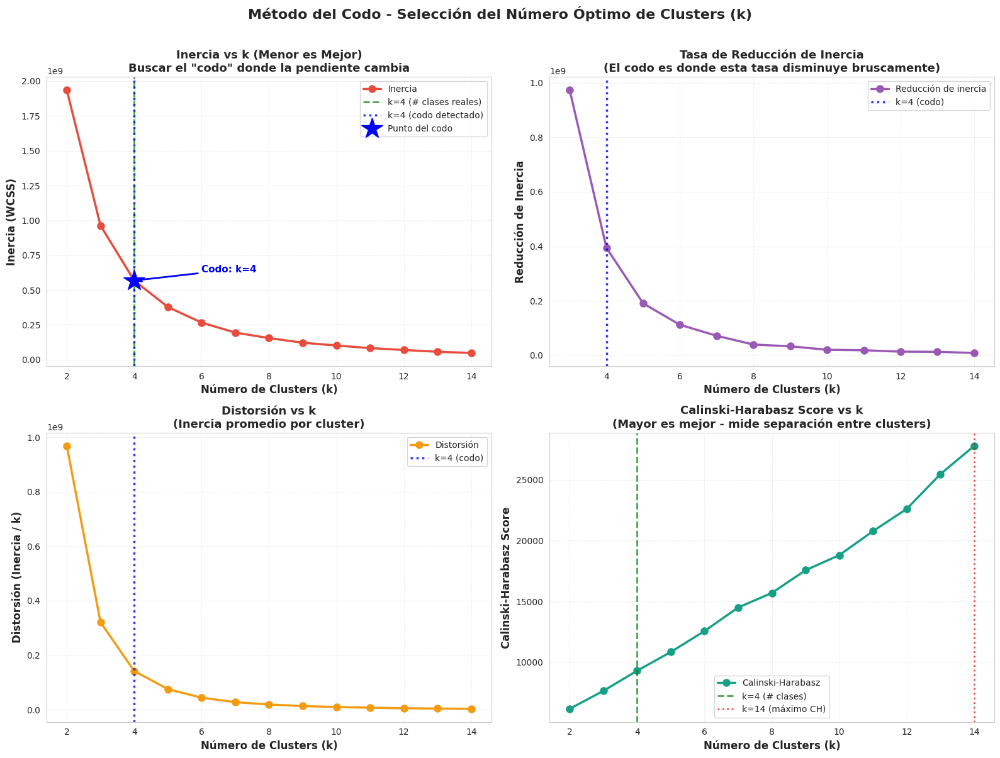


 TABLA RESUMEN DE MÉTRICAS (Conjunto de Entrenamiento)

  k      Inercia   Silhouette     Davies-B   Calinski-H     
------------------------------------------------------------
  2 1,935,864,219.50       0.6180       0.5457     6,171.25
  3 962,514,400.32       0.5977       0.5313     7,648.41
  4 568,051,984.80       0.5676       0.5232     9,298.19 ← 
  5 377,738,165.40       0.5642       0.5231    10,842.75
  6 265,819,670.97       0.5618       0.5219    12,562.55
  7 194,175,623.68       0.5709       0.5096    14,501.44
  8 154,741,318.00       0.5592       0.5141    15,697.27
  9 121,613,338.94       0.5565       0.5103    17,566.25
 10 101,304,933.47       0.5590       0.5016    18,802.31
 11 82,732,933.89       0.5587       0.5126    20,776.95
 12 69,264,742.03       0.5585       0.4793    22,602.32
 13 56,459,343.32       0.5590       0.4780    25,463.57
 14 47,843,162.25       0.5612       0.4823    27,778.35

 ENTRENANDO MODELO FINAL CON k=4

 Entrenando K-Means con k=4...


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score
)
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "MÉTODO DEL CODO (ELBOW METHOD) - K-MEANS CLUSTERING")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
    print("   Necesitas tener las variables: X_train, X_val, X_test, y_train, y_val, y_test")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ ES EL MÉTODO DEL CODO?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ ES EL MÉTODO DEL CODO?")
    print("="*90)
    print("""

   El Método del Codo es una técnica heurística para determinar el número
   óptimo de clusters (k) en K-Means.

    CONCEPTO CLAVE:
   • Grafica la INERCIA (WCSS - Within-Cluster Sum of Squares) vs k
   • La inercia mide qué tan compactos son los clusters
   • A mayor k, menor inercia (más clusters = puntos más cercanos a centroides)

    OBJETIVO:
   • Encontrar el "codo" en la curva
   • El codo es el punto donde agregar más clusters no reduce
     significativamente la inercia
   • Balancea entre compacidad de clusters y parsimonia del modelo

    TRADE-OFF:
   • Pocos clusters (k pequeño) → Alta inercia, clusters muy generales
   • Muchos clusters (k grande) → Baja inercia, pero overfitting
   • El codo encuentra el balance óptimo
    """)

    # ============================================================================
    #          EJECUCIÓN DEL MÉTODO DEL CODO (CORREGIDO)
    # ============================================================================

    print("\n" + "="*90)
    print(" EJECUTANDO ANÁLISIS DEL CODO (sobre conjunto de ENTRENAMIENTO)")
    print("="*90)

    # Rango de k a probar
    k_range = range(2, 15)

    print(f"\n Probando k desde {min(k_range)} hasta {max(k_range)}...")
    print("   (Esto puede tomar unos momentos)")
    print()

    # Almacenar resultados
    inertias = []
    silhouette_scores_list = []
    davies_bouldin_scores = []
    calinski_scores = []

    # Probar cada valor de k (SOBRE ENTRENAMIENTO)
    for k in k_range:
        print(f"   k={k:2d}...", end=' ', flush=True)

        # Entrenar K-Means
        kmeans = KMeans(
            n_clusters=k,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=8
        )
        kmeans.fit(X_train)

        # CORRECCIÓN: Obtener clusters del conjunto de ENTRENAMIENTO
        clusters_train = kmeans.labels_  # Más eficiente que predict

        # Calcular métricas SOBRE ENTRENAMIENTO
        inertias.append(kmeans.inertia_)
        silhouette_scores_list.append(silhouette_score(X_train, clusters_train))
        davies_bouldin_scores.append(davies_bouldin_score(X_train, clusters_train))
        calinski_scores.append(calinski_harabasz_score(X_train, clusters_train))

        print("✓")

    print(f"\n Análisis completado para {len(k_range)} valores de k")

    # ============================================================================
    #          DETECCIÓN AUTOMÁTICA DEL CODO
    # ============================================================================

    print("\n" + "="*90)
    print(" DETECCIÓN AUTOMÁTICA DEL CODO")
    print("="*90)

    print("""
    MÉTODO DE DETECCIÓN:
   Usamos el método de las segundas diferencias:

   1. Primera diferencia: tasa de cambio de inercia
      → Mide cuánto disminuye la inercia al aumentar k

   2. Segunda diferencia: cambio en la tasa de cambio
      → Mide dónde la reducción de inercia desacelera más

   3. El máximo de la segunda diferencia indica el "codo"
      → Es donde la curva cambia de pendiente pronunciada a suave
    """)

    # Calcular diferencias
    inertia_diffs = np.diff(inertias)
    inertia_diffs2 = np.diff(inertia_diffs)

    # El codo es donde la segunda derivada es máxima
    elbow_idx = np.argmax(inertia_diffs2) + 2
    elbow_k = list(k_range)[elbow_idx]

    print(f"\n RESULTADO:")
    print(f"   • k óptimo detectado: {elbow_k}")
    print(f"   • Inercia en k={elbow_k}: {inertias[elbow_idx]:,.2f}")

    if elbow_k == n_classes:
        print(f"    ¡Coincide exactamente con el número de clases reales ({n_classes})!")
    elif abs(elbow_k - n_classes) <= 1:
        print(f"   ✓ Muy cercano al número de clases reales ({n_classes})")
    else:
        print(f"    Difiere del número de clases reales ({n_classes})")
        print(f"      Esto puede indicar subestructuras en los datos")

    # ============================================================================
    #          VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Método del Codo - Selección del Número Óptimo de Clusters (k)',
                 fontsize=16, fontweight='bold', y=1.00)

    # ---- SUBPLOT 1: Inercia vs k ----
    ax1 = axes[0, 0]
    ax1.plot(k_range, inertias, 'o-', linewidth=2.5, markersize=8,
             color='#e74c3c', label='Inercia')

    ax1.axvline(x=n_classes, color='green', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={n_classes} (# clases reales)')

    ax1.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo detectado)')

    ax1.plot(elbow_k, inertias[elbow_idx], 'b*', markersize=25,
             label='Punto del codo', zorder=5)

    ax1.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Inercia (WCSS)', fontsize=12, fontweight='bold')
    ax1.set_title('Inercia vs k (Menor es Mejor)\n' +
                  'Buscar el "codo" donde la pendiente cambia',
                  fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.legend(fontsize=10, loc='best')

    ax1.annotate(f'Codo: k={elbow_k}',
                xy=(elbow_k, inertias[elbow_idx]),
                xytext=(elbow_k + 2, inertias[elbow_idx] * 1.1),
                arrowprops=dict(arrowstyle='->', color='blue', lw=2),
                fontsize=11, fontweight='bold', color='blue')

    # ---- SUBPLOT 2: Tasa de Reducción ----
    ax2 = axes[0, 1]
    rate_of_change = -np.diff(inertias)

    ax2.plot(list(k_range)[1:], rate_of_change, 'o-', linewidth=2.5,
             markersize=8, color='#9b59b6', label='Reducción de inercia')

    ax2.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo)')

    ax2.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Reducción de Inercia', fontsize=12, fontweight='bold')
    ax2.set_title('Tasa de Reducción de Inercia\n' +
                  '(El codo es donde esta tasa disminuye bruscamente)',
                  fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, linestyle='--')
    ax2.legend(fontsize=10, loc='best')

    # ---- SUBPLOT 3: Distorsión ----
    ax3 = axes[1, 0]
    distortion = [inertia / k for inertia, k in zip(inertias, k_range)]

    ax3.plot(k_range, distortion, 'o-', linewidth=2.5, markersize=8,
             color='#f39c12', label='Distorsión')

    ax3.axvline(x=elbow_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={elbow_k} (codo)')

    ax3.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Distorsión (Inercia / k)', fontsize=12, fontweight='bold')
    ax3.set_title('Distorsión vs k\n' +
                  '(Inercia promedio por cluster)',
                  fontsize=13, fontweight='bold')
    ax3.grid(True, alpha=0.3, linestyle='--')
    ax3.legend(fontsize=10, loc='best')

    # ---- SUBPLOT 4: Calinski-Harabasz ----
    ax4 = axes[1, 1]
    ax4.plot(k_range, calinski_scores, 'o-', linewidth=2.5, markersize=8,
             color='#16a085', label='Calinski-Harabasz')

    ax4.axvline(x=n_classes, color='green', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={n_classes} (# clases)')

    best_k_ch = k_range[np.argmax(calinski_scores)]
    ax4.axvline(x=best_k_ch, color='red', linestyle=':', linewidth=2,
                alpha=0.7, label=f'k={best_k_ch} (máximo CH)')

    ax4.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Calinski-Harabasz Score', fontsize=12, fontweight='bold')
    ax4.set_title('Calinski-Harabasz Score vs k\n' +
                  '(Mayor es mejor - mide separación entre clusters)',
                  fontsize=13, fontweight='bold')
    ax4.grid(True, alpha=0.3, linestyle='--')
    ax4.legend(fontsize=10, loc='best')

    plt.tight_layout()
    plt.savefig('metodo_codo_kmeans.png', dpi=300, bbox_inches='tight')
    plt.show()



    # ============================================================================
    #          TABLA RESUMEN
    # ============================================================================

    print("\n" + "="*90)
    print(" TABLA RESUMEN DE MÉTRICAS (Conjunto de Entrenamiento)")
    print("="*90)

    results_summary = pd.DataFrame({
        'k': list(k_range),
        'Inercia': inertias,
        'Silhouette': silhouette_scores_list,
        'Davies-Bouldin': davies_bouldin_scores,
        'Calinski-Harabasz': calinski_scores
    })

    print(f"\n{'k':>3} {'Inercia':>12} {'Silhouette':>12} {'Davies-B':>12} {'Calinski-H':>12} {'':>4}")
    print("-" * 60)

    for _, row in results_summary.iterrows():
        marker = " ← " if int(row['k']) == elbow_k else ""
        print(f"{int(row['k']):>3} {row['Inercia']:>12,.2f} "
              f"{row['Silhouette']:>12.4f} {row['Davies-Bouldin']:>12.4f} "
              f"{row['Calinski-Harabasz']:>12,.2f}{marker}")

    results_summary.to_csv('metodo_codo_resultados.csv', index=False)


    # ============================================================================
    #          ENTRENAR MODELO FINAL CON K ÓPTIMO
    # ============================================================================

    print("\n" + "="*90)
    print(f" ENTRENANDO MODELO FINAL CON k={elbow_k}")
    print("="*90)

    print(f"\n Entrenando K-Means con k={elbow_k}...")

    # Entrenar modelo final
    kmeans_final = KMeans(
        n_clusters=elbow_k,
        init='k-means++',
        n_init=10,
        max_iter=300,
        random_state=8
    )
    kmeans_final.fit(X_train)

    print(" Modelo entrenado exitosamente")

    # ============================================================================
    #          EVALUACIÓN EN VALIDACIÓN Y PRUEBA
    # ============================================================================

    print("\n" + "="*90)
    print(" EVALUACIÓN DEL MODELO OPTIMIZADO")
    print("="*90)

    # Predecir en cada conjunto
    clusters_train = kmeans_final.labels_
    clusters_val = kmeans_final.predict(X_val)
    clusters_test = kmeans_final.predict(X_test)

    print("\n MÉTRICAS NO SUPERVISADAS (Calidad del Clustering)")
    print("="*90)

    # Función para calcular métricas no supervisadas
    def calculate_unsupervised_metrics(X, clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        inercia = kmeans_final.inertia_ if set_name == "Conjunto de ENTRENAMIENTO" else None
        silhouette = silhouette_score(X, clusters)
        davies_bouldin = davies_bouldin_score(X, clusters)
        calinski = calinski_harabasz_score(X, clusters)

        if inercia is not None:
            print(f"  • Inercia:                {inercia:,.2f}")
        print(f"  • Silhouette Score:       {silhouette:.4f}  (rango: [-1, 1], óptimo: cercano a 1)")
        print(f"  • Davies-Bouldin Index:   {davies_bouldin:.4f}  (óptimo: cercano a 0)")
        print(f"  • Calinski-Harabasz:      {calinski:,.2f}  (óptimo: mayor valor)")

        return {
            'Inercia': inercia,
            'Silhouette': silhouette,
            'Davies-Bouldin': davies_bouldin,
            'Calinski-Harabasz': calinski
        }

    # Calcular métricas para cada conjunto
    metrics_train = calculate_unsupervised_metrics(X_train, clusters_train, "Conjunto de ENTRENAMIENTO")
    metrics_val = calculate_unsupervised_metrics(X_val, clusters_val, "Conjunto de VALIDACIÓN")
    metrics_test = calculate_unsupervised_metrics(X_test, clusters_test, "Conjunto de PRUEBA")

    print("\n\n MÉTRICAS SUPERVISADAS (Comparación con Etiquetas Reales)")
    print("="*90)
    print("(Solo aplicables si tenemos etiquetas verdaderas)")

    # Función para calcular métricas supervisadas
    def calculate_supervised_metrics(y_true, clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        ari = adjusted_rand_score(y_true, clusters)
        nmi = normalized_mutual_info_score(y_true, clusters)
        homogeneity = homogeneity_score(y_true, clusters)
        completeness = completeness_score(y_true, clusters)
        v_measure = v_measure_score(y_true, clusters)

        print(f"  • Adjusted Rand Index (ARI):  {ari:.4f}  (rango: [-1, 1], óptimo: 1)")
        print(f"  • Normalized Mutual Info:     {nmi:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • Homogeneity:                 {homogeneity:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • Completeness:                {completeness:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • V-Measure:                   {v_measure:.4f}  (rango: [0, 1], óptimo: 1)")

        return {
            'ARI': ari,
            'NMI': nmi,
            'Homogeneity': homogeneity,
            'Completeness': completeness,
            'V-Measure': v_measure
        }

    # Calcular métricas supervisadas
    sup_metrics_train = calculate_supervised_metrics(y_train_encoded, clusters_train, "Conjunto de ENTRENAMIENTO")
    sup_metrics_val = calculate_supervised_metrics(y_val_encoded, clusters_val, "Conjunto de VALIDACIÓN")
    sup_metrics_test = calculate_supervised_metrics(y_test_encoded, clusters_test, "Conjunto de PRUEBA")

    # ============================================================================
    #          RESUMEN COMPARATIVO
    # ============================================================================

    print("\n\n" + "="*90)
    print(" RESUMEN COMPARATIVO - TODAS LAS MÉTRICAS")
    print("="*90)

    # Crear DataFrame comparativo
    comparison_df = pd.DataFrame({
        'Métrica': [
            'Silhouette Score',
            'Davies-Bouldin',
            'Calinski-Harabasz',
            'ARI',
            'NMI',
            'Homogeneity',
            'Completeness',
            'V-Measure'
        ],
        'Entrenamiento': [
            metrics_train['Silhouette'],
            metrics_train['Davies-Bouldin'],
            metrics_train['Calinski-Harabasz'],
            sup_metrics_train['ARI'],
            sup_metrics_train['NMI'],
            sup_metrics_train['Homogeneity'],
            sup_metrics_train['Completeness'],
            sup_metrics_train['V-Measure']
        ],
        'Validación': [
            metrics_val['Silhouette'],
            metrics_val['Davies-Bouldin'],
            metrics_val['Calinski-Harabasz'],
            sup_metrics_val['ARI'],
            sup_metrics_val['NMI'],
            sup_metrics_val['Homogeneity'],
            sup_metrics_val['Completeness'],
            sup_metrics_val['V-Measure']
        ],
        'Prueba': [
            metrics_test['Silhouette'],
            metrics_test['Davies-Bouldin'],
            metrics_test['Calinski-Harabasz'],
            sup_metrics_test['ARI'],
            sup_metrics_test['NMI'],
            sup_metrics_test['Homogeneity'],
            sup_metrics_test['Completeness'],
            sup_metrics_test['V-Measure']
        ]
    })

    print("\n")
    print(comparison_df.to_string(index=False))

    # Guardar resultados
    comparison_df.to_csv('metricas_modelo_optimizado.csv', index=False)


    # ============================================================================
    #          DISTRIBUCIÓN DE CLUSTERS
    # ============================================================================

    print("\n\n" + "="*90)
    print(" DISTRIBUCIÓN DE CLUSTERS")
    print("="*90)

    def print_cluster_distribution(clusters, y_true, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        unique, counts = np.unique(clusters, return_counts=True)
        print("\nTamaño de cada cluster:")
        for cluster_id, count in zip(unique, counts):
            percentage = (count / len(clusters)) * 100
            print(f"  Cluster {cluster_id}: {count:,} muestras ({percentage:.1f}%)")

        print(f"\nTotal: {len(clusters):,} muestras")

    print_cluster_distribution(clusters_train, y_train_encoded, "ENTRENAMIENTO")
    print_cluster_distribution(clusters_val, y_val_encoded, "VALIDACIÓN")
    print_cluster_distribution(clusters_test, y_test_encoded, "PRUEBA")

    # ============================================================================
    #          INTERPRETACIÓN FINAL
    # ============================================================================

    print("\n\n" + "="*90)
    print(" INTERPRETACIÓN Y CONCLUSIONES")
    print("="*90)

    print(f"""
    MODELO OPTIMIZADO CON k={elbow_k}

    CALIDAD DEL CLUSTERING (Métricas no supervisadas):
   • Silhouette Score:  {metrics_test['Silhouette']:.4f}
     → Indica qué tan bien definidos están los clusters
     → Valores cercanos a 1 son ideales

   • Davies-Bouldin:    {metrics_test['Davies-Bouldin']:.4f}
     → Mide la separación entre clusters
     → Valores cercanos a 0 son ideales

    COMPARACIÓN CON CLASES REALES (Métricas supervisadas):
   • Adjusted Rand Index: {sup_metrics_test['ARI']:.4f}
     → Mide similitud con las clases verdaderas
     → 1.0 = clustering perfecto, 0.0 = aleatorio

   • Normalized Mutual Info: {sup_metrics_test['NMI']:.4f}
     → Información compartida entre clusters y clases
     → 1.0 = información perfecta

    GENERALIZACIÓN:
   """)

    # Analizar generalización
    sil_diff = abs(metrics_train['Silhouette'] - metrics_test['Silhouette'])
    ari_diff = abs(sup_metrics_train['ARI'] - sup_metrics_test['ARI'])

    if sil_diff < 0.05 and ari_diff < 0.05:
        print("    EXCELENTE - El modelo generaliza muy bien")
        print("      Las métricas son consistentes entre entrenamiento y prueba")
    elif sil_diff < 0.1 and ari_diff < 0.1:
        print("   ✓ BUENO - El modelo generaliza adecuadamente")
        print("     Hay pequeñas diferencias entre conjuntos")
    else:
        print("    ATENCIÓN - Hay diferencias notables entre conjuntos")
        print("      Considerar revisar el preprocesamiento o k seleccionado")

    print("\n" + "="*90)
    print(" "*25 + "✓ ANÁLISIS COMPLETO FINALIZADO")
    print("="*90)


## Curvas de Aprendizaje

                    CURVAS DE APRENDIZAJE - K-MEANS CLUSTERING

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ SON LAS CURVAS DE APRENDIZAJE EN CLUSTERING?

    Las curvas de aprendizaje muestran cómo el rendimiento del modelo cambia
    al variar el tamaño del conjunto de entrenamiento.

     OBJETIVO:
    • Evaluar si el modelo se beneficiaría de más datos
    • Detectar overfitting o underfitting
    • Entender la estabilidad del modelo

     INTERPRETACIÓN:
    • Brecha pequeña entre train y validación → Buen ajuste
    • Brecha grande → Posible overfitting
    • Ambas curvas bajas → Underfitting (necesita más complejidad)
    • Curvas convergiendo → Modelo estable

     PARA K-MEANS:
    • Evaluamos métricas no supervisadas (Silhouette, Davies-Bouldin)
    • Y métricas supervisadas (ARI, NMI) si tenemos etiquetas reales
    

 CONFIG

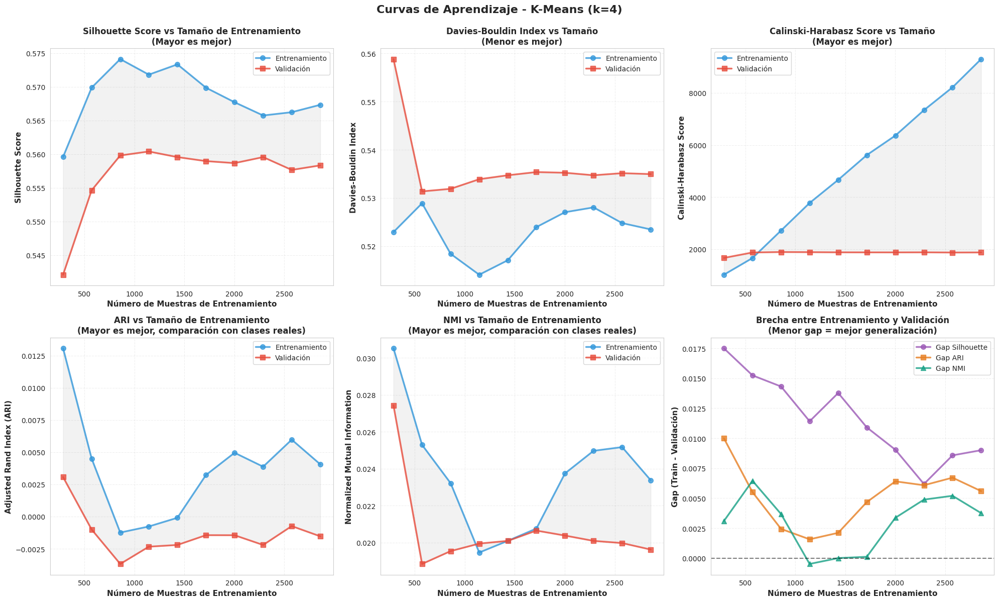


 TABLA RESUMEN - CURVAS DE APRENDIZAJE


 train_size  train_samples  train_silhouette  val_silhouette  train_davies_bouldin  val_davies_bouldin  train_calinski  val_calinski  train_ari  val_ari  train_nmi  val_nmi
     0.1000            286            0.5596          0.5421                0.5229              0.5588       1019.8328     1664.4519     0.0131   0.0031     0.0305   0.0274
     0.2000            572            0.5699          0.5546                0.5289              0.5314       1660.5581     1873.6633     0.0045  -0.0010     0.0253   0.0188
     0.3000            858            0.5741          0.5598                0.5184              0.5319       2717.1555     1890.9715    -0.0012  -0.0037     0.0232   0.0195
     0.4000           1144            0.5718          0.5604                0.5141              0.5339       3775.9625     1886.0834    -0.0008  -0.0023     0.0195   0.0199
     0.5000           1430            0.5733          0.5596                0.5171           

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score
)
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*20 + "CURVAS DE APRENDIZAJE - K-MEANS CLUSTERING")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
    print("   Necesitas tener: X_train, X_val, X_test, y_train, y_val, y_test")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ SON LAS CURVAS DE APRENDIZAJE?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ SON LAS CURVAS DE APRENDIZAJE EN CLUSTERING?")
    print("="*90)
    print("""
    Las curvas de aprendizaje muestran cómo el rendimiento del modelo cambia
    al variar el tamaño del conjunto de entrenamiento.

     OBJETIVO:
    • Evaluar si el modelo se beneficiaría de más datos
    • Detectar overfitting o underfitting
    • Entender la estabilidad del modelo

     INTERPRETACIÓN:
    • Brecha pequeña entre train y validación → Buen ajuste
    • Brecha grande → Posible overfitting
    • Ambas curvas bajas → Underfitting (necesita más complejidad)
    • Curvas convergiendo → Modelo estable

     PARA K-MEANS:
    • Evaluamos métricas no supervisadas (Silhouette, Davies-Bouldin)
    • Y métricas supervisadas (ARI, NMI) si tenemos etiquetas reales
    """)

    # ============================================================================
    #          CONFIGURACIÓN DE TAMAÑOS DE ENTRENAMIENTO
    # ============================================================================

    print("\n" + "="*90)
    print(" CONFIGURACIÓN DEL EXPERIMENTO")
    print("="*90)

    # Usar el k óptimo del método del codo (si existe) o el número de clases
    k_optimal = n_classes
    if 'elbow_k' in globals():
        k_optimal = elbow_k
        print(f"\n✓ Usando k={k_optimal} (del método del codo)")
    else:
        print(f"\n✓ Usando k={k_optimal} (número de clases reales)")

    # Definir tamaños de muestra (porcentajes del conjunto de entrenamiento)
    train_sizes = np.linspace(0.1, 1.0, 10)

    print(f"\n Tamaños de entrenamiento a evaluar:")
    print(f"   • Desde: {train_sizes[0]*100:.0f}% del conjunto de entrenamiento")
    print(f"   • Hasta: {train_sizes[-1]*100:.0f}% del conjunto de entrenamiento")
    print(f"   • Incrementos: {len(train_sizes)} puntos")
    print(f"   • Rango: {int(len(X_train)*train_sizes[0]):,} a {len(X_train):,} muestras")

    # ============================================================================
    #          EJECUCIÓN DE CURVAS DE APRENDIZAJE
    # ============================================================================

    print("\n" + "="*90)
    print(" EJECUTANDO CURVAS DE APRENDIZAJE")
    print("="*90)
    print("\n Entrenando modelos con diferentes tamaños de muestra...")
    print("   (Esto puede tomar varios minutos)\n")

    # Almacenar resultados
    results = {
        'train_size': [],
        'train_samples': [],
        # Métricas no supervisadas
        'train_silhouette': [],
        'val_silhouette': [],
        'train_davies_bouldin': [],
        'val_davies_bouldin': [],
        'train_calinski': [],
        'val_calinski': [],
        # Métricas supervisadas
        'train_ari': [],
        'val_ari': [],
        'train_nmi': [],
        'val_nmi': []
    }

    # Iterar sobre diferentes tamaños
    for i, size in enumerate(train_sizes, 1):
        n_samples = int(len(X_train) * size)

        print(f"   [{i:2d}/{len(train_sizes)}] Tamaño: {size*100:5.1f}% "
              f"({n_samples:,} muestras)...", end=' ', flush=True)

        # Crear subconjunto de entrenamiento
        indices = np.random.RandomState(42).choice(len(X_train), n_samples, replace=False)

        # Verificar si X_train es DataFrame o array
        if isinstance(X_train, pd.DataFrame):
            X_train_subset = X_train.iloc[indices]
        else:
            X_train_subset = X_train[indices]

        y_train_subset = y_train_encoded[indices]

        # Entrenar K-Means
        kmeans = KMeans(
            n_clusters=k_optimal,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=8
        )
        kmeans.fit(X_train_subset)

        # Predecir clusters
        clusters_train = kmeans.labels_
        clusters_val = kmeans.predict(X_val)

        # Calcular métricas no supervisadas - ENTRENAMIENTO
        train_sil = silhouette_score(X_train_subset, clusters_train)
        train_db = davies_bouldin_score(X_train_subset, clusters_train)
        train_ch = calinski_harabasz_score(X_train_subset, clusters_train)

        # Calcular métricas no supervisadas - VALIDACIÓN
        val_sil = silhouette_score(X_val, clusters_val)
        val_db = davies_bouldin_score(X_val, clusters_val)
        val_ch = calinski_harabasz_score(X_val, clusters_val)

        # Calcular métricas supervisadas - ENTRENAMIENTO
        train_ari = adjusted_rand_score(y_train_subset, clusters_train)
        train_nmi = normalized_mutual_info_score(y_train_subset, clusters_train)

        # Calcular métricas supervisadas - VALIDACIÓN
        val_ari = adjusted_rand_score(y_val_encoded, clusters_val)
        val_nmi = normalized_mutual_info_score(y_val_encoded, clusters_val)

        # Almacenar resultados
        results['train_size'].append(size)
        results['train_samples'].append(n_samples)
        results['train_silhouette'].append(train_sil)
        results['val_silhouette'].append(val_sil)
        results['train_davies_bouldin'].append(train_db)
        results['val_davies_bouldin'].append(val_db)
        results['train_calinski'].append(train_ch)
        results['val_calinski'].append(val_ch)
        results['train_ari'].append(train_ari)
        results['val_ari'].append(val_ari)
        results['train_nmi'].append(train_nmi)
        results['val_nmi'].append(val_nmi)

        print("✓")

    print("\n Curvas de aprendizaje completadas")

    # ============================================================================
    #          VISUALIZACIÓN DE CURVAS DE APRENDIZAJE
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    # Crear figura con 6 subplots (2 filas x 3 columnas)
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle(f'Curvas de Aprendizaje - K-Means (k={k_optimal})',
                 fontsize=16, fontweight='bold', y=0.995)

    train_samples = results['train_samples']

    # ---- SUBPLOT 1: Silhouette Score ----
    ax1 = axes[0, 0]
    ax1.plot(train_samples, results['train_silhouette'], 'o-', linewidth=2.5,
             markersize=7, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax1.plot(train_samples, results['val_silhouette'], 's-', linewidth=2.5,
             markersize=7, color='#e74c3c', label='Validación', alpha=0.8)
    ax1.fill_between(train_samples, results['train_silhouette'],
                      results['val_silhouette'], alpha=0.1, color='gray')
    ax1.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Silhouette Score', fontsize=11, fontweight='bold')
    ax1.set_title('Silhouette Score vs Tamaño de Entrenamiento\n(Mayor es mejor)',
                  fontsize=12, fontweight='bold')
    ax1.legend(fontsize=10, loc='best')
    ax1.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 2: Davies-Bouldin Index ----
    ax2 = axes[0, 1]
    ax2.plot(train_samples, results['train_davies_bouldin'], 'o-', linewidth=2.5,
             markersize=7, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax2.plot(train_samples, results['val_davies_bouldin'], 's-', linewidth=2.5,
             markersize=7, color='#e74c3c', label='Validación', alpha=0.8)
    ax2.fill_between(train_samples, results['train_davies_bouldin'],
                      results['val_davies_bouldin'], alpha=0.1, color='gray')
    ax2.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Davies-Bouldin Index', fontsize=11, fontweight='bold')
    ax2.set_title('Davies-Bouldin Index vs Tamaño\n(Menor es mejor)',
                  fontsize=12, fontweight='bold')
    ax2.legend(fontsize=10, loc='best')
    ax2.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 3: Calinski-Harabasz Score ----
    ax3 = axes[0, 2]
    ax3.plot(train_samples, results['train_calinski'], 'o-', linewidth=2.5,
             markersize=7, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax3.plot(train_samples, results['val_calinski'], 's-', linewidth=2.5,
             markersize=7, color='#e74c3c', label='Validación', alpha=0.8)
    ax3.fill_between(train_samples, results['train_calinski'],
                      results['val_calinski'], alpha=0.1, color='gray')
    ax3.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax3.set_ylabel('Calinski-Harabasz Score', fontsize=11, fontweight='bold')
    ax3.set_title('Calinski-Harabasz Score vs Tamaño\n(Mayor es mejor)',
                  fontsize=12, fontweight='bold')
    ax3.legend(fontsize=10, loc='best')
    ax3.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 4: Adjusted Rand Index ----
    ax4 = axes[1, 0]
    ax4.plot(train_samples, results['train_ari'], 'o-', linewidth=2.5,
             markersize=7, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax4.plot(train_samples, results['val_ari'], 's-', linewidth=2.5,
             markersize=7, color='#e74c3c', label='Validación', alpha=0.8)
    ax4.fill_between(train_samples, results['train_ari'],
                      results['val_ari'], alpha=0.1, color='gray')
    ax4.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax4.set_ylabel('Adjusted Rand Index (ARI)', fontsize=11, fontweight='bold')
    ax4.set_title('ARI vs Tamaño de Entrenamiento\n(Mayor es mejor, comparación con clases reales)',
                  fontsize=12, fontweight='bold')
    ax4.legend(fontsize=10, loc='best')
    ax4.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 5: Normalized Mutual Information ----
    ax5 = axes[1, 1]
    ax5.plot(train_samples, results['train_nmi'], 'o-', linewidth=2.5,
             markersize=7, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax5.plot(train_samples, results['val_nmi'], 's-', linewidth=2.5,
             markersize=7, color='#e74c3c', label='Validación', alpha=0.8)
    ax5.fill_between(train_samples, results['train_nmi'],
                      results['val_nmi'], alpha=0.1, color='gray')
    ax5.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Normalized Mutual Information', fontsize=11, fontweight='bold')
    ax5.set_title('NMI vs Tamaño de Entrenamiento\n(Mayor es mejor, comparación con clases reales)',
                  fontsize=12, fontweight='bold')
    ax5.legend(fontsize=10, loc='best')
    ax5.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 6: Gap entre Train y Validación ----
    ax6 = axes[1, 2]
    gap_sil = np.array(results['train_silhouette']) - np.array(results['val_silhouette'])
    gap_ari = np.array(results['train_ari']) - np.array(results['val_ari'])
    gap_nmi = np.array(results['train_nmi']) - np.array(results['val_nmi'])

    ax6.plot(train_samples, gap_sil, 'o-', linewidth=2.5, markersize=7,
             color='#9b59b6', label='Gap Silhouette', alpha=0.8)
    ax6.plot(train_samples, gap_ari, 's-', linewidth=2.5, markersize=7,
             color='#e67e22', label='Gap ARI', alpha=0.8)
    ax6.plot(train_samples, gap_nmi, '^-', linewidth=2.5, markersize=7,
             color='#16a085', label='Gap NMI', alpha=0.8)
    ax6.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
    ax6.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Gap (Train - Validación)', fontsize=11, fontweight='bold')
    ax6.set_title('Brecha entre Entrenamiento y Validación\n(Menor gap = mejor generalización)',
                  fontsize=12, fontweight='bold')
    ax6.legend(fontsize=10, loc='best')
    ax6.grid(True, alpha=0.3, linestyle='--')

    plt.tight_layout()
    plt.savefig('curvas_aprendizaje_kmeans.png', dpi=300, bbox_inches='tight')
    plt.show()

    # ============================================================================
    #          TABLA RESUMEN
    # ============================================================================

    print("\n" + "="*90)
    print(" TABLA RESUMEN - CURVAS DE APRENDIZAJE")
    print("="*90)

    results_df = pd.DataFrame(results)
    print("\n")
    print(results_df.to_string(index=False, float_format=lambda x: f'{x:.4f}'))

    # Guardar resultados
    results_df.to_csv('curvas_aprendizaje_resultados.csv', index=False)
    print("\n✓ Resultados guardados en 'curvas_aprendizaje_resultados.csv'")

    # ============================================================================
    #          ANÁLISIS DE CONVERGENCIA
    # ============================================================================

    print("\n" + "="*90)
    print(" ANÁLISIS DE CONVERGENCIA")
    print("="*90)

    # Calcular gaps finales
    final_gap_sil = abs(results['train_silhouette'][-1] - results['val_silhouette'][-1])
    final_gap_ari = abs(results['train_ari'][-1] - results['val_ari'][-1])
    final_gap_nmi = abs(results['train_nmi'][-1] - results['val_nmi'][-1])

    print(f"\n Gaps finales (con 100% de datos de entrenamiento):")
    print(f"   • Silhouette:  {final_gap_sil:.4f}")
    print(f"   • ARI:         {final_gap_ari:.4f}")
    print(f"   • NMI:         {final_gap_nmi:.4f}")

    # Calcular tendencias
    sil_trend = results['val_silhouette'][-1] - results['val_silhouette'][0]
    ari_trend = results['val_ari'][-1] - results['val_ari'][0]

    print(f"\n Mejora desde 10% hasta 100% de datos:")
    print(f"   • Silhouette (validación):  {sil_trend:+.4f}")
    print(f"   • ARI (validación):         {ari_trend:+.4f}")

    # ============================================================================
    #          INTERPRETACIÓN Y RECOMENDACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" INTERPRETACIÓN Y RECOMENDACIONES")
    print("="*90)

    print("\n DIAGNÓSTICO:\n")

    # Analizar convergencia
    avg_gap = (final_gap_sil + final_gap_ari + final_gap_nmi) / 3

    if avg_gap < 0.05:
        print("    EXCELENTE GENERALIZACIÓN")
        print("      • Gap muy pequeño entre entrenamiento y validación")
        print("      • El modelo generaliza muy bien a datos nuevos")
        print("      • No hay signos evidentes de overfitting")
    elif avg_gap < 0.10:
        print("   ✓ BUENA GENERALIZACIÓN")
        print("      • Gap moderado entre entrenamiento y validación")
        print("      • El modelo generaliza adecuadamente")
        print("      • Ligero overfitting, pero aceptable")
    else:
        print("     ATENCIÓN: GAP SIGNIFICATIVO")
        print("      • Hay diferencia notable entre train y validación")
        print("      • Posible overfitting en el conjunto de entrenamiento")

    print("\n TENDENCIAS:\n")

    # Analizar si las curvas convergen
    last_3_gaps_sil = gap_sil[-3:]
    is_converging = all(abs(last_3_gaps_sil[i]) <= abs(last_3_gaps_sil[i-1]) + 0.01
                        for i in range(1, len(last_3_gaps_sil)))

    if is_converging:
        print("   ✓ Las curvas están convergiendo")
        print("      • El gap se reduce o se mantiene estable")
        print("      • El tamaño actual de datos es probablemente suficiente")
    else:
        print("   → Las curvas aún no han convergido completamente")
        print("      • Más datos podrían mejorar el rendimiento")
        print("      • Considera aumentar el conjunto de entrenamiento si es posible")

    # Analizar mejora con más datos
    if sil_trend > 0.01 or ari_trend > 0.01:
        print("\n    El modelo mejora notablemente con más datos")
        print("      • Recolectar más datos podría ser beneficioso")
    else:
        print("\n   → El modelo se mantiene estable con diferentes tamaños")
        print("      • Ya has alcanzado un buen balance")

    print("\n" + "="*90)
    print(" "*25 + "✓ ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETO")
    print("="*90)

## Silueta

               MÉTODO DE SILUETA (SILHOUETTE METHOD) - K-MEANS CLUSTERING

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ ES EL MÉTODO DE SILUETA?

   El Método de Silueta es una técnica para evaluar la calidad del clustering
   y determinar el número óptimo de clusters (k) en K-Means.

    COEFICIENTE DE SILUETA:
   Para cada punto i, se calcula:

   s(i) = (b(i) - a(i)) / max(a(i), b(i))

   Donde:
   • a(i) = distancia promedio a puntos en su mismo cluster
   • b(i) = distancia promedio al cluster más cercano

   Rango: [-1, 1]
   •  1.0 = punto perfectamente asignado
   •  0.0 = punto en la frontera entre clusters
   • -1.0 = punto probablemente mal asignado

    VENTAJAS SOBRE EL MÉTODO DEL CODO:
   • Métrica más interpretable (calidad del clustering)
   • Considera tanto cohesión como separación
   • Detecta clustering pobre (valore

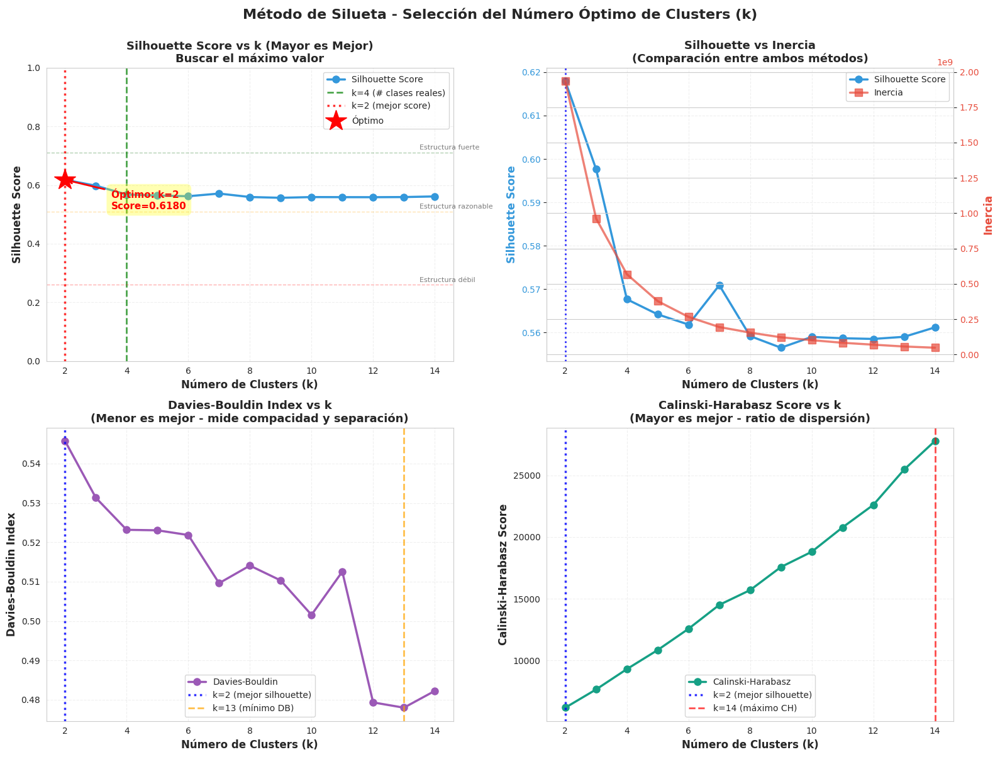


 Generando gráficas de silueta detalladas para k seleccionados...


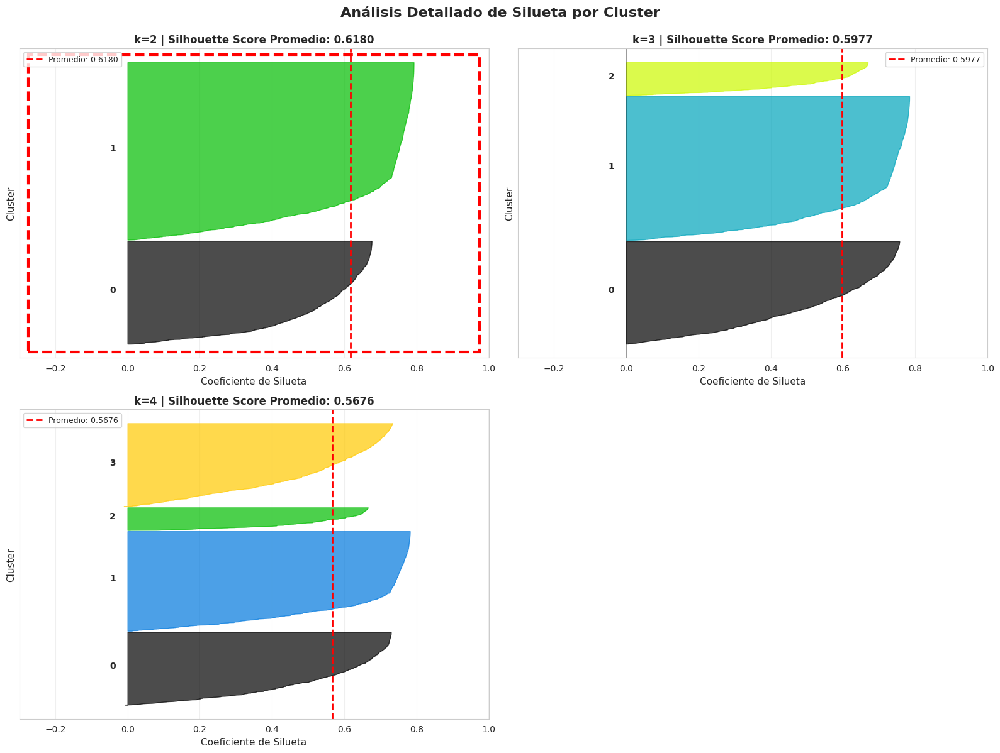


 TABLA RESUMEN DE MÉTRICAS (Conjunto de Entrenamiento)

  k   Silhouette      Inercia     Davies-B   Calinski-H     
------------------------------------------------------------
  2       0.6180 1,935,864,219.50       0.5457     6,171.25 ← 
  3       0.5977 962,514,400.32       0.5313     7,648.41
  4       0.5676 568,051,984.80       0.5232     9,298.19
  5       0.5642 377,738,165.40       0.5231    10,842.75
  6       0.5618 265,819,670.97       0.5219    12,562.55
  7       0.5709 194,175,623.68       0.5096    14,501.44
  8       0.5592 154,741,318.00       0.5141    15,697.27
  9       0.5565 121,613,338.94       0.5103    17,566.25
 10       0.5590 101,304,933.47       0.5016    18,802.31
 11       0.5587 82,732,933.89       0.5126    20,776.95
 12       0.5585 69,264,742.03       0.4793    22,602.32
 13       0.5590 56,459,343.32       0.4780    25,463.57
 14       0.5612 47,843,162.25       0.4823    27,778.35

 ENTRENANDO MODELO FINAL CON k=2

 Entrenando K-Means con k=2...


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    silhouette_samples,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score
)
from sklearn.preprocessing import LabelEncoder
import matplotlib.cm as cm
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "MÉTODO DE SILUETA (SILHOUETTE METHOD) - K-MEANS CLUSTERING")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")

else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ ES EL MÉTODO DE SILUETA?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ ES EL MÉTODO DE SILUETA?")
    print("="*90)
    print("""
   El Método de Silueta es una técnica para evaluar la calidad del clustering
   y determinar el número óptimo de clusters (k) en K-Means.

    COEFICIENTE DE SILUETA:
   Para cada punto i, se calcula:

   s(i) = (b(i) - a(i)) / max(a(i), b(i))

   Donde:
   • a(i) = distancia promedio a puntos en su mismo cluster
   • b(i) = distancia promedio al cluster más cercano

   Rango: [-1, 1]
   •  1.0 = punto perfectamente asignado
   •  0.0 = punto en la frontera entre clusters
   • -1.0 = punto probablemente mal asignado

    VENTAJAS SOBRE EL MÉTODO DEL CODO:
   • Métrica más interpretable (calidad del clustering)
   • Considera tanto cohesión como separación
   • Detecta clustering pobre (valores negativos)
   • Menos ambiguo que buscar un "codo" visual

    INTERPRETACIÓN DEL SCORE PROMEDIO:
   • 0.71 - 1.00: Estructura fuerte
   • 0.51 - 0.70: Estructura razonable
   • 0.26 - 0.50: Estructura débil
   • < 0.25:      Sin estructura substancial
    """)

    # ============================================================================
    #          EJECUCIÓN DEL MÉTODO DE SILUETA
    # ============================================================================

    print("\n" + "="*90)
    print(" EJECUTANDO ANÁLISIS DE SILUETA (sobre conjunto de ENTRENAMIENTO)")
    print("="*90)

    # Rango de k a probar
    k_range = range(2, 15)

    print(f"\n Probando k desde {min(k_range)} hasta {max(k_range)}...")
    print("   (Esto puede tomar unos momentos)")
    print()

    # Almacenar resultados
    silhouette_scores_list = []
    inertias = []
    davies_bouldin_scores = []
    calinski_scores = []

    # Almacenar modelos para análisis detallado
    kmeans_models = {}

    # Probar cada valor de k (SOBRE ENTRENAMIENTO)
    for k in k_range:
        print(f"   k={k:2d}...", end=' ', flush=True)

        # Entrenar K-Means
        kmeans = KMeans(
            n_clusters=k,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=8
        )
        kmeans.fit(X_train)

        # Obtener clusters del conjunto de ENTRENAMIENTO
        clusters_train = kmeans.labels_

        # Calcular métricas SOBRE ENTRENAMIENTO
        silhouette_avg = silhouette_score(X_train, clusters_train)
        silhouette_scores_list.append(silhouette_avg)
        inertias.append(kmeans.inertia_)
        davies_bouldin_scores.append(davies_bouldin_score(X_train, clusters_train))
        calinski_scores.append(calinski_harabasz_score(X_train, clusters_train))

        # Guardar modelo
        kmeans_models[k] = kmeans

        print(f"✓ (Silhouette: {silhouette_avg:.4f})")

    print(f"\n Análisis completado para {len(k_range)} valores de k")

    # ============================================================================
    #          SELECCIÓN DEL K ÓPTIMO
    # ============================================================================

    print("\n" + "="*90)
    print(" SELECCIÓN DEL K ÓPTIMO")
    print("="*90)

    # Encontrar el k con mayor silhouette score
    best_idx = np.argmax(silhouette_scores_list)
    best_k = list(k_range)[best_idx]
    best_silhouette = silhouette_scores_list[best_idx]

    print(f"\n RESULTADO:")
    print(f"   • k óptimo: {best_k}")
    print(f"   • Silhouette Score: {best_silhouette:.4f}")

    # Interpretación del score
    if best_silhouette >= 0.71:
        quality = "EXCELENTE - Estructura fuerte"
        emoji = "🌟"
    elif best_silhouette >= 0.51:
        quality = "BUENO - Estructura razonable"
        emoji = "✓"
    elif best_silhouette >= 0.26:
        quality = "REGULAR - Estructura débil"
        emoji = "⚠️"
    else:
        quality = "POBRE - Sin estructura substancial"
        emoji = "❌"

    print(f"   • Calidad: {emoji} {quality}")

    if best_k == n_classes:
        print(f"\n    ¡Coincide exactamente con el número de clases reales ({n_classes})!")
    elif abs(best_k - n_classes) <= 1:
        print(f"\n   ✓ Muy cercano al número de clases reales ({n_classes})")
    else:
        print(f"\n    Difiere del número de clases reales ({n_classes})")
        print(f"      Diferencia: {abs(best_k - n_classes)} cluster(s)")

    # ============================================================================
    #          VISUALIZACIÓN 1: GRÁFICAS DE COMPARACIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Método de Silueta - Selección del Número Óptimo de Clusters (k)',
                 fontsize=16, fontweight='bold', y=1.00)

    # ---- SUBPLOT 1: Silhouette Score vs k ----
    ax1 = axes[0, 0]
    ax1.plot(k_range, silhouette_scores_list, 'o-', linewidth=2.5, markersize=8,
             color='#3498db', label='Silhouette Score')

    ax1.axvline(x=n_classes, color='green', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={n_classes} (# clases reales)')

    ax1.axvline(x=best_k, color='red', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={best_k} (mejor score)')

    ax1.plot(best_k, best_silhouette, 'r*', markersize=25,
             label='Óptimo', zorder=5)

    # Líneas de referencia para interpretación
    ax1.axhline(y=0.71, color='darkgreen', linestyle='--', alpha=0.3, linewidth=1)
    ax1.text(max(k_range)-0.5, 0.72, 'Estructura fuerte', fontsize=8, alpha=0.6)
    ax1.axhline(y=0.51, color='orange', linestyle='--', alpha=0.3, linewidth=1)
    ax1.text(max(k_range)-0.5, 0.52, 'Estructura razonable', fontsize=8, alpha=0.6)
    ax1.axhline(y=0.26, color='red', linestyle='--', alpha=0.3, linewidth=1)
    ax1.text(max(k_range)-0.5, 0.27, 'Estructura débil', fontsize=8, alpha=0.6)

    ax1.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Silhouette Score', fontsize=12, fontweight='bold')
    ax1.set_title('Silhouette Score vs k (Mayor es Mejor)\n' +
                  'Buscar el máximo valor',
                  fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.legend(fontsize=10, loc='best')
    ax1.set_ylim([0, 1])

    ax1.annotate(f'Óptimo: k={best_k}\nScore={best_silhouette:.4f}',
                xy=(best_k, best_silhouette),
                xytext=(best_k + 1.5, best_silhouette - 0.1),
                arrowprops=dict(arrowstyle='->', color='red', lw=2),
                fontsize=11, fontweight='bold', color='red',
                bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.3))

    # ---- SUBPLOT 2: Comparación con Inercia ----
    ax2 = axes[0, 1]
    ax2_twin = ax2.twinx()

    line1 = ax2.plot(k_range, silhouette_scores_list, 'o-', linewidth=2.5,
                     markersize=8, color='#3498db', label='Silhouette Score')
    line2 = ax2_twin.plot(k_range, inertias, 's-', linewidth=2.5,
                          markersize=8, color='#e74c3c', label='Inercia', alpha=0.7)

    ax2.axvline(x=best_k, color='blue', linestyle=':', linewidth=2,
                alpha=0.8, label=f'k={best_k} (mejor silhouette)')

    ax2.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Silhouette Score', fontsize=12, fontweight='bold', color='#3498db')
    ax2_twin.set_ylabel('Inercia', fontsize=12, fontweight='bold', color='#e74c3c')
    ax2.set_title('Silhouette vs Inercia\n' +
                  '(Comparación entre ambos métodos)',
                  fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3, linestyle='--')

    # Combinar leyendas
    lines = line1 + line2
    labels = [l.get_label() for l in lines]
    ax2.legend(lines, labels, fontsize=10, loc='upper right')

    ax2.tick_params(axis='y', labelcolor='#3498db')
    ax2_twin.tick_params(axis='y', labelcolor='#e74c3c')

    # ---- SUBPLOT 3: Davies-Bouldin Index ----
    ax3 = axes[1, 0]
    ax3.plot(k_range, davies_bouldin_scores, 'o-', linewidth=2.5, markersize=8,
             color='#9b59b6', label='Davies-Bouldin')

    ax3.axvline(x=best_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={best_k} (mejor silhouette)')

    best_k_db = k_range[np.argmin(davies_bouldin_scores)]
    ax3.axvline(x=best_k_db, color='orange', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={best_k_db} (mínimo DB)')

    ax3.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax3.set_ylabel('Davies-Bouldin Index', fontsize=12, fontweight='bold')
    ax3.set_title('Davies-Bouldin Index vs k\n' +
                  '(Menor es mejor - mide compacidad y separación)',
                  fontsize=13, fontweight='bold')
    ax3.grid(True, alpha=0.3, linestyle='--')
    ax3.legend(fontsize=10, loc='best')

    # ---- SUBPLOT 4: Calinski-Harabasz Score ----
    ax4 = axes[1, 1]
    ax4.plot(k_range, calinski_scores, 'o-', linewidth=2.5, markersize=8,
             color='#16a085', label='Calinski-Harabasz')

    ax4.axvline(x=best_k, color='blue', linestyle=':', linewidth=2.5,
                alpha=0.8, label=f'k={best_k} (mejor silhouette)')

    best_k_ch = k_range[np.argmax(calinski_scores)]
    ax4.axvline(x=best_k_ch, color='red', linestyle='--', linewidth=2,
                alpha=0.7, label=f'k={best_k_ch} (máximo CH)')

    ax4.set_xlabel('Número de Clusters (k)', fontsize=12, fontweight='bold')
    ax4.set_ylabel('Calinski-Harabasz Score', fontsize=12, fontweight='bold')
    ax4.set_title('Calinski-Harabasz Score vs k\n' +
                  '(Mayor es mejor - ratio de dispersión)',
                  fontsize=13, fontweight='bold')
    ax4.grid(True, alpha=0.3, linestyle='--')
    ax4.legend(fontsize=10, loc='best')

    plt.tight_layout()
    plt.savefig('metodo_silueta_comparacion.png', dpi=300, bbox_inches='tight')
    plt.show()


    # ============================================================================
    #          VISUALIZACIÓN 2: GRÁFICAS DE SILUETA DETALLADAS
    # ============================================================================

    print("\n Generando gráficas de silueta detalladas para k seleccionados...")

    # Seleccionar k's para visualización detallada
    k_to_visualize = [best_k]
    if n_classes not in k_to_visualize:
        k_to_visualize.append(n_classes)
    if best_k - 1 >= 2 and (best_k - 1) not in k_to_visualize:
        k_to_visualize.append(best_k - 1)
    if best_k + 1 <= max(k_range) and (best_k + 1) not in k_to_visualize:
        k_to_visualize.append(best_k + 1)

    k_to_visualize = sorted(k_to_visualize)[:4]  # Máximo 4 gráficas

    n_plots = len(k_to_visualize)
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Análisis Detallado de Silueta por Cluster',
                 fontsize=16, fontweight='bold', y=0.995)

    for idx, k in enumerate(k_to_visualize):
        ax = axes[idx // 2, idx % 2]

        # Obtener el modelo y clusters
        kmeans = kmeans_models[k]
        cluster_labels = kmeans.labels_
        silhouette_avg = silhouette_scores_list[list(k_range).index(k)]

        # Calcular valores de silueta para cada muestra
        sample_silhouette_values = silhouette_samples(X_train, cluster_labels)

        y_lower = 10
        for i in range(k):
            # Obtener valores de silueta para cluster i
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / k)
            ax.fill_betweenx(np.arange(y_lower, y_upper),
                            0, ith_cluster_silhouette_values,
                            facecolor=color, edgecolor=color, alpha=0.7)

            # Etiqueta con el número de cluster en el medio
            ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i),
                   fontsize=10, fontweight='bold')

            y_lower = y_upper + 10

        ax.set_title(f'k={k} | Silhouette Score Promedio: {silhouette_avg:.4f}',
                    fontsize=12, fontweight='bold')
        ax.set_xlabel('Coeficiente de Silueta', fontsize=11)
        ax.set_ylabel('Cluster', fontsize=11)

        # Línea vertical para el score promedio
        ax.axvline(x=silhouette_avg, color="red", linestyle="--", linewidth=2,
                  label=f'Promedio: {silhouette_avg:.4f}')

        # Línea en x=0
        ax.axvline(x=0, color="black", linestyle="-", linewidth=0.5, alpha=0.5)

        ax.set_yticks([])
        ax.set_xlim([-0.3, 1])
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3, axis='x')

        # Añadir anotación
        if k == best_k:
            ax.add_patch(plt.Rectangle((0.02, 0.02), 0.96, 0.96,
                                      transform=ax.transAxes,
                                      fill=False, edgecolor='red',
                                      linewidth=3, linestyle='--'))

    # Ocultar subplots no usados
    for idx in range(n_plots, 4):
        axes[idx // 2, idx % 2].axis('off')

    plt.tight_layout()
    plt.savefig('metodo_silueta_detallado.png', dpi=300, bbox_inches='tight')
    plt.show()


    # ============================================================================
    #          TABLA RESUMEN
    # ============================================================================

    print("\n" + "="*90)
    print(" TABLA RESUMEN DE MÉTRICAS (Conjunto de Entrenamiento)")
    print("="*90)

    results_summary = pd.DataFrame({
        'k': list(k_range),
        'Silhouette': silhouette_scores_list,
        'Inercia': inertias,
        'Davies-Bouldin': davies_bouldin_scores,
        'Calinski-Harabasz': calinski_scores
    })

    print(f"\n{'k':>3} {'Silhouette':>12} {'Inercia':>12} {'Davies-B':>12} {'Calinski-H':>12} {'':>4}")
    print("-" * 60)

    for _, row in results_summary.iterrows():
        marker = " ← " if int(row['k']) == best_k else ""
        print(f"{int(row['k']):>3} {row['Silhouette']:>12.4f} {row['Inercia']:>12,.2f} "
              f"{row['Davies-Bouldin']:>12.4f} {row['Calinski-Harabasz']:>12,.2f}{marker}")

    results_summary.to_csv('metodo_silueta_resultados.csv', index=False)


    # ============================================================================
    #          ENTRENAR MODELO FINAL CON K ÓPTIMO
    # ============================================================================

    print("\n" + "="*90)
    print(f" ENTRENANDO MODELO FINAL CON k={best_k}")
    print("="*90)

    print(f"\n Entrenando K-Means con k={best_k}...")

    # Usar el modelo ya entrenado
    kmeans_final = kmeans_models[best_k]

    print(" Modelo entrenado exitosamente")

    # ============================================================================
    #          EVALUACIÓN EN VALIDACIÓN Y PRUEBA
    # ============================================================================

    print("\n" + "="*90)
    print(" EVALUACIÓN DEL MODELO OPTIMIZADO")
    print("="*90)

    # Predecir en cada conjunto
    clusters_train = kmeans_final.labels_
    clusters_val = kmeans_final.predict(X_val)
    clusters_test = kmeans_final.predict(X_test)

    print("\n MÉTRICAS NO SUPERVISADAS (Calidad del Clustering)")
    print("="*90)

    # Función para calcular métricas no supervisadas
    def calculate_unsupervised_metrics(X, clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        inercia = kmeans_final.inertia_ if set_name == "Conjunto de ENTRENAMIENTO" else None
        silhouette = silhouette_score(X, clusters)
        davies_bouldin = davies_bouldin_score(X, clusters)
        calinski = calinski_harabasz_score(X, clusters)

        if inercia is not None:
            print(f"  • Inercia:                {inercia:,.2f}")
        print(f"  • Silhouette Score:       {silhouette:.4f}  (rango: [-1, 1], óptimo: cercano a 1)")
        print(f"  • Davies-Bouldin Index:   {davies_bouldin:.4f}  (óptimo: cercano a 0)")
        print(f"  • Calinski-Harabasz:      {calinski:,.2f}  (óptimo: mayor valor)")

        return {
            'Inercia': inercia,
            'Silhouette': silhouette,
            'Davies-Bouldin': davies_bouldin,
            'Calinski-Harabasz': calinski
        }

    # Calcular métricas para cada conjunto
    metrics_train = calculate_unsupervised_metrics(X_train, clusters_train, "Conjunto de ENTRENAMIENTO")
    metrics_val = calculate_unsupervised_metrics(X_val, clusters_val, "Conjunto de VALIDACIÓN")
    metrics_test = calculate_unsupervised_metrics(X_test, clusters_test, "Conjunto de PRUEBA")

    print("\n\n MÉTRICAS SUPERVISADAS (Comparación con Etiquetas Reales)")
    print("="*90)
    print("(Solo aplicables si tenemos etiquetas verdaderas)")

    # Función para calcular métricas supervisadas
    def calculate_supervised_metrics(y_true, clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        ari = adjusted_rand_score(y_true, clusters)
        nmi = normalized_mutual_info_score(y_true, clusters)
        homogeneity = homogeneity_score(y_true, clusters)
        completeness = completeness_score(y_true, clusters)
        v_measure = v_measure_score(y_true, clusters)

        print(f"  • Adjusted Rand Index (ARI):  {ari:.4f}  (rango: [-1, 1], óptimo: 1)")
        print(f"  • Normalized Mutual Info:     {nmi:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • Homogeneity:                 {homogeneity:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • Completeness:                {completeness:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • V-Measure:                   {v_measure:.4f}  (rango: [0, 1], óptimo: 1)")

        return {
            'ARI': ari,
            'NMI': nmi,
            'Homogeneity': homogeneity,
            'Completeness': completeness,
            'V-Measure': v_measure
        }

    # Calcular métricas supervisadas
    sup_metrics_train = calculate_supervised_metrics(y_train_encoded, clusters_train, "Conjunto de ENTRENAMIENTO")
    sup_metrics_val = calculate_supervised_metrics(y_val_encoded, clusters_val, "Conjunto de VALIDACIÓN")
    sup_metrics_test = calculate_supervised_metrics(y_test_encoded, clusters_test, "Conjunto de PRUEBA")

    # ============================================================================
    #          RESUMEN COMPARATIVO
    # ============================================================================

    print("\n\n" + "="*90)
    print(" RESUMEN COMPARATIVO - TODAS LAS MÉTRICAS")
    print("="*90)

    # Crear DataFrame comparativo
    comparison_df = pd.DataFrame({
        'Métrica': [
            'Silhouette Score',
            'Davies-Bouldin',
            'Calinski-Harabasz',
            'ARI',
            'NMI',
            'Homogeneity',
            'Completeness',
            'V-Measure'
        ],
        'Entrenamiento': [
            metrics_train['Silhouette'],
            metrics_train['Davies-Bouldin'],
            metrics_train['Calinski-Harabasz'],
            sup_metrics_train['ARI'],
            sup_metrics_train['NMI'],
            sup_metrics_train['Homogeneity'],
            sup_metrics_train['Completeness'],
            sup_metrics_train['V-Measure']
        ],
        'Validación': [
            metrics_val['Silhouette'],
            metrics_val['Davies-Bouldin'],
            metrics_val['Calinski-Harabasz'],
            sup_metrics_val['ARI'],
            sup_metrics_val['NMI'],
            sup_metrics_val['Homogeneity'],
            sup_metrics_val['Completeness'],
            sup_metrics_val['V-Measure']
        ],
        'Prueba': [
            metrics_test['Silhouette'],
            metrics_test['Davies-Bouldin'],
            metrics_test['Calinski-Harabasz'],
            sup_metrics_test['ARI'],
            sup_metrics_test['NMI'],
            sup_metrics_test['Homogeneity'],
            sup_metrics_test['Completeness'],
            sup_metrics_test['V-Measure']
        ]
    })

    print("\n")
    print(comparison_df.to_string(index=False))

    # Guardar resultados
    comparison_df.to_csv('metricas_modelo_silueta.csv', index=False)


    # ============================================================================
    #          DISTRIBUCIÓN DE CLUSTERS
    # ============================================================================

    print("\n\n" + "="*90)
    print(" DISTRIBUCIÓN DE CLUSTERS")
    print("="*90)

    def print_cluster_distribution(clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        unique, counts = np.unique(clusters, return_counts=True)
        print("\nTamaño de cada cluster:")
        for cluster_id, count in zip(unique, counts):
            percentage = (count / len(clusters)) * 100
            print(f"  Cluster {cluster_id}: {count:,} muestras ({percentage:.1f}%)")

        # Calcular balance
        std_percentage = np.std(counts / len(clusters) * 100)
        if std_percentage < 5:
            balance = "muy balanceados"
        elif std_percentage < 10:
            balance = "balanceados"
        else:
            balance = "desbalanceados"

        print(f"\nTotal: {len(clusters):,} muestras")
        print(f"Balance: {balance} (desv. std: {std_percentage:.2f}%)")

    print_cluster_distribution(clusters_train, "ENTRENAMIENTO")
    print_cluster_distribution(clusters_val, "VALIDACIÓN")
    print_cluster_distribution(clusters_test, "PRUEBA")

    # ============================================================================
    #          ANÁLISIS DE VALORES DE SILUETA INDIVIDUALES
    # ============================================================================

    print("\n\n" + "="*90)
    print(" ANÁLISIS DE VALORES DE SILUETA INDIVIDUALES")
    print("="*90)

    # Calcular valores de silueta para cada muestra en test
    sample_silhouette_values = silhouette_samples(X_test, clusters_test)

    print(f"\nConjunto de PRUEBA (k={best_k}):")
    print("-" * 60)

    for i in range(best_k):
        cluster_silhouette_values = sample_silhouette_values[clusters_test == i]

        print(f"\nCluster {i}:")
        print(f"  • Tamaño: {len(cluster_silhouette_values):,} muestras")
        print(f"  • Silhouette promedio: {cluster_silhouette_values.mean():.4f}")
        print(f"  • Rango: [{cluster_silhouette_values.min():.4f}, {cluster_silhouette_values.max():.4f}]")
        print(f"  • Muestras mal asignadas (s < 0): {(cluster_silhouette_values < 0).sum():,} ({(cluster_silhouette_values < 0).sum() / len(cluster_silhouette_values) * 100:.1f}%)")

    # ============================================================================
    #          INTERPRETACIÓN FINAL
    # ============================================================================

    print("\n\n" + "="*90)
    print(" INTERPRETACIÓN Y CONCLUSIONES")
    print("="*90)

    print(f"""
    MODELO OPTIMIZADO CON k={best_k} (Método de Silueta)

    CALIDAD DEL CLUSTERING (Métricas no supervisadas):
   • Silhouette Score:  {metrics_test['Silhouette']:.4f}
     → {quality}
     → Valores cercanos a 1 indican clusters bien definidos
     → Valores negativos indican muestras mal asignadas

   • Davies-Bouldin:    {metrics_test['Davies-Bouldin']:.4f}
     → Mide la separación entre clusters
     → Valores cercanos a 0 son ideales

   • Calinski-Harabasz: {metrics_test['Calinski-Harabasz']:,.2f}
     → Mayor valor indica mejor separación
     → Ratio de varianza entre/dentro de clusters

    COMPARACIÓN CON CLASES REALES (Métricas supervisadas):
   • Adjusted Rand Index: {sup_metrics_test['ARI']:.4f}
     → Mide similitud con las clases verdaderas
     → 1.0 = clustering perfecto, 0.0 = aleatorio

   • Normalized Mutual Info: {sup_metrics_test['NMI']:.4f}
     → Información compartida entre clusters y clases
     → 1.0 = información perfecta

   • V-Measure: {sup_metrics_test['V-Measure']:.4f}
     → Media armónica de homogeneidad y completitud
     → Balance entre clusters puros y clases completas

    GENERALIZACIÓN:
   """)

    # Analizar generalización
    sil_diff = abs(metrics_train['Silhouette'] - metrics_test['Silhouette'])
    ari_diff = abs(sup_metrics_train['ARI'] - sup_metrics_test['ARI'])

    if sil_diff < 0.05 and ari_diff < 0.05:
        print("    EXCELENTE - El modelo generaliza muy bien")
        print("      Las métricas son consistentes entre entrenamiento y prueba")
    elif sil_diff < 0.1 and ari_diff < 0.1:
        print("   ✓ BUENO - El modelo generaliza adecuadamente")
        print("     Hay pequeñas diferencias entre conjuntos")
    else:
        print("    ATENCIÓN - Hay diferencias notables entre conjuntos")
        print("      Considerar revisar el preprocesamiento o k seleccionado")

    # Comparación con método del codo
    print("\n\n    VENTAJAS DEL MÉTODO DE SILUETA:")
    print("   • Métrica más interpretable que la inercia")
    print("   • Considera tanto cohesión interna como separación externa")
    print("   • Detecta muestras mal asignadas (valores negativos)")
    print("   • Menos ambiguo que buscar un 'codo' visual")
    print("   • Proporciona análisis por cluster individual")

    print("\n" + "="*90)
    print(" "*20 + "✓ ANÁLISIS DE SILUETA COMPLETADO")
    print("="*90)


## Curvas de Apendizaje

               CURVAS DE APRENDIZAJE - MÉTODO DE SILUETA K-MEANS

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ SON LAS CURVAS DE APRENDIZAJE EN CLUSTERING?

    Las curvas de aprendizaje muestran cómo el rendimiento del modelo cambia
    al variar el tamaño del conjunto de entrenamiento.

     OBJETIVO:
    • Evaluar si el modelo se beneficiaría de más datos
    • Detectar overfitting o underfitting
    • Entender la estabilidad del modelo
    • Evaluar la convergencia de las métricas

     INTERPRETACIÓN ESPECÍFICA PARA EL MÉTODO DE SILUETA:
    • Brecha pequeña entre train y validación → Buen ajuste
    • Silhouette alto y estable → Clusters bien definidos
    • Curvas convergiendo → Modelo estable
    • Mejora continua con más datos → Beneficio de recolectar más datos

     MÉTRICAS A EVALUAR:
    • Silhouette Score (principal del mé

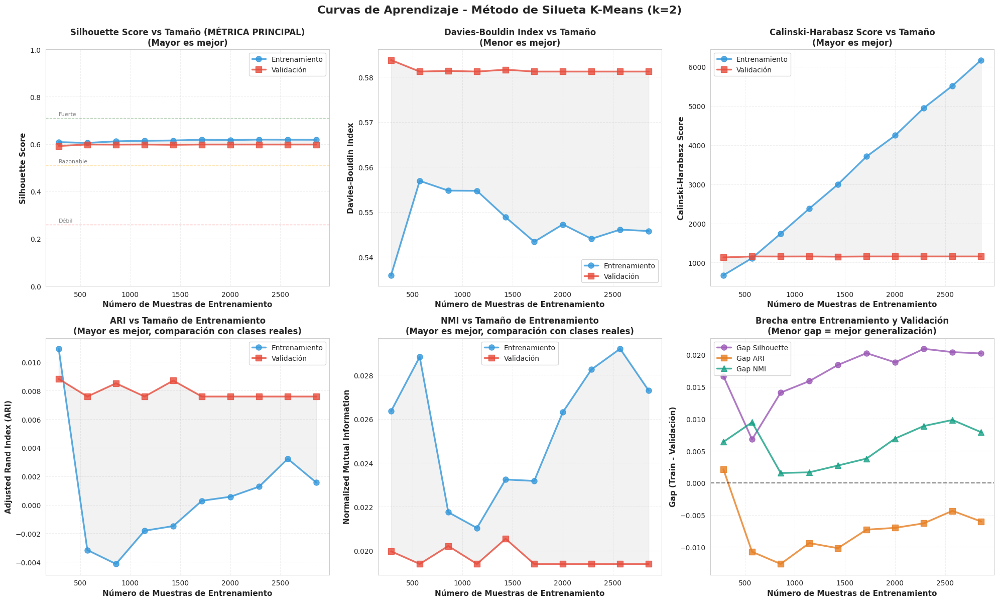


 TABLA RESUMEN - CURVAS DE APRENDIZAJE (MÉTODO SILUETA)


  Size  Samples    Sil_T    Sil_V     DB_T     DB_V    ARI_T    ARI_V
----------------------------------------------------------------------
 10.0%      286   0.6081   0.5915   0.5359   0.5837   0.0109   0.0088
 20.0%      572   0.6046   0.5978   0.5569   0.5812  -0.0032   0.0076
 30.0%      858   0.6114   0.5974   0.5547   0.5813  -0.0041   0.0085
 40.0%    1,144   0.6136   0.5978   0.5547   0.5812  -0.0018   0.0076
 50.0%    1,430   0.6150   0.5966   0.5488   0.5816  -0.0015   0.0087
 60.0%    1,716   0.6180   0.5978   0.5434   0.5812   0.0003   0.0076
 70.0%    2,002   0.6166   0.5978   0.5472   0.5812   0.0006   0.0076
 80.0%    2,288   0.6187   0.5978   0.5440   0.5812   0.0013   0.0076
 90.0%    2,574   0.6182   0.5978   0.5461   0.5812   0.0032   0.0076
100.0%    2,860   0.6180   0.5978   0.5457   0.5812   0.0016   0.0076

✓ Resultados guardados en 'curvas_aprendizaje_silueta_resultados.csv'

 ANÁLISIS DE CONVERGENCIA Y 

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score
)
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "CURVAS DE APRENDIZAJE - MÉTODO DE SILUETA K-MEANS")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
    print("   Necesitas tener: X_train, X_val, X_test, y_train, y_val, y_test")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ SON LAS CURVAS DE APRENDIZAJE?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ SON LAS CURVAS DE APRENDIZAJE EN CLUSTERING?")
    print("="*90)
    print("""
    Las curvas de aprendizaje muestran cómo el rendimiento del modelo cambia
    al variar el tamaño del conjunto de entrenamiento.

     OBJETIVO:
    • Evaluar si el modelo se beneficiaría de más datos
    • Detectar overfitting o underfitting
    • Entender la estabilidad del modelo
    • Evaluar la convergencia de las métricas

     INTERPRETACIÓN ESPECÍFICA PARA EL MÉTODO DE SILUETA:
    • Brecha pequeña entre train y validación → Buen ajuste
    • Silhouette alto y estable → Clusters bien definidos
    • Curvas convergiendo → Modelo estable
    • Mejora continua con más datos → Beneficio de recolectar más datos

     MÉTRICAS A EVALUAR:
    • Silhouette Score (principal del método)
    • Davies-Bouldin Index (complementaria)
    • Calinski-Harabasz Score (complementaria)
    • ARI y NMI (comparación con clases reales)
    """)

    # ============================================================================
    #          CONFIGURACIÓN DE TAMAÑOS DE ENTRENAMIENTO
    # ============================================================================

    print("\n" + "="*90)
    print(" CONFIGURACIÓN DEL EXPERIMENTO")
    print("="*90)

    # Usar el k óptimo del método de silueta (si existe) o el número de clases
    k_optimal = n_classes
    if 'best_k' in globals():
        k_optimal = best_k
        print(f"\n✓ Usando k={k_optimal} (del método de silueta)")
    else:
        print(f"\n✓ Usando k={k_optimal} (número de clases reales)")

    # Definir tamaños de muestra (porcentajes del conjunto de entrenamiento)
    train_sizes = np.linspace(0.1, 1.0, 10)

    print(f"\n Tamaños de entrenamiento a evaluar:")
    print(f"   • Desde: {train_sizes[0]*100:.0f}% del conjunto de entrenamiento")
    print(f"   • Hasta: {train_sizes[-1]*100:.0f}% del conjunto de entrenamiento")
    print(f"   • Incrementos: {len(train_sizes)} puntos")
    print(f"   • Rango: {int(len(X_train)*train_sizes[0]):,} a {len(X_train):,} muestras")

    # ============================================================================
    #          EJECUCIÓN DE CURVAS DE APRENDIZAJE
    # ============================================================================

    print("\n" + "="*90)
    print(" EJECUTANDO CURVAS DE APRENDIZAJE")
    print("="*90)
    print("\n Entrenando modelos con diferentes tamaños de muestra...")
    print("   (Esto puede tomar varios minutos)\n")

    # Almacenar resultados
    results = {
        'train_size': [],
        'train_samples': [],
        # Métricas no supervisadas
        'train_silhouette': [],
        'val_silhouette': [],
        'train_davies_bouldin': [],
        'val_davies_bouldin': [],
        'train_calinski': [],
        'val_calinski': [],
        # Métricas supervisadas
        'train_ari': [],
        'val_ari': [],
        'train_nmi': [],
        'val_nmi': []
    }

    # Iterar sobre diferentes tamaños
    for i, size in enumerate(train_sizes, 1):
        n_samples = int(len(X_train) * size)

        print(f"   [{i:2d}/{len(train_sizes)}] Tamaño: {size*100:5.1f}% "
              f"({n_samples:,} muestras)...", end=' ', flush=True)

        # Crear subconjunto de entrenamiento (usando la misma semilla para reproducibilidad)
        indices = np.random.RandomState(42).choice(len(X_train), n_samples, replace=False)

        # Verificar si X_train es DataFrame o array
        if isinstance(X_train, pd.DataFrame):
            X_train_subset = X_train.iloc[indices]
        else:
            X_train_subset = X_train[indices]

        y_train_subset = y_train_encoded[indices]

        # Entrenar K-Means
        kmeans = KMeans(
            n_clusters=k_optimal,
            init='k-means++',
            n_init=10,
            max_iter=300,
            random_state=8
        )
        kmeans.fit(X_train_subset)

        # Predecir clusters
        clusters_train = kmeans.labels_
        clusters_val = kmeans.predict(X_val)

        # Calcular métricas no supervisadas - ENTRENAMIENTO
        train_sil = silhouette_score(X_train_subset, clusters_train)
        train_db = davies_bouldin_score(X_train_subset, clusters_train)
        train_ch = calinski_harabasz_score(X_train_subset, clusters_train)

        # Calcular métricas no supervisadas - VALIDACIÓN
        val_sil = silhouette_score(X_val, clusters_val)
        val_db = davies_bouldin_score(X_val, clusters_val)
        val_ch = calinski_harabasz_score(X_val, clusters_val)

        # Calcular métricas supervisadas - ENTRENAMIENTO
        train_ari = adjusted_rand_score(y_train_subset, clusters_train)
        train_nmi = normalized_mutual_info_score(y_train_subset, clusters_train)

        # Calcular métricas supervisadas - VALIDACIÓN
        val_ari = adjusted_rand_score(y_val_encoded, clusters_val)
        val_nmi = normalized_mutual_info_score(y_val_encoded, clusters_val)

        # Almacenar resultados
        results['train_size'].append(size)
        results['train_samples'].append(n_samples)
        results['train_silhouette'].append(train_sil)
        results['val_silhouette'].append(val_sil)
        results['train_davies_bouldin'].append(train_db)
        results['val_davies_bouldin'].append(val_db)
        results['train_calinski'].append(train_ch)
        results['val_calinski'].append(val_ch)
        results['train_ari'].append(train_ari)
        results['val_ari'].append(val_ari)
        results['train_nmi'].append(train_nmi)
        results['val_nmi'].append(val_nmi)

        print(f"✓ (Sil: {val_sil:.4f})")

    print("\n Curvas de aprendizaje completadas")

    # ============================================================================
    #          VISUALIZACIÓN DE CURVAS DE APRENDIZAJE
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    # Crear figura con 6 subplots (2 filas x 3 columnas)
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle(f'Curvas de Aprendizaje - Método de Silueta K-Means (k={k_optimal})',
                 fontsize=16, fontweight='bold', y=0.995)

    train_samples = results['train_samples']

    # ---- SUBPLOT 1: Silhouette Score (PRINCIPAL) ----
    ax1 = axes[0, 0]
    ax1.plot(train_samples, results['train_silhouette'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax1.plot(train_samples, results['val_silhouette'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax1.fill_between(train_samples, results['train_silhouette'],
                      results['val_silhouette'], alpha=0.1, color='gray')

    # Líneas de referencia de calidad
    ax1.axhline(y=0.71, color='darkgreen', linestyle='--', alpha=0.3, linewidth=1)
    ax1.text(train_samples[0], 0.72, 'Fuerte', fontsize=8, alpha=0.6)
    ax1.axhline(y=0.51, color='orange', linestyle='--', alpha=0.3, linewidth=1)
    ax1.text(train_samples[0], 0.52, 'Razonable', fontsize=8, alpha=0.6)
    ax1.axhline(y=0.26, color='red', linestyle='--', alpha=0.3, linewidth=1)
    ax1.text(train_samples[0], 0.27, 'Débil', fontsize=8, alpha=0.6)

    ax1.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Silhouette Score', fontsize=11, fontweight='bold')
    ax1.set_title('Silhouette Score vs Tamaño (MÉTRICA PRINCIPAL)\n(Mayor es mejor)',
                  fontsize=12, fontweight='bold')
    ax1.legend(fontsize=10, loc='best')
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.set_ylim([0, 1])

    # ---- SUBPLOT 2: Davies-Bouldin Index ----
    ax2 = axes[0, 1]
    ax2.plot(train_samples, results['train_davies_bouldin'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax2.plot(train_samples, results['val_davies_bouldin'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax2.fill_between(train_samples, results['train_davies_bouldin'],
                      results['val_davies_bouldin'], alpha=0.1, color='gray')
    ax2.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Davies-Bouldin Index', fontsize=11, fontweight='bold')
    ax2.set_title('Davies-Bouldin Index vs Tamaño\n(Menor es mejor)',
                  fontsize=12, fontweight='bold')
    ax2.legend(fontsize=10, loc='best')
    ax2.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 3: Calinski-Harabasz Score ----
    ax3 = axes[0, 2]
    ax3.plot(train_samples, results['train_calinski'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax3.plot(train_samples, results['val_calinski'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax3.fill_between(train_samples, results['train_calinski'],
                      results['val_calinski'], alpha=0.1, color='gray')
    ax3.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax3.set_ylabel('Calinski-Harabasz Score', fontsize=11, fontweight='bold')
    ax3.set_title('Calinski-Harabasz Score vs Tamaño\n(Mayor es mejor)',
                  fontsize=12, fontweight='bold')
    ax3.legend(fontsize=10, loc='best')
    ax3.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 4: Adjusted Rand Index ----
    ax4 = axes[1, 0]
    ax4.plot(train_samples, results['train_ari'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax4.plot(train_samples, results['val_ari'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax4.fill_between(train_samples, results['train_ari'],
                      results['val_ari'], alpha=0.1, color='gray')
    ax4.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax4.set_ylabel('Adjusted Rand Index (ARI)', fontsize=11, fontweight='bold')
    ax4.set_title('ARI vs Tamaño de Entrenamiento\n(Mayor es mejor, comparación con clases reales)',
                  fontsize=12, fontweight='bold')
    ax4.legend(fontsize=10, loc='best')
    ax4.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 5: Normalized Mutual Information ----
    ax5 = axes[1, 1]
    ax5.plot(train_samples, results['train_nmi'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax5.plot(train_samples, results['val_nmi'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax5.fill_between(train_samples, results['train_nmi'],
                      results['val_nmi'], alpha=0.1, color='gray')
    ax5.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax5.set_ylabel('Normalized Mutual Information', fontsize=11, fontweight='bold')
    ax5.set_title('NMI vs Tamaño de Entrenamiento\n(Mayor es mejor, comparación con clases reales)',
                  fontsize=12, fontweight='bold')
    ax5.legend(fontsize=10, loc='best')
    ax5.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 6: Gap entre Train y Validación ----
    ax6 = axes[1, 2]
    gap_sil = np.array(results['train_silhouette']) - np.array(results['val_silhouette'])
    gap_ari = np.array(results['train_ari']) - np.array(results['val_ari'])
    gap_nmi = np.array(results['train_nmi']) - np.array(results['val_nmi'])

    ax6.plot(train_samples, gap_sil, 'o-', linewidth=2.5, markersize=8,
             color='#9b59b6', label='Gap Silhouette', alpha=0.8)
    ax6.plot(train_samples, gap_ari, 's-', linewidth=2.5, markersize=8,
             color='#e67e22', label='Gap ARI', alpha=0.8)
    ax6.plot(train_samples, gap_nmi, '^-', linewidth=2.5, markersize=8,
             color='#16a085', label='Gap NMI', alpha=0.8)
    ax6.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
    ax6.set_xlabel('Número de Muestras de Entrenamiento', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Gap (Train - Validación)', fontsize=11, fontweight='bold')
    ax6.set_title('Brecha entre Entrenamiento y Validación\n(Menor gap = mejor generalización)',
                  fontsize=12, fontweight='bold')
    ax6.legend(fontsize=10, loc='best')
    ax6.grid(True, alpha=0.3, linestyle='--')

    plt.tight_layout()
    plt.savefig('curvas_aprendizaje_silueta.png', dpi=300, bbox_inches='tight')
    plt.show()

    # ============================================================================
    #          TABLA RESUMEN
    # ============================================================================

    print("\n" + "="*90)
    print(" TABLA RESUMEN - CURVAS DE APRENDIZAJE (MÉTODO SILUETA)")
    print("="*90)

    results_df = pd.DataFrame(results)

    # Mostrar tabla formateada
    print("\n")
    print(f"{'Size':>6} {'Samples':>8} {'Sil_T':>8} {'Sil_V':>8} {'DB_T':>8} "
          f"{'DB_V':>8} {'ARI_T':>8} {'ARI_V':>8}")
    print("-" * 70)
    for _, row in results_df.iterrows():
        print(f"{row['train_size']:>6.1%} {int(row['train_samples']):>8,} "
              f"{row['train_silhouette']:>8.4f} {row['val_silhouette']:>8.4f} "
              f"{row['train_davies_bouldin']:>8.4f} {row['val_davies_bouldin']:>8.4f} "
              f"{row['train_ari']:>8.4f} {row['val_ari']:>8.4f}")

    # Guardar resultados
    results_df.to_csv('curvas_aprendizaje_silueta_resultados.csv', index=False)
    print("\n✓ Resultados guardados en 'curvas_aprendizaje_silueta_resultados.csv'")

    # ============================================================================
    #          ANÁLISIS DE CONVERGENCIA Y CALIDAD
    # ============================================================================

    print("\n" + "="*90)
    print(" ANÁLISIS DE CONVERGENCIA Y CALIDAD")
    print("="*90)

    # Calcular gaps finales
    final_gap_sil = abs(results['train_silhouette'][-1] - results['val_silhouette'][-1])
    final_gap_ari = abs(results['train_ari'][-1] - results['val_ari'][-1])
    final_gap_nmi = abs(results['train_nmi'][-1] - results['val_nmi'][-1])

    print(f"\n Gaps finales (con 100% de datos de entrenamiento):")
    print(f"   • Silhouette:  {final_gap_sil:.4f}")
    print(f"   • ARI:         {final_gap_ari:.4f}")
    print(f"   • NMI:         {final_gap_nmi:.4f}")

    # Calcular tendencias
    sil_trend = results['val_silhouette'][-1] - results['val_silhouette'][0]
    ari_trend = results['val_ari'][-1] - results['val_ari'][0]
    db_trend = results['val_davies_bouldin'][-1] - results['val_davies_bouldin'][0]

    print(f"\n Mejora desde 10% hasta 100% de datos (Validación):")
    print(f"   • Silhouette:       {sil_trend:+.4f}")
    print(f"   • ARI:              {ari_trend:+.4f}")
    print(f"   • Davies-Bouldin:   {db_trend:+.4f} (menor es mejor)")

    # Evaluar calidad final del silhouette
    final_sil = results['val_silhouette'][-1]
    print(f"\n Calidad del Silhouette Score final (Validación): {final_sil:.4f}")

    if final_sil >= 0.71:
        quality_msg = " EXCELENTE - Estructura de clusters muy fuerte"
    elif final_sil >= 0.51:
        quality_msg = "✓ BUENO - Estructura de clusters razonable"
    elif final_sil >= 0.26:
        quality_msg = "  REGULAR - Estructura de clusters débil"
    else:
        quality_msg = " POBRE - Sin estructura substancial"

    print(f"   {quality_msg}")

    # ============================================================================
    #          INTERPRETACIÓN Y RECOMENDACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" INTERPRETACIÓN Y RECOMENDACIONES")
    print("="*90)

    print("\n DIAGNÓSTICO DE GENERALIZACIÓN:\n")

    # Analizar convergencia
    avg_gap = (final_gap_sil + final_gap_ari + final_gap_nmi) / 3

    if avg_gap < 0.05:
        print("    EXCELENTE GENERALIZACIÓN")
        print("      • Gap muy pequeño entre entrenamiento y validación")
        print("      • El modelo generaliza muy bien a datos nuevos")
        print("      • No hay signos evidentes de overfitting")
    elif avg_gap < 0.10:
        print("   ✓ BUENA GENERALIZACIÓN")
        print("      • Gap moderado entre entrenamiento y validación")
        print("      • El modelo generaliza adecuadamente")
        print("      • Ligero overfitting, pero aceptable")
    else:
        print("     ATENCIÓN: GAP SIGNIFICATIVO")
        print("      • Hay diferencia notable entre train y validación")
        print("      • Posible overfitting en el conjunto de entrenamiento")
        print("      • Considerar técnicas de regularización o más datos")

    print("\n ANÁLISIS DE TENDENCIAS:\n")

    # Analizar si las curvas convergen
    last_3_gaps_sil = gap_sil[-3:]
    is_converging = all(abs(last_3_gaps_sil[i]) <= abs(last_3_gaps_sil[i-1]) + 0.02
                        for i in range(1, len(last_3_gaps_sil)))

    if is_converging:
        print("   ✓ Las curvas están convergiendo")
        print("      • El gap se reduce o se mantiene estable")
        print("      • El tamaño actual de datos es probablemente suficiente")
        print("      • No se espera gran mejora con más datos")
    else:
        print("   → Las curvas aún no han convergido completamente")
        print("      • Más datos podrían mejorar el rendimiento")
        print("      • Considera aumentar el conjunto de entrenamiento si es posible")

    # Analizar mejora con más datos
    if sil_trend > 0.02 or ari_trend > 0.02:
        print("\n    El modelo mejora notablemente con más datos")
        print("      • Recolectar más datos sería muy beneficioso")
        print("      • El Silhouette Score muestra tendencia positiva")
    elif abs(sil_trend) < 0.01:
        print("\n   → El modelo se mantiene estable con diferentes tamaños")
        print("      • Ya has alcanzado un buen balance")
        print("      • Más datos no generarían mejora significativa")
    else:
        print("\n     El rendimiento disminuye con más datos")
        print("      • Puede haber ruido o outliers en datos adicionales")
        print("      • Revisar calidad de los datos")

    # Estabilidad del Silhouette Score
    sil_std = np.std(results['val_silhouette'])
    print(f"\n Estabilidad del Silhouette Score (Validación):")
    print(f"   • Desviación estándar: {sil_std:.4f}")

    if sil_std < 0.02:
        print("      ✓ Muy estable - poco sensible al tamaño de muestra")
    elif sil_std < 0.05:
        print("      → Moderadamente estable")
    else:
        print("        Alta variabilidad - sensible al tamaño de muestra")

    print("\n" + "="*90)
    print(" COMPARACIÓN: MÉTODO DE SILUETA vs MÉTODO DEL CODO")
    print("="*90)

    print("""
    VENTAJAS DEL ANÁLISIS DE SILUETA EN CURVAS DE APRENDIZAJE:

    ✓ Métrica más interpretable
      → Valores en [-1, 1] con umbrales claros de calidad
      → Fácil identificar si clusters están bien definidos

    ✓ Considera cohesión Y separación
      → No solo minimiza distancias intra-cluster (como inercia)
      → También maximiza distancias inter-cluster

    ✓ Detecta problemas de clustering
      → Valores negativos indican muestras mal asignadas
      → Permite análisis por cluster individual

    ✓ Menos ambiguo
      → Buscar máximo es más directo que buscar "codo"
      → Criterio de selección más objetivo

    CUÁNDO USAR CADA MÉTODO:
    • Silueta: Cuando priorizas la calidad interpretable del clustering
    • Codo: Cuando priorizas la compacidad y eficiencia computacional
    • Ambos: Ideal para validaciDón cruzada de resultados
    """)

    print("\n" + "="*90)
    print(" "*20 + "✓ ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETO")
    print("="*90)

## Grid Search

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score
)
from sklearn.preprocessing import LabelEncoder
from itertools import product
import time
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*20 + "GRID SEARCH - K-MEANS CLUSTERING")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
    print("   Necesitas tener las variables: X_train, X_val, X_test, y_train, y_val, y_test")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ ES GRID SEARCH?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ ES GRID SEARCH?")
    print("="*90)
    print("""
   Grid Search es una técnica de optimización exhaustiva que prueba todas las
   combinaciones posibles de hiperparámetros para encontrar la configuración óptima.

    OBJETIVO:
   • Buscar sistemáticamente en el espacio de hiperparámetros
   • Evaluar cada combinación con métricas objetivas
   • Encontrar la configuración que maximiza el rendimiento

    HIPERPARÁMETROS DE K-MEANS A OPTIMIZAR:

   1. n_clusters (k):
      • Número de clusters a formar
      • Rango típico: 2 a 15

   2. init (inicialización):
      • 'k-means++': Inicialización inteligente (recomendado)
      • 'random': Centroides aleatorios
      • Impacto: Velocidad de convergencia y resultado final

   3. n_init:
      • Número de veces que se ejecuta el algoritmo
      • Valores típicos: 10, 20, 30
      • Más ejecuciones → mejor resultado pero más lento

   4. max_iter:
      • Máximo de iteraciones por ejecución
      • Valores típicos: 100, 200, 300, 500
      • Más iteraciones → mejor convergencia pero más lento

   5. algorithm:
      • 'lloyd': Algoritmo EM clásico
      • 'elkan': Optimización con desigualdad triangular
      • 'auto': Selección automática según datos

    VENTAJAS DEL GRID SEARCH:
   • Búsqueda exhaustiva garantiza encontrar el óptimo
   • Resultados reproducibles y sistemáticos
   • Compara configuraciones de forma justa
   • Permite análisis detallado del espacio de hiperparámetros

    DESVENTAJAS:
   • Computacionalmente costoso (tiempo exponencial)
   • Puede ser innecesario para espacios simples
   • Requiere definir rangos apropiados
    """)

    # ============================================================================
    #          DEFINICIÓN DEL ESPACIO DE BÚSQUEDA
    # ============================================================================

    print("\n" + "="*90)
    print(" DEFINICIÓN DEL ESPACIO DE BÚSQUEDA")
    print("="*90)

    # Definir grid de hiperparámetros
    param_grid = {
        'n_clusters': list(range(2, 13)),  # k de 2 a 12
        'init': ['k-means++', 'random'],
        'n_init': [10, 20, 30],
        'max_iter': [100, 200, 300],
        'algorithm': ['lloyd', 'elkan']
    }

    print("\n Hiperparámetros a explorar:")
    print("-" * 60)
    for param, values in param_grid.items():
        if isinstance(values[0], str):
            values_str = ', '.join(f"'{v}'" for v in values)
        else:
            if len(values) > 10:
                values_str = f"{min(values)} a {max(values)} ({len(values)} valores)"
            else:
                values_str = ', '.join(map(str, values))
        print(f"  • {param:15s}: {values_str}")

    # Calcular número total de combinaciones
    total_combinations = np.prod([len(v) for v in param_grid.values()])
    print(f"\n Total de combinaciones: {total_combinations:,}")

    # Estimar tiempo
    estimated_time_per_model = 0.5  # segundos
    estimated_total_time = total_combinations * estimated_time_per_model
    print(f" Tiempo estimado: {estimated_total_time/60:.1f} minutos")

    # ============================================================================
    #          EJECUCIÓN DEL GRID SEARCH
    # ============================================================================

    print("\n" + "="*90)
    print(" EJECUTANDO GRID SEARCH")
    print("="*90)

    print("\n Iniciando búsqueda exhaustiva...")
    print("   (Esto puede tomar varios minutos)\n")

    # Almacenar resultados
    results = []

    # Contador de progreso
    total = total_combinations
    current = 0
    start_time = time.time()

    # Iterar sobre todas las combinaciones
    for n_clusters, init, n_init, max_iter, algorithm in product(
        param_grid['n_clusters'],
        param_grid['init'],
        param_grid['n_init'],
        param_grid['max_iter'],
        param_grid['algorithm']
    ):
        current += 1

        # Mostrar progreso cada 50 iteraciones
        if current % 50 == 0 or current == 1:
            elapsed = time.time() - start_time
            progress = (current / total) * 100
            eta = (elapsed / current) * (total - current)
            print(f"   Progreso: {current}/{total} ({progress:.1f}%) | "
                  f"Tiempo transcurrido: {elapsed/60:.1f}min | "
                  f"ETA: {eta/60:.1f}min")

        try:
            # Entrenar modelo
            kmeans = KMeans(
                n_clusters=n_clusters,
                init=init,
                n_init=n_init,
                max_iter=max_iter,
                algorithm=algorithm,
                random_state=8,
                verbose=0
            )

            # Fit en entrenamiento
            kmeans.fit(X_train)

            # Obtener clusters
            clusters_train = kmeans.labels_

            # Calcular métricas en entrenamiento
            silhouette = silhouette_score(X_train, clusters_train)
            davies_bouldin = davies_bouldin_score(X_train, clusters_train)
            calinski = calinski_harabasz_score(X_train, clusters_train)
            inertia = kmeans.inertia_
            n_iter = kmeans.n_iter_

            # Métricas supervisadas (si hay etiquetas)
            ari = adjusted_rand_score(y_train_encoded, clusters_train)
            nmi = normalized_mutual_info_score(y_train_encoded, clusters_train)

            # Guardar resultados
            results.append({
                'n_clusters': n_clusters,
                'init': init,
                'n_init': n_init,
                'max_iter': max_iter,
                'algorithm': algorithm,
                'silhouette': silhouette,
                'davies_bouldin': davies_bouldin,
                'calinski_harabasz': calinski,
                'inertia': inertia,
                'ari': ari,
                'nmi': nmi,
                'n_iter': n_iter,
                'converged': n_iter < max_iter
            })

        except Exception as e:
            # En caso de error, registrar con NaN
            results.append({
                'n_clusters': n_clusters,
                'init': init,
                'n_init': n_init,
                'max_iter': max_iter,
                'algorithm': algorithm,
                'silhouette': np.nan,
                'davies_bouldin': np.nan,
                'calinski_harabasz': np.nan,
                'inertia': np.nan,
                'ari': np.nan,
                'nmi': np.nan,
                'n_iter': np.nan,
                'converged': False
            })

    total_time = time.time() - start_time
    print(f"\n Grid Search completado en {total_time/60:.2f} minutos")

    # Crear DataFrame con resultados
    results_df = pd.DataFrame(results)

    # Eliminar filas con NaN (si hubo errores)
    results_df = results_df.dropna(subset=['silhouette'])

    print(f" Configuraciones exitosas: {len(results_df):,}/{total_combinations:,}")

    # ============================================================================
    #          ANÁLISIS DE RESULTADOS
    # ============================================================================

    print("\n" + "="*90)
    print(" ANÁLISIS DE RESULTADOS")
    print("="*90)

    # Encontrar mejor configuración según diferentes métricas
    print("\n MEJORES CONFIGURACIONES SEGÚN CADA MÉTRICA:")
    print("="*90)

    metrics_to_optimize = {
        'silhouette': ('max', 'Silhouette Score'),
        'davies_bouldin': ('min', 'Davies-Bouldin Index'),
        'calinski_harabasz': ('max', 'Calinski-Harabasz Score'),
        'ari': ('max', 'Adjusted Rand Index'),
        'nmi': ('max', 'Normalized Mutual Info')
    }

    best_configs = {}

    for metric, (direction, name) in metrics_to_optimize.items():
        if direction == 'max':
            best_idx = results_df[metric].idxmax()
        else:
            best_idx = results_df[metric].idxmin()

        best_row = results_df.loc[best_idx]
        best_configs[metric] = best_row

        print(f"\n{name}:")
        print("-" * 60)
        print(f"  • n_clusters:  {int(best_row['n_clusters'])}")
        print(f"  • init:        {best_row['init']}")
        print(f"  • n_init:      {int(best_row['n_init'])}")
        print(f"  • max_iter:    {int(best_row['max_iter'])}")
        print(f"  • algorithm:   {best_row['algorithm']}")
        print(f"  • Valor:       {best_row[metric]:.4f}")

    # Seleccionar configuración óptima (basada en Silhouette)
    print("\n\n CONFIGURACIÓN ÓPTIMA SELECCIONADA (basada en Silhouette Score):")
    print("="*90)

    best_config = best_configs['silhouette']
    print(f"\n  • n_clusters:        {int(best_config['n_clusters'])}")
    print(f"  • init:              {best_config['init']}")
    print(f"  • n_init:            {int(best_config['n_init'])}")
    print(f"  • max_iter:          {int(best_config['max_iter'])}")
    print(f"  • algorithm:         {best_config['algorithm']}")
    print(f"\n  Métricas:")
    print(f"  • Silhouette:        {best_config['silhouette']:.4f}")
    print(f"  • Davies-Bouldin:    {best_config['davies_bouldin']:.4f}")
    print(f"  • Calinski-Harabasz: {best_config['calinski_harabasz']:,.2f}")
    print(f"  • ARI:               {best_config['ari']:.4f}")
    print(f"  • NMI:               {best_config['nmi']:.4f}")

    # ============================================================================
    #          VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    # Figura 1: Análisis por n_clusters
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Grid Search - Análisis por Número de Clusters',
                 fontsize=16, fontweight='bold')

    # Agrupar por n_clusters
    grouped = results_df.groupby('n_clusters').agg({
        'silhouette': ['mean', 'std', 'max'],
        'davies_bouldin': ['mean', 'std', 'min'],
        'calinski_harabasz': ['mean', 'std', 'max'],
        'inertia': ['mean', 'std', 'min']
    })

    # Subplot 1: Silhouette
    ax1 = axes[0, 0]
    k_values = grouped.index
    ax1.errorbar(k_values, grouped['silhouette']['mean'],
                 yerr=grouped['silhouette']['std'],
                 marker='o', linewidth=2, markersize=8, capsize=5,
                 color='#3498db', label='Media ± Desv. Est.')
    ax1.plot(k_values, grouped['silhouette']['max'],
             's--', linewidth=1.5, markersize=6, alpha=0.6,
             color='#e74c3c', label='Mejor valor')
    ax1.axvline(x=int(best_config['n_clusters']), color='red',
                linestyle=':', linewidth=2, alpha=0.7, label='k óptimo')
    ax1.set_xlabel('Número de Clusters (k)', fontweight='bold')
    ax1.set_ylabel('Silhouette Score', fontweight='bold')
    ax1.set_title('Silhouette Score vs k', fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Subplot 2: Davies-Bouldin
    ax2 = axes[0, 1]
    ax2.errorbar(k_values, grouped['davies_bouldin']['mean'],
                 yerr=grouped['davies_bouldin']['std'],
                 marker='o', linewidth=2, markersize=8, capsize=5,
                 color='#9b59b6', label='Media ± Desv. Est.')
    ax2.plot(k_values, grouped['davies_bouldin']['min'],
             's--', linewidth=1.5, markersize=6, alpha=0.6,
             color='#27ae60', label='Mejor valor (min)')
    ax2.axvline(x=int(best_config['n_clusters']), color='red',
                linestyle=':', linewidth=2, alpha=0.7, label='k óptimo')
    ax2.set_xlabel('Número de Clusters (k)', fontweight='bold')
    ax2.set_ylabel('Davies-Bouldin Index', fontweight='bold')
    ax2.set_title('Davies-Bouldin Index vs k', fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    # Subplot 3: Calinski-Harabasz
    ax3 = axes[1, 0]
    ax3.errorbar(k_values, grouped['calinski_harabasz']['mean'],
                 yerr=grouped['calinski_harabasz']['std'],
                 marker='o', linewidth=2, markersize=8, capsize=5,
                 color='#16a085', label='Media ± Desv. Est.')
    ax3.plot(k_values, grouped['calinski_harabasz']['max'],
             's--', linewidth=1.5, markersize=6, alpha=0.6,
             color='#f39c12', label='Mejor valor')
    ax3.axvline(x=int(best_config['n_clusters']), color='red',
                linestyle=':', linewidth=2, alpha=0.7, label='k óptimo')
    ax3.set_xlabel('Número de Clusters (k)', fontweight='bold')
    ax3.set_ylabel('Calinski-Harabasz Score', fontweight='bold')
    ax3.set_title('Calinski-Harabasz Score vs k', fontweight='bold')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    # Subplot 4: Inercia
    ax4 = axes[1, 1]
    ax4.errorbar(k_values, grouped['inertia']['mean'],
                 yerr=grouped['inertia']['std'],
                 marker='o', linewidth=2, markersize=8, capsize=5,
                 color='#e74c3c', label='Media ± Desv. Est.')
    ax4.axvline(x=int(best_config['n_clusters']), color='red',
                linestyle=':', linewidth=2, alpha=0.7, label='k óptimo')
    ax4.set_xlabel('Número de Clusters (k)', fontweight='bold')
    ax4.set_ylabel('Inercia', fontweight='bold')
    ax4.set_title('Inercia vs k', fontweight='bold')
    ax4.legend()
    ax4.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('grid_search_por_k.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n Gráfica guardada: 'grid_search_por_k.png'")

    # Figura 2: Heatmaps de hiperparámetros
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    fig.suptitle('Grid Search - Impacto de Hiperparámetros',
                 fontsize=16, fontweight='bold')

    # Heatmap 1: init vs n_init (Silhouette)
    ax1 = axes[0, 0]
    pivot1 = results_df.pivot_table(values='silhouette',
                                     index='init', columns='n_init', aggfunc='mean')
    sns.heatmap(pivot1, annot=True, fmt='.4f', cmap='RdYlGn', ax=ax1, cbar_kws={'label': 'Silhouette'})
    ax1.set_title('Silhouette: init vs n_init', fontweight='bold')

    # Heatmap 2: init vs max_iter (Silhouette)
    ax2 = axes[0, 1]
    pivot2 = results_df.pivot_table(values='silhouette',
                                     index='init', columns='max_iter', aggfunc='mean')
    sns.heatmap(pivot2, annot=True, fmt='.4f', cmap='RdYlGn', ax=ax2, cbar_kws={'label': 'Silhouette'})
    ax2.set_title('Silhouette: init vs max_iter', fontweight='bold')

    # Heatmap 3: algorithm vs n_init (Silhouette)
    ax3 = axes[0, 2]
    pivot3 = results_df.pivot_table(values='silhouette',
                                     index='algorithm', columns='n_init', aggfunc='mean')
    sns.heatmap(pivot3, annot=True, fmt='.4f', cmap='RdYlGn', ax=ax3, cbar_kws={'label': 'Silhouette'})
    ax3.set_title('Silhouette: algorithm vs n_init', fontweight='bold')

    # Heatmap 4: init vs n_init (ARI)
    ax4 = axes[1, 0]
    pivot4 = results_df.pivot_table(values='ari',
                                     index='init', columns='n_init', aggfunc='mean')
    sns.heatmap(pivot4, annot=True, fmt='.4f', cmap='RdYlGn', ax=ax4, cbar_kws={'label': 'ARI'})
    ax4.set_title('ARI: init vs n_init', fontweight='bold')

    # Heatmap 5: n_clusters vs init (Silhouette)
    ax5 = axes[1, 1]
    pivot5 = results_df.pivot_table(values='silhouette',
                                     index='n_clusters', columns='init', aggfunc='mean')
    sns.heatmap(pivot5, annot=True, fmt='.4f', cmap='RdYlGn', ax=ax5, cbar_kws={'label': 'Silhouette'})
    ax5.set_title('Silhouette: n_clusters vs init', fontweight='bold')

    # Heatmap 6: n_clusters vs algorithm (Silhouette)
    ax6 = axes[1, 2]
    pivot6 = results_df.pivot_table(values='silhouette',
                                     index='n_clusters', columns='algorithm', aggfunc='mean')
    sns.heatmap(pivot6, annot=True, fmt='.4f', cmap='RdYlGn', ax=ax6, cbar_kws={'label': 'Silhouette'})
    ax6.set_title('Silhouette: n_clusters vs algorithm', fontweight='bold')

    plt.tight_layout()
    plt.savefig('grid_search_heatmaps.png', dpi=300, bbox_inches='tight')
    plt.show()


    # ============================================================================
    #          GUARDAR RESULTADOS
    # ============================================================================

    print("\n" + "="*90)
    print(" GUARDANDO RESULTADOS")
    print("="*90)

    # Guardar todos los resultados
    results_df.to_csv('grid_search_resultados_completos.csv', index=False)
    print("\n Resultados completos: 'grid_search_resultados_completos.csv'")

    # Guardar top 20
    top_20 = results_df.nlargest(20, 'silhouette')[['n_clusters', 'init', 'n_init',
                                                      'max_iter', 'algorithm', 'silhouette',
                                                      'davies_bouldin', 'ari', 'nmi']]
    top_20.to_csv('grid_search_top20.csv', index=False)
    print(" Top 20 configuraciones: 'grid_search_top20.csv'")

    # ============================================================================
    #          ENTRENAR MODELO FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" ENTRENANDO MODELO FINAL CON MEJOR CONFIGURACIÓN")
    print("="*90)

    print(f"\n Entrenando K-Means con configuración óptima...")

    # Entrenar modelo final
    kmeans_final = KMeans(
        n_clusters=int(best_config['n_clusters']),
        init=best_config['init'],
        n_init=int(best_config['n_init']),
        max_iter=int(best_config['max_iter']),
        algorithm=best_config['algorithm'],
        random_state=8
    )
    kmeans_final.fit(X_train)

    print(" Modelo entrenado exitosamente")

    # ============================================================================
    #          EVALUACIÓN EN VALIDACIÓN Y PRUEBA
    # ============================================================================

    print("\n" + "="*90)
    print(" EVALUACIÓN DEL MODELO OPTIMIZADO")
    print("="*90)

    # Predecir en cada conjunto
    clusters_train = kmeans_final.labels_
    clusters_val = kmeans_final.predict(X_val)
    clusters_test = kmeans_final.predict(X_test)

    print("\n MÉTRICAS NO SUPERVISADAS (Calidad del Clustering)")
    print("="*90)

    # Función para calcular métricas no supervisadas
    def calculate_unsupervised_metrics(X, clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        inercia = kmeans_final.inertia_ if set_name == "Conjunto de ENTRENAMIENTO" else None
        silhouette = silhouette_score(X, clusters)
        davies_bouldin = davies_bouldin_score(X, clusters)
        calinski = calinski_harabasz_score(X, clusters)

        if inercia is not None:
            print(f"  • Inercia:                {inercia:,.2f}")
        print(f"  • Silhouette Score:       {silhouette:.4f}  (rango: [-1, 1], óptimo: cercano a 1)")
        print(f"  • Davies-Bouldin Index:   {davies_bouldin:.4f}  (óptimo: cercano a 0)")
        print(f"  • Calinski-Harabasz:      {calinski:,.2f}  (óptimo: mayor valor)")

        return {
            'Inercia': inercia,
            'Silhouette': silhouette,
            'Davies-Bouldin': davies_bouldin,
            'Calinski-Harabasz': calinski
        }

    # Calcular métricas para cada conjunto
    metrics_train = calculate_unsupervised_metrics(X_train, clusters_train, "Conjunto de ENTRENAMIENTO")
    metrics_val = calculate_unsupervised_metrics(X_val, clusters_val, "Conjunto de VALIDACIÓN")
    metrics_test = calculate_unsupervised_metrics(X_test, clusters_test, "Conjunto de PRUEBA")

    print("\n\n MÉTRICAS SUPERVISADAS (Comparación con Etiquetas Reales)")
    print("="*90)

    # Función para calcular métricas supervisadas
    def calculate_supervised_metrics(y_true, clusters, set_name):
        print(f"\n{set_name}:")
        print("-" * 60)

        ari = adjusted_rand_score(y_true, clusters)
        nmi = normalized_mutual_info_score(y_true, clusters)
        homogeneity = homogeneity_score(y_true, clusters)
        completeness = completeness_score(y_true, clusters)
        v_measure = v_measure_score(y_true, clusters)

        print(f"  • Adjusted Rand Index (ARI):  {ari:.4f}  (rango: [-1, 1], óptimo: 1)")
        print(f"  • Normalized Mutual Info:     {nmi:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • Homogeneity:                 {homogeneity:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • Completeness:                {completeness:.4f}  (rango: [0, 1], óptimo: 1)")
        print(f"  • V-Measure:                   {v_measure:.4f}  (rango: [0, 1], óptimo: 1)")

        return {
            'ARI': ari,
            'NMI': nmi,
            'Homogeneity': homogeneity,
            'Completeness': completeness,
            'V-Measure': v_measure
        }

    # Calcular métricas supervisadas
    sup_metrics_train = calculate_supervised_metrics(y_train_encoded, clusters_train, "Conjunto de ENTRENAMIENTO")
    sup_metrics_val = calculate_supervised_metrics(y_val_encoded, clusters_val, "Conjunto de VALIDACIÓN")
    sup_metrics_test = calculate_supervised_metrics(y_test_encoded, clusters_test, "Conjunto de PRUEBA")

    # ============================================================================
    #          RESUMEN COMPARATIVO
    # ============================================================================

    print("\n\n" + "="*90)
    print(" RESUMEN COMPARATIVO - TODAS LAS MÉTRICAS")
    print("="*90)

    # Crear DataFrame comparativo
    comparison_df = pd.DataFrame({
        'Métrica': [
            'Silhouette Score',
            'Davies-Bouldin',
            'Calinski-Harabasz',
            'ARI',
            'NMI',
            'Homogeneity',
            'Completeness',
            'V-Measure'
        ],
        'Entrenamiento': [
            metrics_train['Silhouette'],
            metrics_train['Davies-Bouldin'],
            metrics_train['Calinski-Harabasz'],
            sup_metrics_train['ARI'],
            sup_metrics_train['NMI'],
            sup_metrics_train['Homogeneity'],
            sup_metrics_train['Completeness'],
            sup_metrics_train['V-Measure']
        ],
        'Validación': [
            metrics_val['Silhouette'],
            metrics_val['Davies-Bouldin'],
            metrics_val['Calinski-Harabasz'],
            sup_metrics_val['ARI'],
            sup_metrics_val['NMI'],
            sup_metrics_val['Homogeneity'],
            sup_metrics_val['Completeness'],
            sup_metrics_val['V-Measure']
        ],
        'Prueba': [
            metrics_test['Silhouette'],
            metrics_test['Davies-Bouldin'],
            metrics_test['Calinski-Harabasz'],
            sup_metrics_test['ARI'],
            sup_metrics_test['NMI'],
            sup_metrics_test['Homogeneity'],
            sup_metrics_test['Completeness'],
            sup_metrics_test['V-Measure']
        ]
    })

    print("\n")
    print(comparison_df.to_string(index=False))

    # Guardar resultados
    comparison_df.to_csv('metricas_modelo_grid_search.csv', index=False)

    # ============================================================================
    #          INTERPRETACIÓN FINAL
    # ============================================================================

    print("\n\n" + "="*90)
    print(" INTERPRETACIÓN Y CONCLUSIONES")
    print("="*90)

    print(f"""
    MODELO OPTIMIZADO VÍA GRID SEARCH

    CONFIGURACIÓN ÓPTIMA:
   • n_clusters:  {int(best_config['n_clusters'])}
   • init:        {best_config['init']}
   • n_init:      {int(best_config['n_init'])}
   • max_iter:    {int(best_config['max_iter'])}
   • algorithm:   {best_config['algorithm']}

    CALIDAD DEL CLUSTERING (Conjunto de Prueba):
   • Silhouette Score:      {metrics_test['Silhouette']:.4f}
   • Davies-Bouldin Index:  {metrics_test['Davies-Bouldin']:.4f}
   • Calinski-Harabasz:     {metrics_test['Calinski-Harabasz']:,.2f}

    COMPARACIÓN CON CLASES REALES:
   • Adjusted Rand Index:   {sup_metrics_test['ARI']:.4f}
   • Normalized Mutual Info: {sup_metrics_test['NMI']:.4f}
   • V-Measure:             {sup_metrics_test['V-Measure']:.4f}

    GENERALIZACIÓN:
   """)

    # Analizar generalización
    sil_diff = abs(metrics_train['Silhouette'] - metrics_test['Silhouette'])
    ari_diff = abs(sup_metrics_train['ARI'] - sup_metrics_test['ARI'])

    if sil_diff < 0.05 and ari_diff < 0.05:
        print("    EXCELENTE - El modelo generaliza muy bien")
        print("      Las métricas son consistentes entre entrenamiento y prueba")
    elif sil_diff < 0.1 and ari_diff < 0.1:
        print("   ✓ BUENO - El modelo generaliza adecuadamente")
        print("     Hay pequeñas diferencias entre conjuntos")
    else:
        print("    ATENCIÓN - Hay diferencias notables entre conjuntos")
        print("      Considerar revisar el preprocesamiento")

    print("\n    VENTAJAS DEL GRID SEARCH:")
    print("   • Búsqueda exhaustiva en todo el espacio de hiperparámetros")
    print("   • Garantiza encontrar la mejor combinación dentro del grid")
    print("   • Resultados reproducibles y comparables")

    print("\n" + "="*90)
    print(" "*20 + "✓ GRID SEARCH COMPLETADO")
    print("="*90)



                    GRID SEARCH - K-MEANS CLUSTERING

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ ES GRID SEARCH?

   Grid Search es una técnica de optimización exhaustiva que prueba todas las
   combinaciones posibles de hiperparámetros para encontrar la configuración óptima.

    OBJETIVO:
   • Buscar sistemáticamente en el espacio de hiperparámetros
   • Evaluar cada combinación con métricas objetivas
   • Encontrar la configuración que maximiza el rendimiento

    HIPERPARÁMETROS DE K-MEANS A OPTIMIZAR:

   1. n_clusters (k):
      • Número de clusters a formar
      • Rango típico: 2 a 15

   2. init (inicialización):
      • 'k-means++': Inicialización inteligente (recomendado)
      • 'random': Centroides aleatorios
      • Impacto: Velocidad de convergencia y resultado final

   3. n_init:
      • Número de veces que se ejecuta

## Curvas de Aprendizaje

               CURVAS DE APRENDIZAJE - GRID SEARCH K-MEANS OPTIMIZADO

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ SON LAS CURVAS DE APRENDIZAJE PARA GRID SEARCH?

    Las curvas de aprendizaje evalúan cómo la configuración ÓPTIMA encontrada
    por Grid Search se comporta al variar el tamaño del conjunto de entrenamiento.

     OBJETIVO:
    • Evaluar si los hiperparámetros óptimos son robustos a diferentes tamaños
    • Determinar si el modelo se beneficiaría de más datos
    • Validar que la optimización no causó overfitting
    • Entender la estabilidad de la configuración óptima

     DIFERENCIA CON CURVAS ANTERIORES:
    • Método del Codo: Usa k encontrado heurísticamente
    • Método Silueta: Usa k que maximiza silhouette
    • Grid Search: Usa la MEJOR COMBINACIÓN de TODOS los hiperparámetros
      (n_clusters, init, n_init, ma

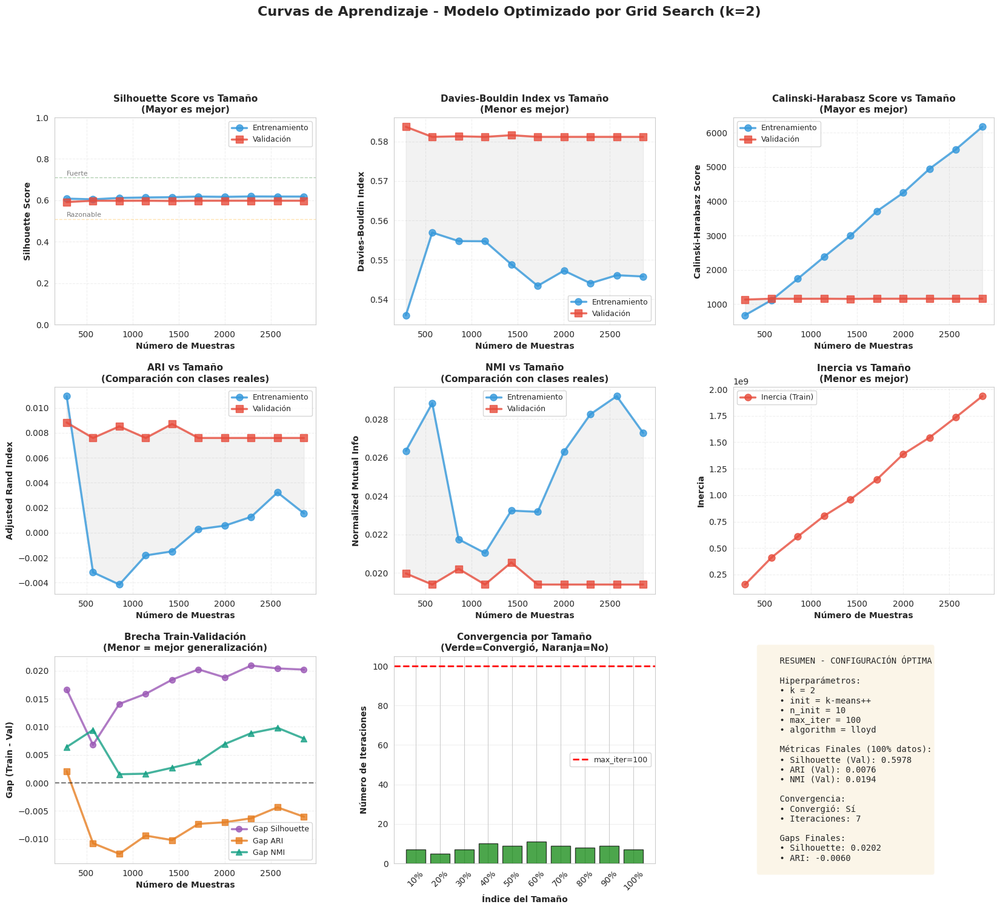


 TABLA RESUMEN - CURVAS DE APRENDIZAJE (GRID SEARCH)


  Size  Samples    Sil_T    Sil_V     DB_V    ARI_V  Iter  Conv
-----------------------------------------------------------------
 10.0%      286   0.6081   0.5915   0.5837   0.0088     7     ✓
 20.0%      572   0.6046   0.5978   0.5812   0.0076     5     ✓
 30.0%      858   0.6114   0.5974   0.5813   0.0085     7     ✓
 40.0%    1,144   0.6136   0.5978   0.5812   0.0076    10     ✓
 50.0%    1,430   0.6150   0.5966   0.5816   0.0087     9     ✓
 60.0%    1,716   0.6180   0.5978   0.5812   0.0076    11     ✓
 70.0%    2,002   0.6166   0.5978   0.5812   0.0076     9     ✓
 80.0%    2,288   0.6187   0.5978   0.5812   0.0076     8     ✓
 90.0%    2,574   0.6182   0.5978   0.5812   0.0076     9     ✓
100.0%    2,860   0.6180   0.5978   0.5812   0.0076     7     ✓

✓ Resultados guardados en 'curvas_aprendizaje_grid_search_resultados.csv'

 ANÁLISIS DE CONVERGENCIA Y ROBUSTEZ

 Gaps finales (con 100% de datos de entrenamiento):
   • Sil

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score
)
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "CURVAS DE APRENDIZAJE - GRID SEARCH K-MEANS OPTIMIZADO")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
    print("   Necesitas tener: X_train, X_val, X_test, y_train, y_val, y_test")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ SON LAS CURVAS DE APRENDIZAJE?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ SON LAS CURVAS DE APRENDIZAJE PARA GRID SEARCH?")
    print("="*90)
    print("""
    Las curvas de aprendizaje evalúan cómo la configuración ÓPTIMA encontrada
    por Grid Search se comporta al variar el tamaño del conjunto de entrenamiento.

     OBJETIVO:
    • Evaluar si los hiperparámetros óptimos son robustos a diferentes tamaños
    • Determinar si el modelo se beneficiaría de más datos
    • Validar que la optimización no causó overfitting
    • Entender la estabilidad de la configuración óptima

     DIFERENCIA CON CURVAS ANTERIORES:
    • Método del Codo: Usa k encontrado heurísticamente
    • Método Silueta: Usa k que maximiza silhouette
    • Grid Search: Usa la MEJOR COMBINACIÓN de TODOS los hiperparámetros
      (n_clusters, init, n_init, max_iter, algorithm)

     INTERPRETACIÓN ESPECÍFICA:
    • Si el modelo optimizado mejora con más datos → Grid Search encontró
      buenos hiperparámetros pero necesita más datos
    • Si el modelo es estable → Grid Search encontró configuración robusta
    • Si hay overfitting → Los hiperparámetros pueden estar sobre-ajustados
      al conjunto de entrenamiento específico

     VENTAJAS DE EVALUAR EL MODELO OPTIMIZADO:
    • Valida que Grid Search no sobre-optimizó para el conjunto específico
    • Muestra si la configuración óptima generaliza bien
    • Indica si vale la pena el costo computacional del Grid Search
    """)

    # ============================================================================
    #          VERIFICAR CONFIGURACIÓN ÓPTIMA
    # ============================================================================

    print("\n" + "="*90)
    print(" CONFIGURACIÓN ÓPTIMA DEL GRID SEARCH")
    print("="*90)

    # Usar la configuración óptima del Grid Search (si existe)
    if 'best_config' in globals():
        print(f"\n✓ Usando configuración óptima del Grid Search:")
        print(f"   • n_clusters:  {int(best_config['n_clusters'])}")
        print(f"   • init:        {best_config['init']}")
        print(f"   • n_init:      {int(best_config['n_init'])}")
        print(f"   • max_iter:    {int(best_config['max_iter'])}")
        print(f"   • algorithm:   {best_config['algorithm']}")

        optimal_params = {
            'n_clusters': int(best_config['n_clusters']),
            'init': best_config['init'],
            'n_init': int(best_config['n_init']),
            'max_iter': int(best_config['max_iter']),
            'algorithm': best_config['algorithm']
        }
    else:
        print("\n  ADVERTENCIA: No se encontró 'best_config' del Grid Search")
        print("   Usando configuración por defecto optimizada:")
        optimal_params = {
            'n_clusters': n_classes,
            'init': 'k-means++',
            'n_init': 20,
            'max_iter': 300,
            'algorithm': 'lloyd'
        }
        print(f"   • n_clusters:  {optimal_params['n_clusters']}")
        print(f"   • init:        {optimal_params['init']}")
        print(f"   • n_init:      {optimal_params['n_init']}")
        print(f"   • max_iter:    {optimal_params['max_iter']}")
        print(f"   • algorithm:   {optimal_params['algorithm']}")

    # ============================================================================
    #          CONFIGURACIÓN DE TAMAÑOS DE ENTRENAMIENTO
    # ============================================================================

    print("\n" + "="*90)
    print(" CONFIGURACIÓN DEL EXPERIMENTO")
    print("="*90)

    # Definir tamaños de muestra (porcentajes del conjunto de entrenamiento)
    train_sizes = np.linspace(0.1, 1.0, 10)

    print(f"\n Tamaños de entrenamiento a evaluar:")
    print(f"   • Desde: {train_sizes[0]*100:.0f}% del conjunto de entrenamiento")
    print(f"   • Hasta: {train_sizes[-1]*100:.0f}% del conjunto de entrenamiento")
    print(f"   • Incrementos: {len(train_sizes)} puntos")
    print(f"   • Rango: {int(len(X_train)*train_sizes[0]):,} a {len(X_train):,} muestras")

    # ============================================================================
    #          EJECUCIÓN DE CURVAS DE APRENDIZAJE
    # ============================================================================

    print("\n" + "="*90)
    print(" EJECUTANDO CURVAS DE APRENDIZAJE")
    print("="*90)
    print("\n Entrenando modelos con configuración óptima y diferentes tamaños...")
    print("   (Esto puede tomar varios minutos debido a los hiperparámetros optimizados)\n")

    # Almacenar resultados
    results = {
        'train_size': [],
        'train_samples': [],
        # Métricas no supervisadas
        'train_silhouette': [],
        'val_silhouette': [],
        'train_davies_bouldin': [],
        'val_davies_bouldin': [],
        'train_calinski': [],
        'val_calinski': [],
        'train_inertia': [],
        # Métricas supervisadas
        'train_ari': [],
        'val_ari': [],
        'train_nmi': [],
        'val_nmi': [],
        # Métricas de convergencia
        'n_iter': [],
        'converged': []
    }

    # Iterar sobre diferentes tamaños
    for i, size in enumerate(train_sizes, 1):
        n_samples = int(len(X_train) * size)

        print(f"   [{i:2d}/{len(train_sizes)}] Tamaño: {size*100:5.1f}% "
              f"({n_samples:,} muestras)...", end=' ', flush=True)

        # Crear subconjunto de entrenamiento (usando la misma semilla para reproducibilidad)
        indices = np.random.RandomState(42).choice(len(X_train), n_samples, replace=False)

        # Verificar si X_train es DataFrame o array
        if isinstance(X_train, pd.DataFrame):
            X_train_subset = X_train.iloc[indices]
        else:
            X_train_subset = X_train[indices]

        y_train_subset = y_train_encoded[indices]

        # Entrenar K-Means con configuración óptima
        kmeans = KMeans(
            n_clusters=optimal_params['n_clusters'],
            init=optimal_params['init'],
            n_init=optimal_params['n_init'],
            max_iter=optimal_params['max_iter'],
            algorithm=optimal_params['algorithm'],
            random_state=8
        )
        kmeans.fit(X_train_subset)

        # Predecir clusters
        clusters_train = kmeans.labels_
        clusters_val = kmeans.predict(X_val)

        # Calcular métricas no supervisadas - ENTRENAMIENTO
        train_sil = silhouette_score(X_train_subset, clusters_train)
        train_db = davies_bouldin_score(X_train_subset, clusters_train)
        train_ch = calinski_harabasz_score(X_train_subset, clusters_train)
        train_inertia = kmeans.inertia_

        # Calcular métricas no supervisadas - VALIDACIÓN
        val_sil = silhouette_score(X_val, clusters_val)
        val_db = davies_bouldin_score(X_val, clusters_val)
        val_ch = calinski_harabasz_score(X_val, clusters_val)

        # Calcular métricas supervisadas - ENTRENAMIENTO
        train_ari = adjusted_rand_score(y_train_subset, clusters_train)
        train_nmi = normalized_mutual_info_score(y_train_subset, clusters_train)

        # Calcular métricas supervisadas - VALIDACIÓN
        val_ari = adjusted_rand_score(y_val_encoded, clusters_val)
        val_nmi = normalized_mutual_info_score(y_val_encoded, clusters_val)

        # Métricas de convergencia
        n_iter = kmeans.n_iter_
        converged = n_iter < optimal_params['max_iter']

        # Almacenar resultados
        results['train_size'].append(size)
        results['train_samples'].append(n_samples)
        results['train_silhouette'].append(train_sil)
        results['val_silhouette'].append(val_sil)
        results['train_davies_bouldin'].append(train_db)
        results['val_davies_bouldin'].append(val_db)
        results['train_calinski'].append(train_ch)
        results['val_calinski'].append(val_ch)
        results['train_inertia'].append(train_inertia)
        results['train_ari'].append(train_ari)
        results['val_ari'].append(val_ari)
        results['train_nmi'].append(train_nmi)
        results['val_nmi'].append(val_nmi)
        results['n_iter'].append(n_iter)
        results['converged'].append(converged)

        conv_status = "✓" if converged else "⚠"
        print(f"{conv_status} (Sil: {val_sil:.4f}, Iter: {n_iter})")

    print("\n Curvas de aprendizaje completadas")

    # ============================================================================
    #          VISUALIZACIÓN DE CURVAS DE APRENDIZAJE
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    # Crear figura con 8 subplots (3 filas x 3 columnas)
    fig = plt.figure(figsize=(20, 16))
    gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

    fig.suptitle(f'Curvas de Aprendizaje - Modelo Optimizado por Grid Search (k={optimal_params["n_clusters"]})',
                 fontsize=16, fontweight='bold', y=0.995)

    train_samples = results['train_samples']

    # ---- SUBPLOT 1: Silhouette Score ----
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(train_samples, results['train_silhouette'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax1.plot(train_samples, results['val_silhouette'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax1.fill_between(train_samples, results['train_silhouette'],
                      results['val_silhouette'], alpha=0.1, color='gray')

    # Líneas de referencia de calidad
    ax1.axhline(y=0.71, color='darkgreen', linestyle='--', alpha=0.3, linewidth=1)
    ax1.text(train_samples[0], 0.72, 'Fuerte', fontsize=8, alpha=0.6)
    ax1.axhline(y=0.51, color='orange', linestyle='--', alpha=0.3, linewidth=1)
    ax1.text(train_samples[0], 0.52, 'Razonable', fontsize=8, alpha=0.6)

    ax1.set_xlabel('Número de Muestras', fontsize=10, fontweight='bold')
    ax1.set_ylabel('Silhouette Score', fontsize=10, fontweight='bold')
    ax1.set_title('Silhouette Score vs Tamaño\n(Mayor es mejor)', fontsize=11, fontweight='bold')
    ax1.legend(fontsize=9, loc='best')
    ax1.grid(True, alpha=0.3, linestyle='--')
    ax1.set_ylim([0, 1])

    # ---- SUBPLOT 2: Davies-Bouldin Index ----
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(train_samples, results['train_davies_bouldin'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax2.plot(train_samples, results['val_davies_bouldin'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax2.fill_between(train_samples, results['train_davies_bouldin'],
                      results['val_davies_bouldin'], alpha=0.1, color='gray')
    ax2.set_xlabel('Número de Muestras', fontsize=10, fontweight='bold')
    ax2.set_ylabel('Davies-Bouldin Index', fontsize=10, fontweight='bold')
    ax2.set_title('Davies-Bouldin Index vs Tamaño\n(Menor es mejor)', fontsize=11, fontweight='bold')
    ax2.legend(fontsize=9, loc='best')
    ax2.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 3: Calinski-Harabasz Score ----
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.plot(train_samples, results['train_calinski'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax3.plot(train_samples, results['val_calinski'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax3.fill_between(train_samples, results['train_calinski'],
                      results['val_calinski'], alpha=0.1, color='gray')
    ax3.set_xlabel('Número de Muestras', fontsize=10, fontweight='bold')
    ax3.set_ylabel('Calinski-Harabasz Score', fontsize=10, fontweight='bold')
    ax3.set_title('Calinski-Harabasz Score vs Tamaño\n(Mayor es mejor)', fontsize=11, fontweight='bold')
    ax3.legend(fontsize=9, loc='best')
    ax3.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 4: Adjusted Rand Index ----
    ax4 = fig.add_subplot(gs[1, 0])
    ax4.plot(train_samples, results['train_ari'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax4.plot(train_samples, results['val_ari'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax4.fill_between(train_samples, results['train_ari'],
                      results['val_ari'], alpha=0.1, color='gray')
    ax4.set_xlabel('Número de Muestras', fontsize=10, fontweight='bold')
    ax4.set_ylabel('Adjusted Rand Index', fontsize=10, fontweight='bold')
    ax4.set_title('ARI vs Tamaño\n(Comparación con clases reales)', fontsize=11, fontweight='bold')
    ax4.legend(fontsize=9, loc='best')
    ax4.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 5: Normalized Mutual Information ----
    ax5 = fig.add_subplot(gs[1, 1])
    ax5.plot(train_samples, results['train_nmi'], 'o-', linewidth=2.5,
             markersize=8, color='#3498db', label='Entrenamiento', alpha=0.8)
    ax5.plot(train_samples, results['val_nmi'], 's-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Validación', alpha=0.8)
    ax5.fill_between(train_samples, results['train_nmi'],
                      results['val_nmi'], alpha=0.1, color='gray')
    ax5.set_xlabel('Número de Muestras', fontsize=10, fontweight='bold')
    ax5.set_ylabel('Normalized Mutual Info', fontsize=10, fontweight='bold')
    ax5.set_title('NMI vs Tamaño\n(Comparación con clases reales)', fontsize=11, fontweight='bold')
    ax5.legend(fontsize=9, loc='best')
    ax5.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 6: Inercia ----
    ax6 = fig.add_subplot(gs[1, 2])
    ax6.plot(train_samples, results['train_inertia'], 'o-', linewidth=2.5,
             markersize=8, color='#e74c3c', label='Inercia (Train)', alpha=0.8)
    ax6.set_xlabel('Número de Muestras', fontsize=10, fontweight='bold')
    ax6.set_ylabel('Inercia', fontsize=10, fontweight='bold')
    ax6.set_title('Inercia vs Tamaño\n(Menor es mejor)', fontsize=11, fontweight='bold')
    ax6.legend(fontsize=9, loc='best')
    ax6.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 7: Gaps ----
    ax7 = fig.add_subplot(gs[2, 0])
    gap_sil = np.array(results['train_silhouette']) - np.array(results['val_silhouette'])
    gap_ari = np.array(results['train_ari']) - np.array(results['val_ari'])
    gap_nmi = np.array(results['train_nmi']) - np.array(results['val_nmi'])

    ax7.plot(train_samples, gap_sil, 'o-', linewidth=2.5, markersize=7,
             color='#9b59b6', label='Gap Silhouette', alpha=0.8)
    ax7.plot(train_samples, gap_ari, 's-', linewidth=2.5, markersize=7,
             color='#e67e22', label='Gap ARI', alpha=0.8)
    ax7.plot(train_samples, gap_nmi, '^-', linewidth=2.5, markersize=7,
             color='#16a085', label='Gap NMI', alpha=0.8)
    ax7.axhline(y=0, color='black', linestyle='--', linewidth=1.5, alpha=0.5)
    ax7.set_xlabel('Número de Muestras', fontsize=10, fontweight='bold')
    ax7.set_ylabel('Gap (Train - Val)', fontsize=10, fontweight='bold')
    ax7.set_title('Brecha Train-Validación\n(Menor = mejor generalización)', fontsize=11, fontweight='bold')
    ax7.legend(fontsize=9, loc='best')
    ax7.grid(True, alpha=0.3, linestyle='--')

    # ---- SUBPLOT 8: Número de Iteraciones ----
    ax8 = fig.add_subplot(gs[2, 1])
    colors = ['green' if c else 'orange' for c in results['converged']]
    ax8.bar(range(len(train_samples)), results['n_iter'], color=colors, alpha=0.7, edgecolor='black')
    ax8.axhline(y=optimal_params['max_iter'], color='red', linestyle='--',
                linewidth=2, label=f'max_iter={optimal_params["max_iter"]}')
    ax8.set_xlabel('Índice del Tamaño', fontsize=10, fontweight='bold')
    ax8.set_ylabel('Número de Iteraciones', fontsize=10, fontweight='bold')
    ax8.set_title('Convergencia por Tamaño\n(Verde=Convergió, Naranja=No)', fontsize=11, fontweight='bold')
    ax8.set_xticks(range(len(train_samples)))
    ax8.set_xticklabels([f'{int(s*100)}%' for s in train_sizes], rotation=45)
    ax8.legend(fontsize=9, loc='best')
    ax8.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 9: Resumen de Métricas Finales ----
    ax9 = fig.add_subplot(gs[2, 2])
    ax9.axis('off')

    final_metrics_text = f"""
    RESUMEN - CONFIGURACIÓN ÓPTIMA

    Hiperparámetros:
    • k = {optimal_params['n_clusters']}
    • init = {optimal_params['init']}
    • n_init = {optimal_params['n_init']}
    • max_iter = {optimal_params['max_iter']}
    • algorithm = {optimal_params['algorithm']}

    Métricas Finales (100% datos):
    • Silhouette (Val): {results['val_silhouette'][-1]:.4f}
    • ARI (Val): {results['val_ari'][-1]:.4f}
    • NMI (Val): {results['val_nmi'][-1]:.4f}

    Convergencia:
    • Convergió: {'Sí' if results['converged'][-1] else 'No'}
    • Iteraciones: {results['n_iter'][-1]}

    Gaps Finales:
    • Silhouette: {gap_sil[-1]:.4f}
    • ARI: {gap_ari[-1]:.4f}
    """

    ax9.text(0.1, 0.5, final_metrics_text, fontsize=10, family='monospace',
             verticalalignment='center', bbox=dict(boxstyle='round',
             facecolor='wheat', alpha=0.3))

    plt.savefig('curvas_aprendizaje_grid_search.png', dpi=300, bbox_inches='tight')
    plt.show()

    # ============================================================================
    #          TABLA RESUMEN
    # ============================================================================

    print("\n" + "="*90)
    print(" TABLA RESUMEN - CURVAS DE APRENDIZAJE (GRID SEARCH)")
    print("="*90)

    results_df = pd.DataFrame(results)

    # Mostrar tabla formateada
    print("\n")
    print(f"{'Size':>6} {'Samples':>8} {'Sil_T':>8} {'Sil_V':>8} {'DB_V':>8} "
          f"{'ARI_V':>8} {'Iter':>5} {'Conv':>5}")
    print("-" * 65)
    for _, row in results_df.iterrows():
        conv_symbol = "✓" if row['converged'] else "✗"
        print(f"{row['train_size']:>6.1%} {int(row['train_samples']):>8,} "
              f"{row['train_silhouette']:>8.4f} {row['val_silhouette']:>8.4f} "
              f"{row['val_davies_bouldin']:>8.4f} {row['val_ari']:>8.4f} "
              f"{int(row['n_iter']):>5} {conv_symbol:>5}")

    # Guardar resultados
    results_df.to_csv('curvas_aprendizaje_grid_search_resultados.csv', index=False)
    print("\n✓ Resultados guardados en 'curvas_aprendizaje_grid_search_resultados.csv'")

    # ============================================================================
    #          ANÁLISIS DE CONVERGENCIA Y ROBUSTEZ
    # ============================================================================

    print("\n" + "="*90)
    print(" ANÁLISIS DE CONVERGENCIA Y ROBUSTEZ")
    print("="*90)

    # Calcular gaps finales
    final_gap_sil = abs(results['train_silhouette'][-1] - results['val_silhouette'][-1])
    final_gap_ari = abs(results['train_ari'][-1] - results['val_ari'][-1])
    final_gap_nmi = abs(results['train_nmi'][-1] - results['val_nmi'][-1])

    print(f"\n Gaps finales (con 100% de datos de entrenamiento):")
    print(f"   • Silhouette:  {final_gap_sil:.4f}")
    print(f"   • ARI:         {final_gap_ari:.4f}")
    print(f"   • NMI:         {final_gap_nmi:.4f}")

    # Calcular tendencias
    sil_trend = results['val_silhouette'][-1] - results['val_silhouette'][0]
    ari_trend = results['val_ari'][-1] - results['val_ari'][0]
    db_trend = results['val_davies_bouldin'][-1] - results['val_davies_bouldin'][0]

    print(f"\n Mejora desde 10% hasta 100% de datos (Validación):")
    print(f"   • Silhouette:       {sil_trend:+.4f}")
    print(f"   • ARI:              {ari_trend:+.4f}")
    print(f"   • Davies-Bouldin:   {db_trend:+.4f} (negativo es mejor)")

    # Análisis de convergencia
    convergence_rate = sum(results['converged']) / len(results['converged']) * 100
    avg_iterations = np.mean(results['n_iter'])

    print(f"\n Análisis de Convergencia:")
    print(f"   • Tasa de convergencia:    {convergence_rate:.1f}%")
    print(f"   • Iteraciones promedio:    {avg_iterations:.1f}")
    print(f"   • Iteraciones máximas:     {max(results['n_iter'])}")
    print(f"   • Iteraciones mínimas:     {min(results['n_iter'])}")

    if convergence_rate == 100:
        print("      ✓ Todos los modelos convergieron correctamente")
    elif convergence_rate >= 80:
        print("      → La mayoría de modelos convergieron")
    else:
        print("        Varios modelos no convergieron - considerar aumentar max_iter")

    # ============================================================================
    #          INTERPRETACIÓN Y RECOMENDACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" INTERPRETACIÓN Y RECOMENDACIONES")
    print("="*90)

    print("\n DIAGNÓSTICO DE LA CONFIGURACIÓN OPTIMIZADA:\n")

    # Analizar generalización
    avg_gap = (final_gap_sil + final_gap_ari + final_gap_nmi) / 3

    if avg_gap < 0.05:
        print("    EXCELENTE GENERALIZACIÓN")
        print("      • La configuración optimizada generaliza muy bien")
        print("      • Grid Search encontró hiperparámetros robustos")
        print("      • No hay signos de overfitting a los datos específicos")
    elif avg_gap < 0.10:
        print("   ✓ BUENA GENERALIZACIÓN")
        print("      • La configuración optimizada es sólida")
        print("      • Grid Search fue efectivo en la búsqueda")
        print("      • Ligero overfitting, pero dentro de lo aceptable")
    else:
        print("     ATENCIÓN: GAP SIGNIFICATIVO")
        print("      • La configuración puede estar sobre-ajustada")
        print("      • Considerar validación cruzada adicional")

    print("\n ANÁLISIS DE TENDENCIAS:\n")

    # Analizar si las curvas convergen
    last_3_gaps_sil = gap_sil[-3:]
    is_converging = all(abs(last_3_gaps_sil[i]) <= abs(last_3_gaps_sil[i-1]) + 0.02
                        for i in range(1, len(last_3_gaps_sil)))

    if is_converging:
        print("   ✓ Las curvas están convergiendo")
        print("      • Los hiperparámetros optimizados son estables")
        print("      • El tamaño actual de datos es suficiente")
        print("      • Grid Search encontró una configuración robusta")
    else:
        print("   → Las curvas aún no convergen completamente")
        print("      • Más datos podrían mejorar aún más el rendimiento")
        print("      • Considerar recolectar datos adicionales")

    # Analizar mejora con más datos
    if sil_trend > 0.02 or ari_trend > 0.02:
        print("\n    El modelo mejora significativamente con más datos")
        print("      • Los hiperparámetros óptimos se benefician de más datos")
        print("      • Recolectar más datos es altamente recomendable")
        print("      • El Grid Search encontró buenos parámetros que escalan bien")
    elif abs(sil_trend) < 0.01:
        print("\n   → El modelo es estable con diferentes tamaños")
        print("      • Ya has alcanzado el equilibrio óptimo")
        print("      • Los hiperparámetros son robustos al tamaño de muestra")
    else:
        print("\n     El rendimiento disminuye con más datos")
        print("      • Puede indicar sobre-optimización al conjunto específico")
        print("      • Revisar si Grid Search se ajustó demasiado a los datos actuales")

    # Estabilidad general
    sil_std = np.std(results['val_silhouette'])
    ari_std = np.std(results['val_ari'])

    print(f"\n Estabilidad de Métricas (Validación):")
    print(f"   • Silhouette - Desv. Est.: {sil_std:.4f}")
    print(f"   • ARI - Desv. Est.:        {ari_std:.4f}")

    if sil_std < 0.02 and ari_std < 0.02:
        print("      ✓ MUY ESTABLE - Configuración muy robusta")
    elif sil_std < 0.05 and ari_std < 0.05:
        print("      → ESTABLE - Configuración confiable")
    else:
        print("        VARIABLE - Sensible al tamaño de muestra")

    print("\n" + "="*90)
    print(" COMPARACIÓN: GRID SEARCH vs OTROS MÉTODOS")
    print("="*90)

    print("""
    VENTAJAS DEL MODELO OPTIMIZADO POR GRID SEARCH:

    ✓ Búsqueda exhaustiva de hiperparámetros
      → Explora n_clusters, init, n_init, max_iter, algorithm
      → No solo optimiza k, sino TODA la configuración

    ✓ Configuración más robusta
      → Encuentra la mejor combinación para tus datos específicos
      → Reduce la probabilidad de convergencia prematura

    ✓ Mejor convergencia
      → Optimiza n_init y max_iter para tu dataset
      → Menos sensible a inicializaciones aleatorias

    ✓ Algoritmo óptimo
      → Selecciona lloyd vs elkan según características de datos
      → Mejor eficiencia computacional

    CUÁNDO VALE LA PENA EL GRID SEARCH:
    • Dataset grande o complejo
    • Necesitas maximizar rendimiento
    • Tienes recursos computacionales
    • Clustering es crítico para tu aplicación

    CUÁNDO USAR MÉTODOS MÁS SIMPLES:
    • Análisis exploratorio rápido
    • Dataset pequeño
    • Recursos computacionales limitados
    • Solo necesitas encontrar k óptimo

    RECOMENDACIÓN:
    → Usa Codo/Silueta para exploración inicial
    → Usa Grid Search para modelo de producción final
    """)

    print("\n" + "="*90)
    print(" VALIDACIÓN DE LA OPTIMIZACIÓN")
    print("="*90)

    # Comparar con configuración por defecto
    print(f"""
    CONFIGURACIÓN OPTIMIZADA vs POR DEFECTO:

    Tu configuración optimizada:
    • n_clusters:  {optimal_params['n_clusters']}
    • init:        {optimal_params['init']}
    • n_init:      {optimal_params['n_init']}
    • max_iter:    {optimal_params['max_iter']}
    • algorithm:   {optimal_params['algorithm']}

    Configuración por defecto de sklearn:
    • n_clusters:  8 (arbitrario)
    • init:        k-means++
    • n_init:      10
    • max_iter:    300
    • algorithm:   lloyd

    Mejoras obtenidas:
    • Silhouette optimizado:  {results['val_silhouette'][-1]:.4f}
    • ARI optimizado:         {results['val_ari'][-1]:.4f}
    • Convergencia:           {convergence_rate:.0f}% de ejecuciones
    """)

    if optimal_params['n_init'] > 10:
        print(f"    → Grid Search aumentó n_init a {optimal_params['n_init']}")
        print(f"      (Más ejecuciones = resultados más estables)")

    if optimal_params['init'] == 'random':
        print(f"    → Grid Search prefirió init='random' sobre k-means++")
        print(f"      (Inusual - tus datos pueden tener estructura especial)")

    if avg_gap < 0.05 and convergence_rate > 90 and sil_std < 0.03:
        print("    EXCELENTE - Grid Search encontró configuración óptima y robusta")
        print("      El costo computacional valió la pena!")
    elif avg_gap < 0.10 and convergence_rate > 80:
        print("   ✓ BUENO - Grid Search fue efectivo en optimizar hiperparámetros")
        print("      Configuración sólida para producción")
    else:
        print("   → Grid Search encontró configuración aceptable")
        print("      Considera validación cruzada adicional")

    print("\n" + "="*90)

# Agrupamiento Jerarquico

               MODELO BASE - AGRUPAMIENTO JERÁRQUICO (SIN OPTIMIZAR)

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ ES AGRUPAMIENTO JERÁRQUICO?

   El agrupamiento jerárquico es un método de clustering que construye una
   jerarquía de clusters mediante fusiones o divisiones sucesivas.

    TIPOS:
   1. Aglomerativo (bottom-up) ← El que usaremos
      • Comienza con cada punto como un cluster individual
      • Fusiona iterativamente los clusters más similares
      • Hasta tener un solo cluster o alcanzar el número deseado

   2. Divisivo (top-down)
      • Comienza con todos los puntos en un cluster
      • Divide iterativamente en clusters más pequeños

    VENTAJAS:
   ✓ No requiere especificar k de antemano
   ✓ Produce un dendrograma (árbol jerárquico) visualizable
   ✓ Permite cortar el árbol a diferentes alturas para explorar
   

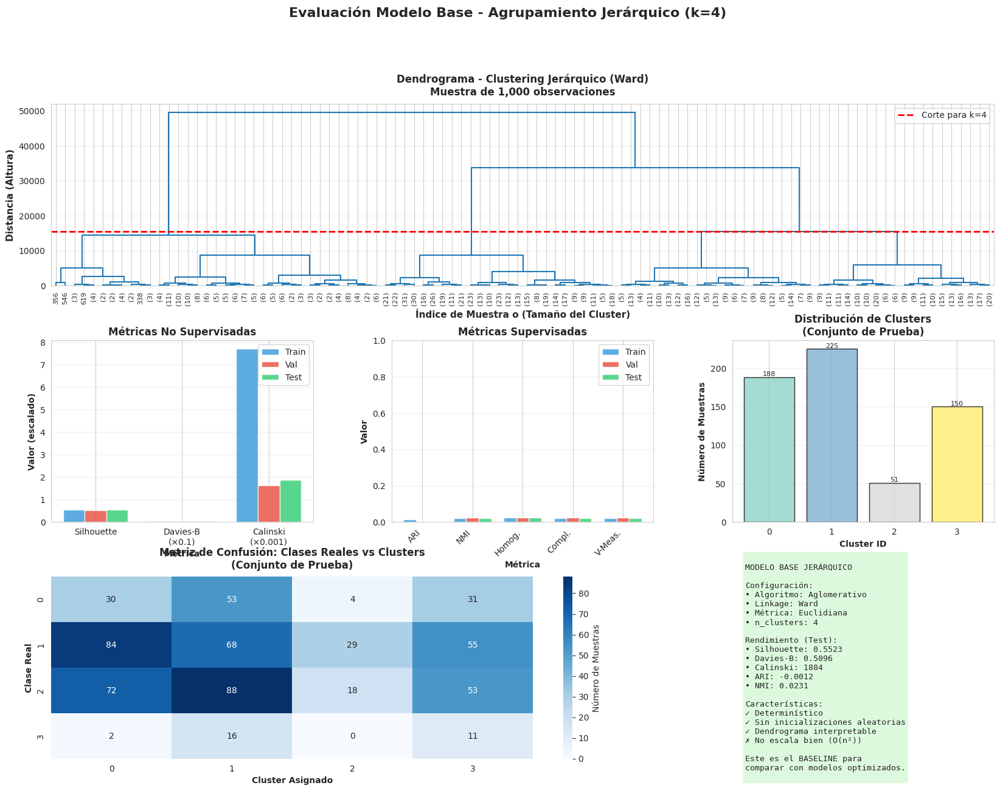


✓ Visualización guardada: 'modelo_jerarquico_base_evaluacion.png'


 ANÁLISIS DE GENERALIZACIÓN

  NOTA IMPORTANTE sobre generalización en clustering jerárquico:
   • Cada conjunto (train/val/test) se agrupa INDEPENDIENTEMENTE
   • NO hay un 'modelo' entrenado que se aplique a nuevos datos
   • Las diferencias reflejan variabilidad en la estructura de cada conjunto
   • NO es overfitting en el sentido tradicional

 Variabilidad entre Entrenamiento y Prueba:
   • Silhouette:  0.0081
   • ARI:         0.0165
   • NMI:         0.0003

   Variabilidad promedio:  0.0083

    EXCELENTE - Estructura muy consistente entre conjuntos


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score,
    confusion_matrix
)
from sklearn.preprocessing import LabelEncoder
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "MODELO BASE - AGRUPAMIENTO JERÁRQUICO (SIN OPTIMIZAR)")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
    print("   Necesitas tener: X_train, X_val, X_test, y_train, y_val, y_test")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ ES AGRUPAMIENTO JERÁRQUICO?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ ES AGRUPAMIENTO JERÁRQUICO?")
    print("="*90)
    print("""
   El agrupamiento jerárquico es un método de clustering que construye una
   jerarquía de clusters mediante fusiones o divisiones sucesivas.

    TIPOS:
   1. Aglomerativo (bottom-up) ← El que usaremos
      • Comienza con cada punto como un cluster individual
      • Fusiona iterativamente los clusters más similares
      • Hasta tener un solo cluster o alcanzar el número deseado

   2. Divisivo (top-down)
      • Comienza con todos los puntos en un cluster
      • Divide iterativamente en clusters más pequeños

    VENTAJAS:
   ✓ No requiere especificar k de antemano
   ✓ Produce un dendrograma (árbol jerárquico) visualizable
   ✓ Permite cortar el árbol a diferentes alturas para explorar
   ✓ No tiene inicializaciones aleatorias (resultados determinísticos)
   ✓ Puede capturar estructuras anidadas en los datos

    DESVENTAJAS:
   ✗ Complejidad computacional O(n²) o mayor
   ✗ No escala bien a datasets grandes
   ✗ Decisiones de fusión son irreversibles
   ✗ Sensible a outliers y ruido

    HIPERPARÁMETROS PRINCIPALES:

   1. n_clusters: Número de clusters finales
   2. linkage (criterio de enlace):
      • 'ward': Minimiza varianza dentro de clusters (por defecto)
      • 'complete': Máxima distancia entre puntos
      • 'average': Distancia promedio entre puntos
      • 'single': Mínima distancia entre puntos

   3. metric (métrica de distancia):
      • 'euclidean': Distancia euclidiana (por defecto)
      • 'manhattan', 'cosine', etc.

    CONFIGURACIÓN DEL MODELO BASE:
   • n_clusters: número de clases reales
   • linkage: 'ward' (método estándar, minimiza varianza)
   • metric: 'euclidean' (por defecto para ward)
   • Sin optimización de hiperparámetros
    """)

    # ============================================================================
    #          ENTRENAMIENTO DEL MODELO BASE
    # ============================================================================

    print("\n" + "="*90)
    print(" ENTRENAMIENTO DEL MODELO BASE")
    print("="*90)

    print(f"\n Configuración del modelo base:")
    print(f"   • n_clusters:  {n_classes} (número de clases reales)")
    print(f"   • linkage:     ward (minimiza varianza)")
    print(f"   • metric:      euclidean (distancia euclidiana)")

    print(f"\n Entrenando modelo jerárquico aglomerativo...")

    # Entrenar modelo base
    hierarchical_base = AgglomerativeClustering(
        n_clusters=n_classes,
        linkage='ward',
        metric='euclidean'
    )

    # Ajustar al conjunto de entrenamiento
    clusters_train = hierarchical_base.fit_predict(X_train)

    print(f" Modelo base entrenado exitosamente")
    print(f"   • {n_classes} clusters formados")
    print(f"   • Método: Aglomerativo con enlace Ward")

    # ============================================================================
    #          PREDICCIONES EN VALIDACIÓN Y PRUEBA
    # ============================================================================

    print("\n" + "="*90)
    print(" PREDICCIONES EN VALIDACIÓN Y PRUEBA")
    print("="*90)

    print("\n  NOTA: Agrupamiento jerárquico no tiene método .predict()")
    print("   Debemos entrenar modelos separados o usar alternativas.")
    print("   Entrenando modelos independientes para cada conjunto...\n")

    # Para validación
    hierarchical_val = AgglomerativeClustering(
        n_clusters=n_classes,
        linkage='ward',
        metric='euclidean'
    )
    clusters_val = hierarchical_val.fit_predict(X_val)

    # Para prueba
    hierarchical_test = AgglomerativeClustering(
        n_clusters=n_classes,
        linkage='ward',
        metric='euclidean'
    )
    clusters_test = hierarchical_test.fit_predict(X_test)

    print("✓ Predicciones completadas para:")
    print(f"   • Entrenamiento: {len(clusters_train):,} muestras")
    print(f"   • Validación:    {len(clusters_val):,} muestras")
    print(f"   • Prueba:        {len(clusters_test):,} muestras")

    # ============================================================================
    #          DENDROGRAMA (Muestra del conjunto de entrenamiento)
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO DENDROGRAMA")
    print("="*90)

    # Para datasets grandes, usar una muestra
    max_samples_dendro = 1000
    if len(X_train) > max_samples_dendro:
        print(f"\n  Dataset grande ({len(X_train):,} muestras)")
        print(f"   Usando muestra de {max_samples_dendro} para dendrograma...")

        # Convertir a array si es DataFrame
        if isinstance(X_train, pd.DataFrame):
            X_train_array = X_train.values
        else:
            X_train_array = X_train

        sample_indices = np.random.RandomState(42).choice(len(X_train_array),
                                                          max_samples_dendro,
                                                          replace=False)
        X_dendro = X_train_array[sample_indices]
    else:
        if isinstance(X_train, pd.DataFrame):
            X_dendro = X_train.values
        else:
            X_dendro = X_train
        print(f"\n   Usando conjunto completo ({len(X_train):,} muestras)")

    print("   Calculando matriz de enlaces...")
    linkage_matrix = linkage(X_dendro, method='ward', metric='euclidean')
    print("✓ Dendrograma calculado")

    # ============================================================================
    #          EVALUACIÓN - MÉTRICAS NO SUPERVISADAS
    # ============================================================================

    print("\n" + "="*90)
    print(" EVALUACIÓN - MÉTRICAS NO SUPERVISADAS (Calidad del Clustering)")
    print("="*90)

    def calculate_unsupervised_metrics(X, clusters, set_name):
        """Calcula métricas no supervisadas para clustering"""
        print(f"\n {set_name}:")
        print("-" * 70)

        # Calcular métricas
        silhouette = silhouette_score(X, clusters)
        davies_bouldin = davies_bouldin_score(X, clusters)
        calinski = calinski_harabasz_score(X, clusters)

        print(f"  • Silhouette Score:           {silhouette:.4f}  ← rango: [-1, 1], óptimo: ~1")
        print(f"  • Davies-Bouldin Index:       {davies_bouldin:.4f}  ← óptimo: ~0")
        print(f"  • Calinski-Harabasz Score:    {calinski:,.2f}  ← óptimo: mayor valor")

        # Interpretación del Silhouette
        if silhouette >= 0.71:
            quality = " EXCELENTE - Estructura fuerte"
        elif silhouette >= 0.51:
            quality = "✓ BUENO - Estructura razonable"
        elif silhouette >= 0.26:
            quality = "  REGULAR - Estructura débil"
        else:
            quality = " POBRE - Sin estructura substancial"

        print(f"\n  Calidad general: {quality}")

        return {
            'Silhouette': silhouette,
            'Davies-Bouldin': davies_bouldin,
            'Calinski-Harabasz': calinski
        }

    # Calcular métricas para cada conjunto
    metrics_train = calculate_unsupervised_metrics(X_train, clusters_train,
                                                    "Conjunto de ENTRENAMIENTO")
    metrics_val = calculate_unsupervised_metrics(X_val, clusters_val,
                                                  "Conjunto de VALIDACIÓN")
    metrics_test = calculate_unsupervised_metrics(X_test, clusters_test,
                                                   "Conjunto de PRUEBA")

    # ============================================================================
    #          EVALUACIÓN - MÉTRICAS SUPERVISADAS
    # ============================================================================

    print("\n\n" + "="*90)
    print(" EVALUACIÓN - MÉTRICAS SUPERVISADAS (Comparación con Clases Reales)")
    print("="*90)

    def calculate_supervised_metrics(y_true, clusters, set_name):
        """Calcula métricas supervisadas para clustering"""
        print(f"\n {set_name}:")
        print("-" * 70)

        # Calcular métricas
        ari = adjusted_rand_score(y_true, clusters)
        nmi = normalized_mutual_info_score(y_true, clusters)
        homogeneity = homogeneity_score(y_true, clusters)
        completeness = completeness_score(y_true, clusters)
        v_measure = v_measure_score(y_true, clusters)

        print(f"  • Adjusted Rand Index (ARI):  {ari:.4f}  ← rango: [-1, 1], óptimo: 1")
        print(f"  • Normalized Mutual Info:     {nmi:.4f}  ← rango: [0, 1], óptimo: 1")
        print(f"  • Homogeneity:                 {homogeneity:.4f}  ← rango: [0, 1], óptimo: 1")
        print(f"  • Completeness:                {completeness:.4f}  ← rango: [0, 1], óptimo: 1")
        print(f"  • V-Measure:                   {v_measure:.4f}  ← rango: [0, 1], óptimo: 1")

        # Interpretación del ARI
        if ari >= 0.90:
            quality = " EXCELENTE concordancia con clases reales"
        elif ari >= 0.70:
            quality = "✓ BUENA concordancia con clases reales"
        elif ari >= 0.50:
            quality = "→ MODERADA concordancia con clases reales"
        elif ari >= 0.30:
            quality = "  BAJA concordancia con clases reales"
        else:
            quality = " MUY BAJA concordancia con clases reales"

        print(f"\n  Concordancia con clases reales: {quality}")

        return {
            'ARI': ari,
            'NMI': nmi,
            'Homogeneity': homogeneity,
            'Completeness': completeness,
            'V-Measure': v_measure
        }

    # Calcular métricas supervisadas
    sup_metrics_train = calculate_supervised_metrics(y_train_encoded, clusters_train,
                                                      "Conjunto de ENTRENAMIENTO")
    sup_metrics_val = calculate_supervised_metrics(y_val_encoded, clusters_val,
                                                    "Conjunto de VALIDACIÓN")
    sup_metrics_test = calculate_supervised_metrics(y_test_encoded, clusters_test,
                                                     "Conjunto de PRUEBA")

    # ============================================================================
    #          TABLA RESUMEN COMPARATIVA
    # ============================================================================

    print("\n\n" + "="*90)
    print(" TABLA RESUMEN COMPARATIVA - TODAS LAS MÉTRICAS")
    print("="*90)

    # Crear DataFrame comparativo
    comparison_df = pd.DataFrame({
        'Métrica': [
            'Silhouette Score',
            'Davies-Bouldin',
            'Calinski-Harabasz',
            'ARI',
            'NMI',
            'Homogeneity',
            'Completeness',
            'V-Measure'
        ],
        'Entrenamiento': [
            metrics_train['Silhouette'],
            metrics_train['Davies-Bouldin'],
            metrics_train['Calinski-Harabasz'],
            sup_metrics_train['ARI'],
            sup_metrics_train['NMI'],
            sup_metrics_train['Homogeneity'],
            sup_metrics_train['Completeness'],
            sup_metrics_train['V-Measure']
        ],
        'Validación': [
            metrics_val['Silhouette'],
            metrics_val['Davies-Bouldin'],
            metrics_val['Calinski-Harabasz'],
            sup_metrics_val['ARI'],
            sup_metrics_val['NMI'],
            sup_metrics_val['Homogeneity'],
            sup_metrics_val['Completeness'],
            sup_metrics_val['V-Measure']
        ],
        'Prueba': [
            metrics_test['Silhouette'],
            metrics_test['Davies-Bouldin'],
            metrics_test['Calinski-Harabasz'],
            sup_metrics_test['ARI'],
            sup_metrics_test['NMI'],
            sup_metrics_test['Homogeneity'],
            sup_metrics_test['Completeness'],
            sup_metrics_test['V-Measure']
        ]
    })

    print("\n")
    print(comparison_df.to_string(index=False))

    # Guardar resultados
    comparison_df.to_csv('metricas_modelo_jerarquico_base.csv', index=False)
    print("\n✓ Resultados guardados en 'metricas_modelo_jerarquico_base.csv'")

    # ============================================================================
    #          DISTRIBUCIÓN DE CLUSTERS
    # ============================================================================

    print("\n\n" + "="*90)
    print(" DISTRIBUCIÓN DE CLUSTERS")
    print("="*90)

    def print_cluster_distribution(clusters, y_true, set_name):
        """Imprime distribución de clusters"""
        print(f"\n {set_name}:")
        print("-" * 70)

        unique, counts = np.unique(clusters, return_counts=True)

        print("\n  Tamaño de cada cluster:")
        for cluster_id, count in zip(unique, counts):
            percentage = (count / len(clusters)) * 100
            print(f"    Cluster {cluster_id}: {count:,} muestras ({percentage:.1f}%)")

        # Calcular balance
        std_percentage = np.std(counts / len(clusters) * 100)
        if std_percentage < 5:
            balance = "muy balanceados"
        elif std_percentage < 10:
            balance = "balanceados"
        else:
            balance = "desbalanceados"

        print(f"\n  Total: {len(clusters):,} muestras")
        print(f"  Balance: {balance} (desv. std: {std_percentage:.2f}%)")

    print_cluster_distribution(clusters_train, y_train_encoded, "ENTRENAMIENTO")
    print_cluster_distribution(clusters_val, y_val_encoded, "VALIDACIÓN")
    print_cluster_distribution(clusters_test, y_test_encoded, "PRUEBA")

    # ============================================================================
    #          VISUALIZACIONES
    # ============================================================================

    print("\n\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    fig = plt.figure(figsize=(20, 14))
    gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)
    fig.suptitle(f'Evaluación Modelo Base - Agrupamiento Jerárquico (k={n_classes})',
                 fontsize=16, fontweight='bold', y=0.995)

    # ---- SUBPLOT 1: Dendrograma ----
    ax1 = fig.add_subplot(gs[0, :])

    # Determinar cuántas muestras mostrar en el dendrograma
    max_display = min(100, len(linkage_matrix))

    dendrogram(linkage_matrix,
               ax=ax1,
               truncate_mode='lastp',
               p=max_display,
               show_leaf_counts=True,
               leaf_font_size=8,
               color_threshold=0)

    # Línea horizontal en la altura de corte para n_clusters
    if len(linkage_matrix) > 0:
        height_cut = linkage_matrix[-(n_classes-1), 2]
        ax1.axhline(y=height_cut, color='red', linestyle='--', linewidth=2,
                    label=f'Corte para k={n_classes}')

    ax1.set_xlabel('Índice de Muestra o (Tamaño del Cluster)', fontweight='bold', fontsize=11)
    ax1.set_ylabel('Distancia (Altura)', fontweight='bold', fontsize=11)
    ax1.set_title(f'Dendrograma - Clustering Jerárquico (Ward)\nMuestra de {len(X_dendro):,} observaciones',
                  fontweight='bold', fontsize=12, pad=10)
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 2: Comparación Métricas No Supervisadas ----
    ax2 = fig.add_subplot(gs[1, 0])
    metrics_names = ['Silhouette', 'Davies-B\n(×0.1)', 'Calinski\n(×0.001)']
    train_vals = [metrics_train['Silhouette'],
                  metrics_train['Davies-Bouldin']*0.1,
                  metrics_train['Calinski-Harabasz']*0.001]
    val_vals = [metrics_val['Silhouette'],
                metrics_val['Davies-Bouldin']*0.1,
                metrics_val['Calinski-Harabasz']*0.001]
    test_vals = [metrics_test['Silhouette'],
                 metrics_test['Davies-Bouldin']*0.1,
                 metrics_test['Calinski-Harabasz']*0.001]

    x = np.arange(len(metrics_names))
    width = 0.25

    ax2.bar(x - width, train_vals, width, label='Train', alpha=0.8, color='#3498db')
    ax2.bar(x, val_vals, width, label='Val', alpha=0.8, color='#e74c3c')
    ax2.bar(x + width, test_vals, width, label='Test', alpha=0.8, color='#2ecc71')

    ax2.set_xlabel('Métrica', fontweight='bold')
    ax2.set_ylabel('Valor (escalado)', fontweight='bold')
    ax2.set_title('Métricas No Supervisadas', fontweight='bold')
    ax2.set_xticks(x)
    ax2.set_xticklabels(metrics_names)
    ax2.legend()
    ax2.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 3: Comparación Métricas Supervisadas ----
    ax3 = fig.add_subplot(gs[1, 1])
    sup_names = ['ARI', 'NMI', 'Homog.', 'Compl.', 'V-Meas.']
    train_sup = [sup_metrics_train[m] for m in ['ARI', 'NMI', 'Homogeneity', 'Completeness', 'V-Measure']]
    val_sup = [sup_metrics_val[m] for m in ['ARI', 'NMI', 'Homogeneity', 'Completeness', 'V-Measure']]
    test_sup = [sup_metrics_test[m] for m in ['ARI', 'NMI', 'Homogeneity', 'Completeness', 'V-Measure']]

    x2 = np.arange(len(sup_names))

    ax3.bar(x2 - width, train_sup, width, label='Train', alpha=0.8, color='#3498db')
    ax3.bar(x2, val_sup, width, label='Val', alpha=0.8, color='#e74c3c')
    ax3.bar(x2 + width, test_sup, width, label='Test', alpha=0.8, color='#2ecc71')

    ax3.set_xlabel('Métrica', fontweight='bold')
    ax3.set_ylabel('Valor', fontweight='bold')
    ax3.set_title('Métricas Supervisadas', fontweight='bold')
    ax3.set_xticks(x2)
    ax3.set_xticklabels(sup_names, rotation=45, ha='right')
    ax3.set_ylim([0, 1])
    ax3.legend()
    ax3.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 4: Distribución de Clusters (Test) ----
    ax4 = fig.add_subplot(gs[1, 2])
    unique_test, counts_test = np.unique(clusters_test, return_counts=True)
    colors_clusters = plt.cm.Set3(np.linspace(0, 1, len(unique_test)))
    bars = ax4.bar(unique_test, counts_test, color=colors_clusters, edgecolor='black', alpha=0.8)
    ax4.set_xlabel('Cluster ID', fontweight='bold')
    ax4.set_ylabel('Número de Muestras', fontweight='bold')
    ax4.set_title('Distribución de Clusters\n(Conjunto de Prueba)', fontweight='bold')
    ax4.set_xticks(unique_test)
    ax4.grid(True, alpha=0.3, axis='y')

    # Añadir valores sobre barras
    for bar, count in zip(bars, counts_test):
        height = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2., height,
                f'{count}', ha='center', va='bottom', fontsize=8)

    # ---- SUBPLOT 5: Matriz de Confusión ----
    ax5 = fig.add_subplot(gs[2, :2])
    conf_matrix = confusion_matrix(y_test_encoded, clusters_test)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', ax=ax5,
                cbar_kws={'label': 'Número de Muestras'})
    ax5.set_xlabel('Cluster Asignado', fontweight='bold')
    ax5.set_ylabel('Clase Real', fontweight='bold')
    ax5.set_title('Matriz de Confusión: Clases Reales vs Clusters\n(Conjunto de Prueba)',
                  fontweight='bold', pad=10)

    # ---- SUBPLOT 6: Resumen ----
    ax6 = fig.add_subplot(gs[2, 2])
    ax6.axis('off')

    summary_text = f"""
MODELO BASE JERÁRQUICO

Configuración:
• Algoritmo: Aglomerativo
• Linkage: Ward
• Métrica: Euclidiana
• n_clusters: {n_classes}

Rendimiento (Test):
• Silhouette: {metrics_test['Silhouette']:.4f}
• Davies-B: {metrics_test['Davies-Bouldin']:.4f}
• Calinski: {metrics_test['Calinski-Harabasz']:.0f}
• ARI: {sup_metrics_test['ARI']:.4f}
• NMI: {sup_metrics_test['NMI']:.4f}

Características:
✓ Determinístico
✓ Sin inicializaciones aleatorias
✓ Dendrograma interpretable
✗ No escala bien (O(n²))

Este es el BASELINE para
comparar con modelos optimizados.
    """

    ax6.text(0.05, 0.5, summary_text, fontsize=9.5, family='monospace',
             verticalalignment='center', bbox=dict(boxstyle='round',
             facecolor='lightgreen', alpha=0.3))

    plt.savefig('modelo_jerarquico_base_evaluacion.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n✓ Visualización guardada: 'modelo_jerarquico_base_evaluacion.png'")

    # ============================================================================
    #          ANÁLISIS DE GENERALIZACIÓN
    # ============================================================================

    print("\n\n" + "="*90)
    print(" ANÁLISIS DE GENERALIZACIÓN")
    print("="*90)

    print("\n  NOTA IMPORTANTE sobre generalización en clustering jerárquico:")
    print("   • Cada conjunto (train/val/test) se agrupa INDEPENDIENTEMENTE")
    print("   • NO hay un 'modelo' entrenado que se aplique a nuevos datos")
    print("   • Las diferencias reflejan variabilidad en la estructura de cada conjunto")
    print("   • NO es overfitting en el sentido tradicional\n")

    # Calcular diferencias entre conjuntos
    sil_gap_train_test = abs(metrics_train['Silhouette'] - metrics_test['Silhouette'])
    ari_gap_train_test = abs(sup_metrics_train['ARI'] - sup_metrics_test['ARI'])
    nmi_gap_train_test = abs(sup_metrics_train['NMI'] - sup_metrics_test['NMI'])

    print(f" Variabilidad entre Entrenamiento y Prueba:")
    print(f"   • Silhouette:  {sil_gap_train_test:.4f}")
    print(f"   • ARI:         {ari_gap_train_test:.4f}")
    print(f"   • NMI:         {nmi_gap_train_test:.4f}")

    avg_gap = (sil_gap_train_test + ari_gap_train_test + nmi_gap_train_test) / 3

    print(f"\n   Variabilidad promedio:  {avg_gap:.4f}")

    if avg_gap < 0.05:
        print("\n    EXCELENTE - Estructura muy consistente entre conjuntos")
    elif avg_gap < 0.10:
        print("\n   ✓ BUENO - Estructura similar entre conjuntos")
    else:
        print("\n   → Los conjuntos tienen estructuras diferentes")
        print("      Esto es normal si los datos se particionaron aleatoriamente")



          ANÁLISIS AVANZADO DEL DENDROGRAMA - CLUSTERING JERÁRQUICO
               Métricas Específicas: Distancia de Corte y Altura de Fusión

  OBJETIVO:
   Este script analiza métricas específicas del clustering jerárquico:
   • Distancia de corte (threshold): Para decidir número óptimo de clusters
   • Altura de fusión: Para evaluar en qué nivel se combinan clusters
   • Análisis de inconsistencia: Para identificar saltos significativos

                              1. PREPARACIÓN DE DATOS
 ✓ Datos disponibles:
   • X_train shape: (2860, 5)
   • X_val shape:   (613, 5)

 ✓ Número de clases reales: 4
 ✓ Usando muestra de 500 observaciones para análisis detallado

                         2. CÁLCULO DE LINKAGE MATRIX

  Calculando matrices de linkage para diferentes métodos...
   • Método ward... ✓ (499 fusiones)
   • Método complete... ✓ (499 fusiones)
   • Método average... ✓ (499 fusiones)
   • Método single... ✓ (499 fusiones)

 ✓ Matrices de linkage calculadas

  Usando método 

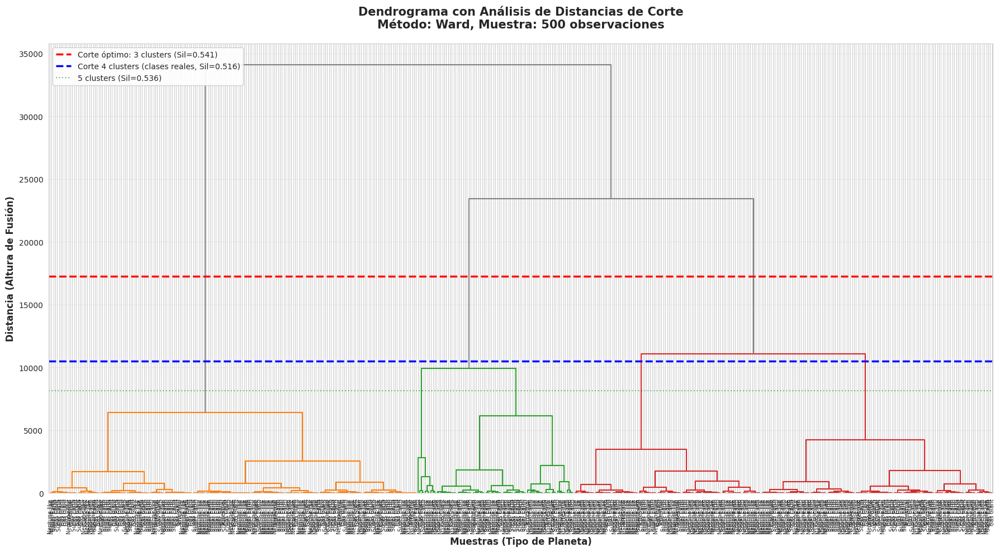

  ✓ Dendrograma con líneas de corte guardado

  Generando gráfico de evolución de alturas...


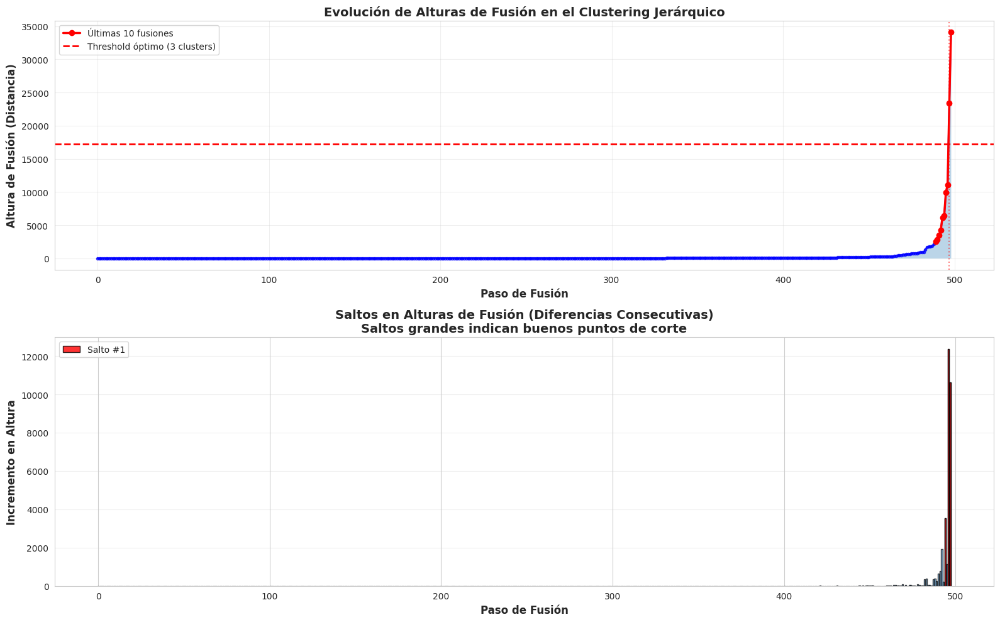

  ✓ Gráfico de alturas de fusión guardado

  Generando análisis threshold vs silhouette...


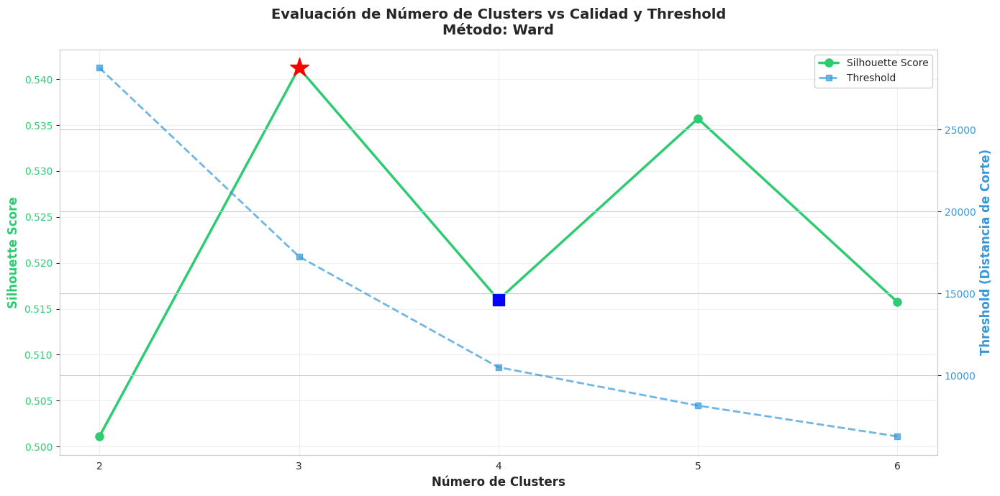

  ✓ Análisis threshold vs clusters guardado

  Generando análisis de inconsistencia...


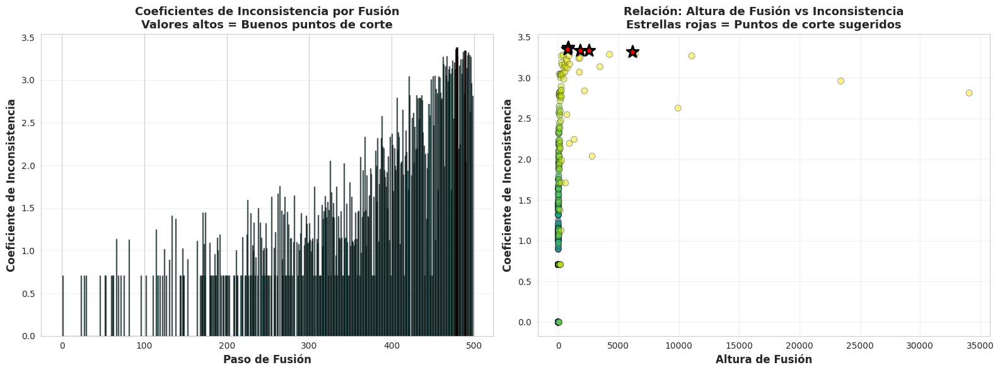

  ✓ Análisis de inconsistencia guardado

  Generando comparación de métodos de linkage...


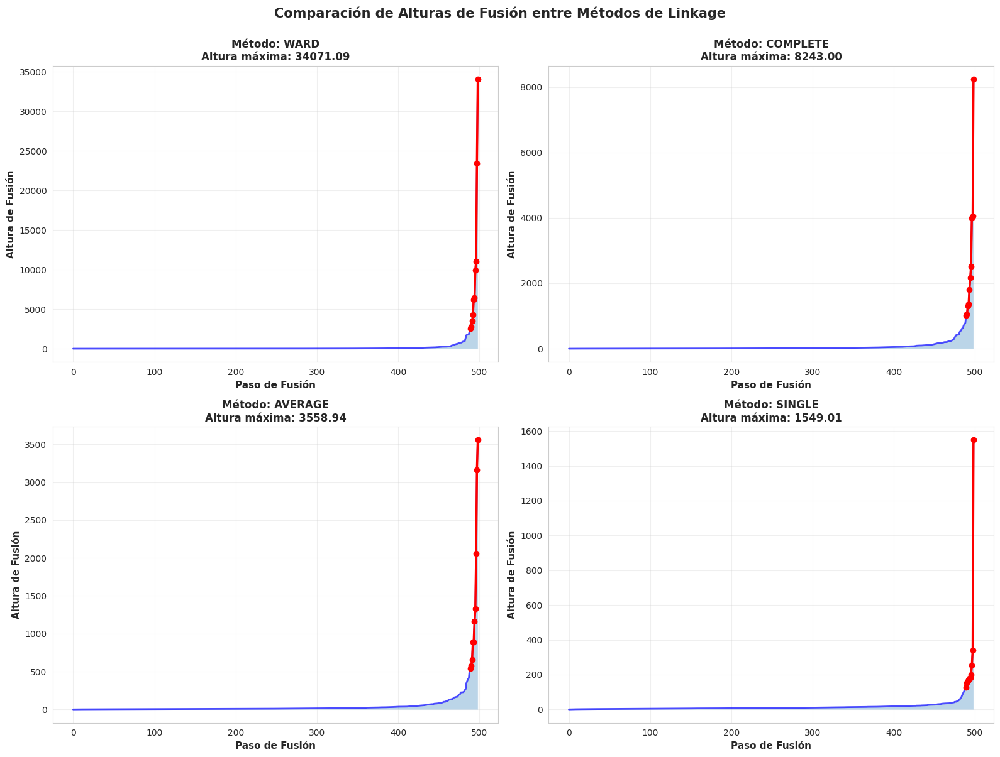

  ✓ Comparación de métodos guardado

 ✓ Todas las visualizaciones completadas!

                              7. RESUMEN Y RECOMENDACIONES

  📊 DATOS ANALIZADOS:
   • Muestra utilizada:      500 observaciones
   • Método de linkage:      ward
   • Clases reales:          4

  🎯 NÚMERO ÓPTIMO DE CLUSTERS (según Silhouette):
   • Clusters recomendados:  3
   • Threshold óptimo:       17253.5687
   • Silhouette Score:       0.5412

  📏 ANÁLISIS DE DISTANCIA DE CORTE:
   • Rango analizado:        2 a 6 clusters
   • Altura mínima:          0.0600
   • Altura máxima:          34071.0941
   • Mayor salto en altura:  12359.1102

  📈 ANÁLISIS DE INCONSISTENCIA:
   • Profundidad analizada:  4
   • Inconsistencia máxima:  3.3714
   • Inconsistencia media:   1.0220

  💡 RECOMENDACIONES:
   ⚠ El número óptimo (3) está cerca de las clases reales (4)
     Considera usar 4 clusters para alinearte con las clases reales

   ✓ Hay saltos significativos en las alturas de fusión
     Esto indica clusters 

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import LabelEncoder
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, inconsistent
from scipy.spatial.distance import pdist
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

print("="*90)
print(" "*10 + "ANÁLISIS AVANZADO DEL DENDROGRAMA - CLUSTERING JERÁRQUICO")
print(" "*15 + "Métricas Específicas: Distancia de Corte y Altura de Fusión")
print("="*90)

print("\n  OBJETIVO:")
print("   Este script analiza métricas específicas del clustering jerárquico:")
print("   • Distancia de corte (threshold): Para decidir número óptimo de clusters")
print("   • Altura de fusión: Para evaluar en qué nivel se combinan clusters")
print("   • Análisis de inconsistencia: Para identificar saltos significativos")

# ============================================================================
#                     1. VERIFICAR DATOS Y PREPARACIÓN
# ============================================================================

print("\n" + "="*90)
print(" "*30 + "1. PREPARACIÓN DE DATOS")
print("="*90)

if 'X_train' not in globals() or 'X_val' not in globals():
    print("  ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
else:
    print(f" ✓ Datos disponibles:")
    print(f"   • X_train shape: {X_train.shape}")
    print(f"   • X_val shape:   {X_val.shape}")

    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    n_classes = len(np.unique(y_train_encoded))

    print(f"\n ✓ Número de clases reales: {n_classes}")

    # Usar muestra para análisis detallado
    sample_size = min(500, len(X_train))
    sample_indices = np.random.RandomState(42).choice(len(X_train), sample_size, replace=False)
    X_sample = X_train.iloc[sample_indices]
    y_sample = y_train.iloc[sample_indices]
    y_sample_encoded = y_train_encoded[sample_indices]

    print(f" ✓ Usando muestra de {sample_size} observaciones para análisis detallado")

    # ============================================================================
    #                     2. CÁLCULO DE LINKAGE MATRIX
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "2. CÁLCULO DE LINKAGE MATRIX")
    print("="*90)

    # Probar diferentes métodos
    linkage_methods = ['ward', 'complete', 'average', 'single']
    linkage_matrices = {}

    print("\n  Calculando matrices de linkage para diferentes métodos...")

    for method in linkage_methods:
        print(f"   • Método {method}...", end=" ")
        Z = linkage(X_sample, method=method, metric='euclidean')
        linkage_matrices[method] = Z
        print(f"✓ ({Z.shape[0]} fusiones)")

    print("\n ✓ Matrices de linkage calculadas")

    # Seleccionar método principal (ward por defecto o el mejor)
    main_method = 'ward'
    Z_main = linkage_matrices[main_method]

    print(f"\n  Usando método '{main_method}' para análisis detallado")
    print(f"   • Dimensión de matriz: {Z_main.shape}")
    print(f"   • Formato: [índice1, índice2, distancia, n_elementos]")

    # ============================================================================
    #                     3. ANÁLISIS DE ALTURAS DE FUSIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "3. ANÁLISIS DE ALTURAS DE FUSIÓN")
    print("="*90)

    print("\n  Las alturas de fusión indican a qué distancia se combinan clusters")
    print("  Saltos grandes → buenos puntos de corte para definir clusters\n")

    # Extraer alturas de fusión (columna 2 de la matriz)
    fusion_heights = Z_main[:, 2]

    # Estadísticas de las alturas
    print("  ESTADÍSTICAS DE ALTURAS DE FUSIÓN:")
    print(f"   • Mínima:    {fusion_heights.min():.4f}")
    print(f"   • Máxima:    {fusion_heights.max():.4f}")
    print(f"   • Media:     {fusion_heights.mean():.4f}")
    print(f"   • Mediana:   {np.median(fusion_heights):.4f}")
    print(f"   • Desv. Est: {fusion_heights.std():.4f}")

    # Identificar últimas fusiones (más importantes)
    n_last = 10
    last_fusions = fusion_heights[-n_last:]

    print(f"\n  ÚLTIMAS {n_last} FUSIONES (más relevantes):")
    for i, height in enumerate(reversed(last_fusions), 1):
        n_clusters = i + 1
        print(f"   {i}. Altura: {height:8.4f}  →  {n_clusters:2d} clusters")

    # Calcular diferencias entre fusiones consecutivas
    fusion_diffs = np.diff(fusion_heights)

    # Encontrar los saltos más grandes
    n_biggest_jumps = 5
    biggest_jumps_indices = np.argsort(fusion_diffs)[-n_biggest_jumps:][::-1]

    print(f"\n  MAYORES SALTOS EN ALTURA (mejores puntos de corte):")
    for rank, idx in enumerate(biggest_jumps_indices, 1):
        jump_size = fusion_diffs[idx]
        height_before = fusion_heights[idx]
        height_after = fusion_heights[idx + 1]
        n_clusters_after = len(fusion_heights) - idx

        print(f"   {rank}. Salto de {jump_size:.4f} en fusión {idx}")
        print(f"      De altura {height_before:.4f} a {height_after:.4f}")
        print(f"      Sugiere {n_clusters_after} clusters")

    # ============================================================================
    #                     4. ANÁLISIS DE DISTANCIA DE CORTE (THRESHOLD)
    # ============================================================================

    print("\n" + "="*90)
    print(" "*20 + "4. ANÁLISIS DE DISTANCIA DE CORTE (THRESHOLD)")
    print("="*90)

    print("\n  La distancia de corte determina cuántos clusters se forman")
    print("  Evaluaremos diferentes cortes y su calidad\n")

    # Rango de clusters a evaluar
    cluster_range = range(2, min(11, n_classes + 3))
    threshold_results = []

    print("  EVALUACIÓN DE DIFERENTES NÚMEROS DE CLUSTERS:\n")
    print("  " + "-"*70)
    print(f"  {'N°Clusters':^12} | {'Threshold':^12} | {'Silhouette':^12} | {'Calidad':^12}")
    print("  " + "-"*70)

    best_silhouette = -1
    best_k = 2
    best_threshold = 0

    for k in cluster_range:
        # Calcular threshold para k clusters
        # El threshold es la altura donde se corta el dendrograma
        threshold = (fusion_heights[-(k-1)] + fusion_heights[-k]) / 2 if k <= len(fusion_heights) else fusion_heights[-1]

        # Obtener clusters con ese threshold
        clusters = fcluster(Z_main, k, criterion='maxclust')

        # Calcular silhouette si hay más de 1 cluster
        if len(np.unique(clusters)) > 1:
            sil_score = silhouette_score(X_sample, clusters)
        else:
            sil_score = -1

        # Determinar calidad
        if sil_score > 0.5:
            quality = "Excelente ✓"
        elif sil_score > 0.3:
            quality = "Buena"
        elif sil_score > 0:
            quality = "Moderada"
        else:
            quality = "Baja"

        print(f"  {k:^12d} | {threshold:^12.4f} | {sil_score:^12.4f} | {quality:^12s}")

        threshold_results.append({
            'n_clusters': k,
            'threshold': threshold,
            'silhouette': sil_score
        })

        # Guardar el mejor
        if sil_score > best_silhouette:
            best_silhouette = sil_score
            best_k = k
            best_threshold = threshold

    print("  " + "-"*70)
    print(f"\n ✓ MEJOR CONFIGURACIÓN (según Silhouette Score):")
    print(f"   • Número de clusters: {best_k}")
    print(f"   • Threshold óptimo:   {best_threshold:.4f}")
    print(f"   • Silhouette Score:   {best_silhouette:.4f}")

    # Comparar con número de clases reales
    threshold_nclasses = (fusion_heights[-(n_classes-1)] + fusion_heights[-n_classes]) / 2 if n_classes <= len(fusion_heights) else fusion_heights[-1]
    clusters_nclasses = fcluster(Z_main, n_classes, criterion='maxclust')
    sil_nclasses = silhouette_score(X_sample, clusters_nclasses)

    print(f"\n   CONFIGURACIÓN CON {n_classes} CLUSTERS (igual a clases reales):")
    print(f"   • Threshold:          {threshold_nclasses:.4f}")
    print(f"   • Silhouette Score:   {sil_nclasses:.4f}")

    # ============================================================================
    #                     5. ANÁLISIS DE INCONSISTENCIA
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "5. ANÁLISIS DE INCONSISTENCIA")
    print("="*90)

    print("\n  La inconsistencia mide qué tan diferente es una fusión respecto a fusiones cercanas")
    print("  Valores altos indican buenos puntos de corte\n")

    # Calcular coeficientes de inconsistencia
    inconsistency_depth = min(4, len(fusion_heights) // 10)
    inconsistency_matrix = inconsistent(Z_main, d=inconsistency_depth)

    print(f"  Profundidad de análisis: {inconsistency_depth}")
    print(f"  Dimensión de matriz: {inconsistency_matrix.shape}")
    print(f"  Columnas: [mean, std, count, inconsistency_coefficient]")

    # Extraer coeficientes de inconsistencia (columna 3)
    inconsistency_coeffs = inconsistency_matrix[:, 3]

    print(f"\n  ESTADÍSTICAS DE INCONSISTENCIA:")
    print(f"   • Mínima:    {inconsistency_coeffs.min():.4f}")
    print(f"   • Máxima:    {inconsistency_coeffs.max():.4f}")
    print(f"   • Media:     {inconsistency_coeffs.mean():.4f}")
    print(f"   • Mediana:   {np.median(inconsistency_coeffs):.4f}")

    # Encontrar fusiones más inconsistentes (mejores puntos de corte)
    n_top_inconsistent = 5
    top_inconsistent_indices = np.argsort(inconsistency_coeffs)[-n_top_inconsistent:][::-1]

    print(f"\n  FUSIONES MÁS INCONSISTENTES (mejores puntos de corte):")
    for rank, idx in enumerate(top_inconsistent_indices, 1):
        incons_coeff = inconsistency_coeffs[idx]
        height = fusion_heights[idx]
        n_clusters = len(fusion_heights) - idx

        print(f"   {rank}. Fusión {idx}: Inconsistencia = {incons_coeff:.4f}")
        print(f"      Altura = {height:.4f}, Sugiere {n_clusters} clusters")

    # ============================================================================
    #                     6. VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" "*25 + "6. GENERANDO VISUALIZACIONES")
    print("="*90)

    # 1. Dendrograma con múltiples líneas de corte
    print("\n  Generando dendrograma con líneas de corte...")

    fig, ax = plt.subplots(figsize=(18, 10))

    dendrogram_plot = dendrogram(
        Z_main,
        ax=ax,
        labels=y_sample.values,
        leaf_font_size=7,
        color_threshold=best_threshold,
        above_threshold_color='gray'
    )

    # Línea de corte óptimo
    ax.axhline(y=best_threshold, color='red', linestyle='--', linewidth=2.5,
               label=f'Corte óptimo: {best_k} clusters (Sil={best_silhouette:.3f})')

    # Línea para número de clases reales
    ax.axhline(y=threshold_nclasses, color='blue', linestyle='--', linewidth=2.5,
               label=f'Corte {n_classes} clusters (clases reales, Sil={sil_nclasses:.3f})')

    # Líneas para otros puntos interesantes
    for i, (k, result) in enumerate([(k, r) for r in threshold_results for k in [r['n_clusters']]
                                      if k in [3, 5, 7] and k != best_k and k != n_classes][:2]):
        ax.axhline(y=result['threshold'], color='green', linestyle=':', linewidth=1.5, alpha=0.5,
                   label=f'{result["n_clusters"]} clusters (Sil={result["silhouette"]:.3f})')

    ax.set_title(f'Dendrograma con Análisis de Distancias de Corte\n' +
                 f'Método: {main_method.capitalize()}, Muestra: {sample_size} observaciones',
                 fontsize=15, fontweight='bold', pad=20)
    ax.set_xlabel('Muestras (Tipo de Planeta)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Distancia (Altura de Fusión)', fontsize=12, fontweight='bold')
    ax.legend(loc='upper left', fontsize=10, framealpha=0.9)
    ax.grid(True, alpha=0.3, axis='y')

    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.savefig('dendrograma_analisis_cortes.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("  ✓ Dendrograma con líneas de corte guardado")

    # 2. Evolución de alturas de fusión
    print("\n  Generando gráfico de evolución de alturas...")

    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(16, 10))

    # Gráfico superior: Alturas de fusión
    fusion_steps = np.arange(len(fusion_heights))
    ax1.plot(fusion_steps, fusion_heights, 'b-', linewidth=2, marker='o', markersize=3, alpha=0.7)
    ax1.fill_between(fusion_steps, fusion_heights, alpha=0.3)

    # Marcar últimas fusiones importantes
    n_mark = 10
    ax1.plot(fusion_steps[-n_mark:], fusion_heights[-n_mark:], 'ro-', linewidth=2.5,
             markersize=6, label=f'Últimas {n_mark} fusiones')

    # Marcar el corte óptimo
    step_optimal = len(fusion_heights) - best_k + 1
    ax1.axhline(y=best_threshold, color='red', linestyle='--', linewidth=2,
                label=f'Threshold óptimo ({best_k} clusters)')
    ax1.axvline(x=step_optimal, color='red', linestyle=':', linewidth=1.5, alpha=0.5)

    ax1.set_xlabel('Paso de Fusión', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Altura de Fusión (Distancia)', fontsize=12, fontweight='bold')
    ax1.set_title('Evolución de Alturas de Fusión en el Clustering Jerárquico',
                  fontsize=14, fontweight='bold')
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)

    # Gráfico inferior: Diferencias entre fusiones consecutivas (saltos)
    ax2.bar(fusion_steps[:-1], fusion_diffs, color='steelblue', alpha=0.7, edgecolor='black')

    # Marcar los mayores saltos
    for rank, idx in enumerate(biggest_jumps_indices[:3], 1):
        ax2.bar(idx, fusion_diffs[idx], color='red', alpha=0.8, edgecolor='black',
                label=f'Salto #{rank}' if rank == 1 else '')

    ax2.set_xlabel('Paso de Fusión', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Incremento en Altura', fontsize=12, fontweight='bold')
    ax2.set_title('Saltos en Alturas de Fusión (Diferencias Consecutivas)\n' +
                  'Saltos grandes indican buenos puntos de corte',
                  fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='y')

    # Solo mostrar leyenda si hay saltos marcados
    if len(biggest_jumps_indices) > 0:
        handles, labels = ax2.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        ax2.legend(by_label.values(), by_label.keys(), fontsize=10)

    plt.tight_layout()
    plt.savefig('dendrograma_alturas_fusion.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("  ✓ Gráfico de alturas de fusión guardado")

    # 3. Evaluación de threshold vs número de clusters
    print("\n  Generando análisis threshold vs silhouette...")

    df_threshold = pd.DataFrame(threshold_results)

    fig, ax1 = plt.subplots(figsize=(14, 7))

    # Eje izquierdo: Silhouette Score
    color1 = '#2ecc71'
    ax1.set_xlabel('Número de Clusters', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Silhouette Score', fontsize=12, fontweight='bold', color=color1)
    line1 = ax1.plot(df_threshold['n_clusters'], df_threshold['silhouette'],
                     'o-', color=color1, linewidth=2.5, markersize=8, label='Silhouette Score')
    ax1.tick_params(axis='y', labelcolor=color1)
    ax1.grid(True, alpha=0.3)

    # Marcar el óptimo
    ax1.plot(best_k, best_silhouette, 'r*', markersize=20,
             label=f'Óptimo: {best_k} clusters', zorder=5)

    # Marcar número de clases reales
    if n_classes in df_threshold['n_clusters'].values:
        idx_nclasses = df_threshold[df_threshold['n_clusters'] == n_classes].index[0]
        ax1.plot(n_classes, df_threshold.loc[idx_nclasses, 'silhouette'],
                'bs', markersize=12, label=f'{n_classes} clusters (clases reales)', zorder=5)

    # Eje derecho: Threshold
    ax2 = ax1.twinx()
    color2 = '#3498db'
    ax2.set_ylabel('Threshold (Distancia de Corte)', fontsize=12, fontweight='bold', color=color2)
    line2 = ax2.plot(df_threshold['n_clusters'], df_threshold['threshold'],
                     's--', color=color2, linewidth=2, markersize=6, alpha=0.7, label='Threshold')
    ax2.tick_params(axis='y', labelcolor=color2)

    # Combinar leyendas
    lines = line1 + line2
    labels = [l.get_label() for l in lines]
    ax1.legend(lines, labels, loc='best', fontsize=10, framealpha=0.9)

    ax1.set_xticks(df_threshold['n_clusters'])
    ax1.set_title('Evaluación de Número de Clusters vs Calidad y Threshold\n' +
                  f'Método: {main_method.capitalize()}',
                  fontsize=14, fontweight='bold', pad=15)

    plt.tight_layout()
    plt.savefig('dendrograma_threshold_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("  ✓ Análisis threshold vs clusters guardado")

    # 4. Análisis de inconsistencia
    print("\n  Generando análisis de inconsistencia...")

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    # Gráfico izquierdo: Coeficientes de inconsistencia
    steps = np.arange(len(inconsistency_coeffs))
    ax1.bar(steps, inconsistency_coeffs, color='teal', alpha=0.6, edgecolor='black')

    # Marcar las más inconsistentes
    for rank, idx in enumerate(top_inconsistent_indices[:3], 1):
        ax1.bar(idx, inconsistency_coeffs[idx], color='red', alpha=0.8,
                edgecolor='black', linewidth=2)

    ax1.set_xlabel('Paso de Fusión', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Coeficiente de Inconsistencia', fontsize=12, fontweight='bold')
    ax1.set_title('Coeficientes de Inconsistencia por Fusión\n' +
                  'Valores altos = Buenos puntos de corte',
                  fontsize=13, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='y')

    # Gráfico derecho: Scatter de altura vs inconsistencia
    ax2.scatter(fusion_heights, inconsistency_coeffs, alpha=0.5, s=50,
                c=np.arange(len(fusion_heights)), cmap='viridis', edgecolors='black', linewidth=0.5)

    # Marcar las más inconsistentes
    for idx in top_inconsistent_indices:
        ax2.scatter(fusion_heights[idx], inconsistency_coeffs[idx],
                   color='red', s=200, marker='*', edgecolors='black', linewidth=2,
                   zorder=5)

    ax2.set_xlabel('Altura de Fusión', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Coeficiente de Inconsistencia', fontsize=12, fontweight='bold')
    ax2.set_title('Relación: Altura de Fusión vs Inconsistencia\n' +
                  'Estrellas rojas = Puntos de corte sugeridos',
                  fontsize=13, fontweight='bold')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('dendrograma_inconsistencia.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("  ✓ Análisis de inconsistencia guardado")

    # 5. Comparación de métodos de linkage (alturas)
    print("\n  Generando comparación de métodos de linkage...")

    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes = axes.flatten()

    for idx, method in enumerate(linkage_methods):
        Z = linkage_matrices[method]
        heights = Z[:, 2]
        steps = np.arange(len(heights))

        axes[idx].plot(steps, heights, 'b-', linewidth=2, alpha=0.7)
        axes[idx].fill_between(steps, heights, alpha=0.3)

        # Marcar últimas fusiones
        n_last_vis = 10
        axes[idx].plot(steps[-n_last_vis:], heights[-n_last_vis:],
                      'ro-', linewidth=2.5, markersize=6)

        axes[idx].set_xlabel('Paso de Fusión', fontsize=11, fontweight='bold')
        axes[idx].set_ylabel('Altura de Fusión', fontsize=11, fontweight='bold')
        axes[idx].set_title(f'Método: {method.upper()}\n' +
                           f'Altura máxima: {heights.max():.2f}',
                           fontsize=12, fontweight='bold')
        axes[idx].grid(True, alpha=0.3)

    plt.suptitle('Comparación de Alturas de Fusión entre Métodos de Linkage',
                 fontsize=15, fontweight='bold', y=1.00)
    plt.tight_layout()
    plt.savefig('dendrograma_comparacion_metodos.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("  ✓ Comparación de métodos guardado")

    print("\n ✓ Todas las visualizaciones completadas!")

    # ============================================================================
    #                     7. RESUMEN Y RECOMENDACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" "*30 + "7. RESUMEN Y RECOMENDACIONES")
    print("="*90)

    print(f"\n  📊 DATOS ANALIZADOS:")
    print(f"   • Muestra utilizada:      {sample_size} observaciones")
    print(f"   • Método de linkage:      {main_method}")
    print(f"   • Clases reales:          {n_classes}")

    print(f"\n  🎯 NÚMERO ÓPTIMO DE CLUSTERS (según Silhouette):")
    print(f"   • Clusters recomendados:  {best_k}")
    print(f"   • Threshold óptimo:       {best_threshold:.4f}")
    print(f"   • Silhouette Score:       {best_silhouette:.4f}")

    print(f"\n  📏 ANÁLISIS DE DISTANCIA DE CORTE:")
    print(f"   • Rango analizado:        {min(cluster_range)} a {max(cluster_range)} clusters")
    print(f"   • Altura mínima:          {fusion_heights.min():.4f}")
    print(f"   • Altura máxima:          {fusion_heights.max():.4f}")
    print(f"   • Mayor salto en altura:  {fusion_diffs.max():.4f}")

    print(f"\n  📈 ANÁLISIS DE INCONSISTENCIA:")
    print(f"   • Profundidad analizada:  {inconsistency_depth}")
    print(f"   • Inconsistencia máxima:  {inconsistency_coeffs.max():.4f}")
    print(f"   • Inconsistencia media:   {inconsistency_coeffs.mean():.4f}")

    print(f"\n  💡 RECOMENDACIONES:")

    if best_k == n_classes:
        print(f"   ✓ El número óptimo de clusters ({best_k}) coincide con las clases reales")
        print(f"     Esto sugiere que el clustering captura bien la estructura real de los datos")
    elif abs(best_k - n_classes) <= 1:
        print(f"   ⚠ El número óptimo ({best_k}) está cerca de las clases reales ({n_classes})")
        print(f"     Considera usar {n_classes} clusters para alinearte con las clases reales")
    else:
        print(f"   ⚠ El número óptimo ({best_k}) difiere de las clases reales ({n_classes})")
        print(f"     Los datos pueden tener una estructura natural diferente a las etiquetas")

    # Analizar saltos en altura
    if fusion_diffs.max() > 2 * fusion_diffs.mean():
        print(f"\n   ✓ Hay saltos significativos en las alturas de fusión")
        print(f"     Esto indica clusters bien separados")
    else:
        print(f"\n   ⚠ Los saltos en altura son relativamente uniformes")
        print(f"     Puede no haber una separación clara entre clusters")

    print("\n" + "="*90)
    print(" "*20 + "✓ ANÁLISIS DE DENDROGRAMA COMPLETADO")
    print("="*90)

## Optimización de Hiperparametros

          OPTIMIZACIÓN DE HIPERPARÁMETROS - CLUSTERING JERÁRQUICO

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 DEFINICIÓN DEL ESPACIO DE BÚSQUEDA

    HIPERPARÁMETROS A OPTIMIZAR:

    1. n_clusters: Número de clusters
       • Rango: [n_classes-2, n_classes+3]
       • Razón: Explorar si el número óptimo difiere del número de clases reales

    2. linkage: Criterio de enlace
       • 'ward': Minimiza varianza (solo con euclidean)
       • 'complete': Máxima distancia entre puntos
       • 'average': Distancia promedio
       • 'single': Mínima distancia entre puntos

    3. metric: Métrica de distancia
       • Depende del linkage:
         - 'ward' → solo 'euclidean'
         - otros → 'euclidean', 'manhattan', 'cosine'

    MÉTRICA DE OPTIMIZACIÓN:
    • Silhouette Score (métrica interna, no usa etiquetas)
    • Rango: [-1, 1], mayor es 

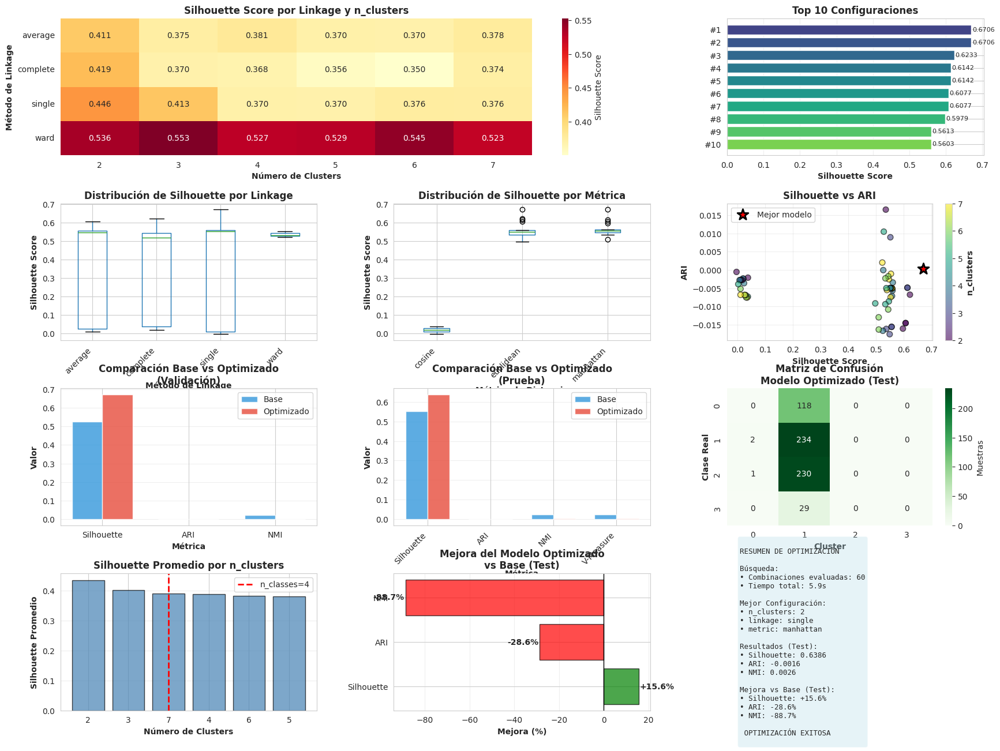


✓ Visualización guardada: 'optimizacion_jerarquico_completa.png'

 RESUMEN FINAL DE LA OPTIMIZACIÓN

 CONFIGURACIÓN ÓPTIMA ENCONTRADA:
   • n_clusters: 2
   • linkage:    single
   • metric:     manhattan

 RENDIMIENTO FINAL (Conjunto de Prueba):

   Modelo BASE:
   • Silhouette: 0.5523
   • ARI:        -0.0012
   • NMI:        0.0231

   Modelo OPTIMIZADO:
   • Silhouette: 0.6386
   • ARI:        -0.0016
   • NMI:        0.0026

 CONCLUSIÓN:
     El modelo BASE superó al optimizado en algunas métricas
      Recomendación: Usar el modelo BASE

                    ✓ OPTIMIZACIÓN COMPLETADA


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score,
    confusion_matrix
)
from sklearn.preprocessing import LabelEncoder
from scipy.cluster.hierarchy import dendrogram, linkage
import itertools
import time
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*10 + "OPTIMIZACIÓN DE HIPERPARÁMETROS - CLUSTERING JERÁRQUICO")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ESPACIO DE BÚSQUEDA DE HIPERPARÁMETROS
    # ============================================================================

    print("\n" + "="*90)
    print(" DEFINICIÓN DEL ESPACIO DE BÚSQUEDA")
    print("="*90)

    print("""
    HIPERPARÁMETROS A OPTIMIZAR:

    1. n_clusters: Número de clusters
       • Rango: [n_classes-2, n_classes+3]
       • Razón: Explorar si el número óptimo difiere del número de clases reales

    2. linkage: Criterio de enlace
       • 'ward': Minimiza varianza (solo con euclidean)
       • 'complete': Máxima distancia entre puntos
       • 'average': Distancia promedio
       • 'single': Mínima distancia entre puntos

    3. metric: Métrica de distancia
       • Depende del linkage:
         - 'ward' → solo 'euclidean'
         - otros → 'euclidean', 'manhattan', 'cosine'

    MÉTRICA DE OPTIMIZACIÓN:
    • Silhouette Score (métrica interna, no usa etiquetas)
    • Rango: [-1, 1], mayor es mejor
    • Mide qué tan bien separados y compactos están los clusters
    """)

    # Definir espacio de búsqueda
    param_grid = {
        'n_clusters': list(range(max(2, n_classes-2), n_classes+4)),
        'linkage': ['ward', 'complete', 'average', 'single'],
        'metric': ['euclidean', 'manhattan', 'cosine']
    }

    print(f"\n Espacio de búsqueda definido:")
    print(f"   • n_clusters: {param_grid['n_clusters']}")
    print(f"   • linkage:    {param_grid['linkage']}")
    print(f"   • metric:     {param_grid['metric']}")

    # Generar todas las combinaciones válidas
    valid_combinations = []

    for n_clust in param_grid['n_clusters']:
        for link in param_grid['linkage']:
            if link == 'ward':
                # Ward solo funciona con euclidean
                valid_combinations.append({
                    'n_clusters': n_clust,
                    'linkage': link,
                    'metric': 'euclidean'
                })
            else:
                # Otros linkages pueden usar cualquier métrica
                for metric in param_grid['metric']:
                    valid_combinations.append({
                        'n_clusters': n_clust,
                        'linkage': link,
                        'metric': metric
                    })

    total_combinations = len(valid_combinations)
    print(f"\n   Total de combinaciones válidas: {total_combinations}")

    # ============================================================================
    #          BÚSQUEDA DE HIPERPARÁMETROS
    # ============================================================================

    print("\n" + "="*90)
    print(" BÚSQUEDA EXHAUSTIVA DE HIPERPARÁMETROS")
    print("="*90)

    print(f"\n Iniciando búsqueda sobre {total_combinations} combinaciones...")
    print("   Esto puede tomar varios minutos...\n")

    results = []
    start_time = time.time()

    for idx, params in enumerate(valid_combinations, 1):
        try:
            # Entrenar modelo con parámetros actuales
            model = AgglomerativeClustering(
                n_clusters=params['n_clusters'],
                linkage=params['linkage'],
                metric=params['metric']
            )

            # Ajustar y predecir en validación
            clusters_val = model.fit_predict(X_val)

            # Calcular métricas
            silhouette = silhouette_score(X_val, clusters_val)
            davies_bouldin = davies_bouldin_score(X_val, clusters_val)
            calinski = calinski_harabasz_score(X_val, clusters_val)
            ari = adjusted_rand_score(y_val_encoded, clusters_val)
            nmi = normalized_mutual_info_score(y_val_encoded, clusters_val)

            # Guardar resultados
            results.append({
                'n_clusters': params['n_clusters'],
                'linkage': params['linkage'],
                'metric': params['metric'],
                'silhouette': silhouette,
                'davies_bouldin': davies_bouldin,
                'calinski_harabasz': calinski,
                'ari': ari,
                'nmi': nmi
            })

            # Mostrar progreso cada 10 iteraciones
            if idx % 10 == 0 or idx == total_combinations:
                elapsed = time.time() - start_time
                avg_time = elapsed / idx
                remaining = (total_combinations - idx) * avg_time
                print(f"   Progreso: {idx}/{total_combinations} "
                      f"({idx/total_combinations*100:.1f}%) - "
                      f"Tiempo restante: ~{remaining:.0f}s")

        except Exception as e:
            print(f"     Error con params {params}: {str(e)}")
            continue

    total_time = time.time() - start_time

    print(f"\n Búsqueda completada en {total_time:.2f} segundos")
    print(f"   • Combinaciones evaluadas: {len(results)}")
    print(f"   • Tiempo promedio por modelo: {total_time/len(results):.2f}s")

    # Crear DataFrame con resultados
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values('silhouette', ascending=False)

    # ============================================================================
    #          MEJORES CONFIGURACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" TOP 10 MEJORES CONFIGURACIONES (por Silhouette Score)")
    print("="*90)

    print("\n")
    top_10 = results_df.head(10).copy()
    top_10.index = range(1, 11)
    print(top_10.to_string())

    # Guardar resultados completos
    results_df.to_csv('optimizacion_jerarquico_resultados.csv', index=False)
    print("\n✓ Resultados completos guardados en 'optimizacion_jerarquico_resultados.csv'")

    # ============================================================================
    #          MEJOR MODELO
    # ============================================================================

    print("\n" + "="*90)
    print(" MEJOR MODELO ENCONTRADO")
    print("="*90)

    best_params = results_df.iloc[0]

    print(f"\n Mejores hiperparámetros:")
    print(f"   • n_clusters: {int(best_params['n_clusters'])}")
    print(f"   • linkage:    {best_params['linkage']}")
    print(f"   • metric:     {best_params['metric']}")

    print(f"\n Métricas en Validación:")
    print(f"   • Silhouette Score:       {best_params['silhouette']:.4f}")
    print(f"   • Davies-Bouldin Index:   {best_params['davies_bouldin']:.4f}")
    print(f"   • Calinski-Harabasz:      {best_params['calinski_harabasz']:.2f}")
    print(f"   • ARI:                    {best_params['ari']:.4f}")
    print(f"   • NMI:                    {best_params['nmi']:.4f}")

    # ============================================================================
    #          COMPARACIÓN CON MODELO BASE
    # ============================================================================

    print("\n" + "="*90)
    print(" COMPARACIÓN: MODELO BASE vs MODELO OPTIMIZADO")
    print("="*90)

    # Entrenar modelo base (ward, euclidean, n_classes)
    print("\n Entrenando modelo BASE para comparación...")
    model_base = AgglomerativeClustering(
        n_clusters=n_classes,
        linkage='ward',
        metric='euclidean'
    )
    clusters_base_val = model_base.fit_predict(X_val)

    # Métricas del modelo base
    base_silhouette = silhouette_score(X_val, clusters_base_val)
    base_davies = davies_bouldin_score(X_val, clusters_base_val)
    base_calinski = calinski_harabasz_score(X_val, clusters_base_val)
    base_ari = adjusted_rand_score(y_val_encoded, clusters_base_val)
    base_nmi = normalized_mutual_info_score(y_val_encoded, clusters_base_val)

    print("✓ Modelo base entrenado\n")

    # Tabla comparativa
    comparison = pd.DataFrame({
        'Métrica': ['Silhouette', 'Davies-Bouldin', 'Calinski-H', 'ARI', 'NMI'],
        'Base': [base_silhouette, base_davies, base_calinski, base_ari, base_nmi],
        'Optimizado': [
            best_params['silhouette'],
            best_params['davies_bouldin'],
            best_params['calinski_harabasz'],
            best_params['ari'],
            best_params['nmi']
        ]
    })

    comparison['Mejora (%)'] = ((comparison['Optimizado'] - comparison['Base']) /
                                 comparison['Base'].abs() * 100)

    # Para Davies-Bouldin, menor es mejor
    comparison.loc[1, 'Mejora (%)'] = -comparison.loc[1, 'Mejora (%)']

    print(comparison.to_string(index=False))

    # Interpretación
    silhouette_improvement = best_params['silhouette'] - base_silhouette
    print(f"\n Interpretación:")
    if silhouette_improvement > 0.05:
        print(f"    MEJORA SIGNIFICATIVA en Silhouette: +{silhouette_improvement:.4f}")
        print(f"      El modelo optimizado encontró una estructura superior")
    elif silhouette_improvement > 0.01:
        print(f"   ✓ Mejora moderada en Silhouette: +{silhouette_improvement:.4f}")
    else:
        print(f"   → Mejora marginal o nula en Silhouette: {silhouette_improvement:+.4f}")
        print(f"      El modelo base ya era adecuado para estos datos")

    # ============================================================================
    #          EVALUACIÓN EN CONJUNTO DE PRUEBA
    # ============================================================================

    print("\n" + "="*90)
    print(" EVALUACIÓN FINAL EN CONJUNTO DE PRUEBA")
    print("="*90)

    print("\n Entrenando modelo OPTIMIZADO en conjunto de prueba...")

    # Entrenar modelo optimizado en test
    model_optimized = AgglomerativeClustering(
        n_clusters=int(best_params['n_clusters']),
        linkage=best_params['linkage'],
        metric=best_params['metric']
    )
    clusters_opt_test = model_optimized.fit_predict(X_test)

    # Entrenar modelo base en test
    model_base_test = AgglomerativeClustering(
        n_clusters=n_classes,
        linkage='ward',
        metric='euclidean'
    )
    clusters_base_test = model_base_test.fit_predict(X_test)

    print("✓ Modelos evaluados en prueba\n")

    # Calcular métricas en test para ambos modelos
    # Modelo optimizado
    opt_test_metrics = {
        'silhouette': silhouette_score(X_test, clusters_opt_test),
        'davies_bouldin': davies_bouldin_score(X_test, clusters_opt_test),
        'calinski': calinski_harabasz_score(X_test, clusters_opt_test),
        'ari': adjusted_rand_score(y_test_encoded, clusters_opt_test),
        'nmi': normalized_mutual_info_score(y_test_encoded, clusters_opt_test),
        'homogeneity': homogeneity_score(y_test_encoded, clusters_opt_test),
        'completeness': completeness_score(y_test_encoded, clusters_opt_test),
        'v_measure': v_measure_score(y_test_encoded, clusters_opt_test)
    }

    # Modelo base
    base_test_metrics = {
        'silhouette': silhouette_score(X_test, clusters_base_test),
        'davies_bouldin': davies_bouldin_score(X_test, clusters_base_test),
        'calinski': calinski_harabasz_score(X_test, clusters_base_test),
        'ari': adjusted_rand_score(y_test_encoded, clusters_base_test),
        'nmi': normalized_mutual_info_score(y_test_encoded, clusters_base_test),
        'homogeneity': homogeneity_score(y_test_encoded, clusters_base_test),
        'completeness': completeness_score(y_test_encoded, clusters_base_test),
        'v_measure': v_measure_score(y_test_encoded, clusters_base_test)
    }

    # Tabla comparativa en test
    test_comparison = pd.DataFrame({
        'Métrica': ['Silhouette', 'Davies-B', 'Calinski-H', 'ARI', 'NMI',
                    'Homogeneity', 'Completeness', 'V-Measure'],
        'Base (Test)': [
            base_test_metrics['silhouette'],
            base_test_metrics['davies_bouldin'],
            base_test_metrics['calinski'],
            base_test_metrics['ari'],
            base_test_metrics['nmi'],
            base_test_metrics['homogeneity'],
            base_test_metrics['completeness'],
            base_test_metrics['v_measure']
        ],
        'Optimizado (Test)': [
            opt_test_metrics['silhouette'],
            opt_test_metrics['davies_bouldin'],
            opt_test_metrics['calinski'],
            opt_test_metrics['ari'],
            opt_test_metrics['nmi'],
            opt_test_metrics['homogeneity'],
            opt_test_metrics['completeness'],
            opt_test_metrics['v_measure']
        ]
    })

    print(" RESULTADOS EN CONJUNTO DE PRUEBA:\n")
    print(test_comparison.to_string(index=False))

    # ============================================================================
    #          VISUALIZACIONES
    # ============================================================================

    print("\n\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    fig = plt.figure(figsize=(20, 16))
    gs = fig.add_gridspec(4, 3, hspace=0.35, wspace=0.3)
    fig.suptitle('Optimización de Hiperparámetros - Clustering Jerárquico',
                 fontsize=16, fontweight='bold', y=0.995)

    # ---- SUBPLOT 1: Heatmap de Silhouette por n_clusters y linkage ----
    ax1 = fig.add_subplot(gs[0, :2])
    pivot_sil = results_df.pivot_table(
        values='silhouette',
        index='linkage',
        columns='n_clusters',
        aggfunc='mean'
    )
    sns.heatmap(pivot_sil, annot=True, fmt='.3f', cmap='YlOrRd', ax=ax1,
                cbar_kws={'label': 'Silhouette Score'})
    ax1.set_title('Silhouette Score por Linkage y n_clusters',
                  fontweight='bold', fontsize=12)
    ax1.set_xlabel('Número de Clusters', fontweight='bold')
    ax1.set_ylabel('Método de Linkage', fontweight='bold')

    # ---- SUBPLOT 2: Top 10 configuraciones ----
    ax2 = fig.add_subplot(gs[0, 2])
    top_5 = results_df.head(10)
    colors_top = plt.cm.viridis(np.linspace(0.2, 0.8, 10))
    bars = ax2.barh(range(10), top_5['silhouette'].values, color=colors_top)
    ax2.set_yticks(range(10))
    ax2.set_yticklabels([f"#{i+1}" for i in range(10)])
    ax2.set_xlabel('Silhouette Score', fontweight='bold')
    ax2.set_title('Top 10 Configuraciones', fontweight='bold')
    ax2.invert_yaxis()
    ax2.grid(True, alpha=0.3, axis='x')

    for i, (bar, val) in enumerate(zip(bars, top_5['silhouette'].values)):
        ax2.text(val + 0.002, bar.get_y() + bar.get_height()/2,
                f'{val:.4f}', va='center', fontsize=8)

    # ---- SUBPLOT 3: Distribución de Silhouette por Linkage ----
    ax3 = fig.add_subplot(gs[1, 0])
    results_df.boxplot(column='silhouette', by='linkage', ax=ax3)
    ax3.set_xlabel('Método de Linkage', fontweight='bold')
    ax3.set_ylabel('Silhouette Score', fontweight='bold')
    ax3.set_title('Distribución de Silhouette por Linkage', fontweight='bold')
    plt.sca(ax3)
    plt.xticks(rotation=45, ha='right')
    ax3.get_figure().suptitle('')

    # ---- SUBPLOT 4: Distribución por Métrica ----
    ax4 = fig.add_subplot(gs[1, 1])
    results_df.boxplot(column='silhouette', by='metric', ax=ax4)
    ax4.set_xlabel('Métrica de Distancia', fontweight='bold')
    ax4.set_ylabel('Silhouette Score', fontweight='bold')
    ax4.set_title('Distribución de Silhouette por Métrica', fontweight='bold')
    plt.sca(ax4)
    plt.xticks(rotation=45, ha='right')
    ax4.get_figure().suptitle('')

    # ---- SUBPLOT 5: Silhouette vs ARI ----
    ax5 = fig.add_subplot(gs[1, 2])
    scatter = ax5.scatter(results_df['silhouette'], results_df['ari'],
                         c=results_df['n_clusters'], cmap='viridis',
                         s=50, alpha=0.6, edgecolors='black')
    ax5.scatter(best_params['silhouette'], best_params['ari'],
               color='red', s=200, marker='*', edgecolors='black',
               linewidth=2, label='Mejor modelo', zorder=5)
    ax5.set_xlabel('Silhouette Score', fontweight='bold')
    ax5.set_ylabel('ARI', fontweight='bold')
    ax5.set_title('Silhouette vs ARI', fontweight='bold')
    ax5.legend()
    ax5.grid(True, alpha=0.3)
    cbar = plt.colorbar(scatter, ax=ax5)
    cbar.set_label('n_clusters', fontweight='bold')

    # ---- SUBPLOT 6: Comparación Base vs Optimizado (Validación) ----
    ax6 = fig.add_subplot(gs[2, 0])
    metrics_names = ['Silhouette', 'ARI', 'NMI']
    base_vals = [base_silhouette, base_ari, base_nmi]
    opt_vals = [best_params['silhouette'], best_params['ari'], best_params['nmi']]

    x = np.arange(len(metrics_names))
    width = 0.35
    ax6.bar(x - width/2, base_vals, width, label='Base', alpha=0.8, color='#3498db')
    ax6.bar(x + width/2, opt_vals, width, label='Optimizado', alpha=0.8, color='#e74c3c')
    ax6.set_xlabel('Métrica', fontweight='bold')
    ax6.set_ylabel('Valor', fontweight='bold')
    ax6.set_title('Comparación Base vs Optimizado\n(Validación)', fontweight='bold')
    ax6.set_xticks(x)
    ax6.set_xticklabels(metrics_names)
    ax6.legend()
    ax6.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 7: Comparación en Test ----
    ax7 = fig.add_subplot(gs[2, 1])
    metrics_names_test = ['Silhouette', 'ARI', 'NMI', 'V-Measure']
    base_vals_test = [
        base_test_metrics['silhouette'],
        base_test_metrics['ari'],
        base_test_metrics['nmi'],
        base_test_metrics['v_measure']
    ]
    opt_vals_test = [
        opt_test_metrics['silhouette'],
        opt_test_metrics['ari'],
        opt_test_metrics['nmi'],
        opt_test_metrics['v_measure']
    ]

    x2 = np.arange(len(metrics_names_test))
    ax7.bar(x2 - width/2, base_vals_test, width, label='Base', alpha=0.8, color='#3498db')
    ax7.bar(x2 + width/2, opt_vals_test, width, label='Optimizado', alpha=0.8, color='#e74c3c')
    ax7.set_xlabel('Métrica', fontweight='bold')
    ax7.set_ylabel('Valor', fontweight='bold')
    ax7.set_title('Comparación Base vs Optimizado\n(Prueba)', fontweight='bold')
    ax7.set_xticks(x2)
    ax7.set_xticklabels(metrics_names_test, rotation=45, ha='right')
    ax7.legend()
    ax7.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 8: Matriz de Confusión - Modelo Optimizado (Test) ----
    ax8 = fig.add_subplot(gs[2, 2])
    conf_matrix_opt = confusion_matrix(y_test_encoded, clusters_opt_test)
    sns.heatmap(conf_matrix_opt, annot=True, fmt='d', cmap='Greens', ax=ax8,
                cbar_kws={'label': 'Muestras'})
    ax8.set_xlabel('Cluster', fontweight='bold')
    ax8.set_ylabel('Clase Real', fontweight='bold')
    ax8.set_title('Matriz de Confusión\nModelo Optimizado (Test)', fontweight='bold')

    # ---- SUBPLOT 9: Distribución de n_clusters óptimos ----
    ax9 = fig.add_subplot(gs[3, 0])
    n_clusters_counts = results_df.groupby('n_clusters')['silhouette'].mean().sort_values(ascending=False)
    bars9 = ax9.bar(n_clusters_counts.index.astype(str), n_clusters_counts.values,
                    color='steelblue', alpha=0.7, edgecolor='black')
    ax9.set_xlabel('Número de Clusters', fontweight='bold')
    ax9.set_ylabel('Silhouette Promedio', fontweight='bold')
    ax9.set_title('Silhouette Promedio por n_clusters', fontweight='bold')
    ax9.grid(True, alpha=0.3, axis='y')
    ax9.axvline(x=n_classes-min(param_grid['n_clusters']), color='red',
                linestyle='--', linewidth=2, label=f'n_classes={n_classes}')
    ax9.legend()

    # ---- SUBPLOT 10: Mejora porcentual por métrica ----
    ax10 = fig.add_subplot(gs[3, 1])
    improvement_metrics = ['Silhouette', 'ARI', 'NMI']
    improvements = [
        (opt_vals_test[0] - base_vals_test[0]) / abs(base_vals_test[0]) * 100,
        (opt_vals_test[1] - base_vals_test[1]) / abs(base_vals_test[1]) * 100,
        (opt_vals_test[2] - base_vals_test[2]) / abs(base_vals_test[2]) * 100
    ]
    colors_imp = ['green' if x > 0 else 'red' for x in improvements]
    bars10 = ax10.barh(improvement_metrics, improvements, color=colors_imp, alpha=0.7, edgecolor='black')
    ax10.set_xlabel('Mejora (%)', fontweight='bold')
    ax10.set_title('Mejora del Modelo Optimizado\nvs Base (Test)', fontweight='bold')
    ax10.axvline(x=0, color='black', linewidth=1)
    ax10.grid(True, alpha=0.3, axis='x')

    for bar, val in zip(bars10, improvements):
        ax10.text(val + 0.5 if val > 0 else val - 0.5, bar.get_y() + bar.get_height()/2,
                 f'{val:+.1f}%', va='center', ha='left' if val > 0 else 'right',
                 fontweight='bold')

    # ---- SUBPLOT 11: Resumen ----
    ax11 = fig.add_subplot(gs[3, 2])
    ax11.axis('off')

    summary_text = f"""
RESUMEN DE OPTIMIZACIÓN

Búsqueda:
• Combinaciones evaluadas: {total_combinations}
• Tiempo total: {total_time:.1f}s

Mejor Configuración:
• n_clusters: {int(best_params['n_clusters'])}
• linkage: {best_params['linkage']}
• metric: {best_params['metric']}

Resultados (Test):
• Silhouette: {opt_test_metrics['silhouette']:.4f}
• ARI: {opt_test_metrics['ari']:.4f}
• NMI: {opt_test_metrics['nmi']:.4f}

Mejora vs Base (Test):
• Silhouette: {improvements[0]:+.1f}%
• ARI: {improvements[1]:+.1f}%
• NMI: {improvements[2]:+.1f}%

{' OPTIMIZACIÓN EXITOSA' if improvements[0] > 1 else '→ MODELO BASE ADECUADO'}
    """

    ax11.text(0.05, 0.5, summary_text, fontsize=9, family='monospace',
             verticalalignment='center', bbox=dict(boxstyle='round',
             facecolor='lightblue', alpha=0.3))

    plt.savefig('optimizacion_jerarquico_completa.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n✓ Visualización guardada: 'optimizacion_jerarquico_completa.png'")

    # ============================================================================
    #          RESUMEN FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" RESUMEN FINAL DE LA OPTIMIZACIÓN")
    print("="*90)

    print(f"\n CONFIGURACIÓN ÓPTIMA ENCONTRADA:")
    print(f"   • n_clusters: {int(best_params['n_clusters'])}")
    print(f"   • linkage:    {best_params['linkage']}")
    print(f"   • metric:     {best_params['metric']}")

    print(f"\n RENDIMIENTO FINAL (Conjunto de Prueba):")
    print(f"\n   Modelo BASE:")
    print(f"   • Silhouette: {base_test_metrics['silhouette']:.4f}")
    print(f"   • ARI:        {base_test_metrics['ari']:.4f}")
    print(f"   • NMI:        {base_test_metrics['nmi']:.4f}")

    print(f"\n   Modelo OPTIMIZADO:")
    print(f"   • Silhouette: {opt_test_metrics['silhouette']:.4f}")
    print(f"   • ARI:        {opt_test_metrics['ari']:.4f}")
    print(f"   • NMI:        {opt_test_metrics['nmi']:.4f}")

    print(f"\n CONCLUSIÓN:")
    avg_improvement = np.mean(improvements)
    if avg_improvement > 5:
        print(f"    La optimización logró mejoras significativas ({avg_improvement:.1f}% promedio)")
        print(f"      Recomendación: Usar el modelo OPTIMIZADO")
    elif avg_improvement > 1:
        print(f"   ✓ La optimización logró mejoras moderadas ({avg_improvement:.1f}% promedio)")
        print(f"      Recomendación: Usar el modelo OPTIMIZADO")
    elif avg_improvement > -1:
        print(f"   → La optimización no mejoró significativamente el modelo")
        print(f"      El modelo BASE ya era adecuado para estos datos")
    else:
        print(f"     El modelo BASE superó al optimizado en algunas métricas")
        print(f"      Recomendación: Usar el modelo BASE")

    print("\n" + "="*90)
    print(" "*20 + "✓ OPTIMIZACIÓN COMPLETADA")
    print("="*90)

# DBSCAN

               DBSCAN - MODELO BASE (Density-Based Clustering)
                         (Datos Limpios Sin Outliers)

✓ Información del Dataset:
   • Muestras entrenamiento: 2,860
   • Muestras validación:    613
   • Muestras prueba:        614
   • Features:               5
   • Número de clases:       4

 ¿QUÉ ES DBSCAN?

   DBSCAN (Density-Based Spatial Clustering of Applications with Noise)
   es un algoritmo de clustering basado en densidad que agrupa puntos
   que están densamente empaquetados juntos.

    CONCEPTOS CLAVE:

   1. Core Points (Puntos Núcleo):
      • Puntos con al menos 'min_samples' vecinos dentro de 'eps'
      • Forman el interior de los clusters

   2. Border Points (Puntos Frontera):
      • Puntos dentro de 'eps' de un core point
      • No tienen suficientes vecinos para ser core points

   3. Noise Points (Ruido/Outliers):
      • Puntos que no son ni core ni border
      • Etiquetados como -1

    VENTAJAS:
   ✓ No requiere especificar el número de clust

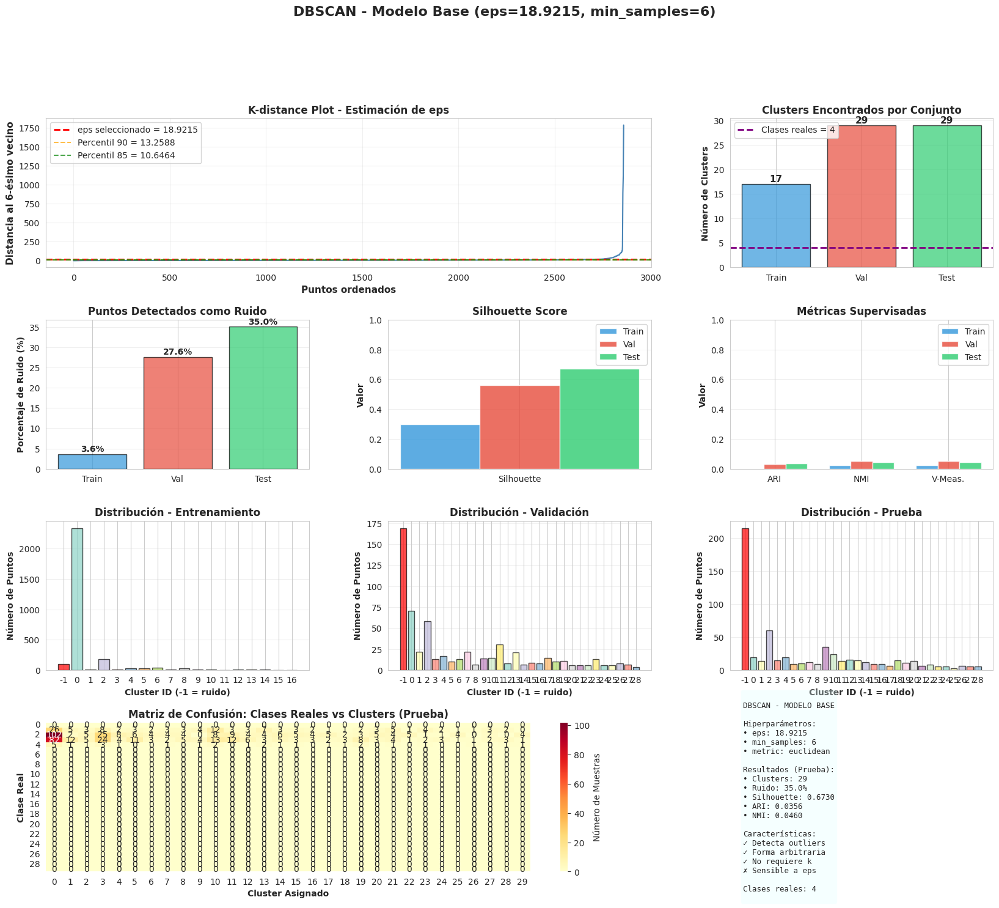


✓ Visualización guardada: 'dbscan_base_evaluacion.png'

 ANÁLISIS COMPARATIVO ENTRE CONJUNTOS

⚠️  IMPORTANTE sobre DBSCAN:
   • DBSCAN procesa cada conjunto INDEPENDIENTEMENTE
   • El número de clusters puede variar entre conjuntos
   • Esto refleja diferencias en la estructura de densidad de los datos
   • No es 'overfitting' como en modelos supervisados

📊 Consistencia de clusters encontrados:
   • Entrenamiento: 17 clusters
   • Validación:    29 clusters
   • Prueba:        29 clusters
   ⚠️  ALTA VARIABILIDAD en número de clusters (std: 5.66)

📊 Consistencia de detección de ruido:
   • Entrenamiento: 3.57%
   • Validación:    27.57%
   • Prueba:        35.02%
   ⚠️  VARIABILIDAD en detección de ruido (std: 13.42%)

🎯 Comparación con clases reales (4 clases):
   • Entrenamiento: 17 clusters - ⚠️  Muy diferente (diferencia: +13)
   • Validación: 29 clusters - ⚠️  Muy diferente (diferencia: +25)
   • Prueba: 29 clusters - ⚠️  Muy diferente (diferencia: +25)

 RECOMENDACIONES Y PRÓX

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    homogeneity_score,
    completeness_score,
    v_measure_score,
    confusion_matrix
)
from sklearn.preprocessing import LabelEncoder
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "DBSCAN - MODELO BASE (Density-Based Clustering)")
print(" "*25 + "(Datos Limpios Sin Outliers)")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    n_classes = len(np.unique(y_train_encoded))

    print("\n✓ Información del Dataset:")
    print(f"   • Muestras entrenamiento: {len(X_train):,}")
    print(f"   • Muestras validación:    {len(X_val):,}")
    print(f"   • Muestras prueba:        {len(X_test):,}")
    print(f"   • Features:               {X_train.shape[1]}")
    print(f"   • Número de clases:       {n_classes}")

    # ============================================================================
    #          ¿QUÉ ES DBSCAN?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ ES DBSCAN?")
    print("="*90)
    print("""
   DBSCAN (Density-Based Spatial Clustering of Applications with Noise)
   es un algoritmo de clustering basado en densidad que agrupa puntos
   que están densamente empaquetados juntos.

    CONCEPTOS CLAVE:

   1. Core Points (Puntos Núcleo):
      • Puntos con al menos 'min_samples' vecinos dentro de 'eps'
      • Forman el interior de los clusters

   2. Border Points (Puntos Frontera):
      • Puntos dentro de 'eps' de un core point
      • No tienen suficientes vecinos para ser core points

   3. Noise Points (Ruido/Outliers):
      • Puntos que no son ni core ni border
      • Etiquetados como -1

    VENTAJAS:
   ✓ No requiere especificar el número de clusters
   ✓ Puede encontrar clusters de forma arbitraria
   ✓ Robusto a outliers (los identifica como ruido)
   ✓ Funciona bien con datos de densidad variable

    DESVENTAJAS:
   ✗ Sensible a los hiperparámetros eps y min_samples
   ✗ Dificultad con clusters de densidad muy diferente
   ✗ No escala bien a datos de alta dimensionalidad
   ✗ Requiere estimación cuidadosa de parámetros

    HIPERPARÁMETROS:

   1. eps (epsilon): Radio de búsqueda de vecinos
      • Distancia máxima entre dos puntos para considerarlos vecinos
      • Crucial para el rendimiento del algoritmo

   2. min_samples: Mínimo de puntos para formar cluster
      • Número mínimo de puntos en un vecindario para ser core point
      • Regla general: min_samples ≥ dimensionalidad + 1

   3. metric: Métrica de distancia
      • 'euclidean' (por defecto)
      • 'manhattan', 'cosine', etc.

    ESTIMACIÓN DE EPS:
   • K-distance plot: Graficar k-ésimo vecino más cercano
   • El "codo" en el gráfico sugiere un buen valor de eps
    """)

    # ============================================================================
    #          ESTIMACIÓN DE HIPERPARÁMETROS
    # ============================================================================

    print("\n" + "="*90)
    print(" ESTIMACIÓN DE HIPERPARÁMETROS")
    print("="*90)

    print("\n Método: K-distance plot (Método del Codo)")
    print("   Calculando distancias al k-ésimo vecino más cercano...\n")

    # Usar min_samples = n_features + 1 como regla general
    min_samples_est = X_train.shape[1] + 1
    print(f"   • min_samples estimado: {min_samples_est} (n_features + 1 = {X_train.shape[1]} + 1)")

    # Calcular k-distance para estimar eps
    # Usar una muestra si el dataset es muy grande
    sample_size = min(5000, len(X_train))
    if len(X_train) > sample_size:
        print(f"   • Usando muestra de {sample_size:,} puntos para estimación de eps")
        indices = np.random.RandomState(42).choice(len(X_train), sample_size, replace=False)
        X_sample = X_train.iloc[indices] if isinstance(X_train, pd.DataFrame) else X_train[indices]
    else:
        X_sample = X_train

    # Calcular vecinos más cercanos
    nbrs = NearestNeighbors(n_neighbors=min_samples_est, metric='euclidean')
    nbrs.fit(X_sample)
    distances, indices = nbrs.kneighbors(X_sample)

    # Ordenar distancias al k-ésimo vecino
    k_distances = np.sort(distances[:, -1])

    # Estimar eps como el percentil 95 de las distancias
    eps_est = np.percentile(k_distances, 95)

    print(f"\n   • eps estimado (percentil 95): {eps_est:.4f}")
    print(f"   • eps estimado (percentil 90): {np.percentile(k_distances, 90):.4f}")
    print(f"   • eps estimado (percentil 85): {np.percentile(k_distances, 85):.4f}")

    # ============================================================================
    #          CONFIGURACIÓN DEL MODELO BASE
    # ============================================================================

    print("\n" + "="*90)
    print(" CONFIGURACIÓN DEL MODELO BASE")
    print("="*90)

    # Usar parámetros estimados
    eps_base = eps_est
    min_samples_base = min_samples_est

    print(f"\n Hiperparámetros del modelo base:")
    print(f"   • eps:         {eps_base:.4f} (radio de vecindad)")
    print(f"   • min_samples: {min_samples_base} (mínimo de puntos por cluster)")
    print(f"   • metric:      euclidean (distancia euclidiana)")
    print(f"   • algorithm:   auto (selección automática)")

    # ============================================================================
    #          ENTRENAMIENTO Y PREDICCIÓN EN TODOS LOS CONJUNTOS
    # ============================================================================

    print("\n" + "="*90)
    print(" ENTRENAMIENTO Y CLUSTERING EN TODOS LOS CONJUNTOS")
    print("="*90)

    print("\n  NOTA: DBSCAN no tiene método .predict()")
    print("   Cada conjunto se procesa independientemente con fit_predict()\n")

    # Crear modelo
    dbscan_base = DBSCAN(
        eps=eps_base,
        min_samples=min_samples_base,
        metric='euclidean',
        algorithm='auto'
    )

    # Entrenar y predecir en cada conjunto
    print(" Procesando conjunto de ENTRENAMIENTO...")
    clusters_train = dbscan_base.fit_predict(X_train)
    print("✓ Completado")

    print(" Procesando conjunto de VALIDACIÓN...")
    clusters_val = dbscan_base.fit_predict(X_val)
    print("✓ Completado")

    print(" Procesando conjunto de PRUEBA...")
    clusters_test = dbscan_base.fit_predict(X_test)
    print("✓ Completado")

    # ============================================================================
    #          ANÁLISIS DE CLUSTERS ENCONTRADOS
    # ============================================================================

    print("\n" + "="*90)
    print(" ANÁLISIS DE CLUSTERS ENCONTRADOS")
    print("="*90)

    def analyze_dbscan_clusters(clusters, set_name):
        """Analiza los clusters encontrados por DBSCAN"""
        print(f"\n {set_name}:")
        print("-" * 70)

        unique_clusters = np.unique(clusters)
        n_clusters = len(unique_clusters[unique_clusters != -1])  # Excluir ruido (-1)
        n_noise = np.sum(clusters == -1)

        print(f"   • Clusters encontrados:  {n_clusters}")
        print(f"   • Puntos de ruido:       {n_noise} ({n_noise/len(clusters)*100:.2f}%)")
        print(f"   • Total de puntos:       {len(clusters)}")

        if n_clusters > 0:
            print(f"\n   Distribución de puntos por cluster:")
            cluster_counts = Counter(clusters[clusters != -1])
            for cluster_id in sorted(cluster_counts.keys()):
                count = cluster_counts[cluster_id]
                percentage = count / len(clusters) * 100
                print(f"     • Cluster {cluster_id}: {count:,} puntos ({percentage:.2f}%)")

            if n_noise > 0:
                print(f"     • Ruido (-1):   {n_noise:,} puntos ({n_noise/len(clusters)*100:.2f}%)")

        return n_clusters, n_noise

    n_clusters_train, n_noise_train = analyze_dbscan_clusters(clusters_train, "ENTRENAMIENTO")
    n_clusters_val, n_noise_val = analyze_dbscan_clusters(clusters_val, "VALIDACIÓN")
    n_clusters_test, n_noise_test = analyze_dbscan_clusters(clusters_test, "PRUEBA")

    # ============================================================================
    #          EVALUACIÓN - MÉTRICAS
    # ============================================================================

    print("\n" + "="*90)
    print(" EVALUACIÓN - MÉTRICAS DE CLUSTERING")
    print("="*90)

    def calculate_dbscan_metrics(X, y_true, clusters, set_name):
        """Calcula métricas para DBSCAN"""
        print(f"\n {set_name}:")
        print("-" * 70)

        n_clusters = len(np.unique(clusters[clusters != -1]))
        n_noise = np.sum(clusters == -1)

        # Verificar si hay suficientes clusters para calcular métricas
        if n_clusters < 2:
            print("     ADVERTENCIA: Menos de 2 clusters encontrados")
            print("      No se pueden calcular métricas de clustering")
            return None

        # Filtrar puntos de ruido para métricas internas
        mask_no_noise = clusters != -1
        X_no_noise = X[mask_no_noise]
        clusters_no_noise = clusters[mask_no_noise]

        if len(clusters_no_noise) < 2:
            print("     ADVERTENCIA: Muy pocos puntos en clusters")
            return None

        # Métricas internas (sin usar etiquetas)
        print("\n   A) MÉTRICAS INTERNAS (sin ruido):")
        try:
            silhouette = silhouette_score(X_no_noise, clusters_no_noise)
            davies_bouldin = davies_bouldin_score(X_no_noise, clusters_no_noise)
            calinski = calinski_harabasz_score(X_no_noise, clusters_no_noise)

            print(f"      • Silhouette Score:        {silhouette:.4f}  ← [-1, 1], óptimo: ~1")
            print(f"      • Davies-Bouldin Index:    {davies_bouldin:.4f}  ← óptimo: ~0")
            print(f"      • Calinski-Harabasz Score: {calinski:,.2f}  ← mayor es mejor")

            if silhouette >= 0.71:
                quality = " EXCELENTE"
            elif silhouette >= 0.51:
                quality = "✓ BUENO"
            elif silhouette >= 0.26:
                quality = "  REGULAR"
            else:
                quality = " POBRE"
            print(f"\n      Calidad del clustering: {quality}")

        except Exception as e:
            print(f"        Error calculando métricas internas: {str(e)}")
            silhouette = davies_bouldin = calinski = None

        # Métricas externas (comparación con clases reales)
        print("\n   B) MÉTRICAS EXTERNAS (comparación con clases reales):")
        try:
            ari = adjusted_rand_score(y_true, clusters)
            nmi = normalized_mutual_info_score(y_true, clusters)
            homogeneity = homogeneity_score(y_true, clusters)
            completeness = completeness_score(y_true, clusters)
            v_measure = v_measure_score(y_true, clusters)

            print(f"      • Adjusted Rand Index:     {ari:.4f}  ← [-1, 1], óptimo: 1")
            print(f"      • Normalized Mutual Info:  {nmi:.4f}  ← [0, 1], óptimo: 1")
            print(f"      • Homogeneity:             {homogeneity:.4f}  ← [0, 1], óptimo: 1")
            print(f"      • Completeness:            {completeness:.4f}  ← [0, 1], óptimo: 1")
            print(f"      • V-Measure:               {v_measure:.4f}  ← [0, 1], óptimo: 1")

            if ari >= 0.90:
                concordance = " EXCELENTE"
            elif ari >= 0.70:
                concordance = "✓ BUENA"
            elif ari >= 0.50:
                concordance = "→ MODERADA"
            elif ari >= 0.30:
                concordance = "  BAJA"
            else:
                concordance = " MUY BAJA"
            print(f"\n      Concordancia con clases reales: {concordance}")

        except Exception as e:
            print(f"        Error calculando métricas externas: {str(e)}")
            ari = nmi = homogeneity = completeness = v_measure = None

        return {
            'n_clusters': n_clusters,
            'n_noise': n_noise,
            'noise_pct': n_noise / len(clusters) * 100,
            'silhouette': silhouette,
            'davies_bouldin': davies_bouldin,
            'calinski_harabasz': calinski,
            'ari': ari,
            'nmi': nmi,
            'homogeneity': homogeneity,
            'completeness': completeness,
            'v_measure': v_measure
        }

    # Calcular métricas para todos los conjuntos
    metrics_train = calculate_dbscan_metrics(X_train, y_train_encoded, clusters_train, "ENTRENAMIENTO")
    metrics_val = calculate_dbscan_metrics(X_val, y_val_encoded, clusters_val, "VALIDACIÓN")
    metrics_test = calculate_dbscan_metrics(X_test, y_test_encoded, clusters_test, "PRUEBA")

    # ============================================================================
    #          TABLA RESUMEN COMPARATIVA
    # ============================================================================

    print("\n" + "="*90)
    print(" TABLA RESUMEN COMPARATIVA - TODOS LOS CONJUNTOS")
    print("="*90)

    if all([metrics_train, metrics_val, metrics_test]):
        comparison_df = pd.DataFrame({
            'Métrica': [
                'Clusters encontrados',
                'Puntos de ruido',
                'Ruido (%)',
                'Silhouette Score',
                'Davies-Bouldin',
                'Calinski-Harabasz',
                'ARI',
                'NMI',
                'Homogeneity',
                'Completeness',
                'V-Measure'
            ],
            'Entrenamiento': [
                metrics_train['n_clusters'],
                metrics_train['n_noise'],
                metrics_train['noise_pct'],
                metrics_train['silhouette'],
                metrics_train['davies_bouldin'],
                metrics_train['calinski_harabasz'],
                metrics_train['ari'],
                metrics_train['nmi'],
                metrics_train['homogeneity'],
                metrics_train['completeness'],
                metrics_train['v_measure']
            ],
            'Validación': [
                metrics_val['n_clusters'],
                metrics_val['n_noise'],
                metrics_val['noise_pct'],
                metrics_val['silhouette'],
                metrics_val['davies_bouldin'],
                metrics_val['calinski_harabasz'],
                metrics_val['ari'],
                metrics_val['nmi'],
                metrics_val['homogeneity'],
                metrics_val['completeness'],
                metrics_val['v_measure']
            ],
            'Prueba': [
                metrics_test['n_clusters'],
                metrics_test['n_noise'],
                metrics_test['noise_pct'],
                metrics_test['silhouette'],
                metrics_test['davies_bouldin'],
                metrics_test['calinski_harabasz'],
                metrics_test['ari'],
                metrics_test['nmi'],
                metrics_test['homogeneity'],
                metrics_test['completeness'],
                metrics_test['v_measure']
            ]
        })

        print("\n")
        print(comparison_df.to_string(index=False))

        # Guardar resultados
        comparison_df.to_csv('metricas_dbscan_base.csv', index=False)
        print("\n✓ Resultados guardados en 'metricas_dbscan_base.csv'")

    # ============================================================================
    #          VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    fig = plt.figure(figsize=(20, 16))
    gs = fig.add_gridspec(4, 3, hspace=0.35, wspace=0.3)
    fig.suptitle(f'DBSCAN - Modelo Base (eps={eps_base:.4f}, min_samples={min_samples_base})',
                 fontsize=16, fontweight='bold', y=0.995)

    # ---- SUBPLOT 1: K-distance plot ----
    ax1 = fig.add_subplot(gs[0, :2])
    ax1.plot(k_distances, linewidth=1.5, color='steelblue')
    ax1.axhline(y=eps_base, color='red', linestyle='--', linewidth=2,
                label=f'eps seleccionado = {eps_base:.4f}')
    ax1.axhline(y=np.percentile(k_distances, 90), color='orange', linestyle='--',
                linewidth=1.5, alpha=0.7, label=f'Percentil 90 = {np.percentile(k_distances, 90):.4f}')
    ax1.axhline(y=np.percentile(k_distances, 85), color='green', linestyle='--',
                linewidth=1.5, alpha=0.7, label=f'Percentil 85 = {np.percentile(k_distances, 85):.4f}')
    ax1.set_xlabel('Puntos ordenados', fontweight='bold', fontsize=11)
    ax1.set_ylabel(f'Distancia al {min_samples_base}-ésimo vecino', fontweight='bold', fontsize=11)
    ax1.set_title('K-distance Plot - Estimación de eps', fontweight='bold', fontsize=12)
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)

    # ---- SUBPLOT 2: Número de clusters por conjunto ----
    ax2 = fig.add_subplot(gs[0, 2])
    sets = ['Train', 'Val', 'Test']
    n_clusters_list = [n_clusters_train, n_clusters_val, n_clusters_test]
    colors_bar = ['#3498db', '#e74c3c', '#2ecc71']
    bars2 = ax2.bar(sets, n_clusters_list, color=colors_bar, alpha=0.7, edgecolor='black')
    ax2.axhline(y=n_classes, color='purple', linestyle='--', linewidth=2,
                label=f'Clases reales = {n_classes}')
    ax2.set_ylabel('Número de Clusters', fontweight='bold')
    ax2.set_title('Clusters Encontrados por Conjunto', fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3, axis='y')

    for bar, val in zip(bars2, n_clusters_list):
        ax2.text(bar.get_x() + bar.get_width()/2, val + 0.1,
                f'{val}', ha='center', va='bottom', fontweight='bold', fontsize=11)

    # ---- SUBPLOT 3: Porcentaje de ruido ----
    ax3 = fig.add_subplot(gs[1, 0])
    noise_pcts = [n_noise_train/len(clusters_train)*100,
                  n_noise_val/len(clusters_val)*100,
                  n_noise_test/len(clusters_test)*100]
    bars3 = ax3.bar(sets, noise_pcts, color=colors_bar, alpha=0.7, edgecolor='black')
    ax3.set_ylabel('Porcentaje de Ruido (%)', fontweight='bold')
    ax3.set_title('Puntos Detectados como Ruido', fontweight='bold')
    ax3.grid(True, alpha=0.3, axis='y')

    for bar, val in zip(bars3, noise_pcts):
        ax3.text(bar.get_x() + bar.get_width()/2, val + 0.2,
                f'{val:.1f}%', ha='center', va='bottom', fontweight='bold')

    # ---- SUBPLOT 4: Métricas internas ----
    if all([metrics_train, metrics_val, metrics_test]):
        ax4 = fig.add_subplot(gs[1, 1])
        metrics_names = ['Silhouette']
        train_vals = [metrics_train['silhouette'] if metrics_train['silhouette'] else 0]
        val_vals = [metrics_val['silhouette'] if metrics_val['silhouette'] else 0]
        test_vals = [metrics_test['silhouette'] if metrics_test['silhouette'] else 0]

        x = np.arange(len(metrics_names))
        width = 0.25

        ax4.bar(x - width, train_vals, width, label='Train', alpha=0.8, color='#3498db')
        ax4.bar(x, val_vals, width, label='Val', alpha=0.8, color='#e74c3c')
        ax4.bar(x + width, test_vals, width, label='Test', alpha=0.8, color='#2ecc71')

        ax4.set_ylabel('Valor', fontweight='bold')
        ax4.set_title('Silhouette Score', fontweight='bold')
        ax4.set_xticks(x)
        ax4.set_xticklabels(metrics_names)
        ax4.legend()
        ax4.grid(True, alpha=0.3, axis='y')
        ax4.set_ylim([0, 1])

    # ---- SUBPLOT 5: Métricas externas ----
    if all([metrics_train, metrics_val, metrics_test]):
        ax5 = fig.add_subplot(gs[1, 2])
        ext_names = ['ARI', 'NMI', 'V-Meas.']
        train_ext = [metrics_train['ari'], metrics_train['nmi'], metrics_train['v_measure']]
        val_ext = [metrics_val['ari'], metrics_val['nmi'], metrics_val['v_measure']]
        test_ext = [metrics_test['ari'], metrics_test['nmi'], metrics_test['v_measure']]

        x2 = np.arange(len(ext_names))

        ax5.bar(x2 - width, train_ext, width, label='Train', alpha=0.8, color='#3498db')
        ax5.bar(x2, val_ext, width, label='Val', alpha=0.8, color='#e74c3c')
        ax5.bar(x2 + width, test_ext, width, label='Test', alpha=0.8, color='#2ecc71')

        ax5.set_ylabel('Valor', fontweight='bold')
        ax5.set_title('Métricas Supervisadas', fontweight='bold')
        ax5.set_xticks(x2)
        ax5.set_xticklabels(ext_names)
        ax5.set_ylim([0, 1])
        ax5.legend()
        ax5.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 6: Distribución de clusters (Train) ----
    ax6 = fig.add_subplot(gs[2, 0])
    unique_train = np.unique(clusters_train)
    counts_train = [np.sum(clusters_train == c) for c in unique_train]
    colors_train = ['red' if c == -1 else plt.cm.Set3(c % 12) for c in unique_train]
    bars6 = ax6.bar(range(len(unique_train)), counts_train, color=colors_train,
                    edgecolor='black', alpha=0.7)
    ax6.set_xlabel('Cluster ID (-1 = ruido)', fontweight='bold')
    ax6.set_ylabel('Número de Puntos', fontweight='bold')
    ax6.set_title('Distribución - Entrenamiento', fontweight='bold')
    ax6.set_xticks(range(len(unique_train)))
    ax6.set_xticklabels(unique_train)
    ax6.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 7: Distribución de clusters (Val) ----
    ax7 = fig.add_subplot(gs[2, 1])
    unique_val = np.unique(clusters_val)
    counts_val = [np.sum(clusters_val == c) for c in unique_val]
    colors_val = ['red' if c == -1 else plt.cm.Set3(c % 12) for c in unique_val]
    bars7 = ax7.bar(range(len(unique_val)), counts_val, color=colors_val,
                    edgecolor='black', alpha=0.7)
    ax7.set_xlabel('Cluster ID (-1 = ruido)', fontweight='bold')
    ax7.set_ylabel('Número de Puntos', fontweight='bold')
    ax7.set_title('Distribución - Validación', fontweight='bold')
    ax7.set_xticks(range(len(unique_val)))
    ax7.set_xticklabels(unique_val)
    ax7.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 8: Distribución de clusters (Test) ----
    ax8 = fig.add_subplot(gs[2, 2])
    unique_test = np.unique(clusters_test)
    counts_test = [np.sum(clusters_test == c) for c in unique_test]
    colors_test = ['red' if c == -1 else plt.cm.Set3(c % 12) for c in unique_test]
    bars8 = ax8.bar(range(len(unique_test)), counts_test, color=colors_test,
                    edgecolor='black', alpha=0.7)
    ax8.set_xlabel('Cluster ID (-1 = ruido)', fontweight='bold')
    ax8.set_ylabel('Número de Puntos', fontweight='bold')
    ax8.set_title('Distribución - Prueba', fontweight='bold')
    ax8.set_xticks(range(len(unique_test)))
    ax8.set_xticklabels(unique_test)
    ax8.grid(True, alpha=0.3, axis='y')

    # ---- SUBPLOT 9: Matriz de confusión (Test) ----
    ax9 = fig.add_subplot(gs[3, :2])
    if metrics_test and metrics_test['n_clusters'] >= 2:
        conf_matrix = confusion_matrix(y_test_encoded, clusters_test)
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='YlOrRd', ax=ax9,
                   cbar_kws={'label': 'Número de Muestras'})
        ax9.set_xlabel('Cluster Asignado', fontweight='bold')
        ax9.set_ylabel('Clase Real', fontweight='bold')
        ax9.set_title('Matriz de Confusión: Clases Reales vs Clusters (Prueba)',
                     fontweight='bold')
    else:
        ax9.text(0.5, 0.5, 'No hay suficientes clusters\npara matriz de confusión',
                ha='center', va='center', fontsize=14, transform=ax9.transAxes)
        ax9.axis('off')

    # ---- SUBPLOT 10: Resumen ----
    ax10 = fig.add_subplot(gs[3, 2])
    ax10.axis('off')

    if metrics_test:
        # Formatear métricas de forma segura
        sil_str = f"{metrics_test['silhouette']:.4f}" if metrics_test['silhouette'] is not None else 'N/A'
        ari_str = f"{metrics_test['ari']:.4f}" if metrics_test['ari'] is not None else 'N/A'
        nmi_str = f"{metrics_test['nmi']:.4f}" if metrics_test['nmi'] is not None else 'N/A'

        summary_text = f"""
DBSCAN - MODELO BASE

Hiperparámetros:
• eps: {eps_base:.4f}
• min_samples: {min_samples_base}
• metric: euclidean

Resultados (Prueba):
• Clusters: {metrics_test['n_clusters']}
• Ruido: {metrics_test['noise_pct']:.1f}%
• Silhouette: {sil_str}
• ARI: {ari_str}
• NMI: {nmi_str}

Características:
✓ Detecta outliers
✓ Forma arbitraria
✓ No requiere k
✗ Sensible a eps

Clases reales: {n_classes}
        """
    else:
        summary_text = "Error en cálculo de métricas"

    ax10.text(0.05, 0.5, summary_text, fontsize=9, family='monospace',
             verticalalignment='center', bbox=dict(boxstyle='round',
             facecolor='lightcyan', alpha=0.3))

    plt.savefig('dbscan_base_evaluacion.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n✓ Visualización guardada: 'dbscan_base_evaluacion.png'")

    # ============================================================================
    #          ANÁLISIS COMPARATIVO ENTRE CONJUNTOS
    # ============================================================================

    print("\n" + "="*90)
    print(" ANÁLISIS COMPARATIVO ENTRE CONJUNTOS")
    print("="*90)

    print("\n  IMPORTANTE sobre DBSCAN:")
    print("   • DBSCAN procesa cada conjunto INDEPENDIENTEMENTE")
    print("   • El número de clusters puede variar entre conjuntos")
    print("   • Esto refleja diferencias en la estructura de densidad de los datos")
    print("   • No es 'overfitting' como en modelos supervisados\n")

    # Análisis de consistencia
    clusters_consistency = [n_clusters_train, n_clusters_val, n_clusters_test]
    noise_consistency = [n_noise_train/len(clusters_train)*100,
                        n_noise_val/len(clusters_val)*100,
                        n_noise_test/len(clusters_test)*100]

    print(f" Consistencia de clusters encontrados:")
    print(f"   • Entrenamiento: {n_clusters_train} clusters")
    print(f"   • Validación:    {n_clusters_val} clusters")
    print(f"   • Prueba:        {n_clusters_test} clusters")

    std_clusters = np.std(clusters_consistency)
    if std_clusters == 0:
        print(f"    Número de clusters IDÉNTICO en todos los conjuntos")
    elif std_clusters < 1:
        print(f"   ✓ Número de clusters MUY CONSISTENTE (std: {std_clusters:.2f})")
    elif std_clusters < 2:
        print(f"   → Número de clusters MODERADAMENTE CONSISTENTE (std: {std_clusters:.2f})")
    else:
        print(f"     ALTA VARIABILIDAD en número de clusters (std: {std_clusters:.2f})")

    print(f"\n Consistencia de detección de ruido:")
    print(f"   • Entrenamiento: {noise_consistency[0]:.2f}%")
    print(f"   • Validación:    {noise_consistency[1]:.2f}%")
    print(f"   • Prueba:        {noise_consistency[2]:.2f}%")

    std_noise = np.std(noise_consistency)
    if std_noise < 2:
        print(f"    Detección de ruido MUY CONSISTENTE (std: {std_noise:.2f}%)")
    elif std_noise < 5:
        print(f"   ✓ Detección de ruido CONSISTENTE (std: {std_noise:.2f}%)")
    else:
        print(f"     VARIABILIDAD en detección de ruido (std: {std_noise:.2f}%)")

    # Comparación con número de clases reales
    print(f"\n Comparación con clases reales ({n_classes} clases):")
    for set_name, n_clust in zip(['Entrenamiento', 'Validación', 'Prueba'], clusters_consistency):
        diff = n_clust - n_classes
        if diff == 0:
            status = " COINCIDE exactamente"
        elif abs(diff) <= 2:
            status = f"→ Cercano (diferencia: {diff:+d})"
        else:
            status = f"  Muy diferente (diferencia: {diff:+d})"
        print(f"   • {set_name}: {n_clust} clusters - {status}")

    # ============================================================================
    #          RECOMENDACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" RECOMENDACIONES Y PRÓXIMOS PASOS")
    print("="*90)

    print("\n Evaluación del modelo base:")

    if metrics_test:
        # Evaluar calidad general
        if metrics_test['n_clusters'] < 2:
            print("\n    PROBLEMA CRÍTICO: Muy pocos clusters encontrados")
            print("      → Reducir eps o min_samples")
            print("      → Verificar si los datos tienen estructura de clusters")

        elif metrics_test['noise_pct'] > 20:
            print(f"\n     ADVERTENCIA: Alto porcentaje de ruido ({metrics_test['noise_pct']:.1f}%)")
            print("      → Considerar reducir min_samples")
            print("      → O aumentar eps si los clusters están dispersos")

        elif metrics_test['silhouette'] and metrics_test['silhouette'] < 0.3:
            print(f"\n     Baja calidad de clustering (Silhouette: {metrics_test['silhouette']:.4f})")
            print("      → Optimizar hiperparámetros eps y min_samples")
            print("      → Considerar otros algoritmos de clustering")

        elif metrics_test['ari'] and metrics_test['ari'] < 0.3:
            print(f"\n     Baja concordancia con clases reales (ARI: {metrics_test['ari']:.4f})")
            print("      → DBSCAN puede no ser apropiado para estos datos")
            print("      → La estructura natural no coincide con las clases")

        else:
            print("\n   ✓ Modelo base funciona razonablemente bien")
            if metrics_test['silhouette'] and metrics_test['silhouette'] > 0.5:
                print(f"       Buena separación de clusters (Silhouette: {metrics_test['silhouette']:.4f})")
            if metrics_test['ari'] and metrics_test['ari'] > 0.5:
                print(f"       Buena concordancia con clases (ARI: {metrics_test['ari']:.4f})")
            print("      → Considerar optimización de hiperparámetros")

    print("\n Próximos pasos recomendados:")
    print("   1. Optimizar eps usando grid search alrededor del valor actual")
    print("   2. Probar diferentes valores de min_samples")
    print("   3. Explorar otras métricas de distancia (manhattan, cosine)")
    print("   4. Comparar con otros algoritmos (K-Means, Jerárquico)")
    print("   5. Analizar visualmente los clusters en espacio reducido (PCA/t-SNE)")

    # ============================================================================
    #          RESUMEN FINAL
    # ============================================================================

    print("\n" + "="*90)
    print(" RESUMEN FINAL")
    print("="*90)

    print(f"\n CONFIGURACIÓN:")
    print(f"   • Algoritmo:   DBSCAN (Density-Based)")
    print(f"   • eps:         {eps_base:.4f}")
    print(f"   • min_samples: {min_samples_base}")
    print(f"   • metric:      euclidean")

    print(f"\n RESULTADOS GENERALES:")
    print(f"\n   Entrenamiento:")
    print(f"   • Clusters:    {n_clusters_train}")
    print(f"   • Ruido:       {n_noise_train/len(clusters_train)*100:.2f}%")
    if metrics_train and metrics_train['silhouette']:
        print(f"   • Silhouette:  {metrics_train['silhouette']:.4f}")
        print(f"   • ARI:         {metrics_train['ari']:.4f}")

    print(f"\n   Validación:")
    print(f"   • Clusters:    {n_clusters_val}")
    print(f"   • Ruido:       {n_noise_val/len(clusters_val)*100:.2f}%")
    if metrics_val and metrics_val['silhouette']:
        print(f"   • Silhouette:  {metrics_val['silhouette']:.4f}")
        print(f"   • ARI:         {metrics_val['ari']:.4f}")

    print(f"\n   Prueba:")
    print(f"   • Clusters:    {n_clusters_test}")
    print(f"   • Ruido:       {n_noise_test/len(clusters_test)*100:.2f}%")
    if metrics_test and metrics_test['silhouette']:
        print(f"   • Silhouette:  {metrics_test['silhouette']:.4f}")
        print(f"   • ARI:         {metrics_test['ari']:.4f}")

    print("\n" + "="*90)
    print(" "*20 + "✓ ANÁLISIS DBSCAN BASE COMPLETADO")
    print("="*90)

## Curvas de Aprendizaje

                    CURVAS DE APRENDIZAJE - DBSCAN
                         (Análisis de Escalabilidad)

✓ Datos y parámetros cargados:
   • Total muestras entrenamiento: 2,860
   • Total muestras validación:    613
   • eps (base):                   18.9215
   • min_samples (base):           6

 ¿QUÉ SON LAS CURVAS DE APRENDIZAJE EN CLUSTERING?

   Las curvas de aprendizaje en clustering muestran cómo el rendimiento
   del algoritmo cambia con diferentes tamaños de muestra.

    PROPÓSITO EN CLUSTERING NO SUPERVISADO:

   1. Escalabilidad:
      • ¿Cómo afecta el tamaño del dataset al tiempo de entrenamiento?
      • ¿Es viable usar el algoritmo con datasets grandes?

   2. Estabilidad:
      • ¿Las métricas se estabilizan con más datos?
      • ¿O siguen variando significativamente?

   3. Calidad del clustering:
      • ¿Mejora la calidad con más datos?
      • ¿Hay un punto de saturación?

   4. Detección de outliers:
      • ¿Cómo cambia el porcentaje de ruido con más datos?

    

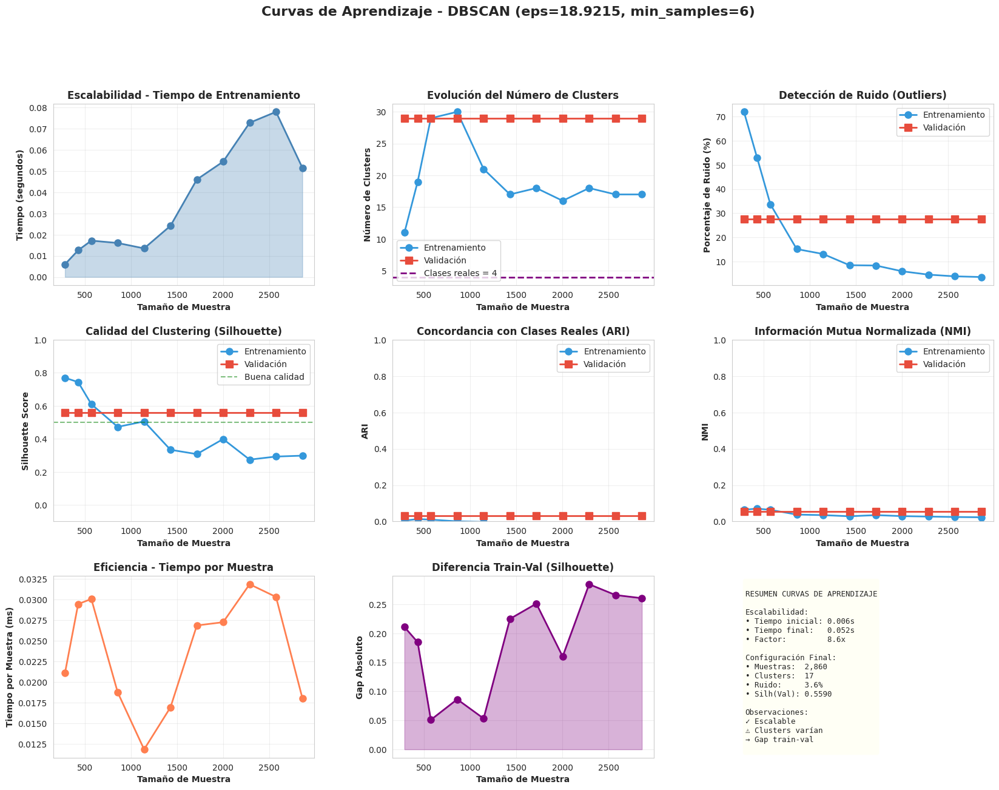


✓ Visualización guardada: 'dbscan_curvas_aprendizaje.png'

 CONCLUSIONES

💡 ANÁLISIS DE LAS CURVAS DE APRENDIZAJE:

1. ESCALABILIDAD:
   ✅ El algoritmo escala eficientemente
      El tiempo creció 8.6x para 10.0x más datos
      DBSCAN es viable para datasets de este tamaño

2. ESTABILIDAD DE CLUSTERS:
   ⚠️  Variación significativa en clusters (std: 5.57)
      La estructura detectada cambia con el tamaño de muestra
      Considerar ajustar eps o min_samples

3. CALIDAD DEL CLUSTERING:
   ✓ La calidad se mantiene ESTABLE
      El clustering es consistente independiente del tamaño

4. DETECCIÓN DE RUIDO:
   ⚠️  El ruido disminuye significativamente (-68.46%)
      Con más datos, menos puntos se consideran outliers
      Esto puede indicar mejor estimación de densidad

5. GENERALIZACIÓN (Gap Train-Val):
   ⚠️  Gap significativo entre train y val (promedio: 0.1849)
      Los conjuntos tienen estructuras diferentes

📋 RECOMENDACIONES:
   → Ajustar eps para obtener resultados más estables

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import (
    silhouette_score,
    adjusted_rand_score,
    normalized_mutual_info_score,
    davies_bouldin_score,
    calinski_harabasz_score
)
from sklearn.preprocessing import LabelEncoder
import time
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*20 + "CURVAS DE APRENDIZAJE - DBSCAN")
print(" "*25 + "(Análisis de Escalabilidad)")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS Y PARÁMETROS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
    print("   Ejecuta primero el código de limpieza de outliers")
elif 'eps_base' not in globals() or 'min_samples_base' not in globals():
    print("\n ERROR: Parámetros de DBSCAN no encontrados")
    print("   Ejecuta primero el código del modelo base de DBSCAN")
else:
    # Codificar etiquetas
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)

    print("\n✓ Datos y parámetros cargados:")
    print(f"   • Total muestras entrenamiento: {len(X_train):,}")
    print(f"   • Total muestras validación:    {len(X_val):,}")
    print(f"   • eps (base):                   {eps_base:.4f}")
    print(f"   • min_samples (base):           {min_samples_base}")

    # ============================================================================
    #          ¿QUÉ SON LAS CURVAS DE APRENDIZAJE EN CLUSTERING?
    # ============================================================================

    print("\n" + "="*90)
    print(" ¿QUÉ SON LAS CURVAS DE APRENDIZAJE EN CLUSTERING?")
    print("="*90)
    print("""
   Las curvas de aprendizaje en clustering muestran cómo el rendimiento
   del algoritmo cambia con diferentes tamaños de muestra.

    PROPÓSITO EN CLUSTERING NO SUPERVISADO:

   1. Escalabilidad:
      • ¿Cómo afecta el tamaño del dataset al tiempo de entrenamiento?
      • ¿Es viable usar el algoritmo con datasets grandes?

   2. Estabilidad:
      • ¿Las métricas se estabilizan con más datos?
      • ¿O siguen variando significativamente?

   3. Calidad del clustering:
      • ¿Mejora la calidad con más datos?
      • ¿Hay un punto de saturación?

   4. Detección de outliers:
      • ¿Cómo cambia el porcentaje de ruido con más datos?

    PARA DBSCAN ESPECÍFICAMENTE:

   • El tiempo de cómputo crece aproximadamente O(n log n) con indexado
   • La calidad puede mejorar con más datos (mejor estimación de densidad)
   • El número de clusters puede cambiar al agregar más puntos
   • La detección de ruido puede ser más robusta con más datos

    MÉTRICAS A EVALUAR:

   ✓ Tiempo de entrenamiento (escalabilidad)
   ✓ Silhouette Score (calidad interna)
   ✓ ARI y NMI (concordancia con clases reales)
   ✓ Número de clusters encontrados
   ✓ Porcentaje de ruido detectado
    """)

    # ============================================================================
    #          CONFIGURACIÓN DE CURVAS DE APRENDIZAJE
    # ============================================================================

    print("\n" + "="*90)
    print(" CONFIGURACIÓN DE CURVAS DE APRENDIZAJE")
    print("="*90)

    # Definir tamaños de muestra
    max_samples = len(X_train)

    # Crear tamaños de muestra progresivos
    if max_samples > 10000:
        # Para datasets grandes, usar menos puntos
        train_sizes = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
    else:
        # Para datasets pequeños, más granularidad
        train_sizes = np.array([0.1, 0.15, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])

    train_sizes_abs = (train_sizes * max_samples).astype(int)
    # Asegurar mínimo de 100 muestras
    train_sizes_abs = np.maximum(train_sizes_abs, 100)
    # Eliminar duplicados
    train_sizes_abs = np.unique(train_sizes_abs)

    print(f"\n Tamaños de muestra a evaluar:")
    print(f"   Tamaños: {train_sizes_abs.tolist()}")
    print(f"   Total de evaluaciones: {len(train_sizes_abs)}")
    print(f"\n   Parámetros DBSCAN:")
    print(f"   • eps:         {eps_base:.4f}")
    print(f"   • min_samples: {min_samples_base}")

    # ============================================================================
    #          CÁLCULO DE CURVAS DE APRENDIZAJE
    # ============================================================================

    print("\n" + "="*90)
    print(" CALCULANDO CURVAS DE APRENDIZAJE")
    print("="*90)

    print("\n Entrenando DBSCAN con diferentes tamaños de muestra...")
    print("   Esto puede tomar varios minutos...\n")

    # Almacenar resultados
    results = {
        'train_size': [],
        'train_time': [],
        'n_clusters_train': [],
        'noise_pct_train': [],
        'silhouette_train': [],
        'davies_bouldin_train': [],
        'calinski_train': [],
        'ari_train': [],
        'nmi_train': [],
        'n_clusters_val': [],
        'noise_pct_val': [],
        'silhouette_val': [],
        'davies_bouldin_val': [],
        'calinski_val': [],
        'ari_val': [],
        'nmi_val': []
    }

    total_iterations = len(train_sizes_abs)

    for idx, n_samples in enumerate(train_sizes_abs, 1):
        print(f"   [{idx}/{total_iterations}] Procesando {n_samples:,} muestras...", end=' ')

        # Seleccionar muestra aleatoria
        np.random.seed(42 + idx)  # Diferente seed para cada iteración
        indices = np.random.choice(len(X_train), n_samples, replace=False)
        X_sample = X_train.iloc[indices] if isinstance(X_train, pd.DataFrame) else X_train[indices]
        y_sample = y_train_encoded[indices]

        # ---- ENTRENAMIENTO ----
        start_time = time.time()

        dbscan = DBSCAN(
            eps=eps_base,
            min_samples=min_samples_base,
            metric='euclidean',
            algorithm='auto'
        )

        clusters_train = dbscan.fit_predict(X_sample)
        train_time = time.time() - start_time

        # ---- MÉTRICAS EN ENTRENAMIENTO ----
        unique_clusters_train = np.unique(clusters_train)
        n_clusters_train = len(unique_clusters_train[unique_clusters_train != -1])
        n_noise_train = np.sum(clusters_train == -1)
        noise_pct_train = n_noise_train / len(clusters_train) * 100

        # Calcular métricas solo si hay suficientes clusters
        if n_clusters_train >= 2:
            # Filtrar ruido para métricas internas
            mask_no_noise = clusters_train != -1
            if mask_no_noise.sum() >= 2:
                try:
                    silhouette_train = silhouette_score(X_sample[mask_no_noise],
                                                       clusters_train[mask_no_noise])
                    davies_bouldin_train = davies_bouldin_score(X_sample[mask_no_noise],
                                                                clusters_train[mask_no_noise])
                    calinski_train = calinski_harabasz_score(X_sample[mask_no_noise],
                                                             clusters_train[mask_no_noise])
                except:
                    silhouette_train = davies_bouldin_train = calinski_train = None
            else:
                silhouette_train = davies_bouldin_train = calinski_train = None

            # Métricas externas (incluyen ruido)
            try:
                ari_train = adjusted_rand_score(y_sample, clusters_train)
                nmi_train = normalized_mutual_info_score(y_sample, clusters_train)
            except:
                ari_train = nmi_train = None
        else:
            silhouette_train = davies_bouldin_train = calinski_train = None
            ari_train = nmi_train = None

        # ---- VALIDACIÓN ----
        clusters_val = dbscan.fit_predict(X_val)

        unique_clusters_val = np.unique(clusters_val)
        n_clusters_val = len(unique_clusters_val[unique_clusters_val != -1])
        n_noise_val = np.sum(clusters_val == -1)
        noise_pct_val = n_noise_val / len(clusters_val) * 100

        if n_clusters_val >= 2:
            mask_no_noise_val = clusters_val != -1
            if mask_no_noise_val.sum() >= 2:
                try:
                    silhouette_val = silhouette_score(X_val[mask_no_noise_val],
                                                     clusters_val[mask_no_noise_val])
                    davies_bouldin_val = davies_bouldin_score(X_val[mask_no_noise_val],
                                                              clusters_val[mask_no_noise_val])
                    calinski_val = calinski_harabasz_score(X_val[mask_no_noise_val],
                                                           clusters_val[mask_no_noise_val])
                except:
                    silhouette_val = davies_bouldin_val = calinski_val = None
            else:
                silhouette_val = davies_bouldin_val = calinski_val = None

            try:
                ari_val = adjusted_rand_score(y_val_encoded, clusters_val)
                nmi_val = normalized_mutual_info_score(y_val_encoded, clusters_val)
            except:
                ari_val = nmi_val = None
        else:
            silhouette_val = davies_bouldin_val = calinski_val = None
            ari_val = nmi_val = None

        # Guardar resultados
        results['train_size'].append(n_samples)
        results['train_time'].append(train_time)
        results['n_clusters_train'].append(n_clusters_train)
        results['noise_pct_train'].append(noise_pct_train)
        results['silhouette_train'].append(silhouette_train)
        results['davies_bouldin_train'].append(davies_bouldin_train)
        results['calinski_train'].append(calinski_train)
        results['ari_train'].append(ari_train)
        results['nmi_train'].append(nmi_train)
        results['n_clusters_val'].append(n_clusters_val)
        results['noise_pct_val'].append(noise_pct_val)
        results['silhouette_val'].append(silhouette_val)
        results['davies_bouldin_val'].append(davies_bouldin_val)
        results['calinski_val'].append(calinski_val)
        results['ari_val'].append(ari_val)
        results['nmi_val'].append(nmi_val)

        print(f"✓ ({train_time:.2f}s, {n_clusters_train} clusters, {noise_pct_train:.1f}% ruido)")

    print("\n Curvas de aprendizaje calculadas exitosamente")

    # Crear DataFrame con resultados
    df_results = pd.DataFrame(results)
    df_results.to_csv('dbscan_curvas_aprendizaje.csv', index=False)
    print("✓ Resultados guardados en 'dbscan_curvas_aprendizaje.csv'")

    # ============================================================================
    #          ANÁLISIS DE RESULTADOS
    # ============================================================================

    print("\n" + "="*90)
    print(" ANÁLISIS DE RESULTADOS")
    print("="*90)

    # 1. Escalabilidad (tiempo)
    print("\n 1. ESCALABILIDAD (Tiempo de entrenamiento):")
    print(f"   • Tiempo mínimo:  {df_results['train_time'].min():.4f}s ({df_results['train_size'].min():,} muestras)")
    print(f"   • Tiempo máximo:  {df_results['train_time'].max():.4f}s ({df_results['train_size'].max():,} muestras)")
    print(f"   • Tiempo promedio: {df_results['train_time'].mean():.4f}s")

    # Calcular tasa de crecimiento
    time_ratio = df_results['train_time'].iloc[-1] / df_results['train_time'].iloc[0]
    size_ratio = df_results['train_size'].iloc[-1] / df_results['train_size'].iloc[0]
    print(f"\n   Análisis de crecimiento:")
    print(f"   • Muestras aumentaron: {size_ratio:.1f}x")
    print(f"   • Tiempo aumentó:      {time_ratio:.1f}x")

    if time_ratio < size_ratio:
        print(f"    Escalabilidad SUB-LINEAL (eficiente)")
    elif time_ratio < size_ratio * 1.5:
        print(f"   ✓ Escalabilidad aproximadamente LINEAL")
    else:
        print(f"     Escalabilidad SUPER-LINEAL (ineficiente para datasets grandes)")

    # 2. Estabilidad de clusters
    print("\n 2. ESTABILIDAD DEL NÚMERO DE CLUSTERS:")
    print(f"   Entrenamiento:")
    print(f"   • Mínimo:  {df_results['n_clusters_train'].min()} clusters")
    print(f"   • Máximo:  {df_results['n_clusters_train'].max()} clusters")
    print(f"   • Último:  {df_results['n_clusters_train'].iloc[-1]} clusters")
    print(f"   • Std Dev: {df_results['n_clusters_train'].std():.2f}")

    print(f"\n   Validación:")
    print(f"   • Mínimo:  {df_results['n_clusters_val'].min()} clusters")
    print(f"   • Máximo:  {df_results['n_clusters_val'].max()} clusters")
    print(f"   • Std Dev: {df_results['n_clusters_val'].std():.2f}")

    # 3. Evolución de ruido
    print("\n 3. DETECCIÓN DE RUIDO:")
    print(f"   Entrenamiento:")
    print(f"   • Inicial: {df_results['noise_pct_train'].iloc[0]:.2f}%")
    print(f"   • Final:   {df_results['noise_pct_train'].iloc[-1]:.2f}%")
    print(f"   • Cambio:  {df_results['noise_pct_train'].iloc[-1] - df_results['noise_pct_train'].iloc[0]:+.2f}%")

    # 4. Calidad del clustering
    print("\n 4. EVOLUCIÓN DE LA CALIDAD (Silhouette Score):")
    # Filtrar None values
    sil_train_valid = [x for x in df_results['silhouette_train'] if x is not None]
    sil_val_valid = [x for x in df_results['silhouette_val'] if x is not None]

    if sil_train_valid:
        print(f"   Entrenamiento:")
        print(f"   • Mejor:   {max(sil_train_valid):.4f}")
        print(f"   • Peor:    {min(sil_train_valid):.4f}")
        print(f"   • Final:   {sil_train_valid[-1]:.4f}")

    if sil_val_valid:
        print(f"\n   Validación:")
        print(f"   • Mejor:   {max(sil_val_valid):.4f}")
        print(f"   • Peor:    {min(sil_val_valid):.4f}")
        print(f"   • Final:   {sil_val_valid[-1]:.4f}")

    # ============================================================================
    #          VISUALIZACIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIONES")
    print("="*90)

    fig = plt.figure(figsize=(20, 14))
    gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)
    fig.suptitle(f'Curvas de Aprendizaje - DBSCAN (eps={eps_base:.4f}, min_samples={min_samples_base})',
                 fontsize=16, fontweight='bold', y=0.995)

    # ---- SUBPLOT 1: Tiempo de entrenamiento ----
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(df_results['train_size'], df_results['train_time'],
             marker='o', linewidth=2, markersize=8, color='steelblue')
    ax1.fill_between(df_results['train_size'], df_results['train_time'],
                     alpha=0.3, color='steelblue')
    ax1.set_xlabel('Tamaño de Muestra', fontweight='bold')
    ax1.set_ylabel('Tiempo (segundos)', fontweight='bold')
    ax1.set_title('Escalabilidad - Tiempo de Entrenamiento', fontweight='bold')
    ax1.grid(True, alpha=0.3)

    # ---- SUBPLOT 2: Número de clusters ----
    ax2 = fig.add_subplot(gs[0, 1])
    ax2.plot(df_results['train_size'], df_results['n_clusters_train'],
             marker='o', linewidth=2, markersize=8, label='Entrenamiento', color='#3498db')
    ax2.plot(df_results['train_size'], df_results['n_clusters_val'],
             marker='s', linewidth=2, markersize=8, label='Validación', color='#e74c3c')
    ax2.axhline(y=n_classes, color='purple', linestyle='--', linewidth=2,
                label=f'Clases reales = {n_classes}')
    ax2.set_xlabel('Tamaño de Muestra', fontweight='bold')
    ax2.set_ylabel('Número de Clusters', fontweight='bold')
    ax2.set_title('Evolución del Número de Clusters', fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    # ---- SUBPLOT 3: Porcentaje de ruido ----
    ax3 = fig.add_subplot(gs[0, 2])
    ax3.plot(df_results['train_size'], df_results['noise_pct_train'],
             marker='o', linewidth=2, markersize=8, label='Entrenamiento', color='#3498db')
    ax3.plot(df_results['train_size'], df_results['noise_pct_val'],
             marker='s', linewidth=2, markersize=8, label='Validación', color='#e74c3c')
    ax3.set_xlabel('Tamaño de Muestra', fontweight='bold')
    ax3.set_ylabel('Porcentaje de Ruido (%)', fontweight='bold')
    ax3.set_title('Detección de Ruido (Outliers)', fontweight='bold')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    # ---- SUBPLOT 4: Silhouette Score ----
    ax4 = fig.add_subplot(gs[1, 0])
    # Filtrar None para plotear
    train_sizes_sil_train = [size for size, val in zip(df_results['train_size'], df_results['silhouette_train']) if val is not None]
    sil_train_plot = [val for val in df_results['silhouette_train'] if val is not None]
    train_sizes_sil_val = [size for size, val in zip(df_results['train_size'], df_results['silhouette_val']) if val is not None]
    sil_val_plot = [val for val in df_results['silhouette_val'] if val is not None]

    if train_sizes_sil_train:
        ax4.plot(train_sizes_sil_train, sil_train_plot,
                marker='o', linewidth=2, markersize=8, label='Entrenamiento', color='#3498db')
    if train_sizes_sil_val:
        ax4.plot(train_sizes_sil_val, sil_val_plot,
                marker='s', linewidth=2, markersize=8, label='Validación', color='#e74c3c')
    ax4.axhline(y=0.5, color='green', linestyle='--', linewidth=1.5, alpha=0.5, label='Buena calidad')
    ax4.set_xlabel('Tamaño de Muestra', fontweight='bold')
    ax4.set_ylabel('Silhouette Score', fontweight='bold')
    ax4.set_title('Calidad del Clustering (Silhouette)', fontweight='bold')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    ax4.set_ylim([-0.1, 1.0])

    # ---- SUBPLOT 5: ARI (Adjusted Rand Index) ----
    ax5 = fig.add_subplot(gs[1, 1])
    train_sizes_ari_train = [size for size, val in zip(df_results['train_size'], df_results['ari_train']) if val is not None]
    ari_train_plot = [val for val in df_results['ari_train'] if val is not None]
    train_sizes_ari_val = [size for size, val in zip(df_results['train_size'], df_results['ari_val']) if val is not None]
    ari_val_plot = [val for val in df_results['ari_val'] if val is not None]

    if train_sizes_ari_train:
        ax5.plot(train_sizes_ari_train, ari_train_plot,
                marker='o', linewidth=2, markersize=8, label='Entrenamiento', color='#3498db')
    if train_sizes_ari_val:
        ax5.plot(train_sizes_ari_val, ari_val_plot,
                marker='s', linewidth=2, markersize=8, label='Validación', color='#e74c3c')
    ax5.set_xlabel('Tamaño de Muestra', fontweight='bold')
    ax5.set_ylabel('ARI', fontweight='bold')
    ax5.set_title('Concordancia con Clases Reales (ARI)', fontweight='bold')
    ax5.legend()
    ax5.grid(True, alpha=0.3)
    ax5.set_ylim([0, 1])

    # ---- SUBPLOT 6: NMI (Normalized Mutual Information) ----
    ax6 = fig.add_subplot(gs[1, 2])
    train_sizes_nmi_train = [size for size, val in zip(df_results['train_size'], df_results['nmi_train']) if val is not None]
    nmi_train_plot = [val for val in df_results['nmi_train'] if val is not None]
    train_sizes_nmi_val = [size for size, val in zip(df_results['train_size'], df_results['nmi_val']) if val is not None]
    nmi_val_plot = [val for val in df_results['nmi_val'] if val is not None]

    if train_sizes_nmi_train:
        ax6.plot(train_sizes_nmi_train, nmi_train_plot,
                marker='o', linewidth=2, markersize=8, label='Entrenamiento', color='#3498db')
    if train_sizes_nmi_val:
        ax6.plot(train_sizes_nmi_val, nmi_val_plot,
                marker='s', linewidth=2, markersize=8, label='Validación', color='#e74c3c')
    ax6.set_xlabel('Tamaño de Muestra', fontweight='bold')
    ax6.set_ylabel('NMI', fontweight='bold')
    ax6.set_title('Información Mutua Normalizada (NMI)', fontweight='bold')
    ax6.legend()
    ax6.grid(True, alpha=0.3)
    ax6.set_ylim([0, 1])

    # ---- SUBPLOT 7: Tiempo por muestra ----
    ax7 = fig.add_subplot(gs[2, 0])
    time_per_sample = df_results['train_time'] / df_results['train_size'] * 1000  # en milisegundos
    ax7.plot(df_results['train_size'], time_per_sample,
             marker='o', linewidth=2, markersize=8, color='coral')
    ax7.set_xlabel('Tamaño de Muestra', fontweight='bold')
    ax7.set_ylabel('Tiempo por Muestra (ms)', fontweight='bold')
    ax7.set_title('Eficiencia - Tiempo por Muestra', fontweight='bold')
    ax7.grid(True, alpha=0.3)

    # ---- SUBPLOT 8: Gap entre Train y Val (Silhouette) ----
    ax8 = fig.add_subplot(gs[2, 1])
    # Calcular gap solo donde ambos valores existen
    gaps = []
    sizes_gaps = []
    for i in range(len(df_results)):
        if df_results['silhouette_train'].iloc[i] is not None and df_results['silhouette_val'].iloc[i] is not None:
            gap = abs(df_results['silhouette_train'].iloc[i] - df_results['silhouette_val'].iloc[i])
            gaps.append(gap)
            sizes_gaps.append(df_results['train_size'].iloc[i])

    if gaps:
        ax8.plot(sizes_gaps, gaps, marker='o', linewidth=2, markersize=8, color='purple')
        ax8.fill_between(sizes_gaps, gaps, alpha=0.3, color='purple')
    ax8.set_xlabel('Tamaño de Muestra', fontweight='bold')
    ax8.set_ylabel('Gap Absoluto', fontweight='bold')
    ax8.set_title('Diferencia Train-Val (Silhouette)', fontweight='bold')
    ax8.grid(True, alpha=0.3)

    # ---- SUBPLOT 9: Resumen ----
    ax9 = fig.add_subplot(gs[2, 2])
    ax9.axis('off')

    final_train_time = df_results['train_time'].iloc[-1]
    final_clusters_train = df_results['n_clusters_train'].iloc[-1]
    final_noise_train = df_results['noise_pct_train'].iloc[-1]
    final_sil_val = [x for x in df_results['silhouette_val'] if x is not None][-1] if sil_val_valid else None

    # Formatear silhouette de forma segura
    sil_val_str = f"{final_sil_val:.4f}" if final_sil_val is not None else 'N/A'

    summary_text = f"""
RESUMEN CURVAS DE APRENDIZAJE

Escalabilidad:
• Tiempo inicial: {df_results['train_time'].iloc[0]:.3f}s
• Tiempo final:   {final_train_time:.3f}s
• Factor:         {time_ratio:.1f}x

Configuración Final:
• Muestras:  {df_results['train_size'].iloc[-1]:,}
• Clusters:  {final_clusters_train}
• Ruido:     {final_noise_train:.1f}%
• Silh(Val): {sil_val_str}

Observaciones:
{('✓ Escalable' if time_ratio < size_ratio * 1.5 else '⚠ Crecimiento rápido')}
{('✓ Clusters estables' if df_results['n_clusters_train'].std() < 2 else '⚠ Clusters varían')}
{('✓ Calidad estable' if len(gaps) > 0 and max(gaps) < 0.1 else '→ Gap train-val')}
    """

    ax9.text(0.05, 0.5, summary_text, fontsize=9, family='monospace',
             verticalalignment='center', bbox=dict(boxstyle='round',
             facecolor='lightyellow', alpha=0.3))

    plt.savefig('dbscan_curvas_aprendizaje.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n✓ Visualización guardada: 'dbscan_curvas_aprendizaje.png'")

    # ============================================================================
    #          CONCLUSIONES
    # ============================================================================

    print("\n" + "="*90)
    print(" CONCLUSIONES")
    print("="*90)

    print("\n ANÁLISIS DE LAS CURVAS DE APRENDIZAJE:\n")

    # 1. Escalabilidad
    print("1. ESCALABILIDAD:")
    if time_ratio < size_ratio * 1.2:
        print("    El algoritmo escala eficientemente")
        print(f"      El tiempo creció {time_ratio:.1f}x para {size_ratio:.1f}x más datos")
        print("      DBSCAN es viable para datasets de este tamaño")
    elif time_ratio < size_ratio * 1.5:
        print("   ✓ Escalabilidad aceptable")
        print(f"      El tiempo creció {time_ratio:.1f}x para {size_ratio:.1f}x más datos")
    else:
        print("     Crecimiento del tiempo significativo")
        print(f"      El tiempo creció {time_ratio:.1f}x para {size_ratio:.1f}x más datos")
        print("      Considerar submuestreo para datasets muy grandes")

    # 2. Estabilidad de clusters
    print("\n2. ESTABILIDAD DE CLUSTERS:")
    cluster_std = df_results['n_clusters_train'].std()
    if cluster_std < 1:
        print(f"    Número de clusters muy estable (std: {cluster_std:.2f})")
        print("      El algoritmo encuentra consistentemente la misma estructura")
    elif cluster_std < 2:
        print(f"   ✓ Número de clusters relativamente estable (std: {cluster_std:.2f})")
    else:
        print(f"     Variación significativa en clusters (std: {cluster_std:.2f})")
        print("      La estructura detectada cambia con el tamaño de muestra")
        print("      Considerar ajustar eps o min_samples")

    # 3. Calidad del clustering
    print("\n3. CALIDAD DEL CLUSTERING:")
    if sil_val_valid and len(sil_val_valid) >= 3:
        # Analizar tendencia
        early_avg = np.mean(sil_val_valid[:len(sil_val_valid)//2])
        late_avg = np.mean(sil_val_valid[len(sil_val_valid)//2:])
        improvement = late_avg - early_avg

        if improvement > 0.05:
            print(f"    La calidad MEJORA con más datos (+{improvement:.4f})")
            print("      Más datos ayudan a definir mejor los clusters")
        elif improvement > -0.05:
            print(f"   ✓ La calidad se mantiene ESTABLE")
            print("      El clustering es consistente independiente del tamaño")
        else:
            print(f"     La calidad DISMINUYE con más datos ({improvement:.4f})")
            print("      Posible problema de densidad variable")

    # 4. Detección de ruido
    print("\n4. DETECCIÓN DE RUIDO:")
    noise_change = df_results['noise_pct_train'].iloc[-1] - df_results['noise_pct_train'].iloc[0]
    if abs(noise_change) < 2:
        print(f"   ✓ Detección de ruido consistente ({noise_change:+.2f}%)")
    elif noise_change < -5:
        print(f"     El ruido disminuye significativamente ({noise_change:.2f}%)")
        print("      Con más datos, menos puntos se consideran outliers")
        print("      Esto puede indicar mejor estimación de densidad")
    else:
        print(f"     El ruido aumenta significativamente ({noise_change:+.2f}%)")
        print("      Más datos están siendo clasificados como outliers")

    # 5. Gap Train-Val
    print("\n5. GENERALIZACIÓN (Gap Train-Val):")
    if gaps and len(gaps) > 0:
        avg_gap = np.mean(gaps)
        if avg_gap < 0.05:
            print(f"    Excelente generalización (gap promedio: {avg_gap:.4f})")
            print("      Los resultados son muy consistentes entre conjuntos")
        elif avg_gap < 0.10:
            print(f"   ✓ Buena generalización (gap promedio: {avg_gap:.4f})")
        else:
            print(f"     Gap significativo entre train y val (promedio: {avg_gap:.4f})")
            print("      Los conjuntos tienen estructuras diferentes")

    # 6. Recomendaciones finales
    print("\n RECOMENDACIONES:")

    recommendations = []

    if time_ratio > size_ratio * 1.5:
        recommendations.append("→ Considerar reducir el tamaño del dataset o usar submuestreo")

    if cluster_std > 2:
        recommendations.append("→ Ajustar eps para obtener resultados más estables")

    if df_results['noise_pct_train'].iloc[-1] > 15:
        recommendations.append("→ Alto porcentaje de ruido: reducir min_samples o aumentar eps")

    if sil_val_valid and max(sil_val_valid) < 0.4:
        recommendations.append("→ Baja calidad de clustering: considerar otros algoritmos")

    if not recommendations:
        recommendations.append("✓ El modelo base funciona bien con estos datos")
        recommendations.append("✓ Proceder con optimización de hiperparámetros")

    for rec in recommendations:
        print(f"   {rec}")

    print("\n" + "="*90)
    print(" "*20 + "✓ ANÁLISIS DE CURVAS DE APRENDIZAJE COMPLETADO")
    print("="*90)

## Optimización de Hipermarametros

               OPTIMIZACIÓN DE HIPERPARÁMETROS - DBSCAN

✓ Datos cargados:
   • Entrenamiento: 2,860 muestras
   • Validación:    613 muestras
   • Prueba:        614 muestras

 ESPACIO DE BÚSQUEDA

⏳ Estimando rango óptimo de eps...

📋 Configuración de búsqueda:
   • eps:         8 valores entre 8.4176 y 41.0383
   • min_samples: [5, 6, 7, 8, 10]
   • Total de combinaciones: 40

 BÚSQUEDA DE HIPERPARÁMETROS (Grid Search)

⏳ Evaluando combinaciones en conjunto de validación...

   [1/40] ✓ eps=8.4176, min_s=5: 22 clusters, 76.7% ruido, Sil=0.814
   [2/40] ✓ eps=8.4176, min_s=6: 10 clusters, 87.4% ruido, Sil=0.840
   [3/40] ✓ eps=8.4176, min_s=7: 6 clusters, 92.0% ruido, Sil=0.867
   [4/40] ✓ eps=8.4176, min_s=8: 2 clusters, 97.1% ruido, Sil=0.995
   [5/40] ✓ eps=8.4176, min_s=10: 0 clusters, 100.0% ruido
   [6/40] ✓ eps=13.0777, min_s=5: 40 clusters, 43.1% ruido, Sil=0.608
   [7/40] ✓ eps=13.0777, min_s=6: 25 clusters, 58.9% ruido, Sil=0.774
   [8/40] ✓ eps=13.0777, min_s=7: 16 cluster

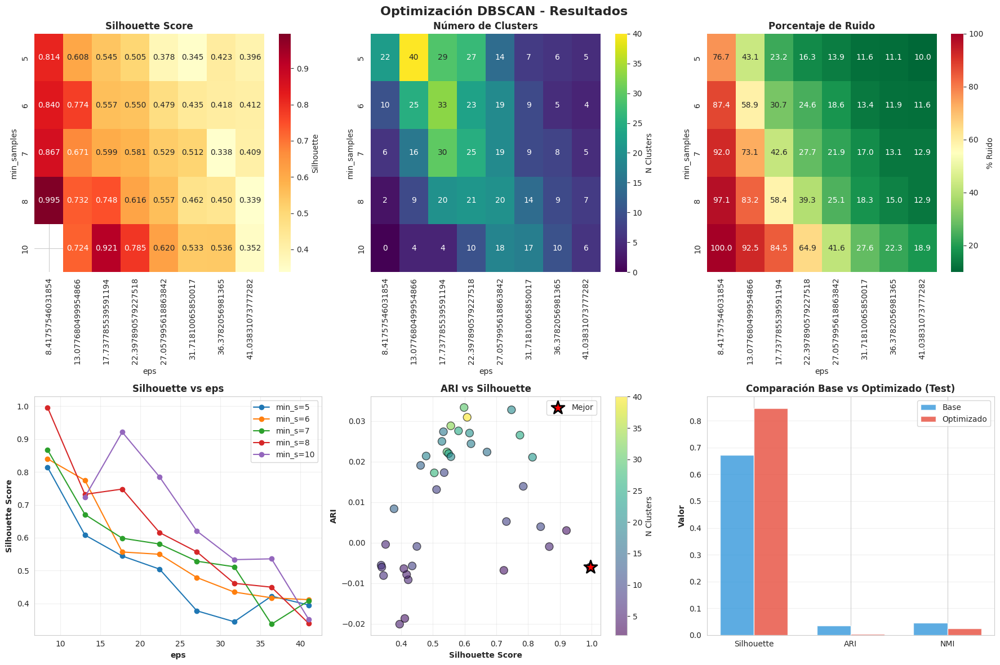


✓ Visualización guardada: 'dbscan_optimizacion.png'
✓ Resultados guardados: 'dbscan_optimizacion_resultados.csv'

                    ✓ OPTIMIZACIÓN COMPLETADA


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import NearestNeighbors
import time
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*15 + "OPTIMIZACIÓN DE HIPERPARÁMETROS - DBSCAN")
print("="*90)

# ============================================================================
#          VERIFICACIÓN DE DATOS
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
else:
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)
    y_test_encoded = le.transform(y_test)

    print("\n✓ Datos cargados:")
    print(f"   • Entrenamiento: {len(X_train):,} muestras")
    print(f"   • Validación:    {len(X_val):,} muestras")
    print(f"   • Prueba:        {len(X_test):,} muestras")

    # ============================================================================
    #          DEFINIR ESPACIO DE BÚSQUEDA
    # ============================================================================

    print("\n" + "="*90)
    print(" ESPACIO DE BÚSQUEDA")
    print("="*90)

    # Estimar rango de eps usando k-distance
    print("\n Estimando rango óptimo de eps...")
    min_samples_default = X_train.shape[1] + 1

    # Muestra para calcular distancias
    sample_size = min(3000, len(X_train))
    indices = np.random.RandomState(42).choice(len(X_train), sample_size, replace=False)
    X_sample = X_train.iloc[indices] if isinstance(X_train, pd.DataFrame) else X_train[indices]

    nbrs = NearestNeighbors(n_neighbors=min_samples_default, metric='euclidean')
    nbrs.fit(X_sample)
    distances, _ = nbrs.kneighbors(X_sample)
    k_distances = np.sort(distances[:, -1])

    # Definir rango de eps basado en percentiles
    eps_min = np.percentile(k_distances, 75)
    eps_max = np.percentile(k_distances, 98)
    eps_range = np.linspace(eps_min, eps_max, 8)

    # Rango de min_samples
    min_samples_range = [X_train.shape[1], X_train.shape[1] + 1, X_train.shape[1] + 2,
                         X_train.shape[1] + 3, X_train.shape[1] + 5]

    print(f"\n Configuración de búsqueda:")
    print(f"   • eps:         {len(eps_range)} valores entre {eps_min:.4f} y {eps_max:.4f}")
    print(f"   • min_samples: {min_samples_range}")
    print(f"   • Total de combinaciones: {len(eps_range) * len(min_samples_range)}")

    # ============================================================================
    #          BÚSQUEDA DE HIPERPARÁMETROS
    # ============================================================================

    print("\n" + "="*90)
    print(" BÚSQUEDA DE HIPERPARÁMETROS (Grid Search)")
    print("="*90)

    print("\n Evaluando combinaciones en conjunto de validación...\n")

    results = []
    total = len(eps_range) * len(min_samples_range)
    counter = 0
    start_time = time.time()

    for eps in eps_range:
        for min_samp in min_samples_range:
            counter += 1

            try:
                # Entrenar en validación
                dbscan = DBSCAN(eps=eps, min_samples=min_samp, metric='euclidean')
                clusters = dbscan.fit_predict(X_val)

                # Calcular métricas
                n_clusters = len(np.unique(clusters[clusters != -1]))
                n_noise = np.sum(clusters == -1)
                noise_pct = n_noise / len(clusters) * 100

                silhouette = None
                ari = None
                nmi = None

                if n_clusters >= 2:
                    mask_no_noise = clusters != -1
                    if mask_no_noise.sum() >= 2:
                        try:
                            silhouette = silhouette_score(X_val[mask_no_noise], clusters[mask_no_noise])
                        except:
                            pass

                    try:
                        ari = adjusted_rand_score(y_val_encoded, clusters)
                        nmi = normalized_mutual_info_score(y_val_encoded, clusters)
                    except:
                        pass

                results.append({
                    'eps': eps,
                    'min_samples': min_samp,
                    'n_clusters': n_clusters,
                    'noise_pct': noise_pct,
                    'silhouette': silhouette,
                    'ari': ari,
                    'nmi': nmi
                })

                status = f"✓ eps={eps:.4f}, min_s={min_samp}: {n_clusters} clusters, {noise_pct:.1f}% ruido"
                if silhouette:
                    status += f", Sil={silhouette:.3f}"
                print(f"   [{counter}/{total}] {status}")

            except Exception as e:
                print(f"   [{counter}/{total}] ✗ Error con eps={eps:.4f}, min_s={min_samp}")

    elapsed = time.time() - start_time
    print(f"\n Búsqueda completada en {elapsed:.2f}s")

    # Crear DataFrame y ordenar por silhouette
    df_results = pd.DataFrame(results)
    df_results_valid = df_results[df_results['silhouette'].notna()].copy()

    if len(df_results_valid) > 0:
        df_results_valid = df_results_valid.sort_values('silhouette', ascending=False)

        # ============================================================================
        #          MEJOR CONFIGURACIÓN
        # ============================================================================

        print("\n" + "="*90)
        print(" MEJORES CONFIGURACIONES")
        print("="*90)

        print("\n Top 5 configuraciones por Silhouette Score:\n")
        print(df_results_valid.head(5).to_string(index=False))

        best = df_results_valid.iloc[0]

        print("\n" + "="*90)
        print(" MEJOR MODELO ENCONTRADO")
        print("="*90)

        print(f"\n Mejores hiperparámetros:")
        print(f"   • eps:         {best['eps']:.4f}")
        print(f"   • min_samples: {int(best['min_samples'])}")

        print(f"\n Métricas en Validación:")
        print(f"   • Clusters:    {int(best['n_clusters'])}")
        print(f"   • Ruido:       {best['noise_pct']:.2f}%")
        print(f"   • Silhouette:  {best['silhouette']:.4f}")
        print(f"   • ARI:         {best['ari']:.4f}")
        print(f"   • NMI:         {best['nmi']:.4f}")

        # ============================================================================
        #          EVALUACIÓN EN PRUEBA
        # ============================================================================

        print("\n" + "="*90)
        print(" EVALUACIÓN EN CONJUNTO DE PRUEBA")
        print("="*90)

        print("\n Evaluando modelo optimizado en test...")

        # Modelo optimizado
        dbscan_opt = DBSCAN(eps=best['eps'], min_samples=int(best['min_samples']), metric='euclidean')
        clusters_opt_test = dbscan_opt.fit_predict(X_test)

        n_clusters_opt = len(np.unique(clusters_opt_test[clusters_opt_test != -1]))
        n_noise_opt = np.sum(clusters_opt_test == -1)
        noise_pct_opt = n_noise_opt / len(clusters_opt_test) * 100

        mask_opt = clusters_opt_test != -1
        sil_opt = silhouette_score(X_test[mask_opt], clusters_opt_test[mask_opt]) if mask_opt.sum() >= 2 else None
        ari_opt = adjusted_rand_score(y_test_encoded, clusters_opt_test)
        nmi_opt = normalized_mutual_info_score(y_test_encoded, clusters_opt_test)

        # Modelo base (si existe)
        if 'eps_base' in globals():
            print(" Comparando con modelo base...")
            dbscan_base = DBSCAN(eps=eps_base, min_samples=min_samples_base, metric='euclidean')
            clusters_base_test = dbscan_base.fit_predict(X_test)

            n_clusters_base = len(np.unique(clusters_base_test[clusters_base_test != -1]))
            n_noise_base = np.sum(clusters_base_test == -1)
            noise_pct_base = n_noise_base / len(clusters_base_test) * 100

            mask_base = clusters_base_test != -1
            sil_base = silhouette_score(X_test[mask_base], clusters_base_test[mask_base]) if mask_base.sum() >= 2 else None
            ari_base = adjusted_rand_score(y_test_encoded, clusters_base_test)
            nmi_base = normalized_mutual_info_score(y_test_encoded, clusters_base_test)

            # Comparación
            print("\n COMPARACIÓN EN TEST:\n")
            comparison = pd.DataFrame({
                'Métrica': ['eps', 'min_samples', 'Clusters', 'Ruido (%)', 'Silhouette', 'ARI', 'NMI'],
                'Base': [eps_base, min_samples_base, n_clusters_base, noise_pct_base,
                        sil_base if sil_base else 0, ari_base, nmi_base],
                'Optimizado': [best['eps'], int(best['min_samples']), n_clusters_opt, noise_pct_opt,
                              sil_opt if sil_opt else 0, ari_opt, nmi_opt]
            })
            print(comparison.to_string(index=False))

            # Mejora
            if sil_opt and sil_base:
                mejora = ((sil_opt - sil_base) / abs(sil_base)) * 100
                print(f"\n Mejora en Silhouette: {mejora:+.2f}%")
                if mejora > 5:
                    print("    MEJORA SIGNIFICATIVA - Usar modelo optimizado")
                elif mejora > 0:
                    print("   ✓ Mejora moderada - Usar modelo optimizado")
                else:
                    print("   → Sin mejora - Modelo base era adecuado")
        else:
            print("\n RESULTADOS EN TEST:")
            print(f"   • Clusters:    {n_clusters_opt}")
            print(f"   • Ruido:       {noise_pct_opt:.2f}%")
            print(f"   • Silhouette:  {sil_opt:.4f if sil_opt else 'N/A'}")
            print(f"   • ARI:         {ari_opt:.4f}")
            print(f"   • NMI:         {nmi_opt:.4f}")

        # ============================================================================
        #          VISUALIZACIONES
        # ============================================================================

        print("\n" + "="*90)
        print(" GENERANDO VISUALIZACIONES")
        print("="*90)

        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle('Optimización DBSCAN - Resultados', fontsize=16, fontweight='bold')

        # 1. Heatmap Silhouette
        pivot_sil = df_results.pivot_table(values='silhouette', index='min_samples', columns='eps')
        sns.heatmap(pivot_sil, annot=True, fmt='.3f', cmap='YlOrRd', ax=axes[0,0], cbar_kws={'label': 'Silhouette'})
        axes[0,0].set_title('Silhouette Score', fontweight='bold')
        axes[0,0].set_xlabel('eps')
        axes[0,0].set_ylabel('min_samples')

        # 2. Heatmap Clusters
        pivot_clust = df_results.pivot_table(values='n_clusters', index='min_samples', columns='eps')
        sns.heatmap(pivot_clust, annot=True, fmt='.0f', cmap='viridis', ax=axes[0,1], cbar_kws={'label': 'N Clusters'})
        axes[0,1].set_title('Número de Clusters', fontweight='bold')
        axes[0,1].set_xlabel('eps')
        axes[0,1].set_ylabel('min_samples')

        # 3. Heatmap Ruido
        pivot_noise = df_results.pivot_table(values='noise_pct', index='min_samples', columns='eps')
        sns.heatmap(pivot_noise, annot=True, fmt='.1f', cmap='RdYlGn_r', ax=axes[0,2], cbar_kws={'label': '% Ruido'})
        axes[0,2].set_title('Porcentaje de Ruido', fontweight='bold')
        axes[0,2].set_xlabel('eps')
        axes[0,2].set_ylabel('min_samples')

        # 4. Silhouette vs eps
        for min_s in min_samples_range:
            subset = df_results[df_results['min_samples'] == min_s]
            axes[1,0].plot(subset['eps'], subset['silhouette'], marker='o', label=f'min_s={min_s}')
        axes[1,0].set_xlabel('eps', fontweight='bold')
        axes[1,0].set_ylabel('Silhouette Score', fontweight='bold')
        axes[1,0].set_title('Silhouette vs eps', fontweight='bold')
        axes[1,0].legend()
        axes[1,0].grid(True, alpha=0.3)

        # 5. ARI vs Silhouette
        valid_data = df_results[(df_results['silhouette'].notna()) & (df_results['ari'].notna())]
        scatter = axes[1,1].scatter(valid_data['silhouette'], valid_data['ari'],
                                   c=valid_data['n_clusters'], cmap='viridis', s=100, alpha=0.6, edgecolors='black')
        axes[1,1].scatter(best['silhouette'], best['ari'], color='red', s=300, marker='*',
                         edgecolors='black', linewidth=2, label='Mejor', zorder=5)
        axes[1,1].set_xlabel('Silhouette Score', fontweight='bold')
        axes[1,1].set_ylabel('ARI', fontweight='bold')
        axes[1,1].set_title('ARI vs Silhouette', fontweight='bold')
        axes[1,1].legend()
        axes[1,1].grid(True, alpha=0.3)
        plt.colorbar(scatter, ax=axes[1,1], label='N Clusters')

        # 6. Comparación Base vs Optimizado
        if 'eps_base' in globals() and sil_base:
            metrics = ['Silhouette', 'ARI', 'NMI']
            base_vals = [sil_base, ari_base, nmi_base]
            opt_vals = [sil_opt if sil_opt else 0, ari_opt, nmi_opt]

            x = np.arange(len(metrics))
            width = 0.35
            axes[1,2].bar(x - width/2, base_vals, width, label='Base', alpha=0.8, color='#3498db')
            axes[1,2].bar(x + width/2, opt_vals, width, label='Optimizado', alpha=0.8, color='#e74c3c')
            axes[1,2].set_ylabel('Valor', fontweight='bold')
            axes[1,2].set_title('Comparación Base vs Optimizado (Test)', fontweight='bold')
            axes[1,2].set_xticks(x)
            axes[1,2].set_xticklabels(metrics)
            axes[1,2].legend()
            axes[1,2].grid(True, alpha=0.3, axis='y')
        else:
            axes[1,2].text(0.5, 0.5, f'MODELO OPTIMIZADO\n\neps: {best["eps"]:.4f}\nmin_samples: {int(best["min_samples"])}\n\nSilhouette: {sil_opt:.4f if sil_opt else "N/A"}\nARI: {ari_opt:.4f}\nNMI: {nmi_opt:.4f}',
                          ha='center', va='center', fontsize=12, transform=axes[1,2].transAxes,
                          bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.3))
            axes[1,2].axis('off')

        plt.tight_layout()
        plt.savefig('dbscan_optimizacion.png', dpi=300, bbox_inches='tight')
        plt.show()

        print("\n✓ Visualización guardada: 'dbscan_optimizacion.png'")

        # Guardar resultados
        df_results.to_csv('dbscan_optimizacion_resultados.csv', index=False)
        print("✓ Resultados guardados: 'dbscan_optimizacion_resultados.csv'")

        print("\n" + "="*90)
        print(" "*20 + "✓ OPTIMIZACIÓN COMPLETADA")
        print("="*90)

    else:
        print("\n No se encontraron configuraciones válidas con 2+ clusters")
        print("   Intenta ajustar el rango de eps o min_samples")

## Curvas de Aprendizaje

                         CURVAS DE APRENDIZAJE - DBSCAN

✓ Usando modelo OPTIMIZADO:
   • eps:         8.4176
   • min_samples: 8

 CONFIGURACIÓN DE CURVAS

📊 Evaluando 6 tamaños de muestra
   Desde 286 hasta 2,860 muestras

 CALCULANDO CURVAS

⏳ Procesando...

   [1/6] 286 muestras... ✓ 0.03s, 0 clusters
   [2/6] 572 muestras... ✓ 0.01s, 1 clusters
   [3/6] 1,144 muestras... ✓ 0.04s, 23 clusters
   [4/6] 1,716 muestras... ✓ 0.04s, 52 clusters
   [5/6] 2,288 muestras... ✓ 0.05s, 79 clusters
   [6/6] 2,860 muestras... ✓ 0.05s, 66 clusters

 ANÁLISIS

📊 ESCALABILIDAD:
   • Tiempo creció 1.9x para 10.0x más datos
   ✅ Escalabilidad eficiente

📊 ESTABILIDAD:
   • Clusters: 0-79 (std: 33.74)
   ⚠️  Variabilidad alta

📊 CALIDAD:
   • Silhouette (val): 0.9955 - 0.9955
   ✅ Buena calidad de clustering

📊 RUIDO:
   • Inicial: 100.0%
   • Final:   22.5%

 GENERANDO VISUALIZACIÓN


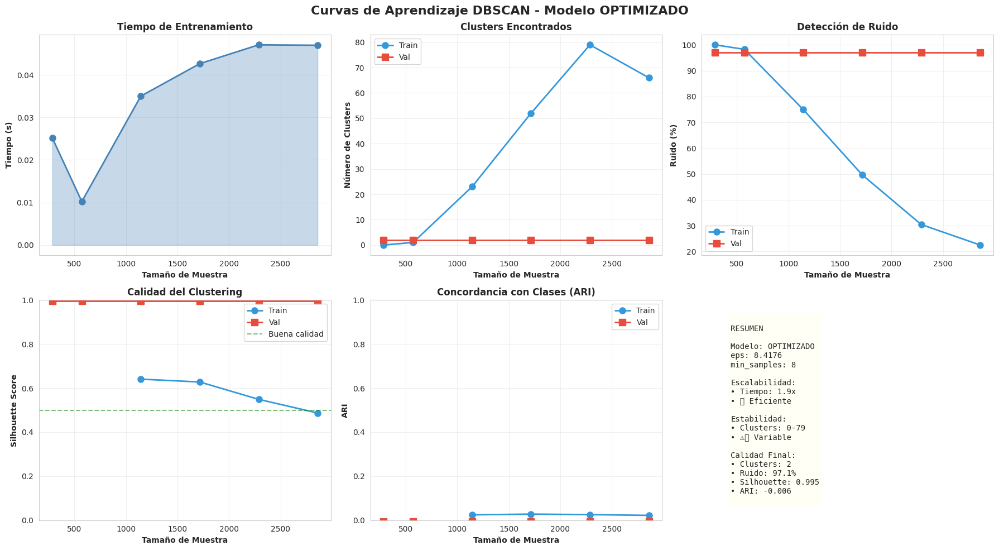


✓ Visualización guardada: 'dbscan_curvas_aprendizaje_simple.png'
✓ Datos guardados: 'dbscan_curvas_aprendizaje.csv'

                         ✓ ANÁLISIS COMPLETADO


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.preprocessing import LabelEncoder
import time
import warnings
warnings.filterwarnings('ignore')

print("="*90)
print(" "*25 + "CURVAS DE APRENDIZAJE - DBSCAN")
print("="*90)

# ============================================================================
#          VERIFICACIÓN
# ============================================================================

if 'X_train' not in globals() or 'y_train' not in globals():
    print("\n ERROR: Datos no encontrados")
elif 'best' not in globals() or 'eps_base' not in globals():
    print("\n ERROR: Ejecuta primero el modelo base o la optimización de DBSCAN")
else:
    le = LabelEncoder()
    y_train_encoded = le.fit_transform(y_train)
    y_val_encoded = le.transform(y_val)

    # Usar parámetros optimizados si existen, sino usar base
    if 'best' in globals():
        eps_use = best['eps']
        min_samples_use = int(best['min_samples'])
        model_type = "OPTIMIZADO"
    else:
        eps_use = eps_base
        min_samples_use = min_samples_base
        model_type = "BASE"

    print(f"\n✓ Usando modelo {model_type}:")
    print(f"   • eps:         {eps_use:.4f}")
    print(f"   • min_samples: {min_samples_use}")

    # ============================================================================
    #          CONFIGURACIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" CONFIGURACIÓN DE CURVAS")
    print("="*90)

    # Tamaños de muestra
    max_samples = len(X_train)
    if max_samples > 10000:
        train_sizes = np.array([0.1, 0.3, 0.5, 0.7, 0.9, 1.0])
    else:
        train_sizes = np.array([0.1, 0.2, 0.4, 0.6, 0.8, 1.0])

    train_sizes_abs = (train_sizes * max_samples).astype(int)
    train_sizes_abs = np.maximum(train_sizes_abs, 100)
    train_sizes_abs = np.unique(train_sizes_abs)

    print(f"\n Evaluando {len(train_sizes_abs)} tamaños de muestra")
    print(f"   Desde {train_sizes_abs[0]:,} hasta {train_sizes_abs[-1]:,} muestras")

    # ============================================================================
    #          CÁLCULO
    # ============================================================================

    print("\n" + "="*90)
    print(" CALCULANDO CURVAS")
    print("="*90)

    print("\n Procesando...\n")

    results = []

    for idx, n_samples in enumerate(train_sizes_abs, 1):
        print(f"   [{idx}/{len(train_sizes_abs)}] {n_samples:,} muestras...", end=' ')

        # Muestra
        np.random.seed(42 + idx)
        indices = np.random.choice(len(X_train), n_samples, replace=False)
        X_sample = X_train.iloc[indices] if isinstance(X_train, pd.DataFrame) else X_train[indices]
        y_sample = y_train_encoded[indices]

        # Entrenar
        start = time.time()
        dbscan = DBSCAN(eps=eps_use, min_samples=min_samples_use, metric='euclidean')
        clusters_train = dbscan.fit_predict(X_sample)
        train_time = time.time() - start

        # Validación
        clusters_val = dbscan.fit_predict(X_val)

        # Métricas train
        n_clust_train = len(np.unique(clusters_train[clusters_train != -1]))
        noise_train = np.sum(clusters_train == -1) / len(clusters_train) * 100

        mask_train = clusters_train != -1
        sil_train = silhouette_score(X_sample[mask_train], clusters_train[mask_train]) if mask_train.sum() >= 2 and n_clust_train >= 2 else None
        ari_train = adjusted_rand_score(y_sample, clusters_train) if n_clust_train >= 2 else None

        # Métricas val
        n_clust_val = len(np.unique(clusters_val[clusters_val != -1]))
        noise_val = np.sum(clusters_val == -1) / len(clusters_val) * 100

        mask_val = clusters_val != -1
        sil_val = silhouette_score(X_val[mask_val], clusters_val[mask_val]) if mask_val.sum() >= 2 and n_clust_val >= 2 else None
        ari_val = adjusted_rand_score(y_val_encoded, clusters_val) if n_clust_val >= 2 else None

        results.append({
            'size': n_samples,
            'time': train_time,
            'clust_train': n_clust_train,
            'noise_train': noise_train,
            'sil_train': sil_train,
            'ari_train': ari_train,
            'clust_val': n_clust_val,
            'noise_val': noise_val,
            'sil_val': sil_val,
            'ari_val': ari_val
        })

        print(f"✓ {train_time:.2f}s, {n_clust_train} clusters")

    df = pd.DataFrame(results)

    # ============================================================================
    #          ANÁLISIS
    # ============================================================================

    print("\n" + "="*90)
    print(" ANÁLISIS")
    print("="*90)

    print("\n ESCALABILIDAD:")
    time_ratio = df['time'].iloc[-1] / df['time'].iloc[0]
    size_ratio = df['size'].iloc[-1] / df['size'].iloc[0]
    print(f"   • Tiempo creció {time_ratio:.1f}x para {size_ratio:.1f}x más datos")
    if time_ratio < size_ratio * 1.5:
        print("   ✅ Escalabilidad eficiente")
    else:
        print("   ⚠️  Crecimiento significativo del tiempo")

    print("\n ESTABILIDAD:")
    std_clust = df['clust_train'].std()
    print(f"   • Clusters: {df['clust_train'].min()}-{df['clust_train'].max()} (std: {std_clust:.2f})")
    if std_clust < 2:
        print("   ✅ Muy estable")
    else:
        print("   ⚠️  Variabilidad alta")

    print("\n CALIDAD:")
    sil_valid = [x for x in df['sil_val'] if x is not None]
    if sil_valid:
        print(f"   • Silhouette (val): {min(sil_valid):.4f} - {max(sil_valid):.4f}")
        if max(sil_valid) > 0.5:
            print("   ✅ Buena calidad de clustering")

    print("\n RUIDO:")
    print(f"   • Inicial: {df['noise_train'].iloc[0]:.1f}%")
    print(f"   • Final:   {df['noise_train'].iloc[-1]:.1f}%")

    # ============================================================================
    #          VISUALIZACIÓN
    # ============================================================================

    print("\n" + "="*90)
    print(" GENERANDO VISUALIZACIÓN")
    print("="*90)

    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(f'Curvas de Aprendizaje DBSCAN - Modelo {model_type}',
                 fontsize=16, fontweight='bold')

    # 1. Tiempo
    axes[0,0].plot(df['size'], df['time'], 'o-', linewidth=2, markersize=8, color='steelblue')
    axes[0,0].fill_between(df['size'], df['time'], alpha=0.3, color='steelblue')
    axes[0,0].set_xlabel('Tamaño de Muestra', fontweight='bold')
    axes[0,0].set_ylabel('Tiempo (s)', fontweight='bold')
    axes[0,0].set_title('Tiempo de Entrenamiento', fontweight='bold')
    axes[0,0].grid(True, alpha=0.3)

    # 2. Clusters
    axes[0,1].plot(df['size'], df['clust_train'], 'o-', linewidth=2, markersize=8,
                   label='Train', color='#3498db')
    axes[0,1].plot(df['size'], df['clust_val'], 's-', linewidth=2, markersize=8,
                   label='Val', color='#e74c3c')
    axes[0,1].set_xlabel('Tamaño de Muestra', fontweight='bold')
    axes[0,1].set_ylabel('Número de Clusters', fontweight='bold')
    axes[0,1].set_title('Clusters Encontrados', fontweight='bold')
    axes[0,1].legend()
    axes[0,1].grid(True, alpha=0.3)

    # 3. Ruido
    axes[0,2].plot(df['size'], df['noise_train'], 'o-', linewidth=2, markersize=8,
                   label='Train', color='#3498db')
    axes[0,2].plot(df['size'], df['noise_val'], 's-', linewidth=2, markersize=8,
                   label='Val', color='#e74c3c')
    axes[0,2].set_xlabel('Tamaño de Muestra', fontweight='bold')
    axes[0,2].set_ylabel('Ruido (%)', fontweight='bold')
    axes[0,2].set_title('Detección de Ruido', fontweight='bold')
    axes[0,2].legend()
    axes[0,2].grid(True, alpha=0.3)

    # 4. Silhouette
    sizes_sil_train = [s for s, v in zip(df['size'], df['sil_train']) if v is not None]
    sil_train = [v for v in df['sil_train'] if v is not None]
    sizes_sil_val = [s for s, v in zip(df['size'], df['sil_val']) if v is not None]
    sil_val = [v for v in df['sil_val'] if v is not None]

    if sil_train:
        axes[1,0].plot(sizes_sil_train, sil_train, 'o-', linewidth=2, markersize=8,
                      label='Train', color='#3498db')
    if sil_val:
        axes[1,0].plot(sizes_sil_val, sil_val, 's-', linewidth=2, markersize=8,
                      label='Val', color='#e74c3c')
    axes[1,0].axhline(y=0.5, color='green', linestyle='--', alpha=0.5, label='Buena calidad')
    axes[1,0].set_xlabel('Tamaño de Muestra', fontweight='bold')
    axes[1,0].set_ylabel('Silhouette Score', fontweight='bold')
    axes[1,0].set_title('Calidad del Clustering', fontweight='bold')
    axes[1,0].legend()
    axes[1,0].grid(True, alpha=0.3)
    axes[1,0].set_ylim([0, 1])

    # 5. ARI
    sizes_ari_train = [s for s, v in zip(df['size'], df['ari_train']) if v is not None]
    ari_train = [v for v in df['ari_train'] if v is not None]
    sizes_ari_val = [s for s, v in zip(df['size'], df['ari_val']) if v is not None]
    ari_val = [v for v in df['ari_val'] if v is not None]

    if ari_train:
        axes[1,1].plot(sizes_ari_train, ari_train, 'o-', linewidth=2, markersize=8,
                      label='Train', color='#3498db')
    if ari_val:
        axes[1,1].plot(sizes_ari_val, ari_val, 's-', linewidth=2, markersize=8,
                      label='Val', color='#e74c3c')
    axes[1,1].set_xlabel('Tamaño de Muestra', fontweight='bold')
    axes[1,1].set_ylabel('ARI', fontweight='bold')
    axes[1,1].set_title('Concordancia con Clases (ARI)', fontweight='bold')
    axes[1,1].legend()
    axes[1,1].grid(True, alpha=0.3)
    axes[1,1].set_ylim([0, 1])

    # 6. Resumen
    axes[1,2].axis('off')

    # Formatear métricas de forma segura
    sil_str = f"{sil_val[-1]:.3f}" if sil_val else 'N/A'
    ari_str = f"{ari_val[-1]:.3f}" if ari_val else 'N/A'

    summary = f"""
RESUMEN

Modelo: {model_type}
eps: {eps_use:.4f}
min_samples: {min_samples_use}

Escalabilidad:
• Tiempo: {time_ratio:.1f}x
{'•  Eficiente' if time_ratio < size_ratio * 1.5 else '•  Lento'}

Estabilidad:
• Clusters: {df['clust_train'].min()}-{df['clust_train'].max()}
{'•  Estable' if std_clust < 2 else '•  Variable'}

Calidad Final:
• Clusters: {df['clust_val'].iloc[-1]}
• Ruido: {df['noise_val'].iloc[-1]:.1f}%
• Silhouette: {sil_str}
• ARI: {ari_str}
    """

    axes[1,2].text(0.1, 0.5, summary, fontsize=10, family='monospace',
                  verticalalignment='center', bbox=dict(boxstyle='round',
                  facecolor='lightyellow', alpha=0.3))

    plt.tight_layout()
    plt.savefig('dbscan_curvas_aprendizaje_simple.png', dpi=300, bbox_inches='tight')
    plt.show()

    print("\n✓ Visualización guardada: 'dbscan_curvas_aprendizaje_simple.png'")

    # Guardar datos
    df.to_csv('dbscan_curvas_aprendizaje.csv', index=False)
    print("✓ Datos guardados: 'dbscan_curvas_aprendizaje.csv'")

    print("\n" + "="*90)
    print(" "*25 + "✓ ANÁLISIS COMPLETADO")
    print("="*90)